# Exploration 

## Installer librairies nécessaires et importer fichiers

## Installer

In [ ]:
pip install --upgrade cloudpickle

  Found existing installation: cloudpickle 1.3.0
    Uninstalling cloudpickle-1.3.0:
      Successfully uninstalled cloudpickle-1.3.0


In [ ]:
pip install featuretools

     |████████████████████████████████| 296kB 4.5MB/s 
     |████████████████████████████████| 675kB 7.7MB/s 
     |████████████████████████████████| 112kB 11.8MB/s 
ERROR: distributed 2021.3.0 has requirement dask>=2021.03.0, but you'll have dask 2.12.0 which is incompatible.
  Found existing installation: distributed 1.25.3
    Uninstalling distributed-1.25.3:
      Successfully uninstalled distributed-1.25.3


In [ ]:
pip install pingouin

     |████████████████████████████████| 204kB 5.4MB/s 
  Created wheel for pingouin: filename=pingouin-0.3.10-cp37-none-any.whl size=203396 sha256=5b9d7d87377ee06c0456b35d32c8c55ed4cc6e1a529ad21f65406b1bf04e9e31
  Stored in directory: /root/.cache/pip/wheels/e6/f4/06/b5046209e6c0d96b4dea243c45e926b5c0dd88e23b01c45f92
  Created wheel for outdated: filename=outdated-0.2.0-cp37-none-any.whl size=4962 sha256=4242dd6edc92ac97154b521070146351c9013dab51e08553233eaa03ca82a6e5
  Stored in directory: /root/.cache/pip/wheels/fd/7c/ef/814f514d31197310872b5abf353feb8fef9d67ee658e1e7e39
  Created wheel for littleutils: filename=littleutils-0.2.2-cp37-none-any.whl size=7051 sha256=73cc6e9c8e93383b13978990000034154cc78eb6d2bea5a609a48d65beb92f03
  Stored in directory: /root/.cache/pip/wheels/53/16/9f/ac67d15c40243754fd73f620e1b9b6dedc20492ecc19a2bae1
Successfully built pingouin outdated littleutils


In [ ]:
pip install xgboost

In [ ]:
pip install hyperopt

In [ ]:
pip install shap

     |████████████████████████████████| 358kB 5.7MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491618 sha256=2b6e8082d645c76db391f3e13c6c91c383ad9ea94fb0c5677a90357482d19199
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


In [ ]:
#pip install --upgrade dash #=2020.12.0

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns  
import xgboost as xgb

import pickle
import io
import timeit

from google.colab import drive,files

from scipy import stats

from sklearn.preprocessing import scale 
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.feature_selection import SelectFromModel
from sklearn import model_selection 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import f1_score, matthews_corrcoef

import featuretools as ft
import pingouin as pg
import shap

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 22
import seaborn as sns

# Suppress warnings from pandas
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# # If working in google colab : Option 1
# Import files
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# If working in google colab : Option 1
# Read files
df_app_test = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/application_test.csv').sort_values('SK_ID_CURR').reset_index(drop = True)
df_app_train = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/application_train.csv').sort_values('SK_ID_CURR').reset_index(drop = True)
df_bureau = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/bureau.csv').sort_values(['SK_ID_CURR', 'SK_ID_BUREAU']).reset_index(drop = True)
df_bureau_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/bureau_balance.csv').sort_values('SK_ID_BUREAU').reset_index(drop = True)
df_credit_card_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/credit_card_balance.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True)
df_POS_CASH_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/POS_CASH_balance.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True)
df_installments_payments = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/installments_payments.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True)
df_previous_application = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/previous_application.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True)
df_HomeCredit_columns_description = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/HomeCredit_columns_description.csv', encoding = 'unicode_escape')
df_sample_submission = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/sample_submission.csv')

## Options

In [ ]:
# If working in Jupyter
# Read files
df_app_test = pd.read_csv('application_test.csv')
df_app_train = pd.read_csv('application_train.csv')
df_bureau_balance = pd.read_csv('bureau_balance.csv')
df_bureau = pd.read_csv('bureau.csv')
df_credit_card_balance = pd.read_csv('credit_card_balance.csv')
df_HomeCredit_columns_description = pd.read_csv('HomeCredit_columns_description.csv')
df_installments_payments = pd.read_csv('installments_payments.csv')
df_POS_CASH_balance = pd.read_csv('POS_CASH_balance.csv')
df_previous_application = pd.read_csv('previous_application.csv')
df_sample_submission = pd.read_csv('sample_submission.csv')

In [ ]:
# If working in google colab : Option 2
# Import files
uploaded = files.upload()

In [ ]:
# If working in google colab : Option 2
# Read files
df_app_test = pd.read_csv(io.BytesIO(uploaded['application_test.csv']))
df_app_train = pd.read_csv(io.BytesIO(uploaded['application_train.csv']))
df_bureau_balance = pd.read_csv(io.BytesIO(uploaded['bureau_balance.csv']))
df_bureau = pd.read_csv(io.BytesIO(uploaded['bureau.csv']))
df_credit_card_balance = pd.read_csv(io.BytesIO(uploaded['credit_card_balance.csv']))
df_HomeCredit_columns_description = pd.read_csv(io.BytesIO(uploaded['HomeCredit_columns_description.csv']))
df_installments_payments = pd.read_csv(io.BytesIO(uploaded['installments_payments.csv']))
df_POS_CASH_balance = pd.read_csv(io.BytesIO(uploaded['POS_CASH_balance.csv']))
df_previous_application = pd.read_csv(io.BytesIO(uploaded['previous_application.csv']))
df_sample_submission = pd.read_csv(io.BytesIO(uploaded['sample_submission.csv']))

In [ ]:
# If working in google colab : Option 1
# Read files
#df_app_test = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/application_test.csv')
#df_app_train = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/application_train.csv')
#df_bureau = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/bureau.csv')
#df_bureau_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/bureau_balance.csv')
#df_credit_card_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/credit_card_balance.csv')
#df_POS_CASH_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/POS_CASH_balance.csv')
#df_installments_payments = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/installments_payments.csv')
#df_previous_application = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/previous_application.csv')
#df_HomeCredit_columns_description = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/HomeCredit_columns_description.csv', encoding = 'unicode_escape')
#df_sample_submission = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/sample_submission.csv')

In [ ]:
# If working in google colab : Option 1
# Read files
#df_app_test = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/application_test.csv').sort_values('SK_ID_CURR').reset_index(drop = True).loc[:1000, :]
#df_app_train = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/application_train.csv').sort_values('SK_ID_CURR').reset_index(drop = True).loc[:1000, :]
#df_bureau = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/bureau.csv').sort_values(['SK_ID_CURR', 'SK_ID_BUREAU']).reset_index(drop = True).loc[:1000, :]
#df_bureau_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/bureau_balance.csv').sort_values('SK_ID_BUREAU').reset_index(drop = True).loc[:1000, :]
#df_credit_card_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/credit_card_balance.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True).loc[:1000, :]
#df_POS_CASH_balance = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/POS_CASH_balance.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True).loc[:1000, :]
#df_installments_payments = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/installments_payments.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True).loc[:1000, :]
#df_previous_application = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/previous_application.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index(drop = True).loc[:1000, :]
#df_HomeCredit_columns_description = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/HomeCredit_columns_description.csv', encoding = 'unicode_escape').loc[:1000, :]
#df_sample_submission = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 7/sample_submission.csv')

In [ ]:
from featuretools.variable_types import list_variable_types
list_variable_types()

## Informations générales sur les fichiers

### Fonctions utilisées

In [ ]:
# Display the complete width of columns
pd.set_option('display.max_colwidth', None)

In [ ]:
"""Print the names of the columns"""


def print_columns(df):
    #print(df.name)
    for col in df.columns:
        print(col)
    print('__________________')

In [ ]:
"""Print the shape of the dataframe"""


def get_shape(df):
    print(df.shape)

In [ ]:
"""Print the types of the columns of the dataframe"""


def get_dtypes(df):
    print(df.dtypes)
    print('__________________')

In [ ]:
"""Convert numerical data that are in 64 bits into numerical data in 32 bits"""


def convert_numerical_data(df):
    for col in df.select_dtypes(include=['float64']):
        df[col] = df[col].astype(np.float32)
    for col in df.select_dtypes(include=['int64']):
        df[col] = df[col].astype(np.int32)

In [ ]:
"""Center and scale the data"""


def center_and_scale(df):
    for col in df.select_dtypes(include=['float32']):
        # Print the mean and standard deviation of the unscaled features
        #print("Mean of Unscaled Features: {}".format(np.mean(df[col]))) 
        #print("Standard Deviation of Unscaled Features: {}".format(np.std(df[col])))
        df[col] = scale(df[col])
        # Print the mean and standard deviation of the scaled features
        #print("Mean of Scaled Features: {}".format(np.mean(df[col]))) 
        #print("Standard Deviation of Scaled Features: {}".format(np.std(df[col])))

In [ ]:
"""Transform the data to make them closer to a normal distribution"""


def box_cox_transfo(df):
    for col in df.select_dtypes(include=['float32']):
        df[col] = df[col].apply(lambda x : abs(x))
        #if (df[col] == 0).all() == True:
        df[col] = df[col].apply(lambda x : x+1)
        df[col], lmda = boxcox(df[col])
        # Print the mean and standard deviation of the scaled features
        print('Le paramètre lambda pour ', col, ' est : {}'.format(lmda)) 

### Observations

In [ ]:
df_app_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,...,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-13976,-1866,-2000.0,-4208,NaN,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,...,0.2446,0.3739,0.0388,0.0817,reg oper account,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010032,-13040,-2191,-4000.0,-4262,16.0,1,1,1,1,0,0,NaN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-821.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,100001,5896630,Closed,currency 1,-857,0,-492.0,-553.0,NaN,0,112500.0,0.0,0.0,0.0,Consumer credit,-155,0.0
1,100001,5896631,Closed,currency 1,-909,0,-179.0,-877.0,NaN,0,279720.0,0.0,0.0,0.0,Consumer credit,-155,0.0
2,100001,5896632,Closed,currency 1,-879,0,-514.0,-544.0,NaN,0,91620.0,0.0,0.0,0.0,Consumer credit,-155,0.0
3,100001,5896633,Closed,currency 1,-1572,0,-1329.0,-1328.0,NaN,0,85500.0,0.0,0.0,0.0,Consumer credit,-155,0.0
4,100001,5896634,Active,currency 1,-559,0,902.0,NaN,NaN,0,337680.0,113166.0,0.0,0.0,Consumer credit,-6,4630.5


In [ ]:
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5001709,-7,C
1,5001709,-3,C
2,5001709,-4,C
3,5001709,-5,C
4,5001709,-6,C


In [ ]:
df_credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1489396,100006,-2,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
1,1489396,100006,-1,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
2,1489396,100006,-5,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
3,1489396,100006,-3,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
4,1489396,100006,-4,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0


In [ ]:
df_POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1369693,100001,-53,4.0,0.0,Completed,0,0
1,1369693,100001,-54,4.0,1.0,Active,0,0
2,1369693,100001,-57,4.0,4.0,Active,0,0
3,1369693,100001,-55,4.0,2.0,Active,0,0
4,1369693,100001,-56,4.0,3.0,Active,0,0


In [ ]:
df_installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1369693,100001,1.0,1,-1709.0,-1715.0,3951.00,3951.00
1,1369693,100001,1.0,2,-1679.0,-1715.0,3951.00,3951.00
2,1369693,100001,2.0,4,-1619.0,-1628.0,17397.90,17397.90
3,1369693,100001,1.0,3,-1649.0,-1660.0,3951.00,3951.00
4,1851984,100001,1.0,2,-2916.0,-2916.0,3982.05,3982.05


In [ ]:
df_previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,1369693,100001,Consumer loans,3951.000,24835.5,23787.0,2520.0,24835.5,FRIDAY,13,Y,1,0.104326,NaN,NaN,XAP,Approved,-1740,Cash through the bank,XAP,Family,Refreshed,Mobile,POS,XNA,Country-wide,23,Connectivity,8.0,high,POS mobile with interest,365243.0,-1709.0,-1499.0,-1619.0,-1612.0,0.0
1,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
2,1810518,100003,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12,Y,1,NaN,NaN,NaN,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
3,2396755,100003,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,SATURDAY,15,Y,1,0.100061,NaN,NaN,XAP,Approved,-2341,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,2636178,100003,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.000000,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0


In [ ]:
df_HomeCredit_columns_description.Special.unique()

array([nan, 'normalized ', 'time only relative to the application',
       'rounded', 'normalized', 'hashed', 'recoded', 'grouped'],
      dtype=object)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'FONDKAPREMONT_MODE']

,Unnamed: 0,Table,Row,Description,Special
86,89,application_{train|test}.csv,FONDKAPREMONT_MODE,"Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor",normalized


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'FONDKAPREMONT_MODE']

,Unnamed: 0,Table,Row,Description,Special
86,89,application_{train|test}.csv,FONDKAPREMONT_MODE,"Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor",normalized


In [ ]:
df_previous_application.NAME_TYPE_SUITE.unique

<bound method Series.unique of 0                 Family
1                    NaN
2          Unaccompanied
3                 Family
4                 Family
               ...      
1670209    Unaccompanied
1670210          Other_B
1670211              NaN
1670212    Unaccompanied
1670213              NaN
Name: NAME_TYPE_SUITE, Length: 1670214, dtype: object>

In [ ]:
# Print column names
print_columns(df_app_test)
print_columns(df_app_train)
print_columns(df_bureau)
print_columns(df_bureau_balance)
print_columns(df_credit_card_balance)
print_columns(df_POS_CASH_balance)
print_columns(df_installments_payments)
print_columns(df_previous_application)

SK_ID_CURR
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
REGION_POPULATION_RELATIVE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_REGISTRATION
DAYS_ID_PUBLISH
OWN_CAR_AGE
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
OCCUPATION_TYPE
CNT_FAM_MEMBERS
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_1
EXT_SOURCE_2
EXT_SOURCE_3
APARTMENTS_AVG
BASEMENTAREA_AVG
YEARS_BEGINEXPLUATATION_AVG
YEARS_BUILD_AVG
COMMONAREA_AVG
ELEVATORS_AVG
ENTRANCES_AVG
FLOORSMAX_AVG
FLOORSMIN_AVG
LANDAREA_AVG
LIVINGAPARTMENTS_AVG
LIVINGAREA_AVG
NONLIVINGAPARTMENTS_AVG
NONLIVINGAREA_AVG
APARTMENTS_M

In [ ]:
# Print shape
get_shape(df_app_test)
get_shape(df_app_train)
get_shape(df_bureau)
get_shape(df_bureau_balance)
get_shape(df_credit_card_balance)
get_shape(df_POS_CASH_balance)
get_shape(df_installments_payments)
get_shape(df_previous_application)

(48744, 121)
(307511, 122)
(1716428, 17)
(27299925, 3)
(3840312, 23)
(10001358, 8)
(13605401, 8)
(1670214, 37)


In [ ]:
# Print dtypes of the columns
get_dtypes(df_app_test)
get_dtypes(df_app_train)
get_dtypes(df_bureau)
get_dtypes(df_bureau_balance)
get_dtypes(df_credit_card_balance)
get_dtypes(df_POS_CASH_balance)
get_dtypes(df_installments_payments)
get_dtypes(df_previous_application)

SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object
__________________
SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object
__________________
SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CRED

### Convertir les variables numériques en 32 bits

In [ ]:
# Convert numerical data to use less memory
convert_numerical_data(df_bureau)
convert_numerical_data(df_bureau_balance)
convert_numerical_data(df_installments_payments)
convert_numerical_data(df_credit_card_balance)
convert_numerical_data(df_POS_CASH_balance)
convert_numerical_data(df_previous_application)
convert_numerical_data(df_app_train)
convert_numerical_data(df_app_test)

In [ ]:
# Print dtypes of the columns
get_dtypes(df_app_test)
get_dtypes(df_app_train)
get_dtypes(df_bureau)
get_dtypes(df_bureau_balance)
get_dtypes(df_credit_card_balance)
get_dtypes(df_POS_CASH_balance)
get_dtypes(df_installments_payments)
get_dtypes(df_previous_application)

SK_ID_CURR                      int32
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float32
AMT_REQ_CREDIT_BUREAU_WEEK    float32
AMT_REQ_CREDIT_BUREAU_MON     float32
AMT_REQ_CREDIT_BUREAU_QRT     float32
AMT_REQ_CREDIT_BUREAU_YEAR    float32
Length: 121, dtype: object
__________________
SK_ID_CURR                      int32
TARGET                          int32
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float32
AMT_REQ_CREDIT_BUREAU_WEEK    float32
AMT_REQ_CREDIT_BUREAU_MON     float32
AMT_REQ_CREDIT_BUREAU_QRT     float32
AMT_REQ_CREDIT_BUREAU_YEAR    float32
Length: 122, dtype: object
__________________
SK_ID_CURR                  int32
SK_ID_BUREAU                int32
CRED

## Analyse Exploratoire

### Fonctions utilisées

In [ ]:
"""Observe the distribution of the numerical variables"""


def observe_distribution(df):
    # Create a list with quantitative variables
    list_num_col = df.select_dtypes(include=np.number).columns.tolist()
    for col in list_num_col:
        sns.displot(df[col])
        plt.show()

In [ ]:
"""Observe the dispersion of the numerical variables"""


def observe_dispersion(df):
    # Create a list with quantitative variables
    list_num_col = df.select_dtypes(include=np.number).columns.tolist()
    for col in list_num_col:
        sns.boxplot(df[col])
        plt.show()

In [ ]:
"""Observe the frequences for the categorical variables"""


def observe_frequences(df):
    # Create a list with categorical variables
    list_cat_col = df.select_dtypes(exclude=np.number).columns.tolist()
    for col in list_cat_col:
        # Frequences
        effectifs = df[col].value_counts()
        modalities = effectifs.index # l'index de effectifs contient les modalités  
        # Create a table with the modalities
        tab = pd.DataFrame(modalities, columns = [col]) 
        tab['n'] = effectifs.values
        tab['f'] = tab['n'] / len(df) # len(data) renvoie la taille de l'échantillon
        # Cumulated frequences
        tab = tab.sort_values(col) # tri des valeurs de la variable X (croissant)
        tab['F'] = tab['f'].cumsum() # cumsum calcule la somme cumulée  
        # Print table
        print(tab)

In [ ]:
"""Test normality and return variables that have a normal distribution"""


def test_normality(df):
    # Test normality
    df_normal = pg.normality(df, method = 'normaltest')
    # Verify is there is a column with normal=True
    normal = df_normal[df_normal['normal']==True]
    print('Les variables a distribution normale sont :', normal)
    return df_normal

In [ ]:
"""Create a barplot"""


def create_barplot(df, var_test, var_ref, title, rotation=90):
    testing_var = df.groupby(var_test)[var_ref].count().sort_values(ascending=False)[:10]
    plt.figure(figsize=(16,4))
    sns.barplot(x=testing_var.index, y=testing_var.values)
    plt.xticks(rotation=rotation)
    plt.title(title, size=15)
    plt.xlabel('')
    plt.show()

In [ ]:
"""Create a pieplot"""


def create_pieplot(df, var_test, var_ref, title):
    testing_var = df.groupby(var_test)[var_ref].count().sort_values(ascending=False)[:10]
    labels_graph = testing_var.index
    values_graph = testing_var.values
    plt.figure(figsize=(7,7))
    plt.pie(values_graph, labels=labels_graph, explode=[0.05]*len(labels_graph), autopct='%1.0f%%')
    plt.title(title, size=15)
    plt.axis('equal')
    plt.show()

In [ ]:
"""Print the min and max of a dataframe"""


def print_min_max(df, col):
    print(df[col].min())
    print(df[col].max())

In [ ]:
"""Detect and filter out the outlier in a column of dataframe, 
based on the Median Absolute Deviation and the Comparative quantile based method."""


def delete_percentile_based_outliers(df, col, threshold=95):
    
    global df_without_anomalies
        
    # Define the tested data
    data = df[col]

    # Define a list to accumlate anomalies
    anomalies = []

    # Define the margins of what is considered an outlier
    diff = (100 - threshold) / 2.0
    minval, maxval = np.nanpercentile(data, [diff, 100 - diff])
    print('diff is :', diff)
    print('lower limit is :', minval)
    print('upper limit is :', maxval)


    # Generate outliers
    for elt in data:
        if elt > maxval or elt < minval:
            anomalies.append(elt)

    # Delete anomalies from df if value is in anomalies
    df_without_anomalies = df[-df[col].isin(anomalies)]
    return df_without_anomalies

### df_bureau

In [ ]:
df_bureau.describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,591940.000000,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,489637.000000
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,-1.273515e-08,-2.821465e-08,0.000004,6.410406e-03,6.854162e-07,-5.449344e-06,-7.670258e-07,1.506830e-07,-5.937483e+02,0.000003
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,9.981880e-01,9.997476e-01,0.999831,9.622391e-02,9.995798e-01,9.979364e-01,9.961710e-01,9.999773e-01,7.207473e+02,0.999270
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-8.523961e+00,-5.742994e+01,-0.018567,0.000000e+00,-3.087417e-01,-7.148920e+00,-1.316032e+01,-6.385146e-03,-4.194700e+04,-0.048224
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-3.300852e-01,-6.604427e-01,-0.018567,0.000000e+00,-2.641257e-01,-2.023692e-01,-1.383353e-01,-6.385146e-03,-9.080000e+02,-0.048224
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-1.682981e-01,1.686771e-01,-0.018567,0.000000e+00,-1.995772e-01,-2.023692e-01,-1.383353e-01,-6.385146e-03,-3.950000e+02,-0.048224
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,-7.311932e-03,8.297319e-01,-0.018567,0.000000e+00,-3.478363e-02,-1.430934e-01,-1.383353e-01,-6.385146e-03,-3.300000e+01,-0.006791
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,6.144803e+00,1.424962e+00,562.940186,9.000000e+00,5.084705e+02,2.509044e+02,1.043562e+02,6.326819e+02,3.720000e+02,363.499207


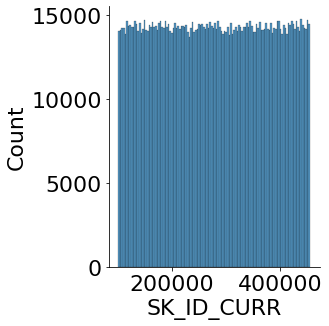

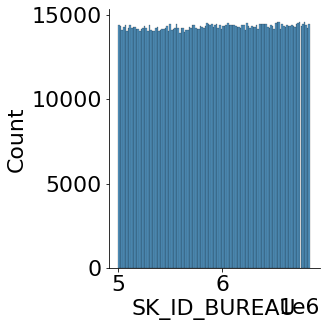

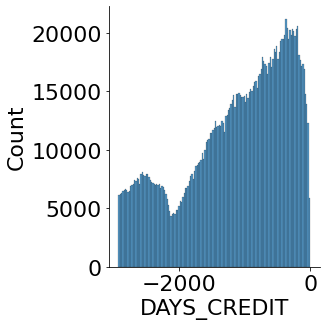

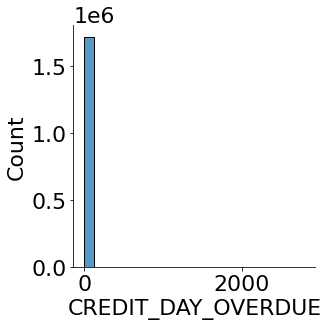

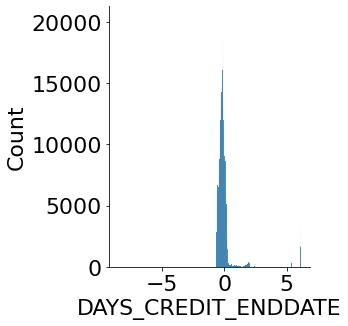

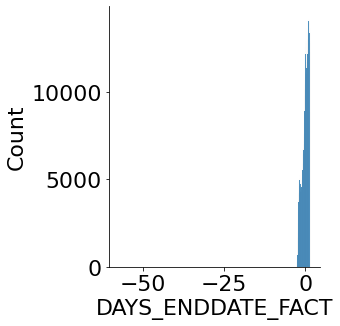

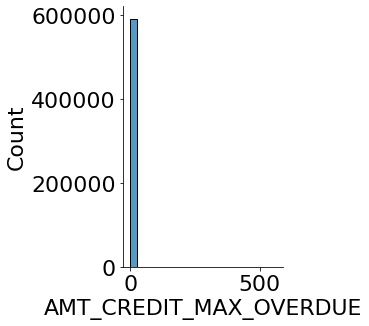

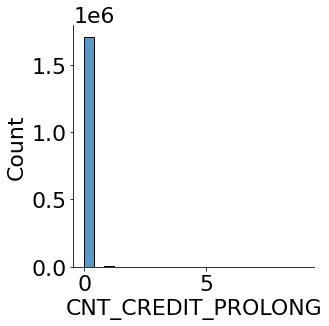

KeyboardInterrupt: ignored

In [ ]:
observe_distribution(df_bureau)

In [ ]:
observe_dispersion(df_bureau)

In [ ]:
observe_frequences(df_bureau)

  CREDIT_ACTIVE        n         f         F
1        Active   630607  0.367395  0.367395
3      Bad debt       21  0.000012  0.367407
0        Closed  1079273  0.628790  0.996197
2          Sold     6527  0.003803  1.000000
  CREDIT_CURRENCY        n         f         F
0      currency 1  1715020  0.999180  0.999180
1      currency 2     1224  0.000713  0.999893
2      currency 3      174  0.000101  0.999994
3      currency 4       10  0.000006  1.000000
                                     CREDIT_TYPE  ...         F
6                           Another type of loan  ...  0.000593
2                                       Car loan  ...  0.016725
9                      Cash loan (non-earmarked)  ...  0.016757
0                                Consumer credit  ...  0.745955
1                                    Credit card  ...  0.980276
14                              Interbank credit  ...  0.980276
5                  Loan for business development  ...  0.981427
12  Loan for purchase of sha

In [ ]:
test_normality(df_bureau)

Les variables a distributions normales sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_CURR,1.565140e+06,0.0,False
SK_ID_BUREAU,1.510934e+06,0.0,False
DAYS_CREDIT,1.914398e+05,0.0,False
CREDIT_DAY_OVERDUE,5.599267e+06,0.0,False
DAYS_CREDIT_ENDDATE,1.596973e+06,0.0,False
DAYS_ENDDATE_FACT,2.671822e+05,0.0,False
AMT_CREDIT_MAX_OVERDUE,3.650621e+06,0.0,False
CNT_CREDIT_PROLONG,3.780050e+06,0.0,False
AMT_CREDIT_SUM,7.318544e+06,0.0,False
AMT_CREDIT_SUM_DEBT,4.125361e+06,0.0,False


In [ ]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,100001,5896630,Closed,currency 1,-857,0,-492.0,-553.0,NaN,0,112500.0,0.0,0.0,0.0,Consumer credit,-155,0.0
1,100001,5896631,Closed,currency 1,-909,0,-179.0,-877.0,NaN,0,279720.0,0.0,0.0,0.0,Consumer credit,-155,0.0
2,100001,5896632,Closed,currency 1,-879,0,-514.0,-544.0,NaN,0,91620.0,0.0,0.0,0.0,Consumer credit,-155,0.0
3,100001,5896633,Closed,currency 1,-1572,0,-1329.0,-1328.0,NaN,0,85500.0,0.0,0.0,0.0,Consumer credit,-155,0.0
4,100001,5896634,Active,currency 1,-559,0,902.0,NaN,NaN,0,337680.0,113166.0,0.0,0.0,Consumer credit,-6,4630.5


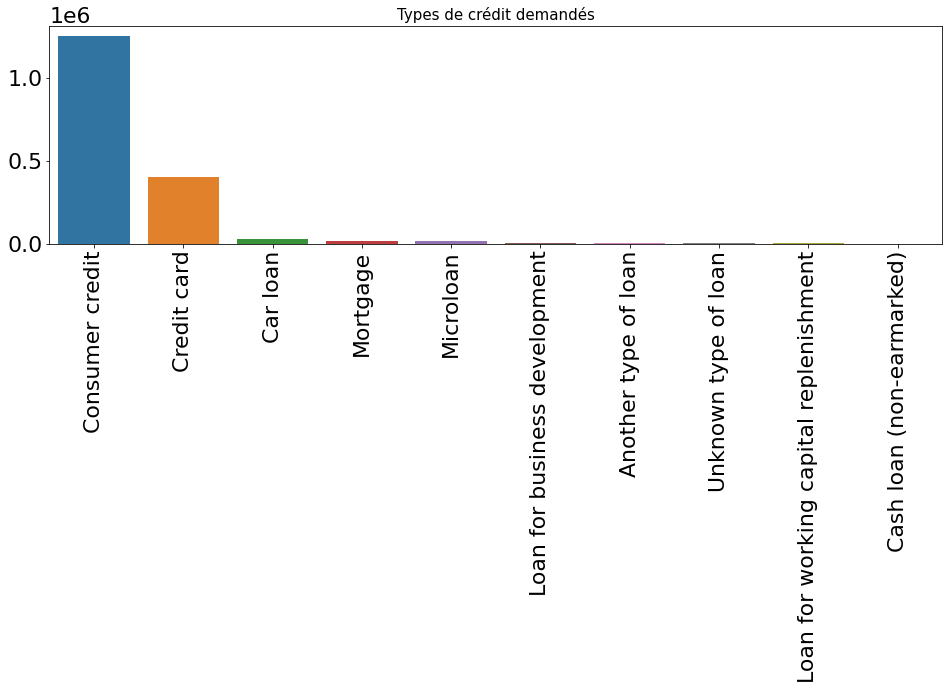

In [ ]:
# Types of loan
create_barplot(df_bureau, 'CREDIT_TYPE', 'SK_ID_BUREAU', 'Types de crédit demandés')

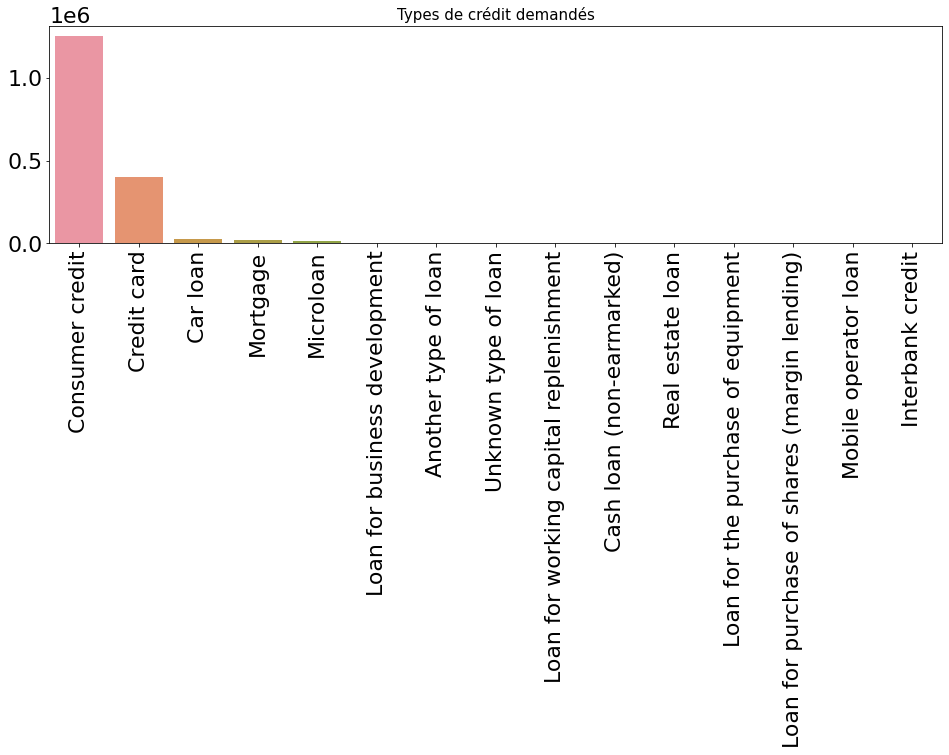

In [ ]:
# Types of loan

loan_types = df_bureau.groupby('CREDIT_TYPE')['SK_ID_BUREAU'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=loan_types.index, y=loan_types.values)
plt.xticks(rotation=90)
plt.title('Types de crédit demandés', size=15)
plt.xlabel('')
plt.show()

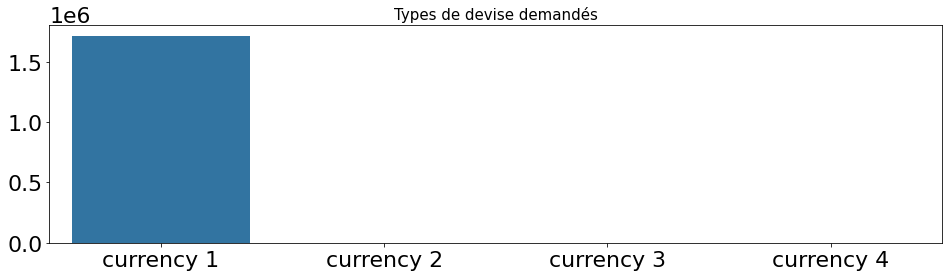

In [ ]:
# Types of currency
create_barplot(df_bureau, 'CREDIT_CURRENCY', 'SK_ID_BUREAU', 'Types de devise demandés', rotation=0)

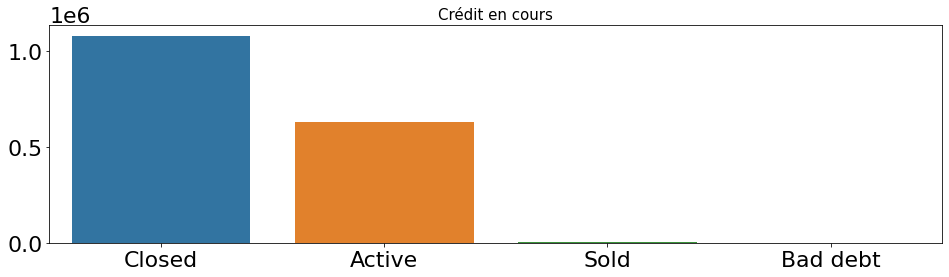

In [ ]:
# Credit active
create_barplot(df_bureau, 'CREDIT_ACTIVE', 'SK_ID_BUREAU', 'Crédit en cours', rotation=0)

In [ ]:
# Print the number of clients
unique_cust_bureau = df_bureau['SK_ID_BUREAU'].nunique()
print(f'Le nombre de demandes de crédit est : {unique_cust_bureau}')

# Print the number of clients
unique_cust_curr = df_bureau['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_bureau != unique_cust_curr


# How many days before current application did client apply for Credit Bureau credit
# Temps d'attente entre la candidature et l'acceptation du crédit
max_days_credit = abs(df_bureau['DAYS_CREDIT'].max())
min_days_credit = abs(df_bureau['DAYS_CREDIT'].min())
print(f'Le nombre de jours entre la candidature actuelle et une candidature précédente va de {max_days_credit} jours à {min_days_credit} jours')

# Number of days past due on CB credit at the time of application for related loan in our sample
max_credit_days_overdue = abs(df_bureau['CREDIT_DAY_OVERDUE'].max())
min_credit_days_overdue = abs(df_bureau['CREDIT_DAY_OVERDUE'].min())
print(f'Le nombre de jours d\'impayés au jour de la candidature va de {min_credit_days_overdue} jours à {max_credit_days_overdue} jours')

# Remaining duration of CB credit (in days) at the time of application in Home Credit
max_days_credit_enddate = df_bureau['DAYS_CREDIT_ENDDATE'].max()/356
min_days_credit_enddate = df_bureau['DAYS_CREDIT_ENDDATE'].min()/356
print(f'Le temps restant pour le crédit par CB va de {min_days_credit_enddate} ans à {max_days_credit_enddate} ans')

# Days since CB credit ended at the time of application in Home Credit (only for closed credit)
max_days_enddate_fact = abs(df_bureau['DAYS_ENDDATE_FACT'].max())/356
min_days_enddate_fact = abs(df_bureau['DAYS_ENDDATE_FACT'].min())/356
print(f'Le crédit par CB a fini entre {max_days_enddate_fact} ans et {min_days_enddate_fact} ans')

# Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample)
max_amt_credit_max_ov = df_bureau['AMT_CREDIT_MAX_OVERDUE'].max()
min_amt_credit_max_ov = df_bureau['AMT_CREDIT_MAX_OVERDUE'].min()
print(f'Le montant maximal d\'impayés va de {min_amt_credit_max_ov} $ à {max_amt_credit_max_ov} $')

# How many times was the Credit Bureau credit prolonged
max_cnt_credit_prolong = df_bureau['CNT_CREDIT_PROLONG'].max()
min_cnt_credit_prolong = df_bureau['CNT_CREDIT_PROLONG'].min()
print(f'Les crédits ont été prolongé de {min_cnt_credit_prolong} fois à {max_cnt_credit_prolong} fois')

# Current credit amount for the Credit Bureau credit
max_amt_credit_sum = df_bureau['AMT_CREDIT_SUM'].max()
min_amt_credit_sum = df_bureau['AMT_CREDIT_SUM'].min()
print(f'Le montant actuel des crédits va de {min_amt_credit_sum} $ à {max_amt_credit_sum} $')

# Current debt on Credit Bureau credit 	
max_amt_credit_sum_debt = df_bureau['AMT_CREDIT_SUM_DEBT'].max()
min_amt_credit_sum_debt = df_bureau['AMT_CREDIT_SUM_DEBT'].min()
print(f'Le dû actuel va de {min_amt_credit_sum_debt} $ à {max_amt_credit_sum_debt} $')

# Current credit limit of credit card reported in Credit Bureau
max_amt_credit_sum_limit = df_bureau['AMT_CREDIT_SUM_LIMIT'].max()
min_amt_credit_sum_limit = df_bureau['AMT_CREDIT_SUM_LIMIT'].min()
print(f'La limite actuelle des cartes de crédit va de {min_amt_credit_sum_limit} $ à {max_amt_credit_sum_limit} $')

# Current amount overdue on Credit Bureau credit
max_amt_credit_sum_overdue = df_bureau['AMT_CREDIT_SUM_OVERDUE'].max()
min_amt_credit_sum_overdue = df_bureau['AMT_CREDIT_SUM_OVERDUE'].min()
print(f'Le montant actuel d\'impayés va de {min_amt_credit_sum_overdue} $ à {max_amt_credit_sum_overdue} $')

# How many days before loan application did last information about the Credit Bureau credit come
max_days_credit_update = abs(df_bureau['DAYS_CREDIT_UPDATE'].max())/356
min_days_credit_update = abs(df_bureau['DAYS_CREDIT_UPDATE'].min())/356
print(f'Le temps depuis l\'actualisation des informations va de {max_days_credit_update} ans à {min_days_credit_update} ans')

# Annuity of the Credit Bureau credit
max_amt_annuity = df_bureau['AMT_ANNUITY'].max()
min_amt_annuity = df_bureau['AMT_ANNUITY'].min()
print(f'Le contrat de rente va de {min_amt_annuity} $ à {max_amt_annuity} $') 	

Le nombre de demandes de crédit est : 1716428
Le nombre de demandes de crédit actuel est : 305811
Le nombre de jours entre la candidature actuelle et une candidature précédente va de 0 jours à 2922 jours
Le nombre de jours d'impayés au jour de la candidature va de 0 jours à 2792 jours
Le temps restant pour le crédit par CB va de -0.023943710862920527 ans à 0.017260681377368026 ans
Le crédit par CB a fini entre 0.004002701030688339 ans et 0.16132004341382658 ans
Le montant maximal d'impayés va de -0.0185671579092741 $ à 562.940185546875 $
Les crédits ont été prolongé de 0 fois à 9 fois
Le montant actuel des crédits va de -0.3087416887283325 $ à 508.47052001953125 $
Le dû actuel va de -7.148920059204102 $ à 250.90443420410156 $
La limite actuelle des cartes de crédit va de -13.160318374633789 $ à 104.35623168945312 $
Le montant actuel d'impayés va de -0.006385146174579859 $ à 632.6819458007812 $
Le temps depuis l'actualisation des informations va de 1.0449438202247192 ans à 117.828651685

In [ ]:
# Print the number of clients
unique_cust_bureau = df_bureau['SK_ID_BUREAU'].nunique()
print(f'Le nombre de demandes de crédit est : {unique_cust_bureau}')

# Print the number of clients
unique_cust_curr = df_bureau['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_bureau != unique_cust_curr


# How many days before current application did client apply for Credit Bureau credit
# Temps d'attente entre la candidature et l'acceptation du crédit
max_days_credit = abs(df_bureau['DAYS_CREDIT'].max())
min_days_credit = abs(df_bureau['DAYS_CREDIT'].min())
print(f'Le nombre de jours entre la candidature actuelle et une candidature précédente va de {max_days_credit} jours à {min_days_credit} jours')

# Number of days past due on CB credit at the time of application for related loan in our sample
max_credit_days_overdue = abs(df_bureau['CREDIT_DAY_OVERDUE'].max())
min_credit_days_overdue = abs(df_bureau['CREDIT_DAY_OVERDUE'].min())
print(f'Le nombre de jours d\'impayés au jour de la candidature va de {min_credit_days_overdue} jours à {max_credit_days_overdue} jours')

# Remaining duration of CB credit (in days) at the time of application in Home Credit
max_days_credit_enddate = df_bureau['DAYS_CREDIT_ENDDATE'].max()/356
min_days_credit_enddate = df_bureau['DAYS_CREDIT_ENDDATE'].min()/356
print(f'Le temps restant pour le crédit par CB va de {min_days_credit_enddate} ans à {max_days_credit_enddate} ans')

# Days since CB credit ended at the time of application in Home Credit (only for closed credit)
max_days_enddate_fact = abs(df_bureau['DAYS_ENDDATE_FACT'].max())/356
min_days_enddate_fact = abs(df_bureau['DAYS_ENDDATE_FACT'].min())/356
print(f'Le crédit par CB a fini entre {max_days_enddate_fact} ans et {min_days_enddate_fact} ans')

# Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample)
max_amt_credit_max_ov = df_bureau['AMT_CREDIT_MAX_OVERDUE'].max()
min_amt_credit_max_ov = df_bureau['AMT_CREDIT_MAX_OVERDUE'].min()
print(f'Le montant maximal d\'impayés va de {min_amt_credit_max_ov} $ à {max_amt_credit_max_ov} $')

# How many times was the Credit Bureau credit prolonged
max_cnt_credit_prolong = df_bureau['CNT_CREDIT_PROLONG'].max()
min_cnt_credit_prolong = df_bureau['CNT_CREDIT_PROLONG'].min()
print(f'Les crédits ont été prolongé de {min_cnt_credit_prolong} fois à {max_cnt_credit_prolong} fois')

# Current credit amount for the Credit Bureau credit
max_amt_credit_sum = df_bureau['AMT_CREDIT_SUM'].max()
min_amt_credit_sum = df_bureau['AMT_CREDIT_SUM'].min()
print(f'Le montant actuel des crédits va de {min_amt_credit_sum} $ à {max_amt_credit_sum} $')

# Current debt on Credit Bureau credit 	
max_amt_credit_sum_debt = df_bureau['AMT_CREDIT_SUM_DEBT'].max()
min_amt_credit_sum_debt = df_bureau['AMT_CREDIT_SUM_DEBT'].min()
print(f'Le dû actuel va de {min_amt_credit_sum_debt} $ à {max_amt_credit_sum_debt} $')

# Current credit limit of credit card reported in Credit Bureau
max_amt_credit_sum_limit = df_bureau['AMT_CREDIT_SUM_LIMIT'].max()
min_amt_credit_sum_limit = df_bureau['AMT_CREDIT_SUM_LIMIT'].min()
print(f'La limite actuelle des cartes de crédit va de {min_amt_credit_sum_limit} $ à {max_amt_credit_sum_limit} $')

# Current amount overdue on Credit Bureau credit
max_amt_credit_sum_overdue = df_bureau['AMT_CREDIT_SUM_OVERDUE'].max()
min_amt_credit_sum_overdue = df_bureau['AMT_CREDIT_SUM_OVERDUE'].min()
print(f'Le montant actuel d\'impayés va de {min_amt_credit_sum_overdue} $ à {max_amt_credit_sum_overdue} $')

# How many days before loan application did last information about the Credit Bureau credit come
max_days_credit_update = abs(df_bureau['DAYS_CREDIT_UPDATE'].max())/356
min_days_credit_update = abs(df_bureau['DAYS_CREDIT_UPDATE'].min())/356
print(f'Le temps depuis l\'actualisation des informations va de {max_days_credit_update} ans à {min_days_credit_update} ans')

# Annuity of the Credit Bureau credit
max_amt_annuity = df_bureau['AMT_ANNUITY'].max()
min_amt_annuity = df_bureau['AMT_ANNUITY'].min()
print(f'Le contrat de rente va de {min_amt_annuity} $ à {max_amt_annuity} $') 	

Le nombre de demandes de crédit est : 1716428
Le nombre de demandes de crédit actuel est : 305811
Le nombre de jours entre la candidature actuelle et une candidature précédente va de 0 jours à 2922 jours
Le nombre de jours d'impayés au jour de la candidature va de 0 jours à 2792 jours
Le temps restant pour le crédit par CB va de -118.14606741573034 ans à 87.63764044943821 ans
Le crédit par CB a fini entre 0.0 ans et 118.04213483146067 ans
Le montant maximal d'impayés va de 0.0 $ à 115987184.0 $
Les crédits ont été prolongé de 0 fois à 9 fois
Le montant actuel des crédits va de 0.0 $ à 585000000.0 $
Le dû actuel va de -4705600.5 $ à 170100000.0 $
La limite actuelle des cartes de crédit va de -586406.125 $ à 4705600.5 $
Le montant actuel d'impayés va de 0.0 $ à 3756681.0 $
Le temps depuis l'actualisation des informations va de 1.0449438202247192 ans à 117.82865168539325 ans
Le contrat de rente va de 0.0 $ à 118453424.0 $


#### Filtrage des outliers

DAYS_CREDIT_ENDDATE

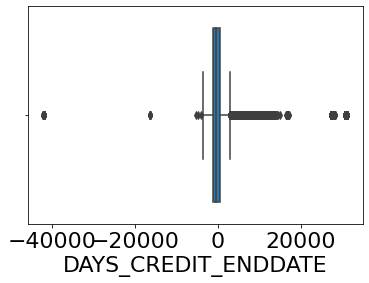

In [ ]:
sns.boxplot(df_bureau['DAYS_CREDIT_ENDDATE'])

In [ ]:
print_min_max(df_bureau,'DAYS_CREDIT_ENDDATE')

-42060.0
31199.0


In [ ]:
# Filter out outliers
df_bureau = delete_percentile_based_outliers(df_bureau, 'DAYS_CREDIT_ENDDATE')

diff is : 2.5
lower limit is : -2445.0
upper limit is : 12832.0


In [ ]:
print_min_max(df_bureau,'DAYS_CREDIT_ENDDATE')

-2445.0
12832.0


DAYS_ENDDATE_FACT

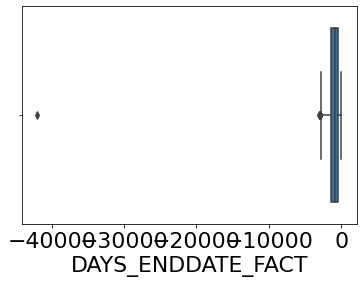

In [ ]:
sns.boxplot(df_bureau['DAYS_ENDDATE_FACT'])

In [ ]:
print_min_max(df_bureau,'DAYS_ENDDATE_FACT')

-42023.0
0.0


In [ ]:
# Filter out outliers
df_bureau = delete_percentile_based_outliers(df_bureau, 'DAYS_ENDDATE_FACT')

diff is : 2.5
lower limit is : -2360.0
upper limit is : -49.0


In [ ]:
print_min_max(df_without_anomalies,'DAYS_ENDDATE_FACT')

-2360.0
-49.0


AMT_CREDIT_SUM

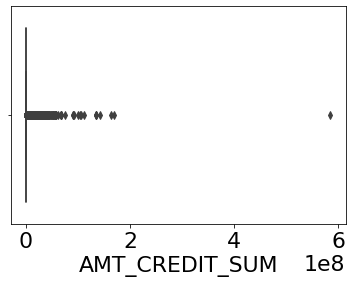

In [ ]:
sns.boxplot(df_bureau['AMT_CREDIT_SUM'])

In [ ]:
print_min_max(df_bureau,'AMT_CREDIT_SUM')

0.0
585000000.0


In [ ]:
# Filter out outliers
df_bureau = delete_percentile_based_outliers(df_bureau, 'AMT_CREDIT_SUM')

diff is : 2.5
lower limit is : 0.0
upper limit is : 2250000.0


In [ ]:
print_min_max(df_bureau,'AMT_CREDIT_SUM')

0.0
2250000.0


AMT_CREDIT_SUM_DEBT

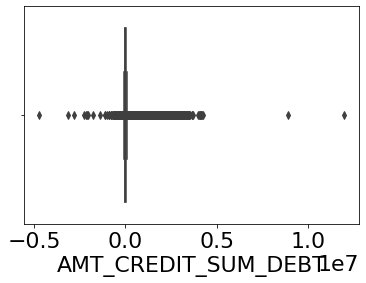

In [ ]:
sns.boxplot(df_bureau['AMT_CREDIT_SUM_DEBT'])

In [ ]:
print_min_max(df_bureau,'AMT_CREDIT_SUM_DEBT')

-4705600.5
11956964.0


In [ ]:
# Filter out outliers
df_bureau = delete_percentile_based_outliers(df_bureau, 'AMT_CREDIT_SUM_DEBT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 840532.5843749976


In [ ]:
# Filter out negative values for AMT_CREDIT_SUM_DEBT
#df_bureau = df_bureau[df_bureau['AMT_CREDIT_SUM_DEBT'] >= 0]
df_bureau = df_bureau[df_bureau['AMT_CREDIT_SUM_DEBT'] >= 0]

In [ ]:
print_min_max(df_bureau,'AMT_CREDIT_SUM_DEBT')

0.0
840510.0


AMT_CREDIT_SUM_LIMIT


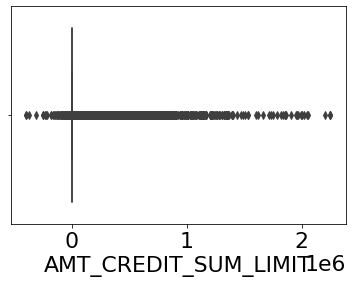

In [ ]:
sns.boxplot(df_bureau['AMT_CREDIT_SUM_LIMIT'])

In [ ]:
print_min_max(df_bureau,'AMT_CREDIT_SUM_LIMIT')

-401346.9375
2250000.0


In [ ]:
# Filter out outliers
df_bureau = delete_percentile_based_outliers(df_bureau, 'AMT_CREDIT_SUM_LIMIT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 57260.609375


In [ ]:
# Filter out negative values for AMT_CREDIT_SUM_LIMIT
#df_bureau = df_bureau[df_bureau['AMT_CREDIT_SUM_LIMIT'] >= 0]
df_bureau = df_bureau[df_bureau['AMT_CREDIT_SUM_LIMIT'] >= 0]

In [ ]:
print_min_max(df_bureau,'AMT_CREDIT_SUM_LIMIT')

0.0
57256.55859375


DAYS_CREDIT_UPDATE

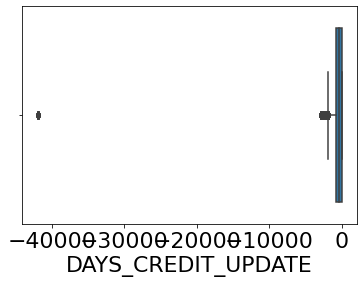

In [ ]:
sns.boxplot(df_bureau['DAYS_CREDIT_UPDATE'])

In [ ]:
print_min_max(df_bureau,'DAYS_CREDIT_UPDATE')

-41947
13


In [ ]:
# Filter out positive values for DAYS_CREDIT_UPDATE
#df_bureau = df_bureau[df_bureau['DAYS_CREDIT_UPDATE'] <= 0]
df_bureau = df_bureau[df_bureau['DAYS_CREDIT_UPDATE'] <= 0]

In [ ]:
# Filter out outliers
df_bureau = delete_percentile_based_outliers(df_bureau, 'DAYS_CREDIT_UPDATE')

diff is : 2.5
lower limit is : -2072.0
upper limit is : -6.0


In [ ]:
print_min_max(df_bureau,'DAYS_CREDIT_UPDATE')

-2072
-6


#### Vérification des nouvelles valeurs

In [ ]:
# Remaining duration of CB credit (in days) at the time of application in Home Credit
max_days_credit_enddate = abs(df_bureau['DAYS_CREDIT_ENDDATE'].max())/356
min_days_credit_enddate = abs(df_bureau['DAYS_CREDIT_ENDDATE'].min())/356
print(f'Le temps restant pour le crédit par CB va de {min_days_credit_enddate} ans à {max_days_credit_enddate} ans')

# Days since CB credit ended at the time of application in Home Credit (only for closed credit)
max_days_enddate_fact = abs(df_bureau['DAYS_ENDDATE_FACT'].max())/356
min_days_enddate_fact = abs(df_bureau['DAYS_ENDDATE_FACT'].min())/356
print(f'Le crédit par CB a fini entre {max_days_enddate_fact} ans et {min_days_enddate_fact} ans')



# Current credit amount for the Credit Bureau credit
max_amt_credit_sum = df_bureau['AMT_CREDIT_SUM'].max()
min_amt_credit_sum = df_bureau['AMT_CREDIT_SUM'].min()
print(f'Le montant actuel des crédits va de {min_amt_credit_sum} $ à {max_amt_credit_sum} $')

# Current debt on Credit Bureau credit 	
max_amt_credit_sum_debt = df_bureau['AMT_CREDIT_SUM_DEBT'].max()
min_amt_credit_sum_debt = df_bureau['AMT_CREDIT_SUM_DEBT'].min()
print(f'Le dû actuel va de {min_amt_credit_sum_debt} $ à {max_amt_credit_sum_debt} $')

# Current credit limit of credit card reported in Credit Bureau
max_amt_credit_sum_limit = df_bureau['AMT_CREDIT_SUM_LIMIT'].max()
min_amt_credit_sum_limit = df_bureau['AMT_CREDIT_SUM_LIMIT'].min()
print(f'La limite actuelle des cartes de crédit va de {min_amt_credit_sum_limit} $ à {max_amt_credit_sum_limit} $')


# How many days before loan application did last information about the Credit Bureau credit come
max_days_credit_update = abs(df_bureau['DAYS_CREDIT_UPDATE'].max())/356
min_days_credit_update = abs(df_bureau['DAYS_CREDIT_UPDATE'].min())/356
print(f'Le temps depuis l\'actualisation des informations va de {max_days_credit_update} ans à {min_days_credit_update} ans')

Le temps restant pour le crédit par CB va de 6.867977528089888 ans à 36.04494382022472 ans
Le crédit par CB a fini entre 0.13764044943820225 ans et 6.629213483146067 ans
Le montant actuel des crédits va de 0.0 $ à 2250000.0 $
Le dû actuel va de 0.0 $ à 840510.0 $
La limite actuelle des cartes de crédit va de 0.0 $ à 57726.0 $
Le temps depuis l'actualisation des informations va de 0.016853932584269662 ans à 5.946629213483146 ans


In [ ]:
observe_distribution(df_bureau)

In [ ]:
observe_dispersion(df_bureau)

In [ ]:
observe_frequences(df_bureau)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CREDIT_DAY_OVERDUE']

### df_bureau_balance

In [ ]:
df_bureau_balance.describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


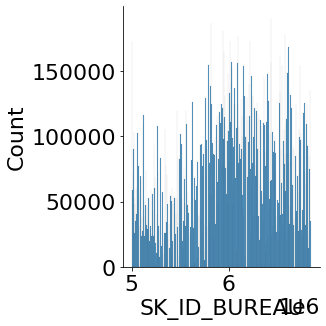

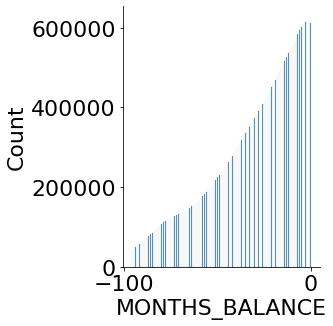

In [ ]:
observe_distribution(df_bureau_balance)

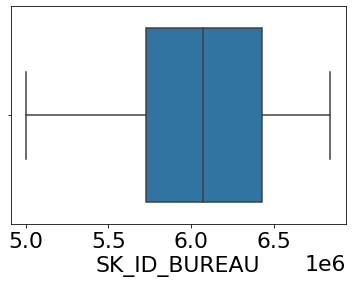

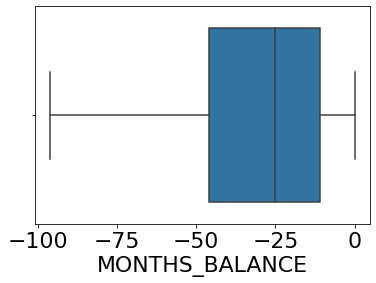

In [ ]:
observe_dispersion(df_bureau_balance)

In [ ]:
test_normality(df_bureau_balance)

Les variables a distributions normales sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_BUREAU,2.321144e+06,0.0,False
MONTHS_BALANCE,2.263003e+06,0.0,False


In [ ]:
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5001709,-7,C
1,5001709,-3,C
2,5001709,-4,C
3,5001709,-5,C
4,5001709,-6,C


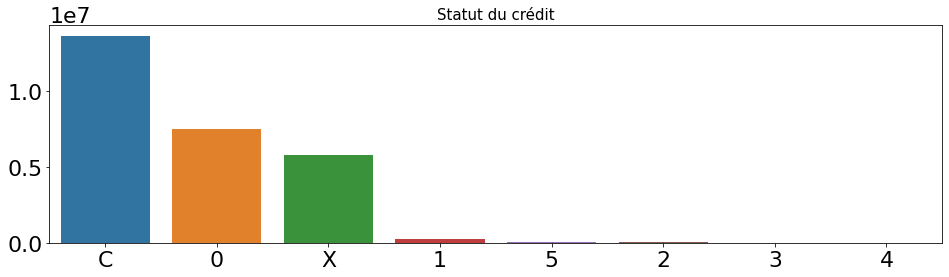

In [ ]:
# Status
create_barplot(df_bureau_balance, 'STATUS', 'SK_ID_BUREAU', 'Statut du crédit', rotation=0)

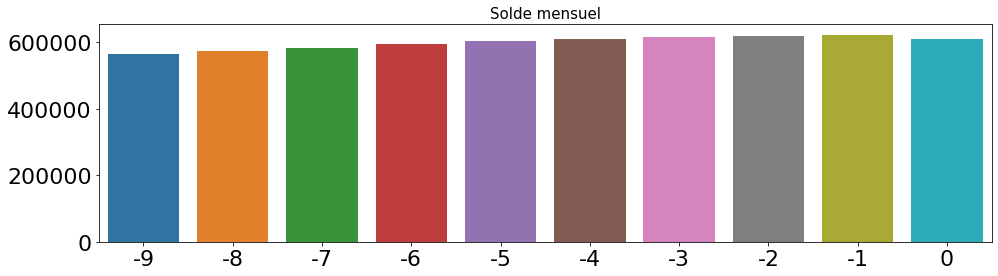

In [ ]:
# Months balance
create_barplot(df_bureau_balance, 'MONTHS_BALANCE', 'SK_ID_BUREAU', 'Solde mensuel', rotation=0)

In [ ]:
# Print the number of clients
unique_cust_bureau = df_bureau_balance['SK_ID_BUREAU'].nunique()
print(f'Le nombre de demandes de crédit est : {unique_cust_bureau}')


# Month of balance relative to application date (-1 means the freshest balance date)
min_days_instalment = abs(df_bureau_balance['MONTHS_BALANCE'].max())
max_days_instalment = abs(df_bureau_balance['MONTHS_BALANCE'].min())
print(f'Le nombre de mensualités payés depuis la candidature va de {min_days_instalment} à {max_days_instalment}')

Le nombre de demandes de crédit est : 817395
Le nombre de mensualités payés depuis la candidature va de 0 à 96


### df_credit_card_balance

In [ ]:
df_credit_card_balance.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.072324e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.840312e+06,3.840312e+06
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,1.028054e+04,7.588857e+03,5.596588e+04,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,3.607808e+04,3.200599e+04,1.025336e+05,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.523700e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.702700e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,9.000000e+03,6.750000e+03,8.535924e+04,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,0.000000e+00,0.000000e+00
max,2.843496e+06,4.562500e+05,-1.000000e+00,1.505902e+06,1.350000e+06,2.115000e+06,2.287098e+06,1.529847e+06,2.239274e+06,2.028820e+05,4.289207e+06,4.278316e+06,1.472317e+06,1.493338e+06,1.493338e+06,5.100000e+01,1.650000e+02,1.200000e+01,1.650000e+02,1.200000e+02,3.260000e+03,3.260000e+03


In [ ]:
observe_distribution(df_credit_card_balance)

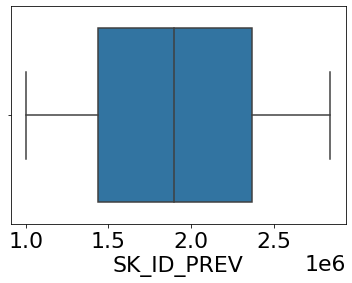

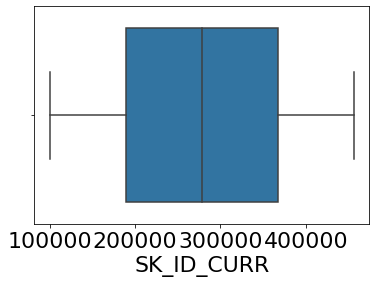

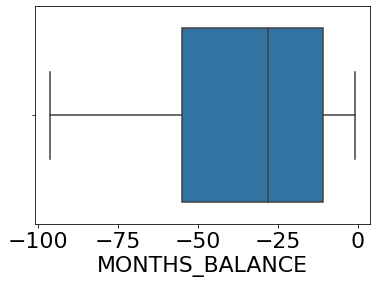

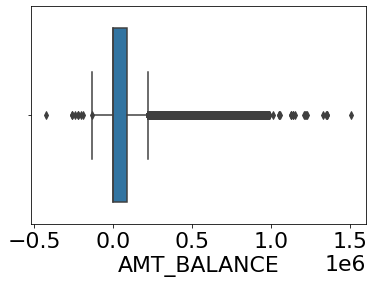

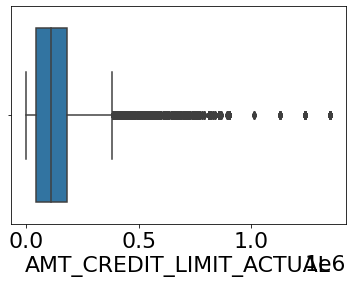

...

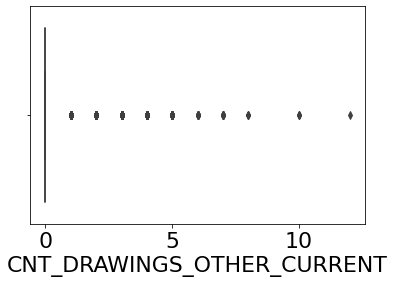

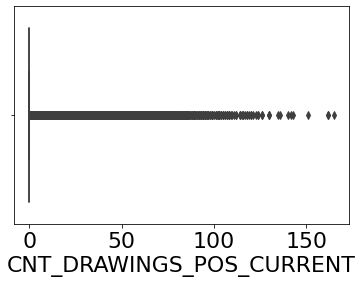

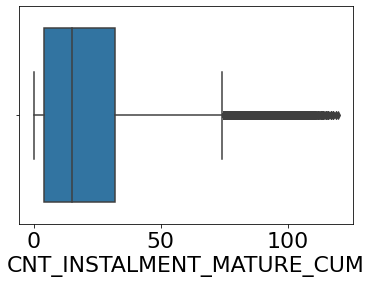

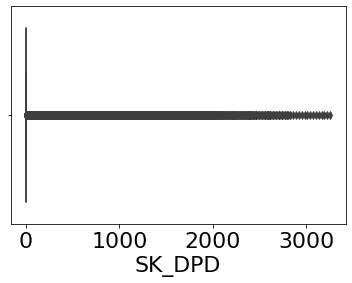

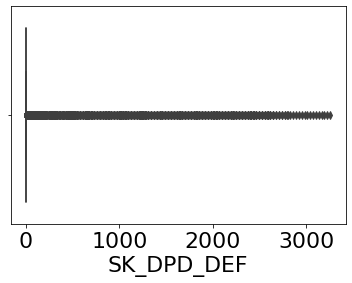

In [ ]:
observe_dispersion(df_credit_card_balance)

In [ ]:
observe_frequences(df_credit_card_balance)

  NAME_CONTRACT_STATUS        n         f         F
0               Active  3698436  0.963056  0.963056
6             Approved        5  0.000001  0.963057
1            Completed   128918  0.033570  0.996627
3               Demand     1365  0.000355  0.996983
5              Refused       17  0.000004  0.996987
4        Sent proposal      513  0.000134  0.997121
2               Signed    11058  0.002879  1.000000


In [ ]:
test_normality(df_credit_card_balance)

Les variables a distributions normales sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_PREV,4.141352e+06,0.0,False
SK_ID_CURR,3.395205e+06,0.0,False
MONTHS_BALANCE,6.239410e+05,0.0,False
AMT_BALANCE,2.411890e+06,0.0,False
AMT_CREDIT_LIMIT_ACTUAL,1.601600e+06,0.0,False
AMT_DRAWINGS_ATM_CURRENT,4.760450e+06,0.0,False
AMT_DRAWINGS_CURRENT,6.055194e+06,0.0,False
AMT_DRAWINGS_OTHER_CURRENT,9.751359e+06,0.0,False
AMT_DRAWINGS_POS_CURRENT,6.707964e+06,0.0,False
AMT_INST_MIN_REGULARITY,1.942907e+06,0.0,False


In [ ]:
df_credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1489396,100006,-2,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
1,1489396,100006,-1,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
2,1489396,100006,-5,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
3,1489396,100006,-3,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
4,1489396,100006,-4,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0


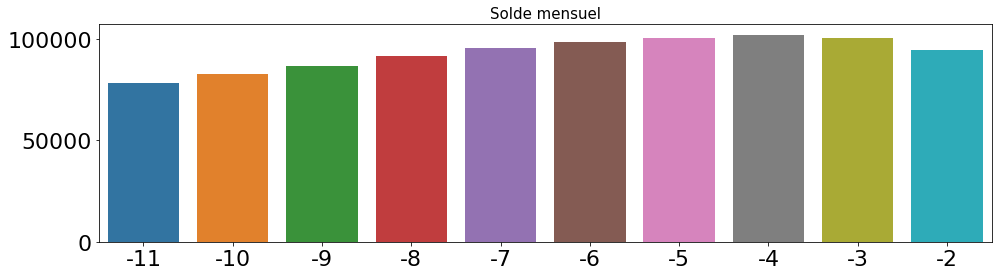

In [ ]:
# Months balance
create_barplot(df_credit_card_balance, 'MONTHS_BALANCE', 'SK_ID_CURR', 'Solde mensuel', rotation=0)

In [ ]:
# Months balance

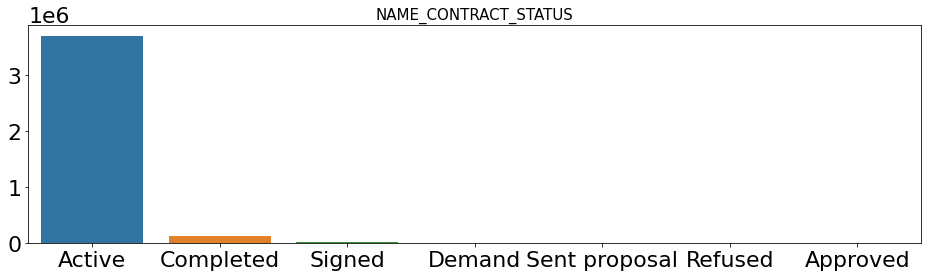

In [ ]:
# NAME_CONTRACT_STATUS
create_barplot(df_credit_card_balance, 'NAME_CONTRACT_STATUS', 'SK_ID_CURR', 'Statut du contrat du client', rotation=0)

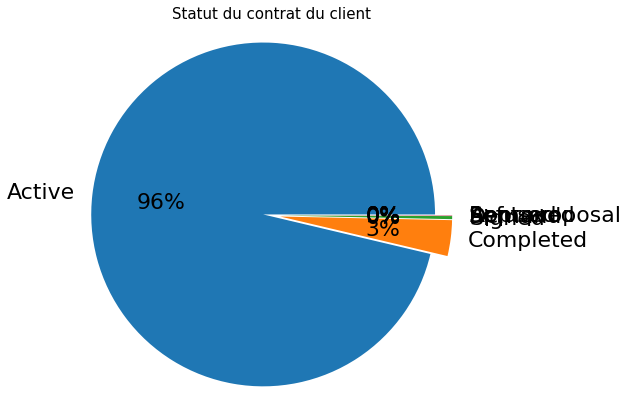

In [ ]:
# NAME_CONTRACT_STATUS
create_pieplot(df_credit_card_balance, 'NAME_CONTRACT_STATUS', 'SK_ID_CURR', 'Statut du contrat du client')

In [ ]:
# Print the number of clients
unique_cust_prev = df_credit_card_balance['SK_ID_PREV'].nunique()
print(f'Le nombre de demandes de crédit antérieur est : {unique_cust_prev}')

# Print the number of clients
unique_cust_curr = df_credit_card_balance['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_prev != unique_cust_curr


# Months balance
max_months_balance = df_credit_card_balance['MONTHS_BALANCE'].max()
min_months_balance = df_credit_card_balance['MONTHS_BALANCE'].min()
print(f'Le solde du mois observé va de {min_months_balance} à {max_months_balance}')


# Balance during the month of previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_BALANCE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_BALANCE'].min()
print(f'Le solde durant le mois précédent va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Credit card limit during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'].max()
min_cnt_instalment = df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'].min()
print(f'La limite de la carte de crédit va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing at ATM during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].min()
print(f'La valeur des retraits aux guichets au cours du mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_CURRENT'].min()
print(f'La valeur des retraits va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount of other drawings during the month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].min()
print(f'La valeur des retraits divers va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing or buying goods during the month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].min()
print(f'La valeur des retraits pour l\'achat de biens va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Minimal installment for this month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_INST_MIN_REGULARITY'].max()
min_cnt_instalment = df_credit_card_balance['AMT_INST_MIN_REGULARITY'].min()
print(f'La mensualité minimale pour ce mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# How much did the client pay during the month in total on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'].min()
print(f'La valeur totale dépensée par le client ce mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# Amount receivable for principal on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'].max()
min_cnt_instalment = df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'].min()
print(f'La somme principale a encaissée va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount receivable on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_RECIVABLE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_RECIVABLE'].min()
print(f'La somme (avec intérêts) a encaissée va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# Total amount receivable on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_TOTAL_RECEIVABLE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_TOTAL_RECEIVABLE'].min()
print(f'Le montant total du précédent crédit va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Number of drawings at ATM during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].min()
print(f'Le nombre de retraits en guichets automatiques sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')

# Number of drawings during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_CURRENT'].min()
print(f'Le nombre de retraits sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')

# Number of other drawings during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].min()
print(f'Le nombre d\'autres types de retraits sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')


# Number of drawings for goods during this month on the previous credit 	
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].min()
print(f'Le nombre de retraits pour le bien principal sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')


# Number of paid installments on the previous credit
max_cnt_instalment_future = df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].max()
min_cnt_instalment_future = df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].min()
print(f'Le nombre de mensualités payées sur le crédit précédent va de {min_cnt_instalment_future} à {max_cnt_instalment_future}')






# Days past due
max_sk_dpd= df_credit_card_balance['SK_DPD'].max()
min_sk_dpd = df_credit_card_balance['SK_DPD'].min()
print(f'Le temps passé depuis le jour où la mensualité est due va de {min_sk_dpd} jours à {max_sk_dpd} jours')

# Days past due with tolerance
max_sk_dpd_def = df_credit_card_balance['SK_DPD_DEF'].max()
min_sk_dpd_def = df_credit_card_balance['SK_DPD_DEF'].min()
print(f'Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de {min_sk_dpd_def} jours à {max_sk_dpd_def} jours')

Le nombre de demandes de crédit antérieur est : 104307
Le nombre de demandes de crédit actuel est : 103558
Le solde du mois observé va de -96 à -1
Le solde durant le mois précédent va de -420250.185 $ à 1505902.185 $
La limite de la carte de crédit va de 0 $?? à 1350000 $??
La valeur des retraits aux guichets au cours du mois va de -6827.31 $ à 2115000.0 $
La valeur des retraits va de -6211.62 $ à 2287098.315 $
La valeur des retraits divers va de 0.0 $ à 1529847.0 $
La valeur des retraits pour l'achat de biens va de 0.0 $ à 2239274.16 $
La mensualité minimale pour ce mois va de 0.0 $ à 202882.005 $
La valeur totale dépensée par le client ce mois va de 0.0 $ à 4278315.69 $
La somme principale a encaissée va de -423305.82 $ à 1472316.795 $
La somme (avec intérêts) a encaissée va de -420250.185 $ à 1493338.185 $
Le montant total du précédent crédit va de -420250.185 $ à 1493338.185 $
Le nombre de retraits en guichets automatiques sur le précédent crédit au cours du mois va de 0.0 à 51.0
L

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_BALANCE']

,Unnamed: 0,Table,Row,Description,Special
153,156,credit_card_balance.csv,AMT_BALANCE,Balance during the month of previous credit,NaN


#### Filtrage des outliers

CNT_DRAWINGS_ATM_CURRENT

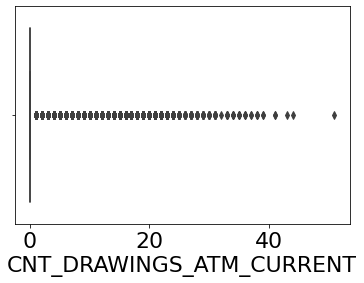

In [ ]:
sns.boxplot(df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_ATM_CURRENT')

0.0
51.0


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'CNT_DRAWINGS_ATM_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 3.0


In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_ATM_CURRENT')

0.0
3.0


CNT_DRAWINGS_CURRENT

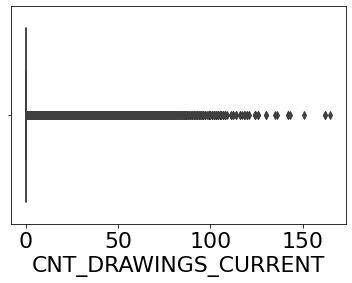

In [ ]:
sns.boxplot(df_credit_card_balance['CNT_DRAWINGS_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_CURRENT')

0
165


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'CNT_DRAWINGS_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 5.0


In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_CURRENT')

0
5


CNT_DRAWINGS_OTHER_CURRENT

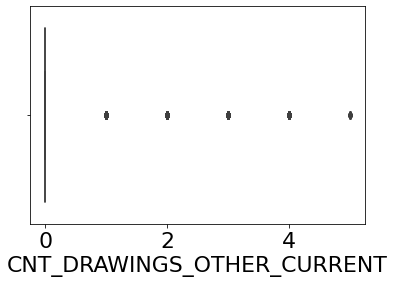

In [ ]:
sns.boxplot(df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_OTHER_CURRENT')

0.0
5.0


In [ ]:
delete_percentile_based_outliers(df_credit_card_balance, 'CNT_DRAWINGS_OTHER_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 0.0


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1489396,100006,-2,0.000000,270000,NaN,0.0,NaN,NaN,0.000000,NaN,0.000000,0.0000,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0
1,1489396,100006,-1,0.000000,270000,NaN,0.0,NaN,NaN,0.000000,NaN,0.000000,0.0000,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0
2,1489396,100006,-5,0.000000,270000,NaN,0.0,NaN,NaN,0.000000,NaN,0.000000,0.0000,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0
3,1489396,100006,-3,0.000000,270000,NaN,0.0,NaN,NaN,0.000000,NaN,0.000000,0.0000,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0
4,1489396,100006,-4,0.000000,270000,NaN,0.0,NaN,NaN,0.000000,NaN,0.000000,0.0000,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840306,1794451,456250,-10,186577.609375,180000,0.0,0.0,0.0,0.0,9892.485352,20250.0,11250.000000,178200.0000,185907.109375,185907.109375,0.0,0,0.0,0.0,1.0,Active,0,0
3840307,1794451,456250,-7,174435.890625,180000,0.0,0.0,0.0,0.0,9240.705078,9675.0,590.625000,172012.3125,174435.890625,174435.890625,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000000,180000,0.0,0.0,0.0,0.0,9465.705078,9675.0,434.295013,174653.8125,176958.906250,176958.906250,0.0,0,0.0,0.0,3.0,Active,0,0
3840310,1794451,456250,-11,200208.921875,180000,9000.0,9000.0,0.0,0.0,0.000000,NaN,0.000000,180000.0000,196581.921875,196581.921875,1.0,1,0.0,0.0,0.0,Active,0,0


In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_OTHER_CURRENT')

0.0
5.0


CNT_DRAWINGS_POS_CURRENT

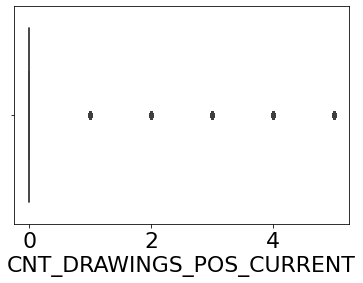

In [ ]:
sns.boxplot(df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_POS_CURRENT')

0.0
5.0


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'CNT_DRAWINGS_POS_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 2.0


In [ ]:
print_min_max(df_credit_card_balance, 'CNT_DRAWINGS_POS_CURRENT')

0.0
2.0


AMT_BALANCE

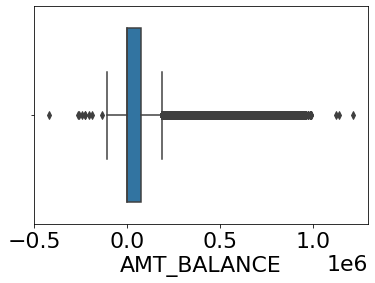

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_BALANCE'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_BALANCE')

-420250.1875
1214812.375


In [ ]:
# Filter out negative values AMT_BALANCE
#df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_BALANCE'] >= 0]
df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_BALANCE'] >= 0]

In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_BALANCE')

diff is : 2.5
lower limit is : 0.0
upper limit is : 333786.89531250054


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_BALANCE')

0.0
333781.875


AMT_CREDIT_LIMIT_ACTUAL

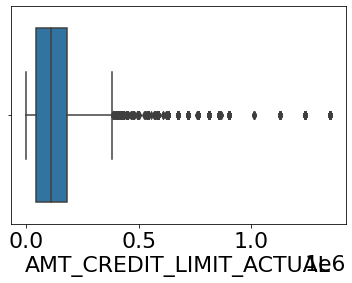

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_CREDIT_LIMIT_ACTUAL')

0
1350000


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_CREDIT_LIMIT_ACTUAL')

diff is : 2.5
lower limit is : 0.0
upper limit is : 450000.0


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_CREDIT_LIMIT_ACTUAL')

0
450000


AMT_DRAWINGS_ATM_CURRENT

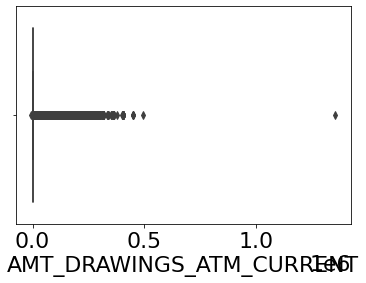

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_ATM_CURRENT')

-6827.31005859375
1354500.0


In [ ]:
# Filter out negative values AMT_DRAWINGS_ATM_CURRENT
#df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'] >= 0]
df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'] >= 0]

In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_DRAWINGS_ATM_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 36000.0


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_ATM_CURRENT')

0.0
36000.0


AMT_DRAWINGS_CURRENT

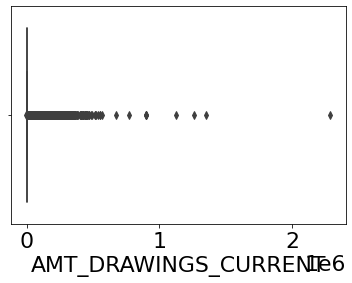

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_DRAWINGS_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_CURRENT')

-6211.6201171875
2287098.25


In [ ]:
# Filter out negative values AMT_DRAWINGS_CURRENT
#df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_CURRENT'] >= 0]
df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_CURRENT'] >= 0]

In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_DRAWINGS_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 18495.0


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_CURRENT')

0.0
18495.0


AMT_DRAWINGS_OTHER_CURRENT

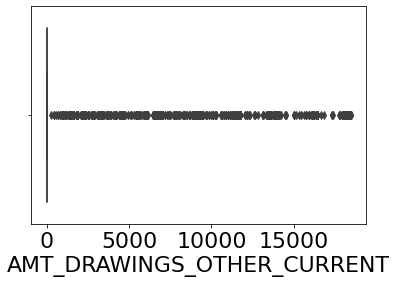

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_OTHER_CURRENT')

0.0
18451.80078125


In [ ]:
# Filter out outliers
#df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_DRAWINGS_OTHER_CURRENT')

In [ ]:
#print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_OTHER_CURRENT')

AMT_DRAWINGS_POS_CURRENT

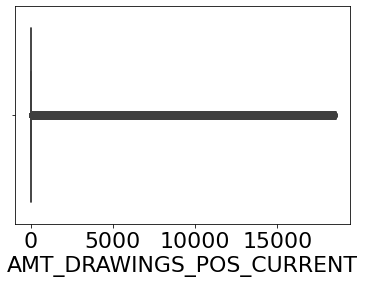

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_POS_CURRENT')

0.0
18495.0


In [ ]:
# Filter out outliers
#df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_DRAWINGS_POS_CURRENT')

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_DRAWINGS_POS_CURRENT')

0.0
18495.0


AMT_INST_MIN_REGULARITY

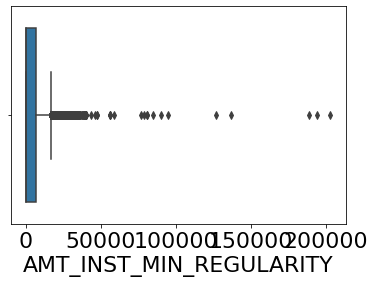

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_INST_MIN_REGULARITY'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_INST_MIN_REGULARITY')

0.0
202882.0


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_INST_MIN_REGULARITY')

diff is : 2.5
lower limit is : 0.0
upper limit is : 13221.107812499975


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_INST_MIN_REGULARITY')

0.0
13221.0


AMT_PAYMENT_TOTAL_CURRENT

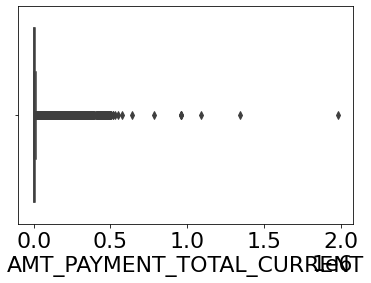

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_PAYMENT_TOTAL_CURRENT')

0.0
1981395.0


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_PAYMENT_TOTAL_CURRENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 22500.0


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_PAYMENT_TOTAL_CURRENT')

0.0
22500.0


AMT_RECEIVABLE_PRINCIPAL

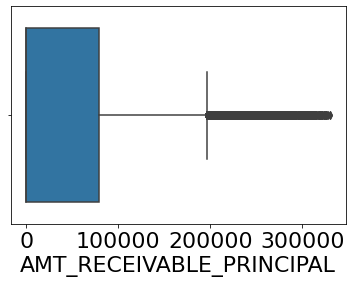

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_RECEIVABLE_PRINCIPAL')

-599.3099975585938
330606.03125


In [ ]:
# Filter out negative values AMT_TOTAL_RECEIVABLE
#df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'] >= 0]
df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'] >= 0]

In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_RECEIVABLE_PRINCIPAL')

diff is : 2.5
lower limit is : 0.0
upper limit is : 179745.484375


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_RECEIVABLE_PRINCIPAL')

0.0
179745.484375


AMT_RECIVABLE

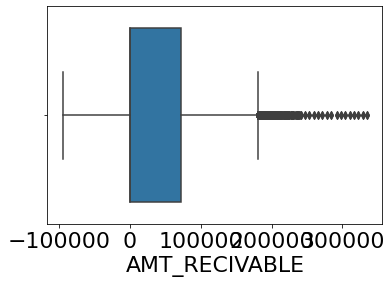

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_RECIVABLE'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_RECIVABLE')

-94343.8515625
334692.28125


In [ ]:
# Filter out negative values AMT_TOTAL_RECEIVABLE
df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['AMT_RECIVABLE'] >= 0]

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_RECIVABLE')

0.0
334692.28125


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_RECIVABLE')

diff is : 2.5
lower limit is : 0.0
upper limit is : 180229.94609374995


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_RECIVABLE')

0.0
180229.8125


AMT_TOTAL_RECEIVABLE

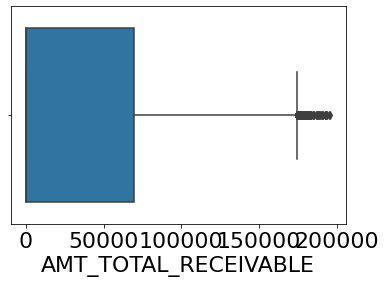

In [ ]:
sns.boxplot(df_credit_card_balance['AMT_TOTAL_RECEIVABLE'])

In [ ]:
print_min_max(df_credit_card_balance, 'AMT_TOTAL_RECEIVABLE')

0.0
195934.546875


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'AMT_TOTAL_RECEIVABLE')

diff is : 2.5
lower limit is : 0.0
upper limit is : 169900.10898437497


In [ ]:
print_min_max(df_credit_card_balance, 'AMT_TOTAL_RECEIVABLE')

0.0
169900.0625


CNT_INSTALMENT_MATURE_CUM

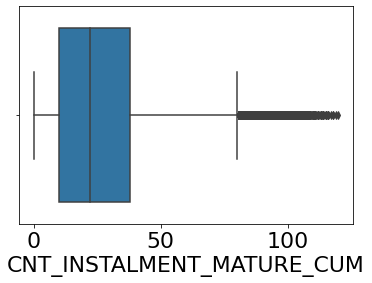

In [ ]:
sns.boxplot(df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'])

In [ ]:
print_min_max(df_credit_card_balance, 'CNT_INSTALMENT_MATURE_CUM')

0.0
120.0


In [ ]:
# Filter out outliers
df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'CNT_INSTALMENT_MATURE_CUM')

diff is : 2.5
lower limit is : 1.0
upper limit is : 71.0


In [ ]:
print_min_max(df_credit_card_balance, 'CNT_INSTALMENT_MATURE_CUM')

1.0
71.0


SK_DPD

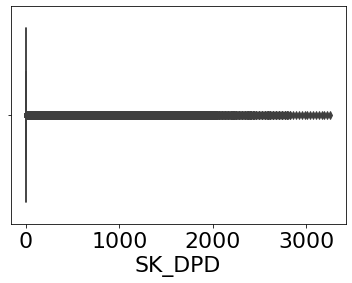

In [ ]:
sns.boxplot(df_credit_card_balance['SK_DPD'])

In [ ]:
print_min_max(df_credit_card_balance, 'SK_DPD')

0
3260


In [ ]:
# Filter out outliers
#df_credit_card_balance = delete_percentile_based_outliers(df_credit_card_balance, 'SK_DPD')

In [ ]:
print_min_max(df_credit_card_balance, 'SK_DPD')

0
3260


SK_DPD_DEF

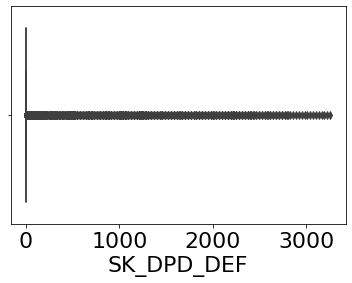

In [ ]:
sns.boxplot(df_credit_card_balance['SK_DPD_DEF'])

In [ ]:
print_min_max(df_credit_card_balance, 'SK_DPD_DEF')

0
3260


#### Vérification des nouvelles valeurs

In [ ]:

# Balance during the month of previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_BALANCE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_BALANCE'].min()
print(f'Le solde durant le mois précédent va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Credit card limit during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'].max()
min_cnt_instalment = df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'].min()
print(f'La limite de la carte de crédit va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing at ATM during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].min()
print(f'La valeur des retraits aux guichets au cours du mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_CURRENT'].min()
print(f'La valeur des retraits va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount of other drawings during the month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].min()
print(f'La valeur des retraits divers va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing or buying goods during the month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].min()
print(f'La valeur des retraits pour l\'achat de biens va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Minimal installment for this month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_INST_MIN_REGULARITY'].max()
min_cnt_instalment = df_credit_card_balance['AMT_INST_MIN_REGULARITY'].min()
print(f'La mensualité minimale pour ce mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# How much did the client pay during the month in total on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'].min()
print(f'La valeur totale dépensée par le client ce mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# Amount receivable for principal on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'].max()
min_cnt_instalment = df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'].min()
print(f'La somme principale a encaissée va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount receivable on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_RECIVABLE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_RECIVABLE'].min()
print(f'La somme (avec intérêts) a encaissée va de {min_cnt_instalment} $ à {max_cnt_instalment} $')





# Total amount receivable on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_TOTAL_RECEIVABLE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_TOTAL_RECEIVABLE'].min()
print(f'Le montant total du précédent crédit va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Number of drawings at ATM during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].min()
print(f'Le nombre de retraits en guichets automatiques sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')

# Number of drawings during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_CURRENT'].min()
print(f'Le nombre de retraits sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')

# Number of other drawings during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].min()
print(f'Le nombre d\'autres types de retraits sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')


# Number of drawings for goods during this month on the previous credit 	
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].min()
print(f'Le nombre de retraits pour le bien principal sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')


# Number of paid installments on the previous credit
max_cnt_instalment_future = df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].max()
min_cnt_instalment_future = df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].min()
print(f'Le nombre de mensualités payées sur le crédit précédent va de {min_cnt_instalment_future} à {max_cnt_instalment_future}')


# Days past due
max_sk_dpd= df_credit_card_balance['SK_DPD'].max()
min_sk_dpd = df_credit_card_balance['SK_DPD'].min()
print(f'Le temps passé depuis le jour où la mensualité est due va de {min_sk_dpd} jours à {max_sk_dpd} jours')

# Days past due with tolerance
max_sk_dpd_def = df_credit_card_balance['SK_DPD_DEF'].max()
min_sk_dpd_def = df_credit_card_balance['SK_DPD_DEF'].min()
print(f'Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de {min_sk_dpd_def} jours à {max_sk_dpd_def} jours')

In [ ]:
# Print the number of clients
unique_cust_prev = df_credit_card_balance['SK_ID_PREV'].nunique()
print(f'Le nombre de demandes de crédit antérieur est : {unique_cust_prev}')

# Print the number of clients
unique_cust_curr = df_credit_card_balance['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_prev != unique_cust_curr


# Months balance
max_months_balance = df_credit_card_balance['MONTHS_BALANCE'].max()
min_months_balance = df_credit_card_balance['MONTHS_BALANCE'].min()
print(f'Le solde du mois observé va de {min_months_balance} à {max_months_balance}')


# Balance during the month of previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_BALANCE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_BALANCE'].min()
print(f'Le solde durant le mois précédent va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Credit card limit during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'].max()
min_cnt_instalment = df_credit_card_balance['AMT_CREDIT_LIMIT_ACTUAL'].min()
print(f'La limite de la carte de crédit va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing at ATM during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].min()
print(f'La valeur des retraits aux guichets au cours du mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing during the month of the previous credit 	
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_CURRENT'].min()
print(f'La valeur des retraits va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount of other drawings during the month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].min()
print(f'La valeur des retraits divers va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount drawing or buying goods during the month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].min()
print(f'La valeur des retraits pour l\'achat de biens va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Minimal installment for this month of the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_INST_MIN_REGULARITY'].max()
min_cnt_instalment = df_credit_card_balance['AMT_INST_MIN_REGULARITY'].min()
print(f'La mensualité minimale pour ce mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# How much did the client pay during the month in total on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['AMT_PAYMENT_TOTAL_CURRENT'].min()
print(f'La valeur totale dépensée par le client ce mois va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# Amount receivable for principal on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'].max()
min_cnt_instalment = df_credit_card_balance['AMT_RECEIVABLE_PRINCIPAL'].min()
print(f'La somme principale a encaissée va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Amount receivable on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_RECIVABLE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_RECIVABLE'].min()
print(f'La somme (avec intérêts) a encaissée va de {min_cnt_instalment} $ à {max_cnt_instalment} $')


# Total amount receivable on the previous credit
max_cnt_instalment = df_credit_card_balance['AMT_TOTAL_RECEIVABLE'].max()
min_cnt_instalment = df_credit_card_balance['AMT_TOTAL_RECEIVABLE'].min()
print(f'Le montant total du précédent crédit va de {min_cnt_instalment} $ à {max_cnt_instalment} $')

# Number of drawings at ATM during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].min()
print(f'Le nombre de retraits en guichets automatiques sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')

# Number of drawings during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_CURRENT'].min()
print(f'Le nombre de retraits sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')

# Number of other drawings during this month on the previous credit
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].min()
print(f'Le nombre d\'autres types de retraits sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')


# Number of drawings for goods during this month on the previous credit 	
max_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].max()
min_cnt_instalment = df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].min()
print(f'Le nombre de retraits pour le bien principal sur le précédent crédit au cours du mois va de {min_cnt_instalment} à {max_cnt_instalment}')


# Number of paid installments on the previous credit
max_cnt_instalment_future = df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].max()
min_cnt_instalment_future = df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].min()
print(f'Le nombre de mensualités payées sur le crédit précédent va de {min_cnt_instalment_future} à {max_cnt_instalment_future}')






# Days past due
max_sk_dpd= df_credit_card_balance['SK_DPD'].max()
min_sk_dpd = df_credit_card_balance['SK_DPD'].min()
print(f'Le temps passé depuis le jour où la mensualité est due va de {min_sk_dpd} jours à {max_sk_dpd} jours')

# Days past due with tolerance
max_sk_dpd_def = df_credit_card_balance['SK_DPD_DEF'].max()
min_sk_dpd_def = df_credit_card_balance['SK_DPD_DEF'].min()
print(f'Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de {min_sk_dpd_def} jours à {max_sk_dpd_def} jours')

In [ ]:
observe_distribution(df_credit_card_balance)

In [ ]:
observe_dispersion(df_credit_card_balance)

In [ ]:
observe_frequences(df_credit_card_balance)

### df_installments_payments

In [ ]:
df_installments_payments.describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


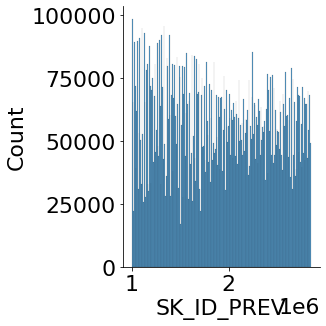

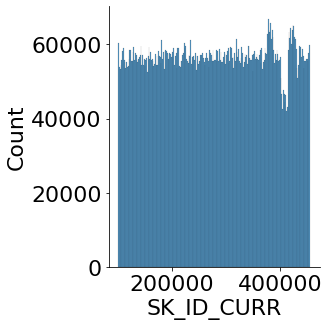

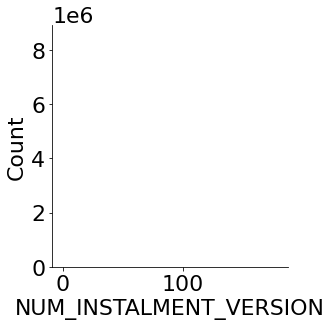

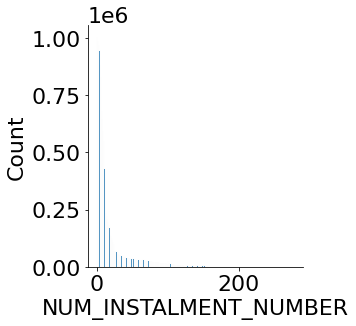

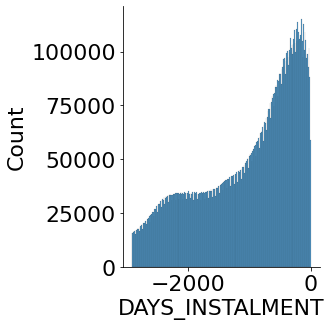

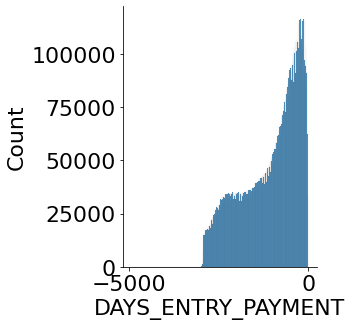

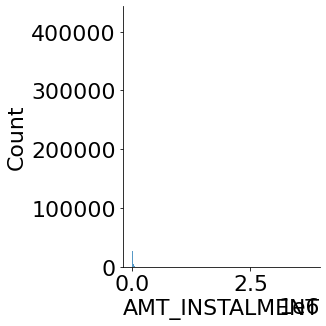

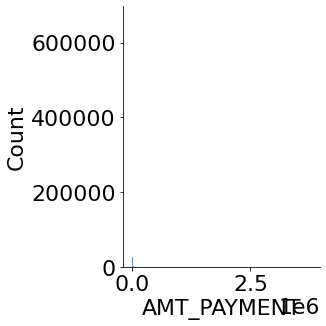

In [ ]:
observe_distribution(df_installments_payments)

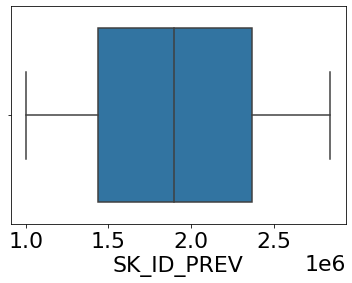

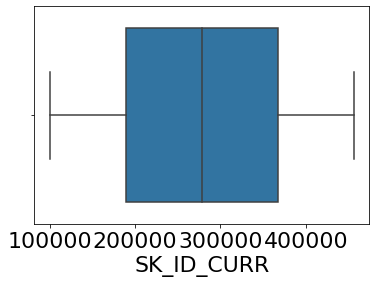

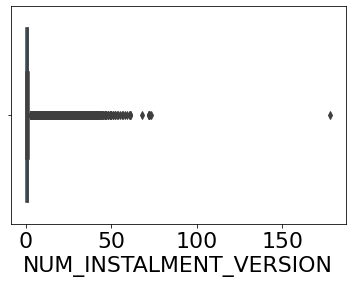

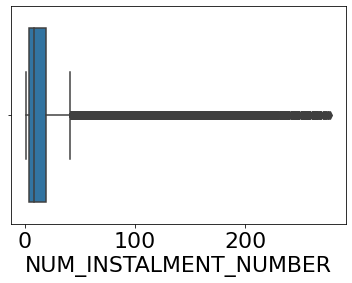

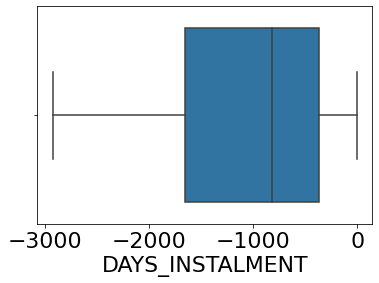

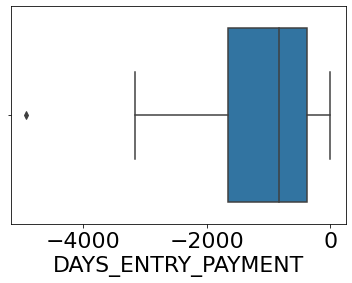

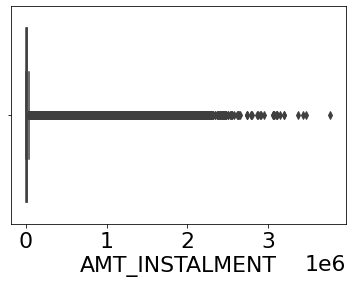

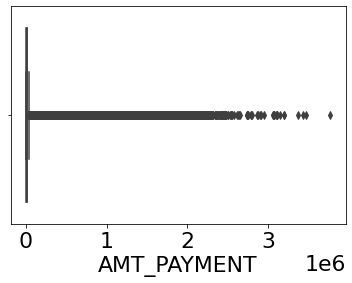

In [ ]:
observe_dispersion(df_installments_payments)

In [ ]:
observe_frequences(df_installments_payments)

In [ ]:
test_normality(df_installments_payments)

Les variables a distribution normale sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_PREV,1.430341e+07,0.0,False
SK_ID_CURR,1.175854e+07,0.0,False
NUM_INSTALMENT_VERSION,2.129841e+07,0.0,False
NUM_INSTALMENT_NUMBER,6.942210e+06,0.0,False
DAYS_INSTALMENT,1.910489e+06,0.0,False
DAYS_ENTRY_PAYMENT,1.922918e+06,0.0,False
AMT_INSTALMENT,2.705753e+07,0.0,False
AMT_PAYMENT,2.600325e+07,0.0,False


In [ ]:
df_installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1369693,100001,1.0,1,-1709.0,-1715.0,3951.00,3951.00
1,1369693,100001,1.0,2,-1679.0,-1715.0,3951.00,3951.00
2,1369693,100001,2.0,4,-1619.0,-1628.0,17397.90,17397.90
3,1369693,100001,1.0,3,-1649.0,-1660.0,3951.00,3951.00
4,1851984,100001,1.0,2,-2916.0,-2916.0,3982.05,3982.05


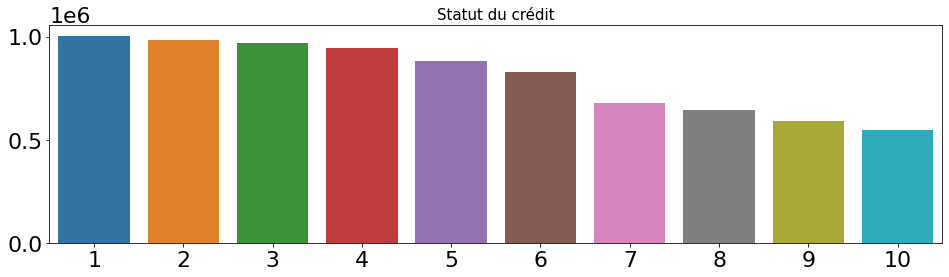

In [ ]:
# Instalment_number
create_barplot(df_installments_payments, 'NUM_INSTALMENT_NUMBER', 'SK_ID_CURR', 'Statut du crédit', rotation=0)

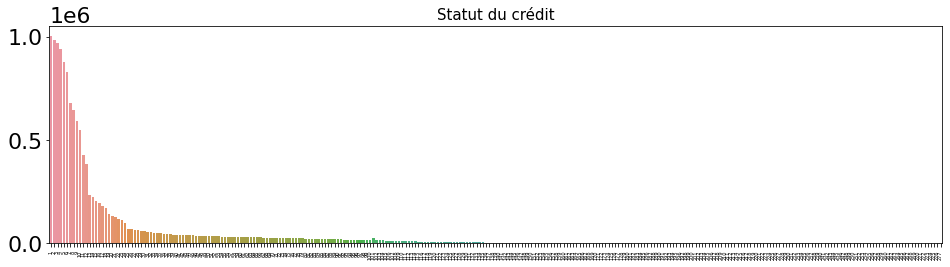

In [ ]:
# Instalment_number

instalment_number = df_installments_payments.groupby('NUM_INSTALMENT_NUMBER')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=instalment_number.index, y=instalment_number.values)
plt.xticks(rotation=90, size=5)
plt.title('Statut du crédit', size=15)
plt.xlabel('')
plt.show()

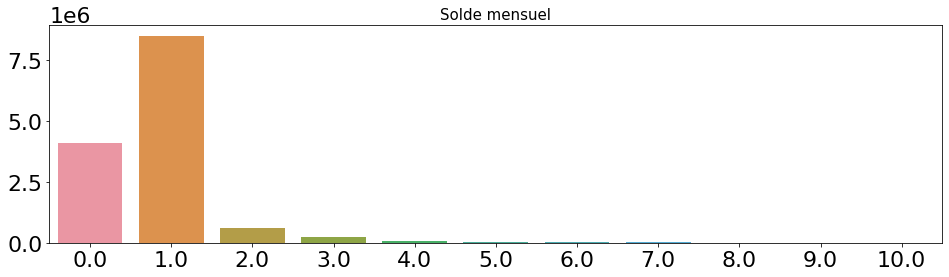

In [ ]:
# Instalment number V1
create_barplot(df_installments_payments, 'NUM_INSTALMENT_VERSION', 'SK_ID_CURR', 'Solde mensuel', rotation=0)

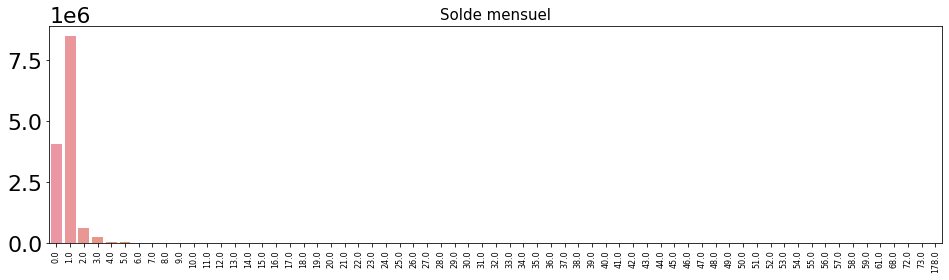

In [ ]:
# Instalment number V1

instalment_number_V1 = df_installments_payments.groupby('NUM_INSTALMENT_VERSION')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=instalment_number_V1.index, y=instalment_number_V1.values)
plt.xticks(rotation=90, size=8)
plt.title('Solde mensuel', size=15)
plt.xlabel('')
plt.show()

In [ ]:
# Print the number of clients
unique_cust_prev = df_installments_payments['SK_ID_PREV'].nunique()
print(f'Le nombre de demandes de crédit antérieur est : {unique_cust_prev}')

# Print the number of clients
unique_cust_curr = df_installments_payments['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_prev != unique_cust_curr


# When the installment of previous credit was supposed to be paid
max_days_instalment = abs(df_installments_payments['DAYS_INSTALMENT'].max())
min_days_instalment = abs(df_installments_payments['DAYS_INSTALMENT'].min())
print(f'Les crédits étaient supposés être payé entre la période d\'il y a {max_days_instalment} jours et {min_days_instalment} jours')

# When was the installments of previous credit paid actually
max_days_entry_payment = abs(df_installments_payments['DAYS_ENTRY_PAYMENT'].max())
min_days_entry_payment = abs(df_installments_payments['DAYS_ENTRY_PAYMENT'].min())
print(f'Les crédits ont été payé entre la période d\'il y a {max_days_entry_payment} jours et {min_days_entry_payment} jours')

# What was the prescribed installment amount of previous credit on this installment
max_amt_instalment = df_installments_payments['AMT_INSTALMENT'].max()
min_amt_instalment = df_installments_payments['AMT_INSTALMENT'].min()
print(f'Les montant des mensualités fixées pour le crédit précédent allaient de {min_amt_instalment} $ à {max_amt_instalment} $')

# What the client actually paid on previous credit on this installment
max_amt_payment = df_installments_payments['AMT_PAYMENT'].max()
min_amt_payment = df_installments_payments['AMT_PAYMENT'].min()
print(f'Les montant des mensualités réellement payées par le client pour le crédit précédent allaient de {min_amt_payment} $ à {max_amt_payment} $')

Le nombre de demandes de crédit antérieur est : 997752
Le nombre de demandes de crédit actuel est : 339587
Les crédits étaient supposés être payé entre la période d'il y a 1.0 jours et 2922.0 jours
Les crédits ont été payé entre la période d'il y a 1.0 jours et 4921.0 jours
Les montant des mensualités fixées pour le crédit précédent allaient de 0.0 $ à 3771487.845 $
Les montant des mensualités réellement payées par le client pour le crédit précédent allaient de 0.0 $ à 3771487.845 $


#### Filtrage des outliers

AMT_INSTALMENT

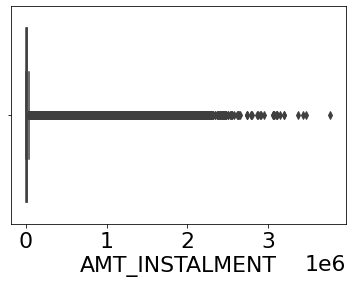

In [ ]:
sns.boxplot(df_installments_payments['AMT_INSTALMENT'])

In [ ]:
# Observe outliers for AMT_INSTALMENT
print_min_max(df_installments_payments, 'AMT_INSTALMENT')

0.0
3771487.75


In [ ]:
# Filter out outliers
df_installments_payments = delete_percentile_based_outliers(df_installments_payments, 'AMT_INSTALMENT')

diff is : 2.5
lower limit is : 73.3499984741211
upper limit is : 66734.4609375


In [ ]:
print_min_max(df_installments_payments, 'AMT_INSTALMENT')

73.3499984741211
66734.4609375


AMT_PAYMENT

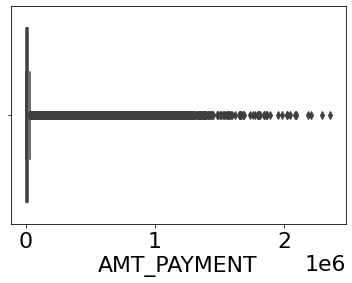

In [ ]:
sns.boxplot(df_installments_payments['AMT_PAYMENT'])

In [ ]:
# Observe outlier for AMT_PAYMENT
print_min_max(df_installments_payments, 'AMT_PAYMENT')

0.0
2357100.0


In [ ]:
# Filter out outliers
df_installments_payments = delete_percentile_based_outliers(df_installments_payments, 'AMT_PAYMENT')

diff is : 2.5
lower limit is : 105.93000030517578
upper limit is : 48635.59375


In [ ]:
print_min_max(df_installments_payments, 'AMT_PAYMENT')

105.93000030517578
48635.59375


#### Vérification des nouvelles valeurs

In [ ]:
# What was the prescribed installment amount of previous credit on this installment
max_amt_instalment = df_installments_payments['AMT_INSTALMENT'].max()
min_amt_instalment = df_installments_payments['AMT_INSTALMENT'].min()
print(f'Les montant des mensualités fixées pour le crédit précédent allaient de {min_amt_instalment} $ à {max_amt_instalment} $')

# What the client actually paid on previous credit on this installment
max_amt_payment = df_installments_payments['AMT_PAYMENT'].max()
min_amt_payment = df_installments_payments['AMT_PAYMENT'].min()
print(f'Les montant des mensualités réellement payées par le client pour le crédit précédent allaient de {min_amt_payment} $ à {max_amt_payment} $')

Les montant des mensualités fixées pour le crédit précédent allaient de 73.62000274658203 $ à 66734.4609375 $
Les montant des mensualités réellement payées par le client pour le crédit précédent allaient de 105.93000030517578 $ à 48635.59375 $


In [ ]:
observe_distribution(df_installments_payments)

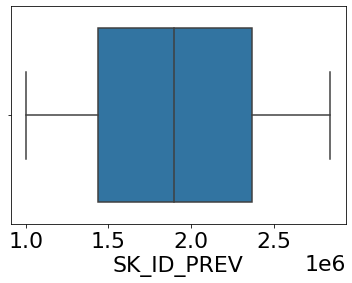

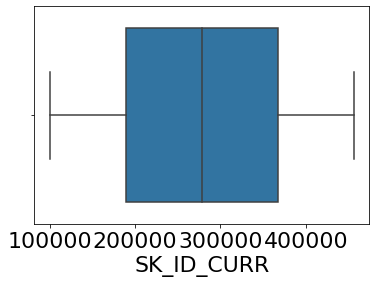

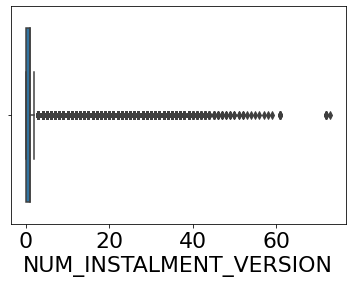

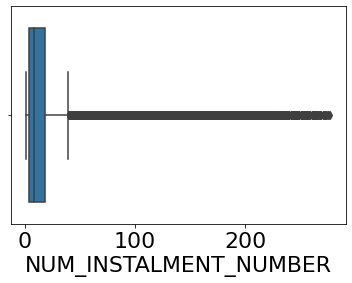

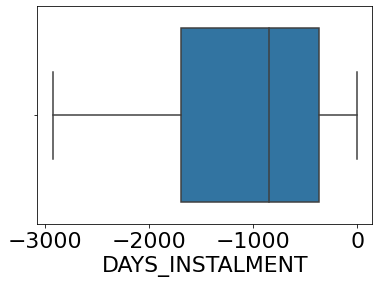

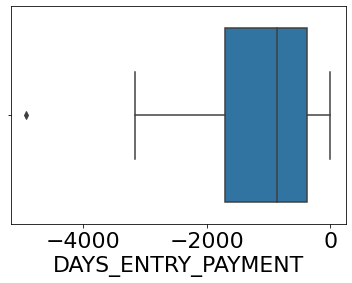

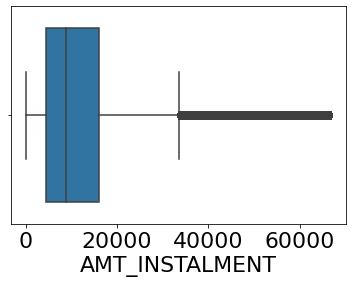

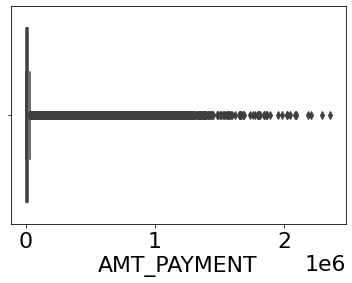

In [ ]:
observe_dispersion(df_installments_payments)

### df_POS_CASH_balance

In [ ]:
df_POS_CASH_balance.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


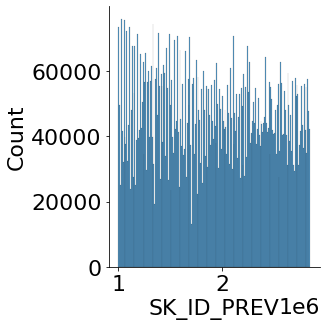

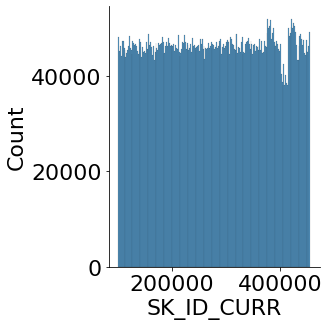

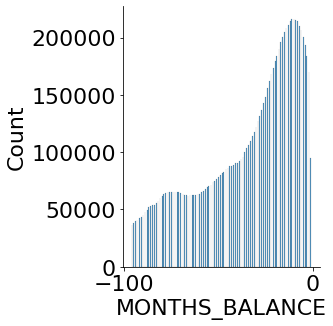

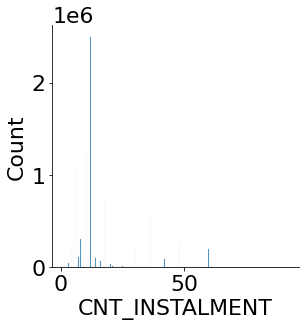

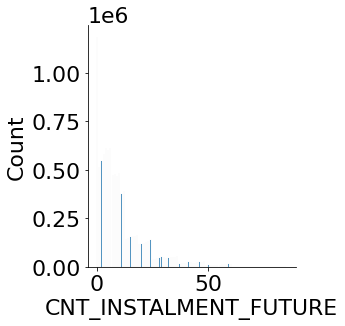

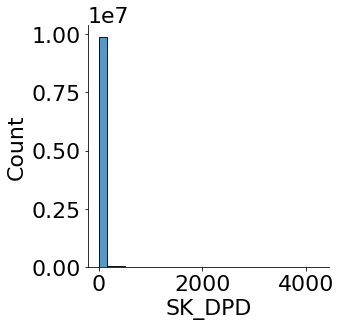

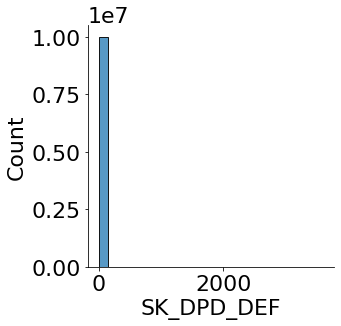

In [ ]:
observe_distribution(df_POS_CASH_balance)

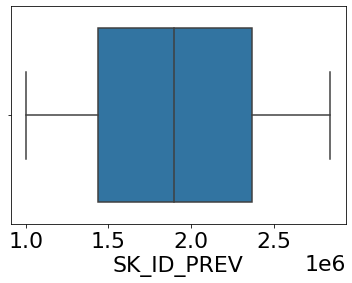

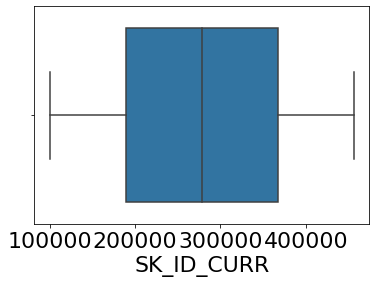

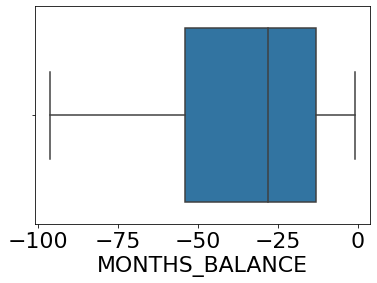

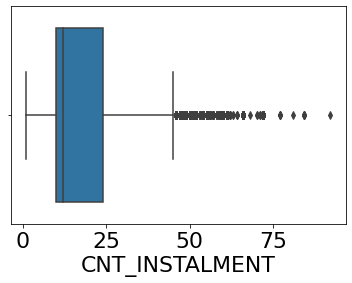

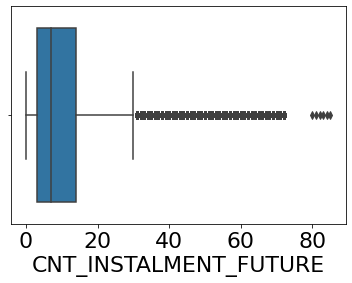

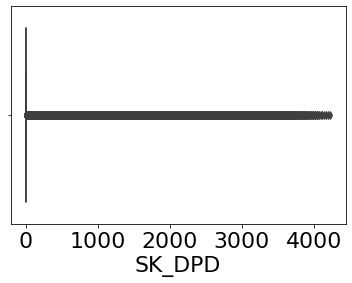

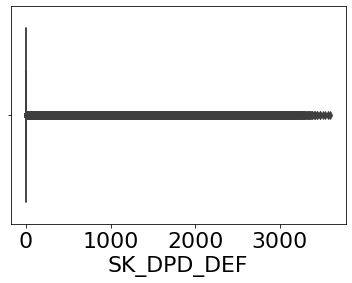

In [ ]:
observe_dispersion(df_POS_CASH_balance)

In [ ]:
observe_frequences(df_POS_CASH_balance)

    NAME_CONTRACT_STATUS        n             f         F
0                 Active  9151119  9.149876e-01  0.914988
6         Amortized debt      636  6.359136e-05  0.915051
5               Approved     4917  4.916332e-04  0.915543
7               Canceled       15  1.499796e-06  0.915544
1              Completed   744883  7.447819e-02  0.990023
3                 Demand     7065  7.064041e-04  0.990729
4  Returned to the store     5461  5.460258e-04  0.991275
2                 Signed    87260  8.724815e-03  1.000000
8                    XNA        2  1.999728e-07  1.000000


In [ ]:
test_normality(df_POS_CASH_balance)

Les variables a distribution normale sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_PREV,1.041105e+07,0.0,False
SK_ID_CURR,8.629657e+06,0.0,False
MONTHS_BALANCE,1.183858e+06,0.0,False
CNT_INSTALMENT,2.827728e+06,0.0,False
CNT_INSTALMENT_FUTURE,3.533732e+06,0.0,False
SK_DPD,1.894352e+07,0.0,False
SK_DPD_DEF,3.462685e+07,0.0,False


In [ ]:
df_POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1369693,100001,-53,4.0,0.0,Completed,0,0
1,1369693,100001,-54,4.0,1.0,Active,0,0
2,1369693,100001,-57,4.0,4.0,Active,0,0
3,1369693,100001,-55,4.0,2.0,Active,0,0
4,1369693,100001,-56,4.0,3.0,Active,0,0


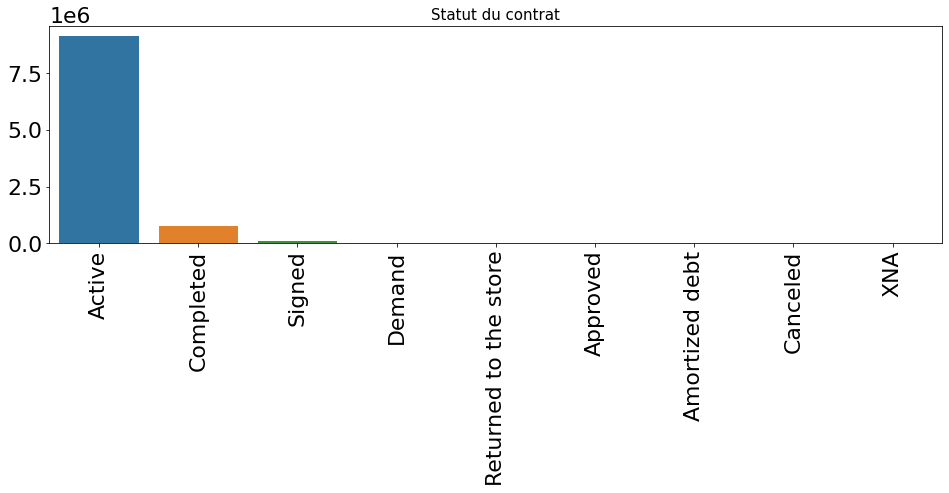

In [ ]:
# Status
create_barplot(df_POS_CASH_balance, 'NAME_CONTRACT_STATUS', 'SK_ID_CURR', 'Statut du contrat', rotation=90)

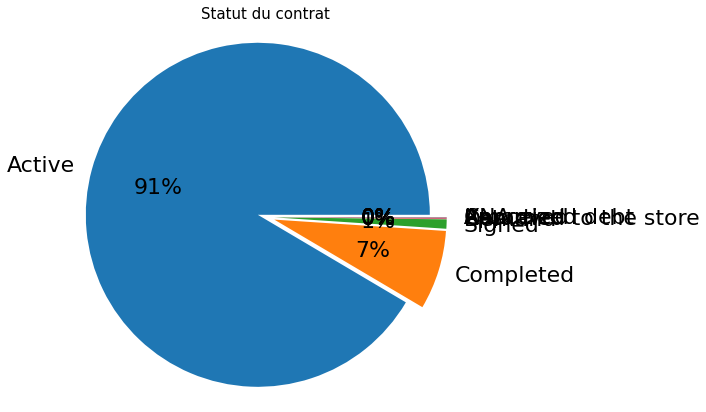

In [ ]:
# Status
create_pieplot(df_POS_CASH_balance, 'NAME_CONTRACT_STATUS', 'SK_ID_CURR', 'Statut du contrat')

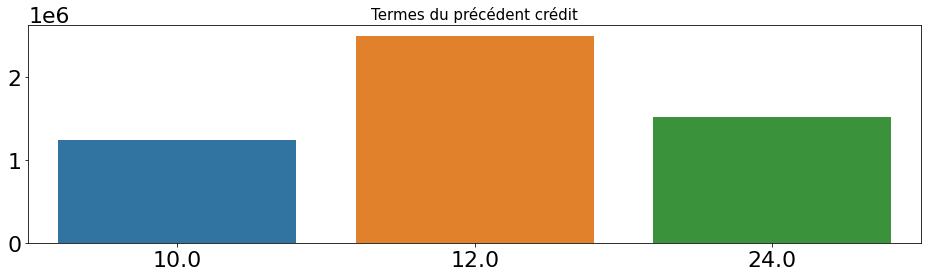

In [ ]:
# Term of previous credit : cnt instalment
create_barplot(df_POS_CASH_balance, 'CNT_INSTALMENT', 'SK_ID_CURR', 'Termes du précédent crédit', rotation=0)

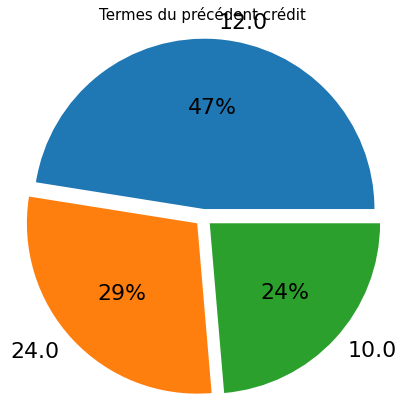

In [ ]:
# Term of previous credit : cnt instalment
create_pieplot(df_POS_CASH_balance, 'CNT_INSTALMENT', 'SK_ID_CURR', 'Termes du précédent crédit')

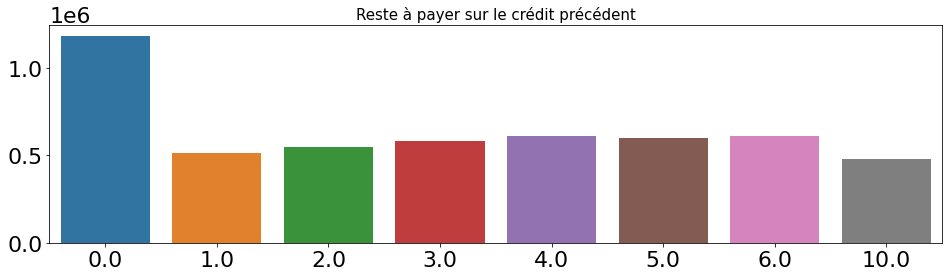

In [ ]:
# Installments left to pay on the previous credit : Cnt instalment future
create_barplot(df_POS_CASH_balance, 'CNT_INSTALMENT_FUTURE', 'SK_ID_CURR', 'Reste à payer sur le crédit précédent', rotation=0)

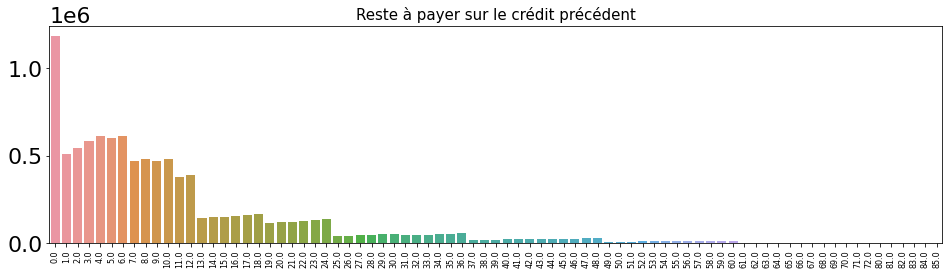

In [ ]:
# Installments left to pay on the previous credit : Cnt instalment future

cnt_instalment_future = df_POS_CASH_balance.groupby('CNT_INSTALMENT_FUTURE')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=cnt_instalment_future.index, y=cnt_instalment_future.values)
plt.xticks(rotation=90, size=8)
plt.title('Reste à payer sur le crédit précédent', size=15)
plt.xlabel('')
plt.show()

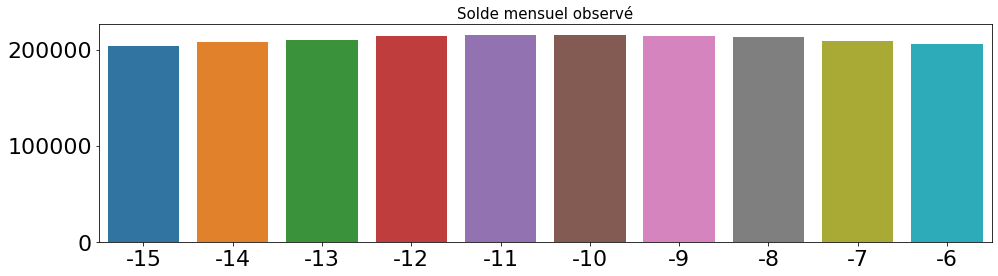

In [ ]:
# Months balance
create_barplot(df_POS_CASH_balance, 'MONTHS_BALANCE', 'SK_ID_CURR', 'Solde mensuel observé', rotation=0)

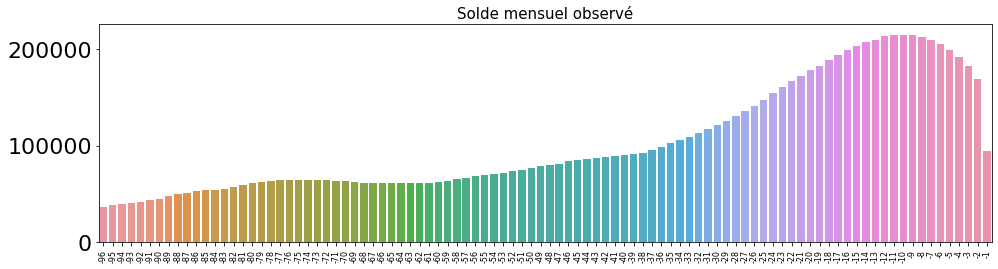

In [ ]:
# Months balance

months_balance = df_POS_CASH_balance.groupby('MONTHS_BALANCE')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=months_balance.index, y=months_balance.values)
plt.xticks(rotation=90, size=8)
plt.title('Solde mensuel observé', size=15)
plt.xlabel('')
plt.show()

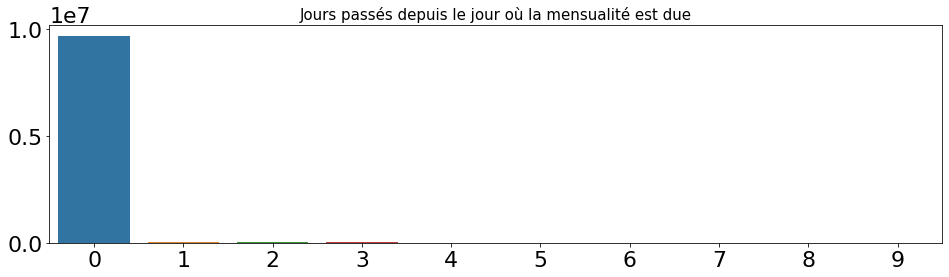

In [ ]:
# DPD (days past due)
create_barplot(df_POS_CASH_balance, 'SK_DPD', 'SK_ID_CURR', 'Jours passés depuis le jour où la mensualité est due', rotation=0)

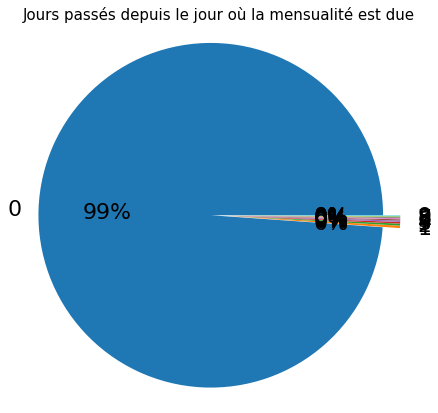

In [ ]:
# DPD (days past due)
create_pieplot(df_POS_CASH_balance, 'SK_DPD', 'SK_ID_CURR', 'Jours passés depuis le jour où la mensualité est due')

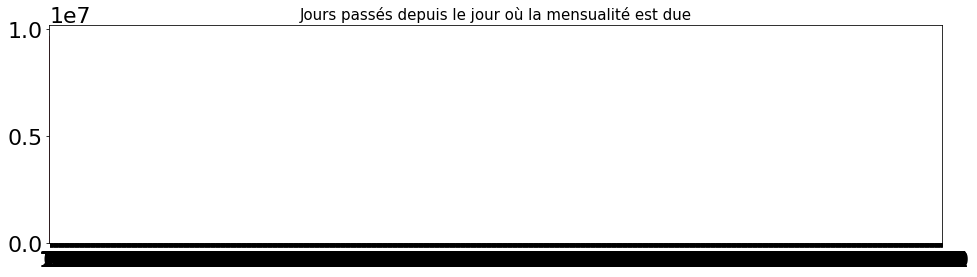

In [ ]:
# DPD (days past due)

dpd = df_POS_CASH_balance.groupby('SK_DPD')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=dpd.index, y=dpd.values)
plt.xticks()
plt.title('Jours passés depuis le jour où la mensualité est due', size=15)
plt.xlabel('')
plt.show()

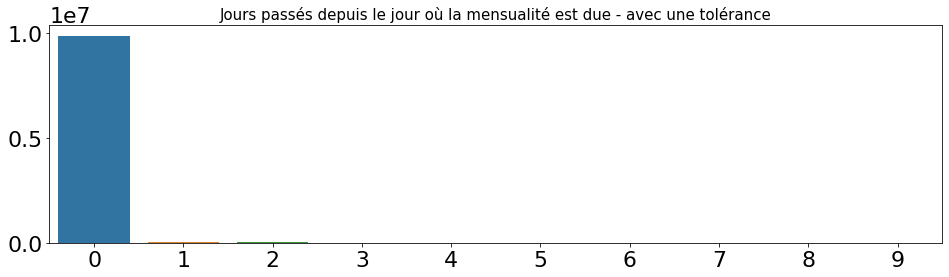

In [ ]:
# SK_DPD_DEF (days past due)
create_barplot(df_POS_CASH_balance, 'SK_DPD_DEF', 'SK_ID_CURR', 'Jours passés depuis le jour où la mensualité est due - avec une tolérance', rotation=0)

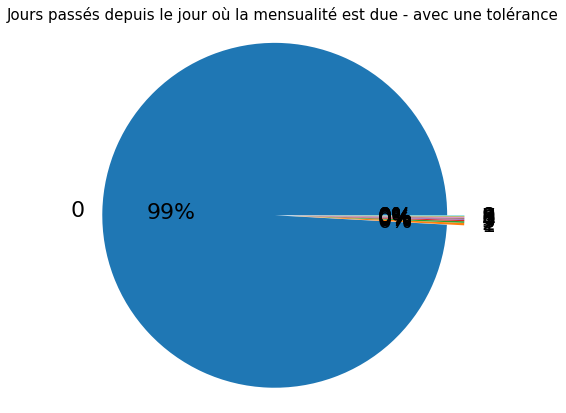

In [ ]:
# SK_DPD_DEF (days past due)
create_pieplot(df_POS_CASH_balance, 'SK_DPD_DEF', 'SK_ID_CURR', 'Jours passés depuis le jour où la mensualité est due - avec une tolérance')

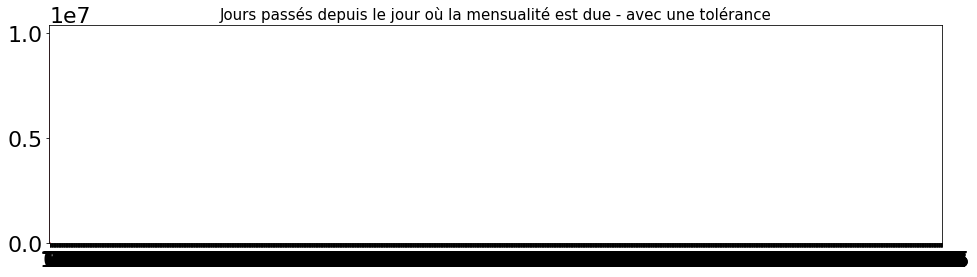

In [ ]:
# SK_DPD_DEF (days past due)

dpd_with_tolerance = df_POS_CASH_balance.groupby('SK_DPD_DEF')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=dpd_with_tolerance.index, y=dpd_with_tolerance.values)
plt.xticks()
plt.title('Jours passés depuis le jour où la mensualité est due - avec une tolérance', size=15)
plt.xlabel('')
plt.show()

In [ ]:
# Print the number of clients
unique_cust_prev = df_POS_CASH_balance['SK_ID_PREV'].nunique()
print(f'Le nombre de demandes de crédit antérieur est : {unique_cust_prev}')

# Print the number of clients
unique_cust_curr = df_POS_CASH_balance['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_prev != unique_cust_curr


# Months balance
max_months_balance = df_POS_CASH_balance['MONTHS_BALANCE'].max()
min_months_balance = df_POS_CASH_balance['MONTHS_BALANCE'].min()
print(f'Le solde du mois observé va de {min_months_balance} à {max_months_balance}')

# For how much credit did client ask on the previous application
max_cnt_instalment = df_POS_CASH_balance['CNT_INSTALMENT'].max()
min_cnt_instalment = df_POS_CASH_balance['CNT_INSTALMENT'].min()
print(f'Les termes du précédent crédit vont de {min_cnt_instalment} $?? à {max_cnt_instalment} $??')

# Credit amount of the loan
max_cnt_instalment_future = df_POS_CASH_balance['CNT_INSTALMENT_FUTURE'].max()
min_cnt_instalment_future = df_POS_CASH_balance['CNT_INSTALMENT_FUTURE'].min()
print(f'Le reste à payer sur le crédit précédent va de {min_cnt_instalment_future} $ à {max_cnt_instalment_future} $')

# Days past due
max_sk_dpd= df_POS_CASH_balance['SK_DPD'].max()
min_sk_dpd = df_POS_CASH_balance['SK_DPD'].min()
print(f'Le temps passé depuis le jour où la mensualité est due va de {min_sk_dpd} jours à {max_sk_dpd} jours')

# Days past due with tolerance
max_sk_dpd_def = df_POS_CASH_balance['SK_DPD_DEF'].max()
min_sk_dpd_def = df_POS_CASH_balance['SK_DPD_DEF'].min()
print(f'Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de {min_sk_dpd_def} jours à {max_sk_dpd_def} jours')

Le nombre de demandes de crédit antérieur est : 936325
Le nombre de demandes de crédit actuel est : 337252
Le solde du mois observé va de -96 à -1
Les termes du précédent crédit vont de 1.0 $?? à 92.0 $??
Le reste à payer sur le crédit précédent va de 0.0 $ à 85.0 $
Le temps passé depuis le jour où la mensualité est due va de 0 jours à 4231 jours
Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de 0 jours à 3595 jours


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'SK_DPD']

,Unnamed: 0,Table,Row,Description,Special
148,151,POS_CASH_balance.csv,SK_DPD,DPD (days past due) during the month of previous credit,NaN
171,174,credit_card_balance.csv,SK_DPD,DPD (Days past due) during the month on the previous credit,NaN


#### Filtrage des outliers

SK_DPD

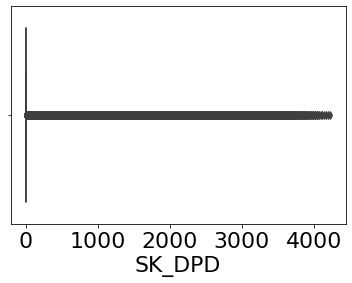

In [ ]:
sns.boxplot(df_POS_CASH_balance['SK_DPD'])

In [ ]:
print_min_max(df_POS_CASH_balance, 'SK_DPD')

0
4231


In [ ]:
# Filter out outliers
#df_POS_CASH_balance = delete_percentile_based_outliers(df_POS_CASH_balance, 'SK_DPD')

In [ ]:
delete_percentile_based_outliers(df_POS_CASH_balance, 'SK_DPD')

diff is : 2.5
lower limit is : 0.0
upper limit is : 3.0


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1369693,100001,-53,4.0,0.0,Completed,0,0
1,1369693,100001,-54,4.0,1.0,Active,0,0
2,1369693,100001,-57,4.0,4.0,Active,0,0
3,1369693,100001,-55,4.0,2.0,Active,0,0
4,1369693,100001,-56,4.0,3.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2631384,456255,-21,36.0,31.0,Active,0,0
10001354,2729207,456255,-15,6.0,5.0,Active,0,0
10001355,2729207,456255,-16,6.0,6.0,Active,0,0
10001356,2729207,456255,-13,3.0,0.0,Completed,0,0


In [ ]:
print_min_max(df_POS_CASH_balance, 'SK_DPD')

0
4231


SK_DPD_DEF

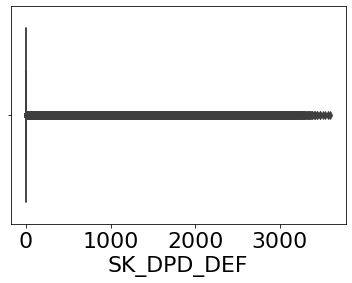

In [ ]:
sns.boxplot(df_POS_CASH_balance['SK_DPD_DEF'])

In [ ]:
print_min_max(df_POS_CASH_balance, 'SK_DPD_DEF')

0
3595


#### Vérification des nouvelles valeurs

In [ ]:
# Days past due
max_sk_dpd= df_POS_CASH_balance['SK_DPD'].max()
min_sk_dpd = df_POS_CASH_balance['SK_DPD'].min()
print(f'Le temps passé depuis le jour où la mensualité est due va de {min_sk_dpd} jours à {max_sk_dpd} jours')

# Days past due with tolerance
max_sk_dpd_def = df_POS_CASH_balance['SK_DPD_DEF'].max()
min_sk_dpd_def = df_POS_CASH_balance['SK_DPD_DEF'].min()
print(f'Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de {min_sk_dpd_def} jours à {max_sk_dpd_def} jours')

Le temps passé depuis le jour où la mensualité est due va de 0 jours à 4231 jours
Le temps passé depuis le jour où la mensualité est due, avec une tolérance, va de 0 jours à 3595 jours


In [ ]:
observe_distribution(df_POS_CASH_balance)

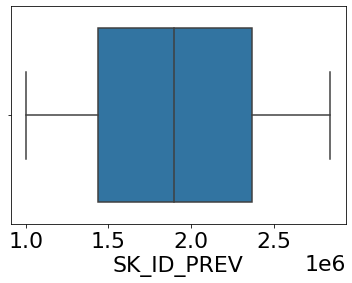

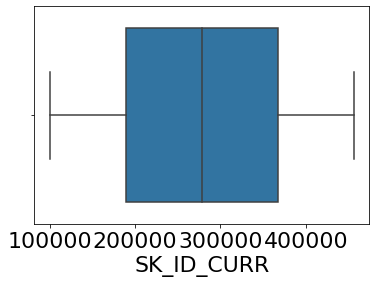

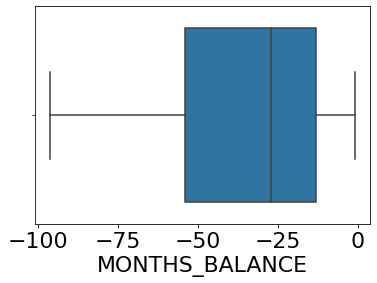

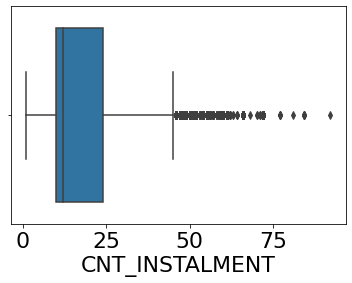

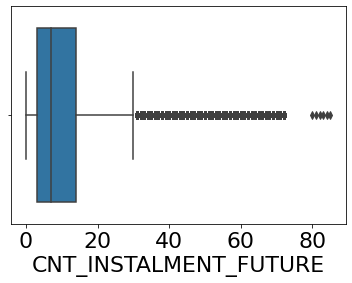

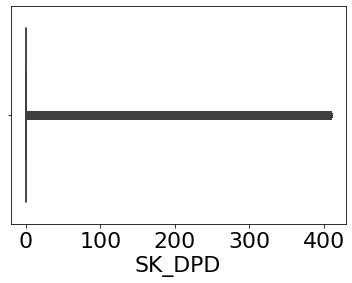

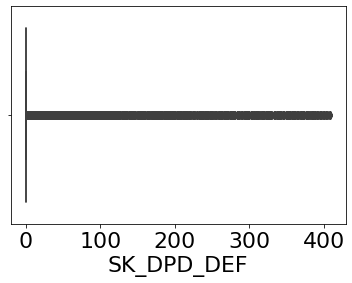

In [ ]:
observe_dispersion(df_POS_CASH_balance)

In [ ]:
observe_frequences(df_POS_CASH_balance)

    NAME_CONTRACT_STATUS        n             f         F
0                 Active  9081627  9.156649e-01  0.915665
6         Amortized debt       44  4.436348e-06  0.915669
4               Approved     4917  4.957619e-04  0.916165
7               Canceled       15  1.512391e-06  0.916167
1              Completed   734900  7.409709e-02  0.990264
5                 Demand     3842  3.873738e-04  0.990651
3  Returned to the store     5461  5.506113e-04  0.991202
2                 Signed    87260  8.798084e-03  1.000000
8                    XNA        2  2.016522e-07  1.000000


### df_previous_application

In [ ]:
df_previous_application.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


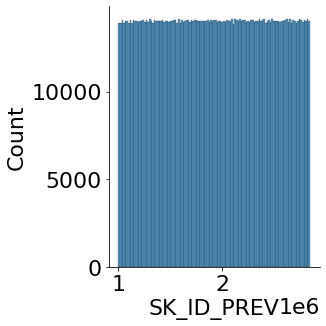

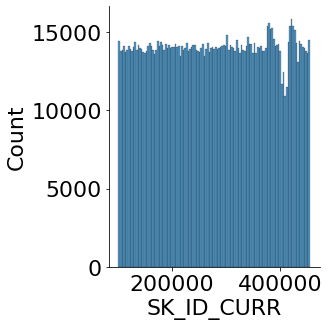

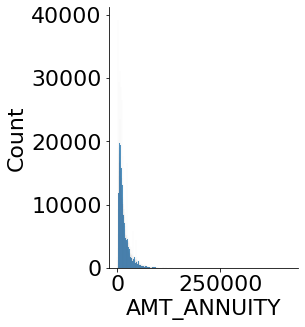

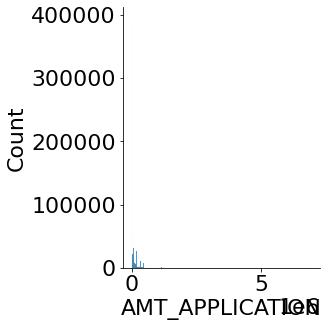

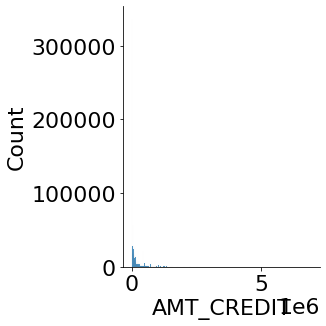

...

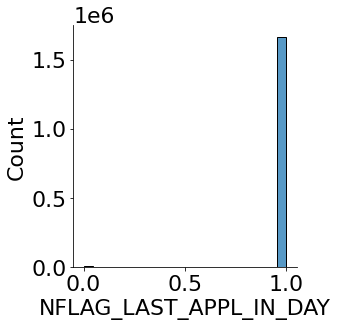

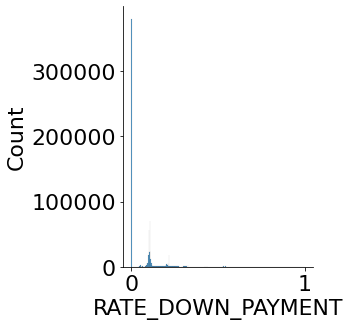

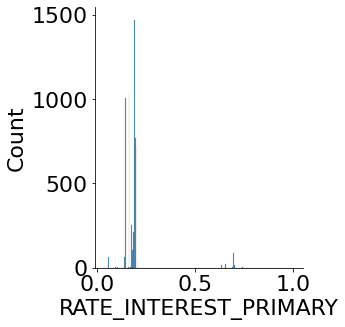

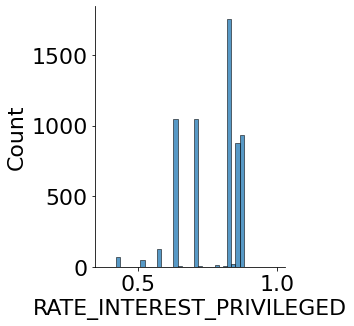

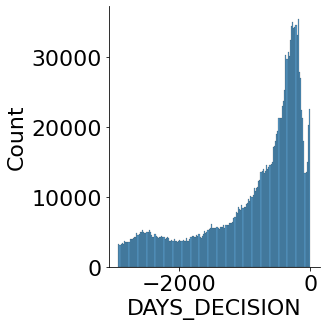

In [ ]:
observe_distribution(df_previous_application)

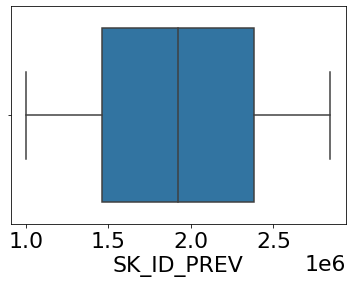

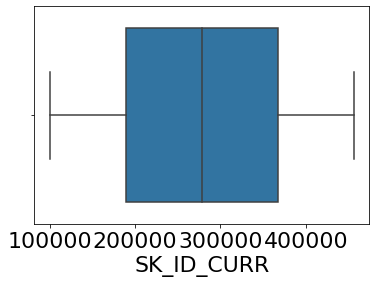

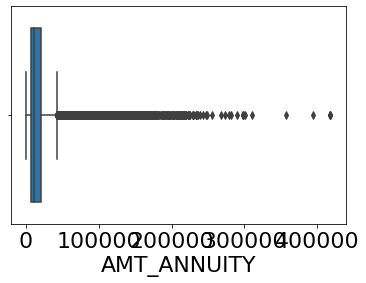

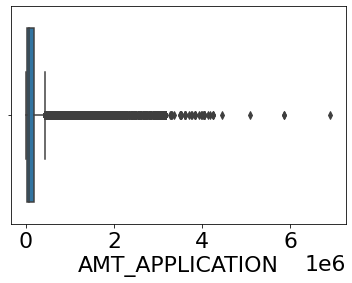

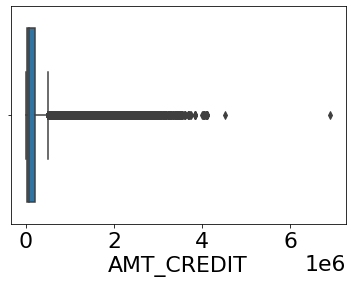

...

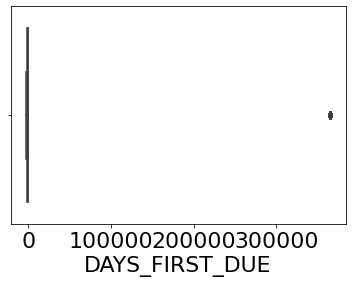

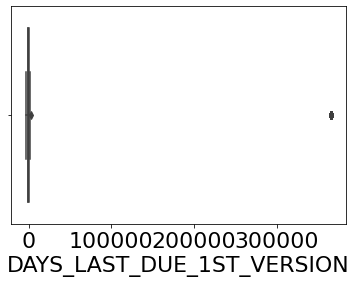

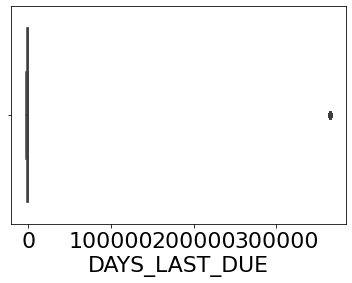

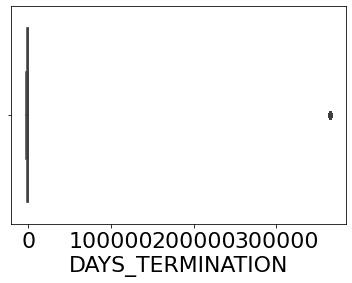

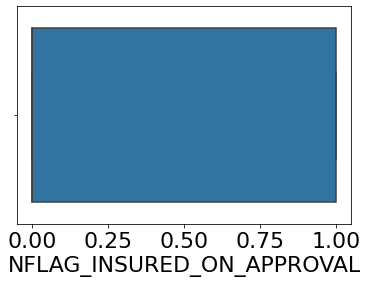

In [ ]:
observe_dispersion(df_previous_application)

In [ ]:
observe_frequences(df_previous_application)

  NAME_CONTRACT_TYPE       n         f         F
0         Cash loans  747553  0.447579  0.447579
1     Consumer loans  729151  0.436561  0.884141
2    Revolving loans  193164  0.115652  0.999793
3                XNA     346  0.000207  1.000000
  WEEKDAY_APPR_PROCESS_START       n         f         F
3                     FRIDAY  252048  0.150908  0.150908
2                     MONDAY  253557  0.151811  0.302719
5                   SATURDAY  240631  0.144072  0.446791
6                     SUNDAY  164751  0.098641  0.545431
4                   THURSDAY  249099  0.149142  0.694573
0                    TUESDAY  255118  0.152746  0.847319
1                  WEDNESDAY  255010  0.152681  1.000000
  FLAG_LAST_APPL_PER_CONTRACT        n         f         F
1                           N     8475  0.005074  0.005074
0                           Y  1661739  0.994926  1.000000
              NAME_CASH_LOAN_PURPOSE       n         f         F
6       Building a house or an annex    2693  0.001612  0

In [ ]:
test_normality(df_previous_application)

Les variables a distribution normale sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_PREV,1.480337e+06,0.000000e+00,False
SK_ID_CURR,1.473560e+06,0.000000e+00,False
AMT_ANNUITY,8.034011e+05,0.000000e+00,False
AMT_APPLICATION,1.208292e+06,0.000000e+00,False
AMT_CREDIT,1.157896e+06,0.000000e+00,False
AMT_DOWN_PAYMENT,2.176441e+06,0.000000e+00,False
AMT_GOODS_PRICE,8.465545e+05,0.000000e+00,False
HOUR_APPR_PROCESS_START,7.484556e+03,0.000000e+00,False
NFLAG_LAST_APPL_IN_DAY,3.330088e+06,0.000000e+00,False
RATE_DOWN_PAYMENT,3.413407e+05,0.000000e+00,False


In [ ]:
df_previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,1369693,100001,Consumer loans,3951.000,24835.5,23787.0,2520.0,24835.5,FRIDAY,13,Y,1,0.104326,NaN,NaN,XAP,Approved,-1740,Cash through the bank,XAP,Family,Refreshed,Mobile,POS,XNA,Country-wide,23,Connectivity,8.0,high,POS mobile with interest,365243.0,-1709.0,-1499.0,-1619.0,-1612.0,0.0
1,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
2,1810518,100003,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12,Y,1,NaN,NaN,NaN,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
3,2396755,100003,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,SATURDAY,15,Y,1,0.100061,NaN,NaN,XAP,Approved,-2341,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,2636178,100003,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.000000,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0


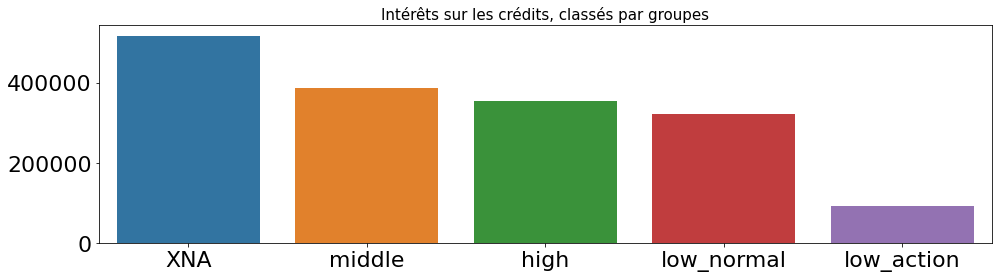

In [ ]:
# Grouped interest rate : Yield group
create_barplot(df_previous_application, 'NAME_YIELD_GROUP', 'SK_ID_CURR', 'Intérêts sur les crédits, classés par groupes', rotation=0)

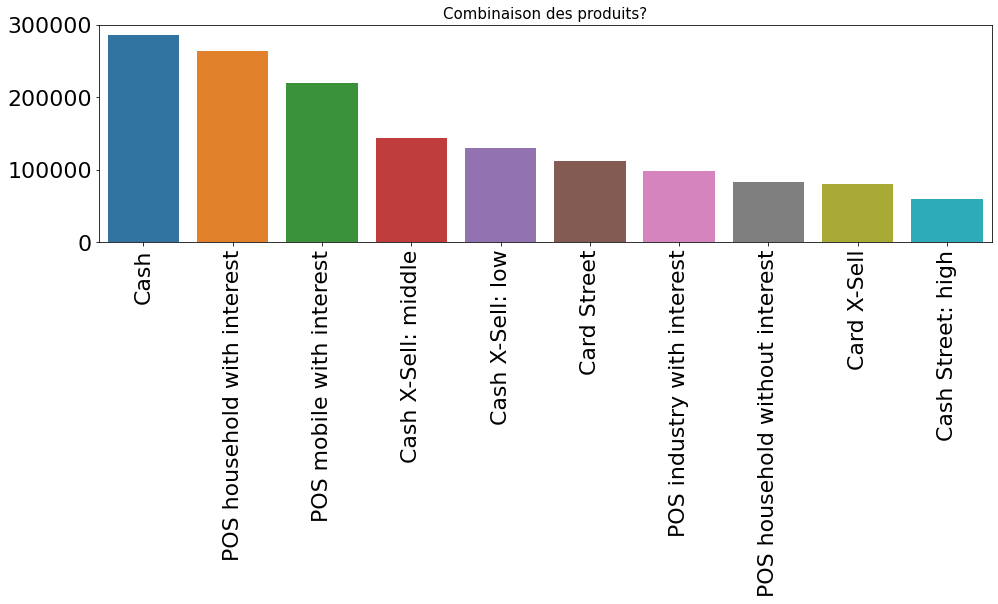

In [ ]:
# Product combination
create_barplot(df_previous_application, 'PRODUCT_COMBINATION', 'SK_ID_CURR', 'Combinaison des produits?', rotation=90)

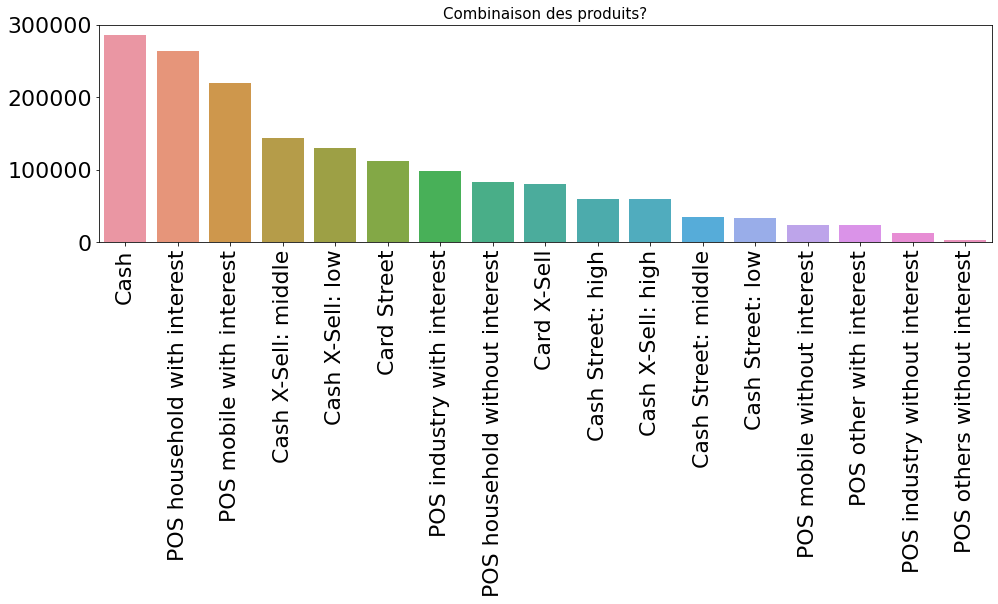

In [ ]:
# Product combination

product_combination = df_previous_application.groupby('PRODUCT_COMBINATION')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=product_combination.index, y=product_combination.values)
plt.xticks(rotation=90)
plt.title('Combinaison des produits?', size=15)
plt.xlabel('')
plt.show()

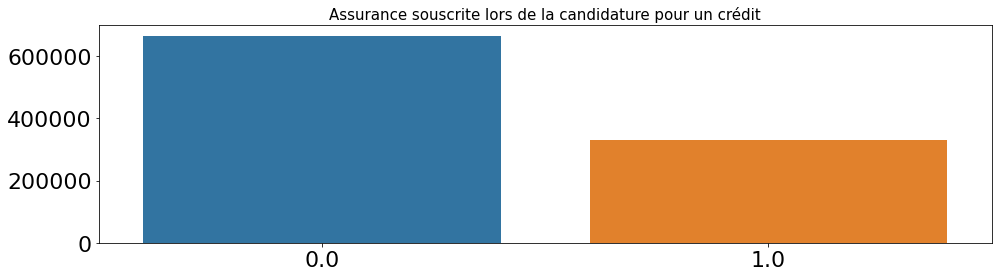

In [ ]:
# Insured on approval : Did the client requested insurance during the previous application
create_barplot(df_previous_application, 'NFLAG_INSURED_ON_APPROVAL', 'SK_ID_CURR', 'Assurance souscrite lors de la candidature pour un crédit', rotation=0)

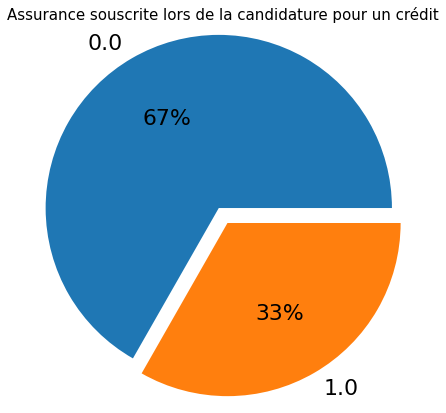

In [ ]:
# Insured on approval : Did the client requested insurance during the previous application
create_pieplot(df_previous_application, 'NFLAG_INSURED_ON_APPROVAL', 'SK_ID_CURR', 'Assurance souscrite lors de la candidature pour un crédit')

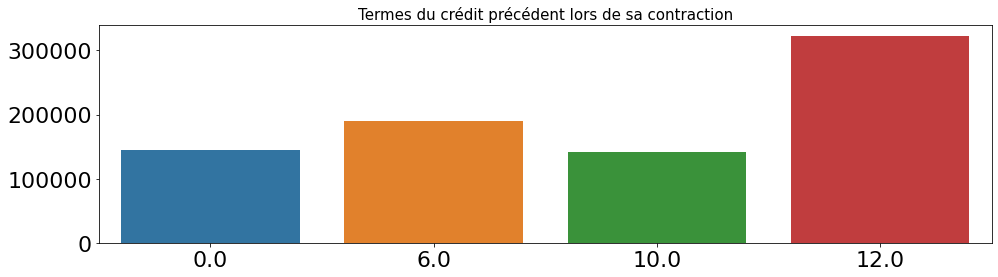

In [ ]:
# Cnt payment : Term of previous credit at application of the previous application
create_barplot(df_previous_application, 'CNT_PAYMENT', 'SK_ID_CURR', 'Termes du crédit précédent lors de sa contraction', rotation=0)

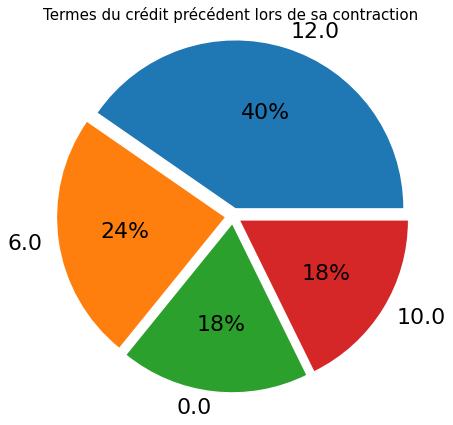

In [ ]:
# Cnt payment : Term of previous credit at application of the previous application
create_pieplot(df_previous_application, 'CNT_PAYMENT', 'SK_ID_CURR', 'Termes du crédit précédent lors de sa contraction')

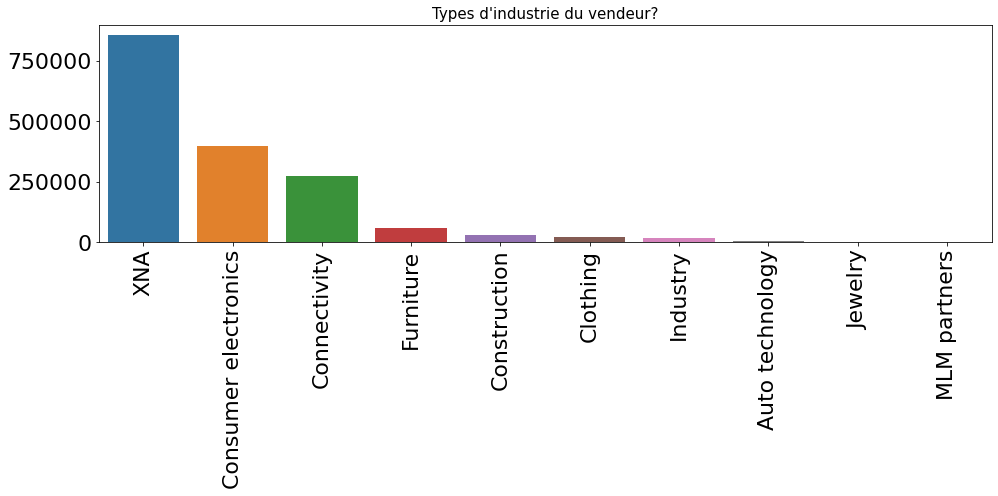

In [ ]:
# The industry of the seller
create_barplot(df_previous_application, 'NAME_SELLER_INDUSTRY', 'SK_ID_CURR', 'Types d\'industrie du vendeur?', rotation=90)

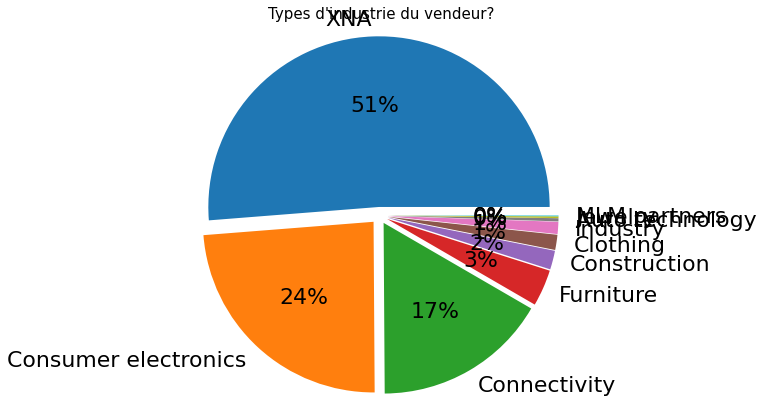

In [ ]:
# The industry of the seller
create_pieplot(df_previous_application, 'NAME_SELLER_INDUSTRY', 'SK_ID_CURR', 'Types d\'industrie du vendeur?')

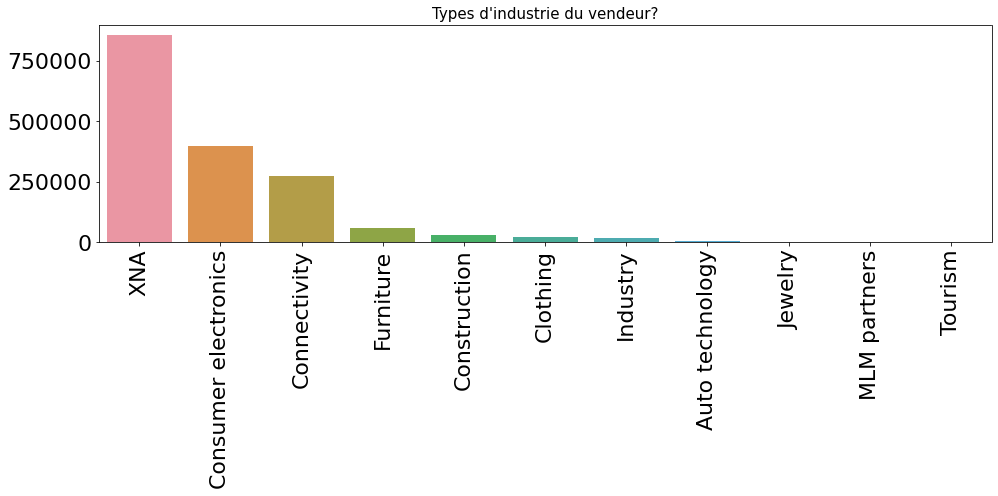

In [ ]:
# The industry of the seller

industry_of_seller = df_previous_application.groupby('NAME_SELLER_INDUSTRY')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=industry_of_seller.index, y=industry_of_seller.values)
plt.xticks(rotation=90)
plt.title('Types d\'industrie du vendeur?', size=15)
plt.xlabel('')
plt.show()

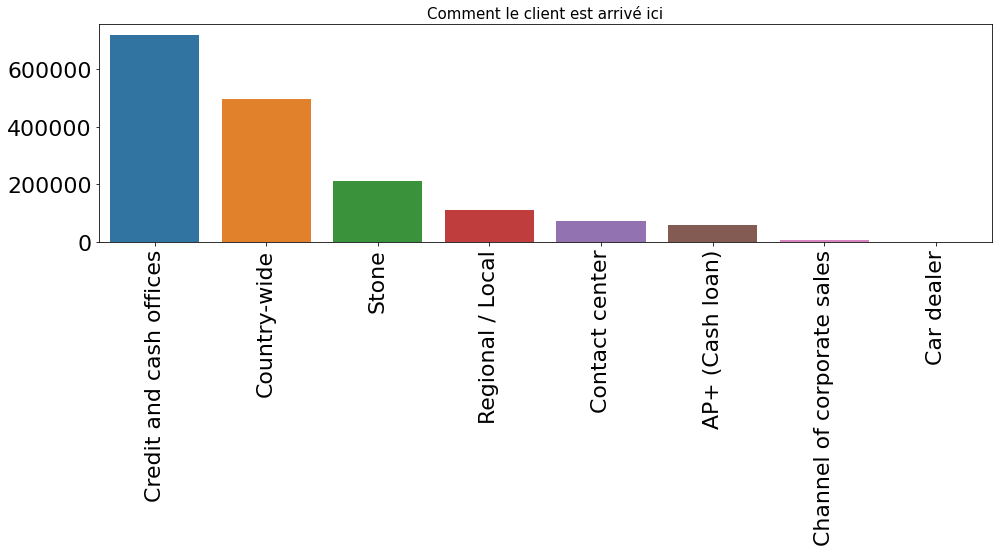

In [ ]:
# Through which channel we acquired the client
create_barplot(df_previous_application, 'CHANNEL_TYPE', 'SK_ID_CURR', 'Comment le client est arrivé ici', rotation=90)

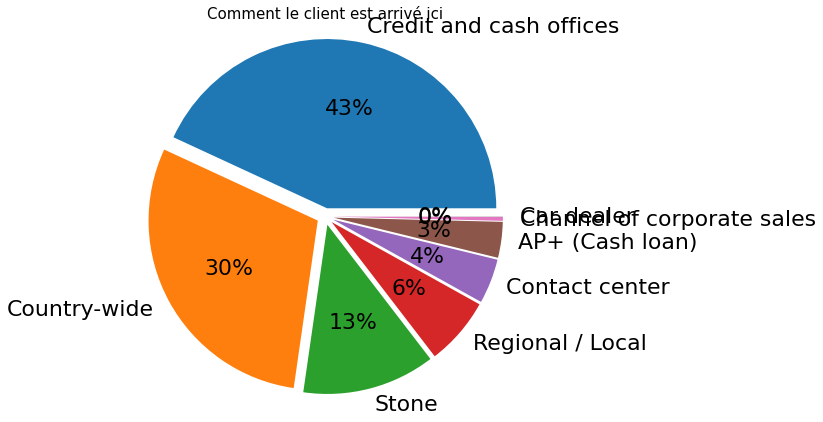

In [ ]:
# Through which channel we acquired the client
create_pieplot(df_previous_application, 'CHANNEL_TYPE', 'SK_ID_CURR', 'Comment le client est arrivé ici')

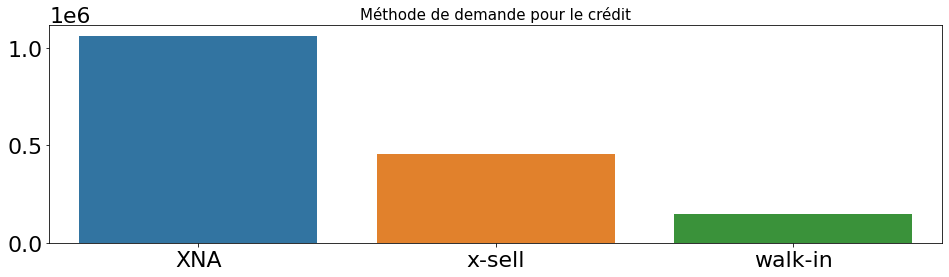

In [ ]:
# Was the previous application x-sell o walk-in

method_of_application = df_previous_application.groupby('NAME_PRODUCT_TYPE')['SK_ID_CURR'].count().sort_values(ascending=False)[:10]

plt.figure(figsize=(16,4))
sns.barplot(x=method_of_application.index, y=method_of_application.values)
plt.xticks()
plt.title('Méthode de demande pour le crédit', size=15)
plt.xlabel('')
plt.show()

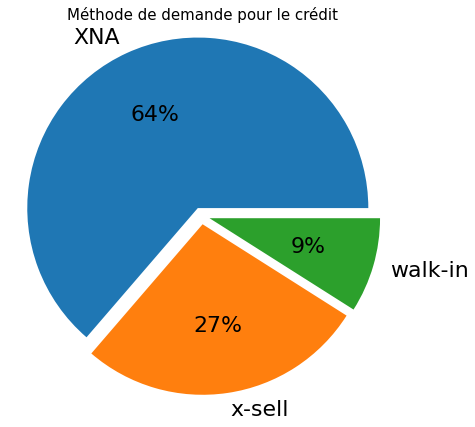

In [ ]:
# Was the previous application x-sell o walk-in
create_pieplot(df_previous_application, 'NAME_PRODUCT_TYPE', 'SK_ID_CURR', 'Méthode de demande pour le crédit')

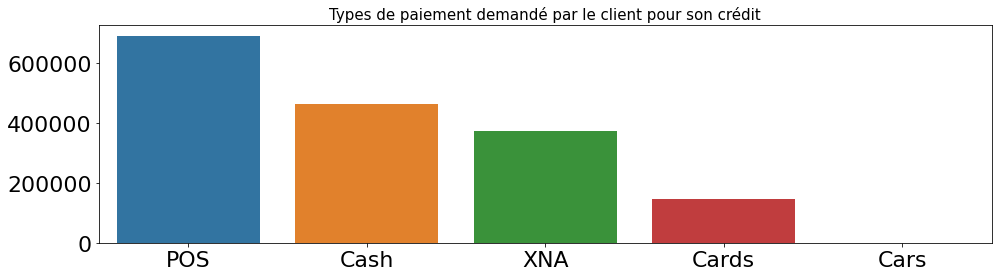

In [ ]:
# Was the previous application for : CASH, POS, CAR,

type_of_credit_asked = df_previous_application.groupby('NAME_PORTFOLIO')['SK_ID_CURR'].count().sort_values(ascending=False)[:10]

plt.figure(figsize=(16,4))
sns.barplot(x=type_of_credit_asked.index, y=type_of_credit_asked.values)
plt.xticks()
plt.title('Types de paiement demandé par le client pour son crédit', size=15)
plt.xlabel('')
plt.show()

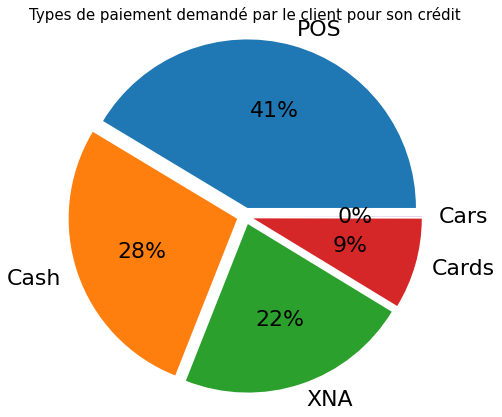

In [ ]:
# Was the previous application for : CASH, POS, CAR,
create_pieplot(df_previous_application, 'NAME_PORTFOLIO', 'SK_ID_CURR', 'Types de paiement demandé par le client pour son crédit')

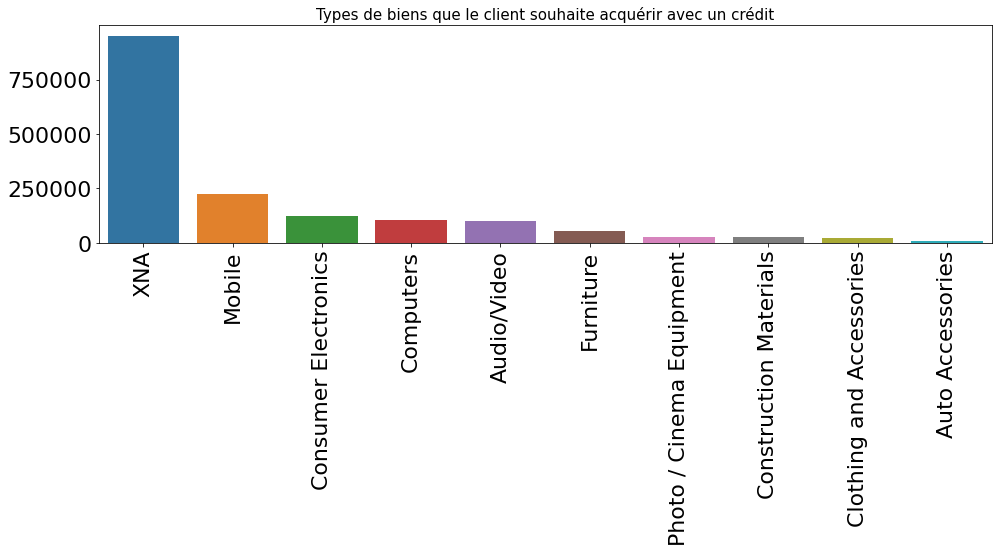

In [ ]:
# What kind of goods did the client apply for
create_barplot(df_previous_application, 'NAME_GOODS_CATEGORY', 'SK_ID_CURR', 'Types de biens que le client souhaite acquérir avec un crédit')

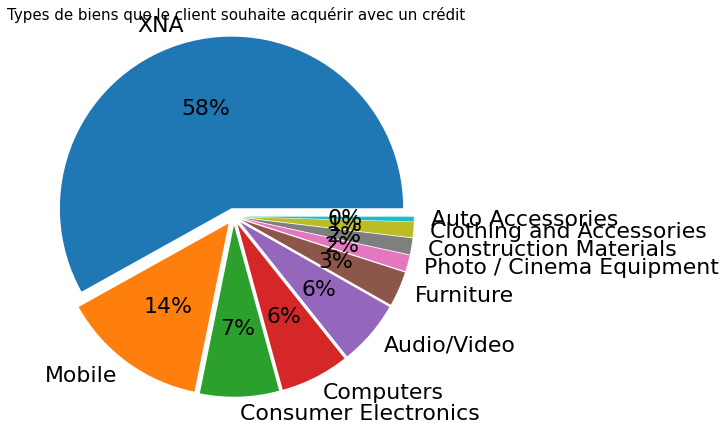

In [ ]:
# What kind of goods did the client apply for
create_pieplot(df_previous_application, 'NAME_GOODS_CATEGORY', 'SK_ID_CURR', 'Types de biens que le client souhaite acquérir avec un crédit')

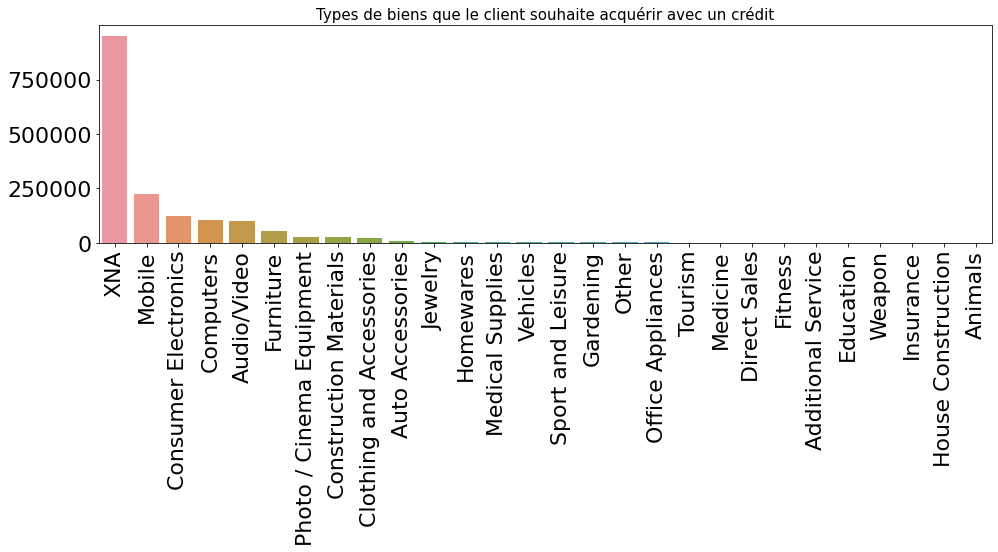

In [ ]:
# What kind of goods did the client apply for

goods_category = df_previous_application.groupby('NAME_GOODS_CATEGORY')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=goods_category.index, y=goods_category.values)
plt.xticks(rotation=90)
plt.title('Types de biens que le client souhaite acquérir avec un crédit', size=15)
plt.xlabel('')
plt.show()

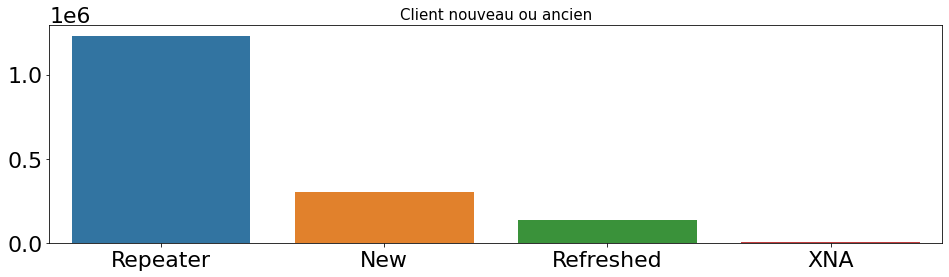

In [ ]:
# Was the client old or new client
create_barplot(df_previous_application, 'NAME_CLIENT_TYPE', 'SK_ID_CURR', 'Client nouveau ou ancien', rotation=0)

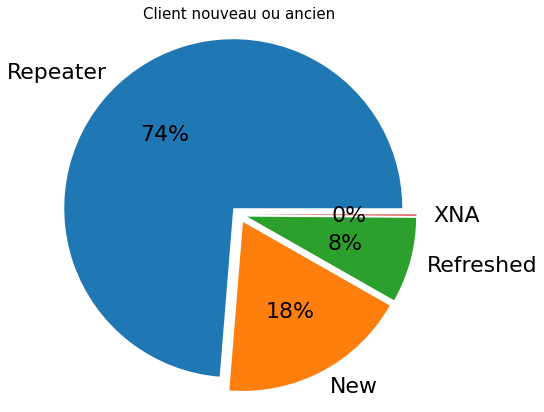

In [ ]:
# Was the client old or new client
create_pieplot(df_previous_application, 'NAME_CLIENT_TYPE', 'SK_ID_CURR', 'Client nouveau ou ancien')

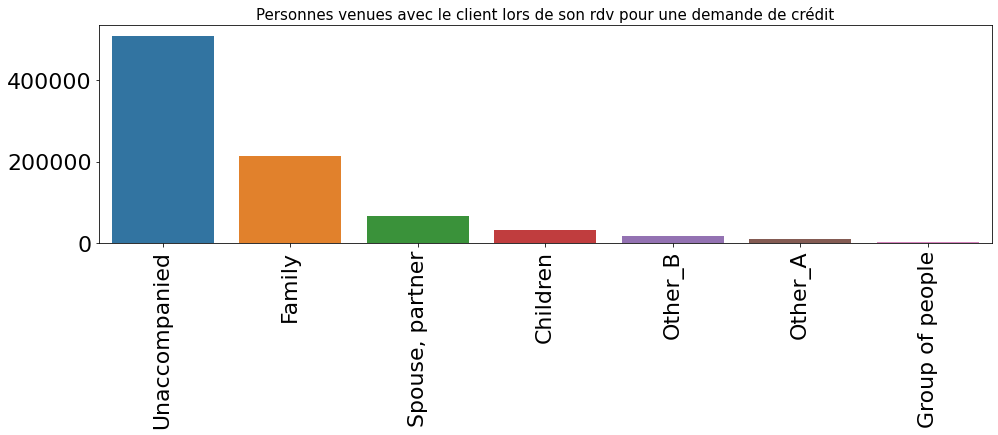

In [ ]:
# Who was accompanying client when he was applying for the loan
create_barplot(df_previous_application, 'NAME_TYPE_SUITE', 'SK_ID_CURR', 'Personnes venues avec le client lors de son rdv pour une demande de crédit')

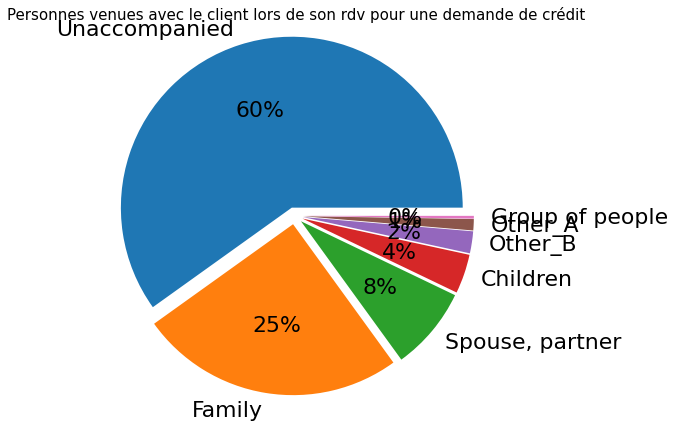

In [ ]:
# Who was accompanying client when he was applying for the loan
create_pieplot(df_previous_application, 'NAME_TYPE_SUITE', 'SK_ID_CURR', 'Personnes venues avec le client lors de son rdv pour une demande de crédit')

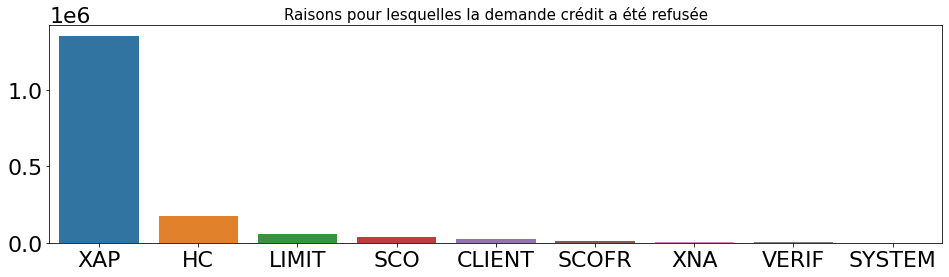

In [ ]:
# Why was the previous application rejected
create_barplot(df_previous_application, 'CODE_REJECT_REASON', 'SK_ID_CURR', 'Raisons pour lesquelles la demande crédit a été refusée', rotation=0)

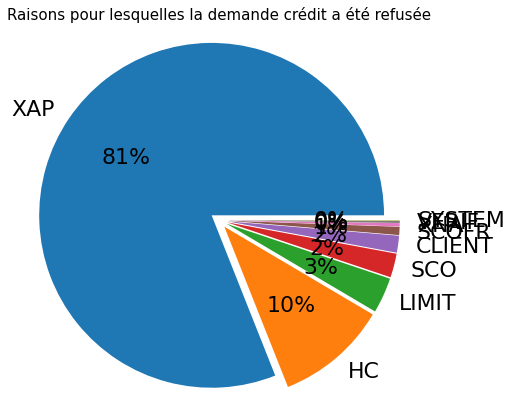

In [ ]:
# Why was the previous application rejected
create_pieplot(df_previous_application, 'CODE_REJECT_REASON', 'SK_ID_CURR', 'Raisons pour lesquelles la demande crédit a été refusée')

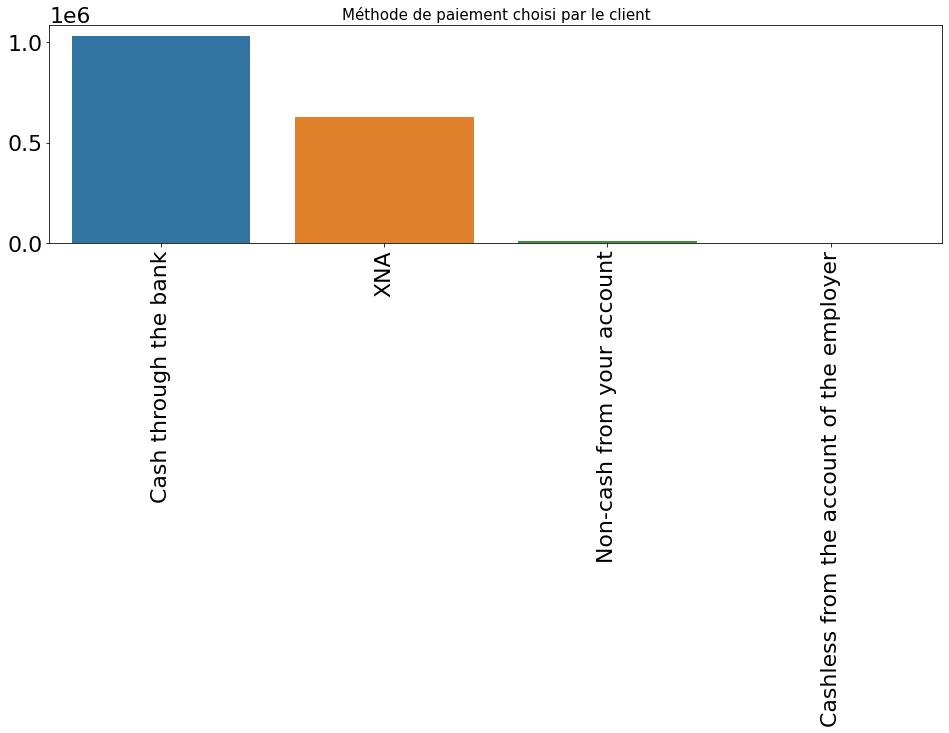

In [ ]:
# Payment method 
create_barplot(df_previous_application, 'NAME_PAYMENT_TYPE', 'SK_ID_CURR', 'Méthode de paiement choisi par le client')

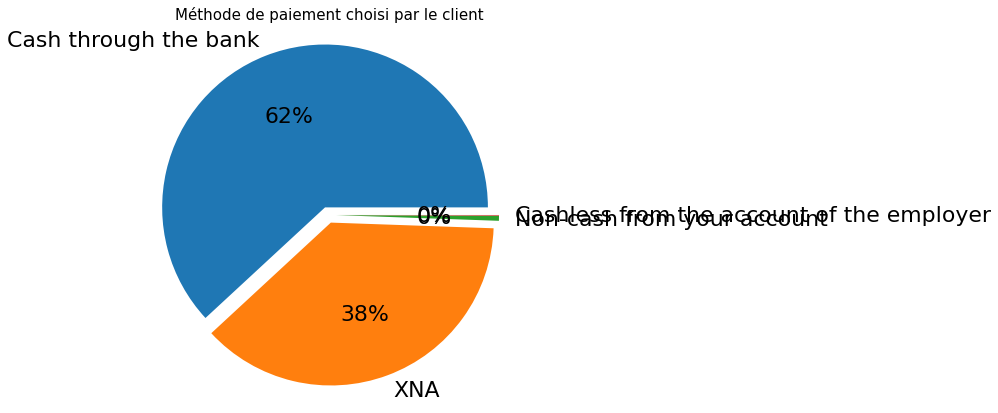

In [ ]:
# Payment method 
create_pieplot(df_previous_application, 'NAME_PAYMENT_TYPE', 'SK_ID_CURR', 'Méthode de paiement choisi par le client')

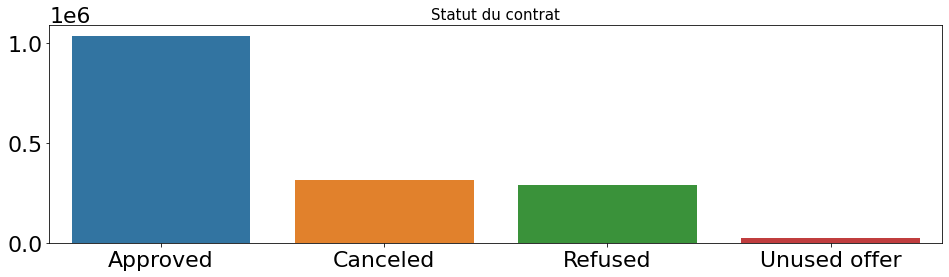

In [ ]:
# Contract status during the month
create_barplot(df_previous_application, 'NAME_CONTRACT_STATUS', 'SK_ID_CURR', 'Statut du contrat', rotation=0)

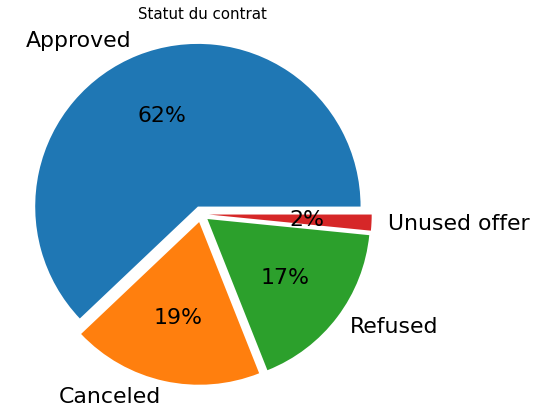

In [ ]:
# Contract status during the month
create_pieplot(df_previous_application, 'NAME_CONTRACT_STATUS', 'SK_ID_CURR', 'Statut du contrat')

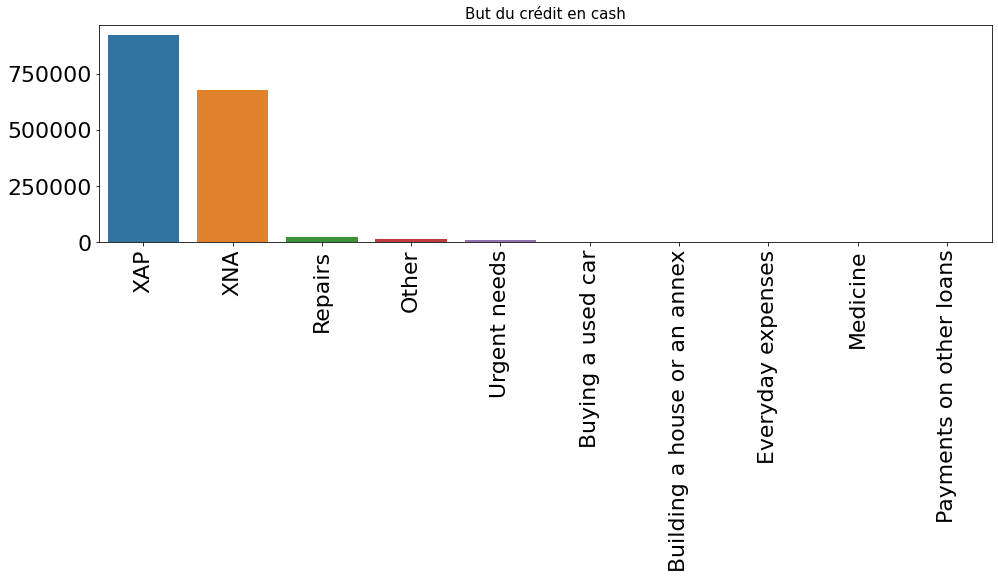

In [ ]:
# Purpose of the cash loan
create_barplot(df_previous_application, 'NAME_CASH_LOAN_PURPOSE', 'SK_ID_CURR', 'But du crédit en cash')

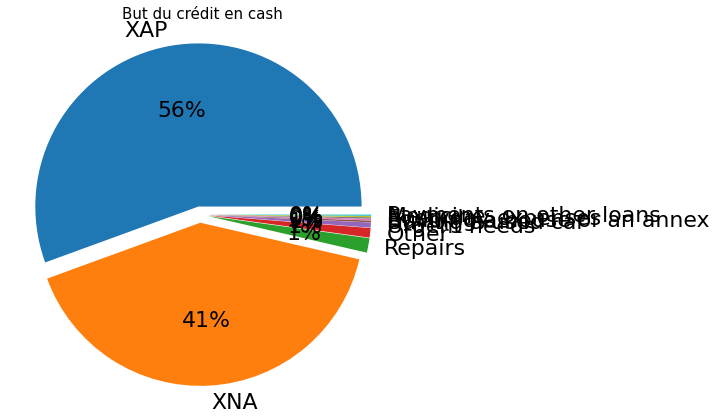

In [ ]:
# Purpose of the cash loan
create_pieplot(df_previous_application, 'NAME_CASH_LOAN_PURPOSE', 'SK_ID_CURR', 'But du crédit en cash')

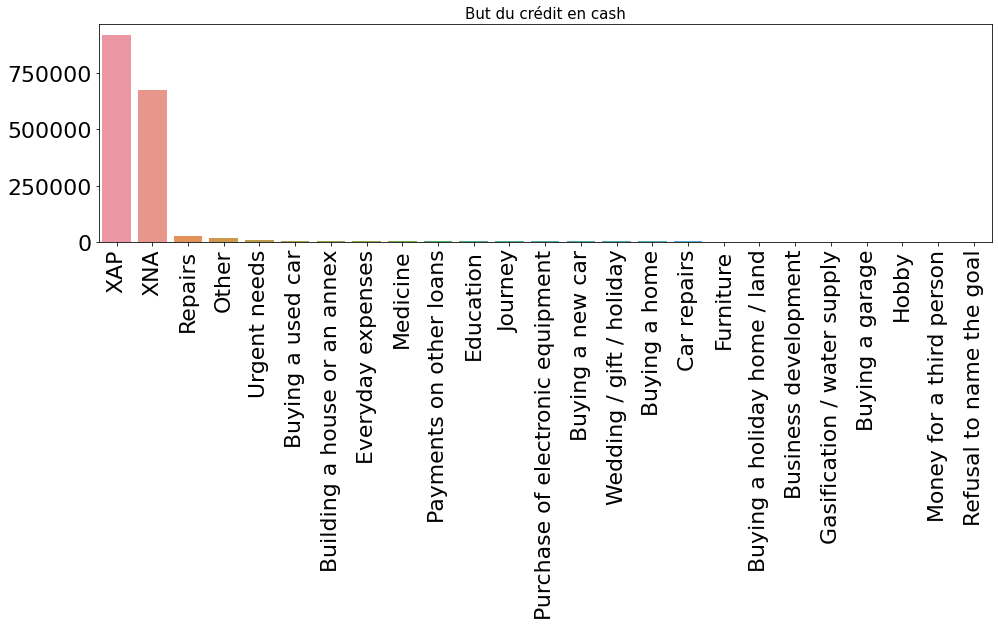

In [ ]:
# Purpose of the cash loan

cash_loan_purpose = df_previous_application.groupby('NAME_CASH_LOAN_PURPOSE')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=cash_loan_purpose.index, y=cash_loan_purpose.values)
plt.xticks(rotation=90)
plt.title('But du crédit en cash', size=15)
plt.xlabel('')
plt.show()

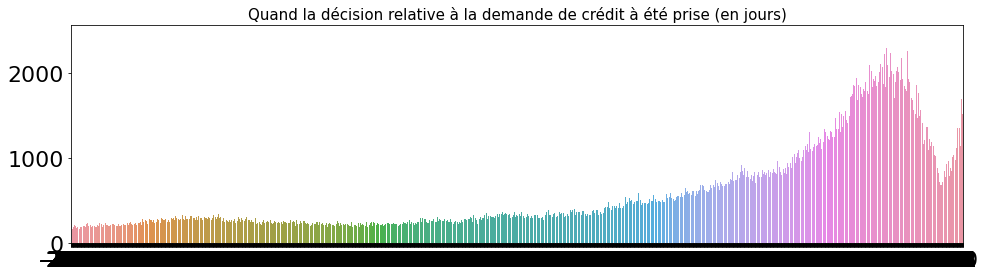

In [ ]:
# Days decision : when was the decision about previous application made

days_decision = df_previous_application.groupby('DAYS_DECISION')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=days_decision.index, y=days_decision.values)
plt.xticks()
plt.title('Quand la décision relative à la demande de crédit à été prise (en jours)', size=15)
plt.xlabel('')
plt.show()

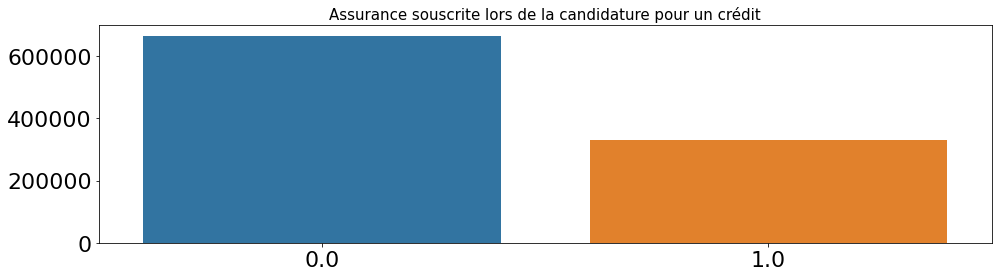

In [ ]:
# Insured on approval : Did the client requested insurance during the previous application

insured_on_approval = df_previous_application.groupby('NFLAG_INSURED_ON_APPROVAL')['SK_ID_CURR'].count().sort_values(ascending=False)[:10]

plt.figure(figsize=(16,4))
sns.barplot(x=insured_on_approval.index, y=insured_on_approval.values)
plt.xticks()
plt.title('Assurance souscrite lors de la candidature pour un crédit', size=15)
plt.xlabel('')
plt.show()

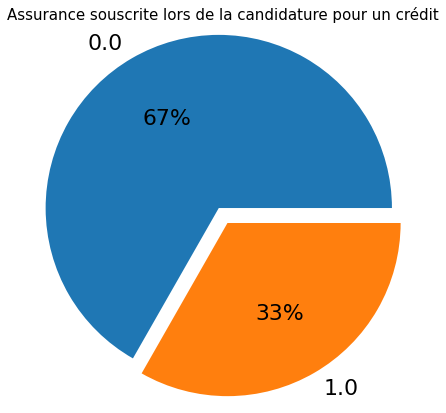

In [ ]:
# Insured on approval : Did the client requested insurance during the previous application
create_pieplot(df_previous_application, 'NFLAG_INSURED_ON_APPROVAL', 'SK_ID_CURR', 'Assurance souscrite lors de la candidature pour un crédit',)

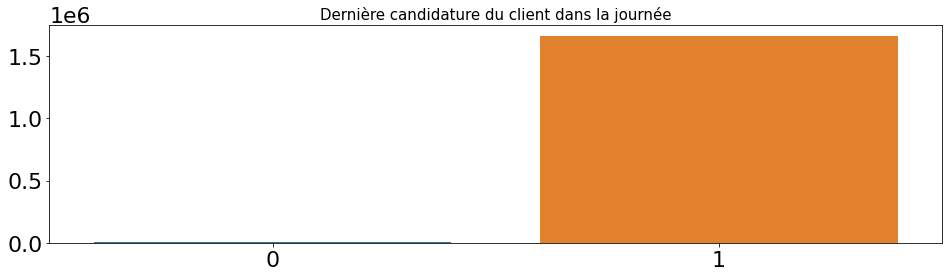

In [ ]:
# Last application per day of the client

last_appliction_of_the_day = df_previous_application.groupby('NFLAG_LAST_APPL_IN_DAY')['SK_ID_CURR'].count().sort_values(ascending=False)[:10]

plt.figure(figsize=(16,4))
sns.barplot(x=last_appliction_of_the_day.index, y=last_appliction_of_the_day.values)
plt.xticks()
plt.title('Dernière candidature du client dans la journée', size=15)
plt.xlabel('')
plt.show()

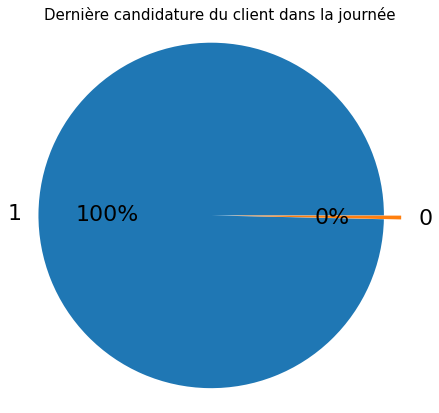

In [ ]:
# Last application per day of the client
create_pieplot(df_previous_application, 'NFLAG_LAST_APPL_IN_DAY', 'SK_ID_CURR', 'Dernière candidature du client dans la journée')

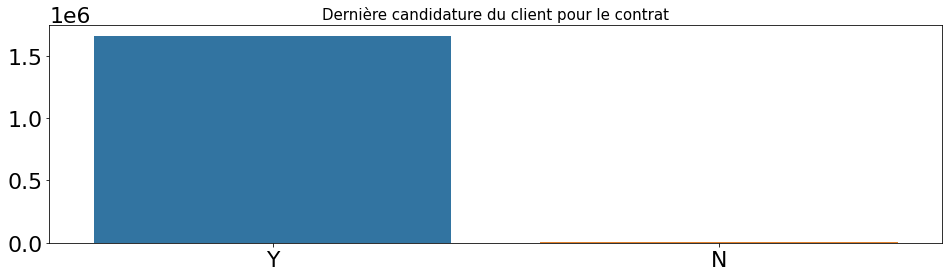

In [ ]:
# Last application for the previous contract

last_appliction_per_contract = df_previous_application.groupby('FLAG_LAST_APPL_PER_CONTRACT')['SK_ID_CURR'].count().sort_values(ascending=False)[:10]

plt.figure(figsize=(16,4))
sns.barplot(x=last_appliction_per_contract.index, y=last_appliction_per_contract.values)
plt.xticks()
plt.title('Dernière candidature du client pour le contrat', size=15)
plt.xlabel('')
plt.show()

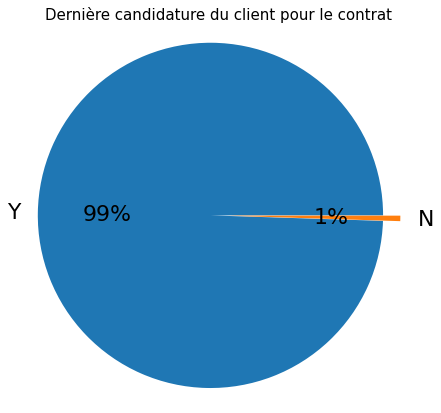

In [ ]:
# Last application for the previous contract
create_pieplot(df_previous_application, 'FLAG_LAST_APPL_PER_CONTRACT', 'SK_ID_CURR', 'Dernière candidature du client pour le contrat')

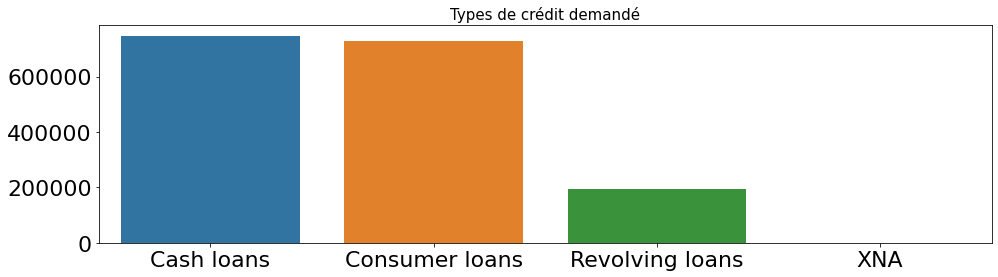

In [ ]:
# Contract product type : Cash loan, consumer loan [POS] ,...

contract_product_type = df_previous_application.groupby('NAME_CONTRACT_TYPE')['SK_ID_CURR'].count().sort_values(ascending=False)[:10]

plt.figure(figsize=(16,4))
sns.barplot(x=contract_product_type.index, y=contract_product_type.values)
plt.xticks()
plt.title('Types de crédit demandé', size=15)
plt.xlabel('')
plt.show()

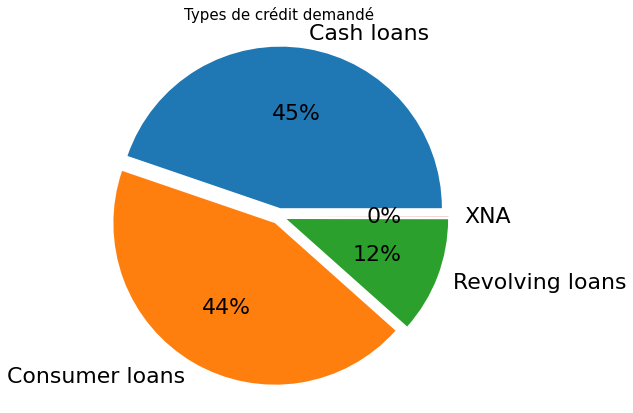

In [ ]:
# Contract product type : Cash loan, consumer loan [POS] ,...
create_pieplot(df_previous_application, 'NAME_CONTRACT_TYPE', 'SK_ID_CURR', 'Types de crédit demandé')

In [ ]:
# Print the number of clients
unique_cust_prev = df_previous_application['SK_ID_PREV'].nunique()
print(f'Le nombre de demandes de crédit antérieur est : {unique_cust_prev}')

# Print the number of clients
unique_cust_curr = df_previous_application['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_prev != unique_cust_curr


# Loan annuity
max_amt_annuity = df_previous_application['AMT_ANNUITY'].max()
min_amt_annuity = df_previous_application['AMT_ANNUITY'].min()
print(f'Le contrat de rente va de {min_amt_annuity} $ à {max_amt_annuity} $')

# For how much credit did client ask on the previous application
max_amt_application = df_previous_application['AMT_APPLICATION'].max()
min_amt_application = df_previous_application['AMT_APPLICATION'].min()
print(f'La valeur des crédits demandés va de {min_amt_application} $ à {max_amt_application} $')

# Credit amount of the loan
max_amt_credit = df_previous_application['AMT_CREDIT'].max()
min_amt_credit = df_previous_application['AMT_CREDIT'].min()
print(f'La valeur des crédits accordés va de {min_amt_credit} $ à {max_amt_credit} $')

# For consumer loans it is the price of the goods for which the loan is given
max_amt_goods_price = df_previous_application['AMT_GOODS_PRICE'].max()
min_amt_goods_price = df_previous_application['AMT_GOODS_PRICE'].min()
print(f'La valeur des biens motivant la demande de crédit va de {min_amt_goods_price} $ à {max_amt_goods_price} $')

# Down payment on the previous application
max_amt_down_payement = df_previous_application['AMT_DOWN_PAYMENT'].max()
min_amt_down_payement = df_previous_application['AMT_DOWN_PAYMENT'].min()
print(f'La valeur du paiment initial va de {min_amt_down_payement} $ à {max_amt_down_payement} $')

# Interest rate normalized on previous credit
max_rate_prim = df_previous_application['RATE_INTEREST_PRIMARY'].max()
min_rate_prim = df_previous_application['RATE_INTEREST_PRIMARY'].min()
print(f'Les taux d\'intéret vont de {min_rate_prim} à {max_rate_prim}')

# Interest rate normalized on previous credit
max_rate_priv = df_previous_application['RATE_INTEREST_PRIVILEGED'].max()
min_rate_priv = df_previous_application['RATE_INTEREST_PRIVILEGED'].min()
print(f'Les taux d\'intéret normalisés vont de {min_rate_priv} à {max_rate_priv}')

Le nombre de demandes de crédit antérieur est : 1670214
Le nombre de demandes de crédit actuel est : 338857
Le contrat de rente va de 0.0 $ à 418058.145 $
La valeur des crédits demandés va de 0.0 $ à 6905160.0 $
La valeur des crédits accordés va de 0.0 $ à 6905160.0 $
La valeur des biens motivant la demande de crédit va de 0.0 $ à 6905160.0 $
La valeur du paiment initial va de -0.9 $ à 3060045.0 $
Les taux d'intéret vont de 0.03478125354187918 à 1.0
La date des commandes va du 0.3731501057082452 au 1.0


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'RATE_INTEREST_PRIVILEGED']

,Unnamed: 0,Table,Row,Description,Special
188,191,previous_application.csv,RATE_INTEREST_PRIVILEGED,Interest rate normalized on previous credit,normalized


#### Filtrage outliers


AMT_DOWN_PAYMENT

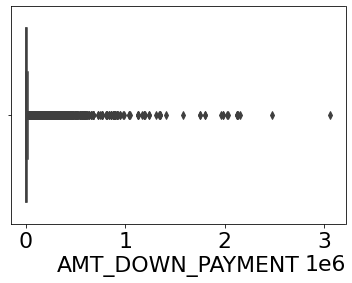

In [ ]:
sns.boxplot(df_previous_application['AMT_DOWN_PAYMENT'])

In [ ]:
print_min_max(df_previous_application, 'AMT_DOWN_PAYMENT')

-0.8999999761581421
3060045.0


In [ ]:
# Filter out outlier
df_previous_application = delete_percentile_based_outliers(df_previous_application, 'AMT_DOWN_PAYMENT')

diff is : 2.5
lower limit is : 0.0
upper limit is : 42435.0


In [ ]:
# Filter out negative values for AMT_DOWN_PAYMENT
#df_previous_application = df_previous_application[df_previous_application['AMT_DOWN_PAYMENT'] >= 0]
df_previous_application = df_previous_application[df_previous_application['AMT_DOWN_PAYMENT'] >= 0]

In [ ]:
print_min_max(df_previous_application, 'AMT_DOWN_PAYMENT')

0.0
42435.0


RATE_INTEREST_PRIMARY

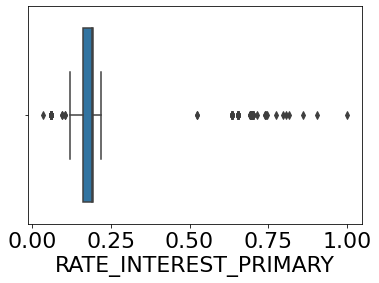

In [ ]:
sns.boxplot(df_previous_application['RATE_INTEREST_PRIMARY'])

In [ ]:
print_min_max(df_previous_application, 'RATE_INTEREST_PRIMARY')

0.03478125482797623
1.0


In [ ]:
# Filter out outlier
df_previous_application = delete_percentile_based_outliers(df_previous_application, 'RATE_INTEREST_PRIMARY')

diff is : 2.5
lower limit is : 0.1424260437488556
upper limit is : 0.6359515190124512


In [ ]:
print_min_max(df_previous_application, 'RATE_INTEREST_PRIMARY')

0.1424260437488556
0.6359515190124512


#### Vérification des nouvelles valeurs

In [ ]:
# Down payment on the previous application
max_amt_down_payement = df_previous_application['AMT_DOWN_PAYMENT'].max()
min_amt_down_payement = df_previous_application['AMT_DOWN_PAYMENT'].min()
print(f'La valeur du paiment initial va de {min_amt_down_payement} $ à {max_amt_down_payement} $')

# Interest rate normalized on previous credit
max_rate_prim = df_previous_application['RATE_INTEREST_PRIMARY'].max()
min_rate_prim = df_previous_application['RATE_INTEREST_PRIMARY'].min()
print(f'Les taux d\'intéret vont de {min_rate_prim} à {max_rate_prim}')

La valeur du paiment initial va de 0.0 $ à 42435.0 $
Les taux d'intéret vont de 0.1424260437488556 à 0.6359515190124512


In [ ]:
observe_distribution(df_previous_application)

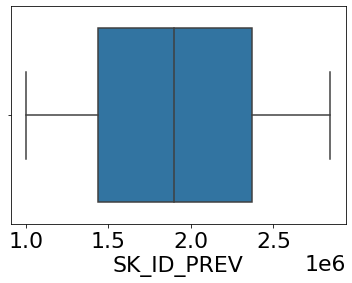

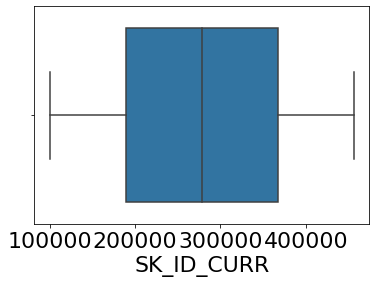

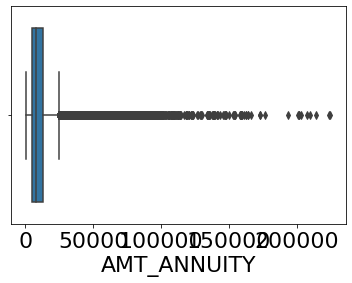

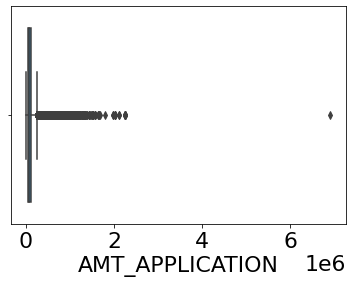

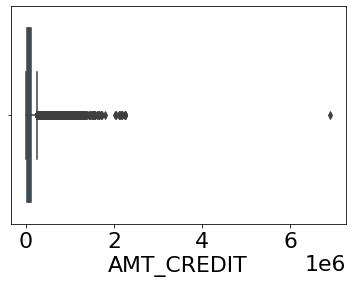

...

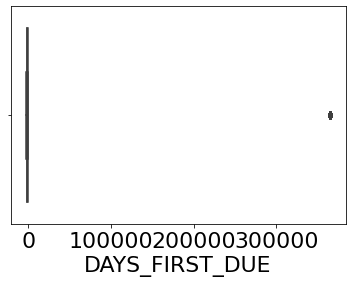

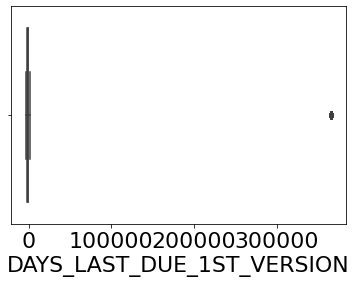

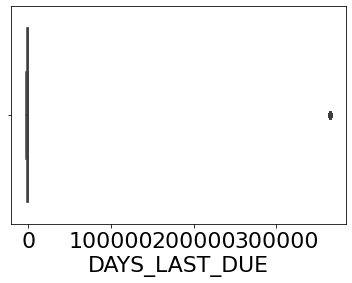

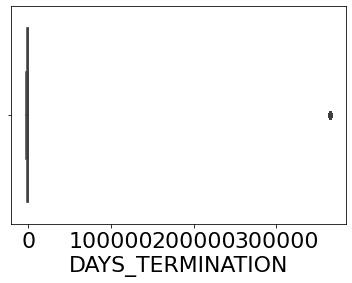

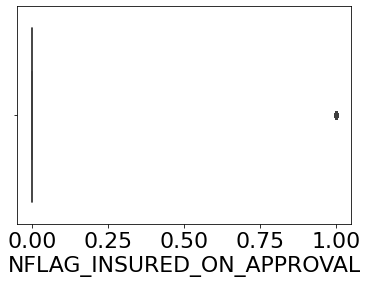

In [ ]:
observe_dispersion(df_previous_application)

In [ ]:
observe_frequences(df_previous_application)

  NAME_CONTRACT_TYPE       n         f         F
1         Cash loans   47934  0.062421  0.062421
0     Consumer loans  717593  0.934466  0.996886
2    Revolving loans    2391  0.003114  1.000000
  WEEKDAY_APPR_PROCESS_START       n         f         F
2                     FRIDAY  108755  0.141623  0.141623
6                     MONDAY  102620  0.133634  0.275257
0                   SATURDAY  132949  0.173129  0.448386
1                     SUNDAY  110651  0.144092  0.592479
4                   THURSDAY  104565  0.136167  0.728646
5                    TUESDAY  103544  0.134837  0.863483
3                  WEDNESDAY  104834  0.136517  1.000000
  FLAG_LAST_APPL_PER_CONTRACT       n         f         F
1                           N       1  0.000001  0.000001
0                           Y  767917  0.999999  1.000000
              NAME_CASH_LOAN_PURPOSE       n         f         F
10                  Buying a new car      53  0.000069  0.000069
8                  Buying a used car     272

### df_sample_submission

In [ ]:
df_sample_submission.describe()

,SK_ID_CURR,TARGET
count,48744.000000,48744.0
mean,277796.676350,0.5
std,103169.547296,0.0
min,100001.000000,0.5
25%,188557.750000,0.5
50%,277549.000000,0.5
75%,367555.500000,0.5
max,456250.000000,0.5


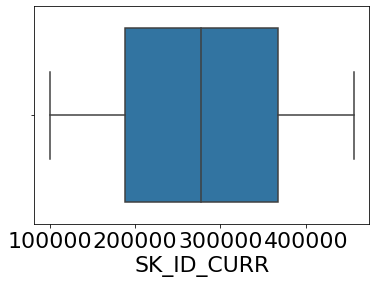

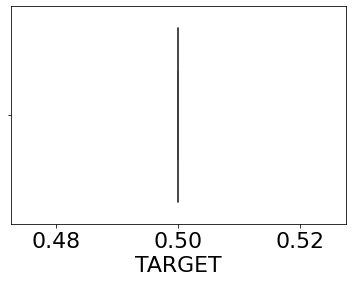

In [ ]:
observe_dispersion(df_sample_submission)

In [ ]:
test_normality(df_sample_submission)

Les variables a distribution normale sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_CURR,45760.448187,0.0,False
TARGET,121057.857005,0.0,False


In [ ]:
df_sample_submission.head()

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5


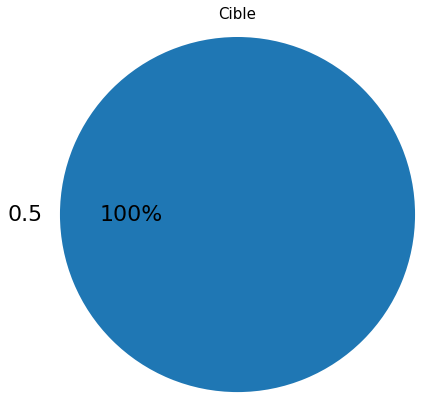

In [ ]:
# Target
create_pieplot(df_sample_submission, 'TARGET', 'SK_ID_CURR', 'Cible')

### df_app

#### Créer un nouveau data frame à partir de df_app_train et df_app_test: df_app

In [ ]:
print(df_app_train.shape)
print(df_app_test.shape)

(307511, 122)
(48744, 121)


In [ ]:
# Add identifying column
df_app_train['SET'] = 'Train'
df_app_test['SET'] = 'Test'
df_app_test["TARGET"] = np.nan

# Append the dataframes
df_app = df_app_train.append(df_app_test, ignore_index = True)

In [ ]:
df_app_train['TARGET'].unique()

array([1, 0], dtype=int32)

In [ ]:
df_app['SET'].unique()

array(['Train', 'Test'], dtype=object)

In [ ]:
df_app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SET
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,Train
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,Train
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

#### Exploration df_app

In [ ]:
df_app.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,...,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,356255.000000,307511.000000,356255.000000,3.562550e+05,3.562550e+05,356219.000000,3.559770e+05,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,121014.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356253.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,162345.000000,3.555870e+05,286622.000000,176307.000000,148671.000000,183392.000000,119949.000000,107895.000000,167175.000000,177848.000000,179914.000000,...,177848.000000,179914.000000,115147.000000,145411.000000,113276.000000,178353.000000,109394.000000,160489.000000,185200.000000,355205.000000,355205.000000,355205.000000,355205.000000,356254.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.00000,356255.000000,356255.000000,356255.000000,356255.000000,308687.000000,308687.000000,308687.000000,308687.000000,308687.000000,308687.000000
mean,278128.000000,0.080729,0.414316,1.701161e+05,5.877674e+05,27425.560657,5.280200e+05,0.020917,-16041.248841,64317.231413,-4983.593527,-3002.071163,12.023741,0.999994,0.818498,0.200098,0.998170,0.278612,0.071213,2.151858,2.050506,2.028932,12.055749,0.015649,0.051371,0.040847,0.078076,0.229661,0.178824,0.501965,5.148900e-01,0.509350,0.118138,0.088673,0.977889,0.752283,0.045045,0.079819,0.150015,0.227331,...,0.149494,0.226922,0.232504,0.067296,0.102674,0.109279,0.008697,0.028386,0.103193,1.425729,0.143452,1.409468,0.100198,-978.580852,0.000036,0.720504,0.000084,0.015065,0.087976,0.000171,0.082346,0.003977,0.000020,0.003537,0.000006,0.003043,0.002535,0.001044,0.008570,0.00023,0.007231,0.000514,0.000438,0.000289,0.005808,0.006281,0.029995,0.231697,0.304399,1.911564
std,102842.104413,0.272419,0.720378,2.235068e+05,3.986237e+05,14732.808190,3.660650e+05,0.013915,4358.803980,141705.532576,3526.968986,1517.901735,11.880848,0.002369,0.385434,0.400074,0.042741,0.448317,0.257181,0.907937,0.510947,0.504586,3.267576,0.124113,0.220753,0.197936,0.268292,0.420616,0.383206,0.210045,1.897531e-01,0.194141,0.108954,0.082312,0.057929,0.113267,0.077045,0.135249,0.100139,0.145051,...,0.100450,0.145453,0.162419,0.082267,0.094541,0.112881,0.047519,0.070574,0.108041,2.599914,0.456579,2.577724,0.368259,835.063902,0.006041,0.448752,0.009176,0.121812,0.283261,0.013084,0.274891,0.062942,0.004433,0.059366,0.002369,0.055077,0.

In [ ]:
observe_distribution(df_app)

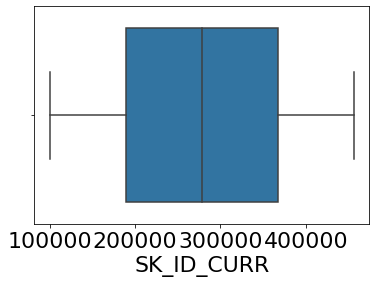

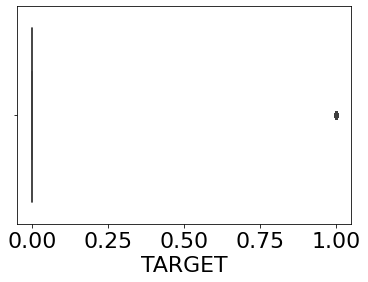

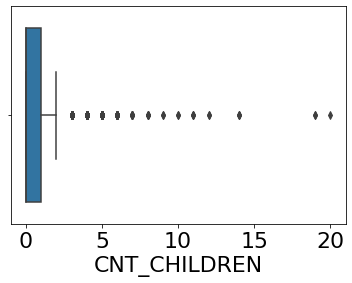

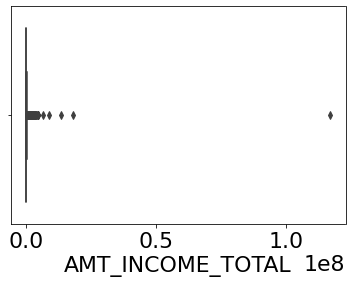

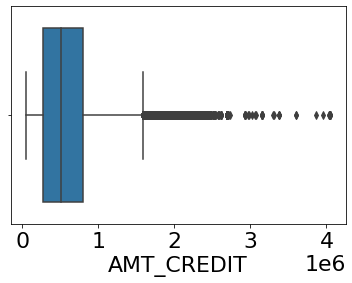

...

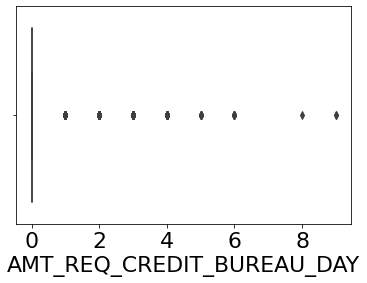

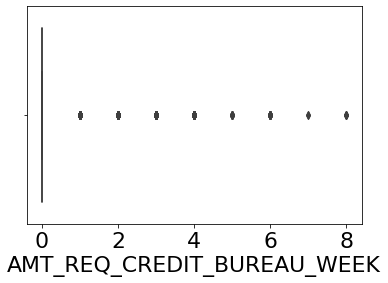

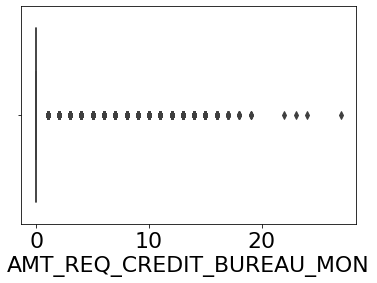

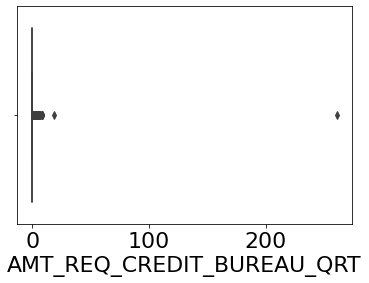

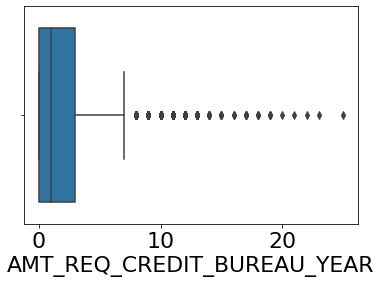

In [ ]:
observe_dispersion(df_app)

In [ ]:
observe_frequences(df_app)

  NAME_CONTRACT_TYPE       n         f         F
0         Cash loans  326537  0.916582  0.916582
1    Revolving loans   29718  0.083418  1.000000
  CODE_GENDER       n         f         F
0           F  235126  0.659994  0.659994
1           M  121125  0.339995  0.999989
2         XNA       4  0.000011  1.000000
  FLAG_OWN_CAR       n       f       F
0            N  235235  0.6603  0.6603
1            Y  121020  0.3397  1.0000
  FLAG_OWN_REALTY       n         f         F
1               N  109285  0.306761  0.306761
0               Y  246970  0.693239  1.000000
   NAME_TYPE_SUITE       n         f         F
3         Children    3675  0.010316  0.010316
1           Family   46030  0.129205  0.139521
6  Group of people     320  0.000898  0.140419
5          Other_A     975  0.002737  0.143156
4          Other_B    1981  0.005561  0.148717
2  Spouse, partner   12818  0.035980  0.184696
0    Unaccompanied  288253  0.809120  0.993816
       NAME_INCOME_TYPE       n         f         F
6 

In [ ]:
test_normality(df_app)

Les variables a distribution normale sont : Empty DataFrame
Columns: [W, pval, normal]
Index: []


,W,pval,normal
SK_ID_CURR,3.163329e+05,0.0,False
TARGET,1.865675e+05,0.0,False
CNT_CHILDREN,1.652090e+05,0.0,False
AMT_INCOME_TOTAL,2.111653e+06,0.0,False
AMT_CREDIT,7.732426e+04,0.0,False
...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,7.825113e+05,0.0,False
AMT_REQ_CREDIT_BUREAU_WEEK,4.842781e+05,0.0,False
AMT_REQ_CREDIT_BUREAU_MON,4.344514e+05,0.0,False
AMT_REQ_CREDIT_BUREAU_QRT,1.297607e+06,0.0,False


In [ ]:
df_app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SET
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,Train
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,Train
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,Train
3,100006,0.0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Train
4,100007,0.0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,Train


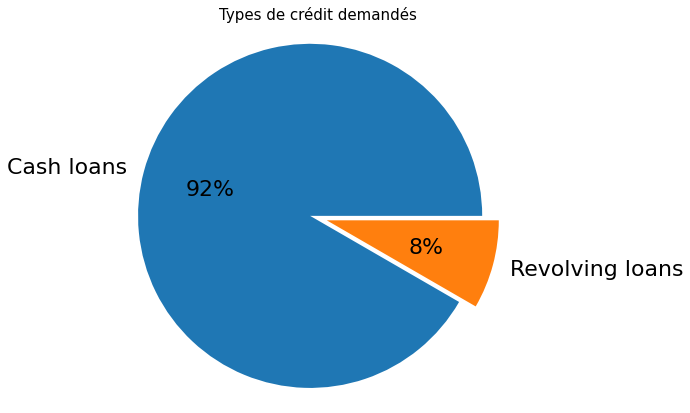

In [ ]:
# Contract product type 
create_pieplot(df_app, 'NAME_CONTRACT_TYPE', 'SK_ID_CURR', 'Types de crédit demandés')

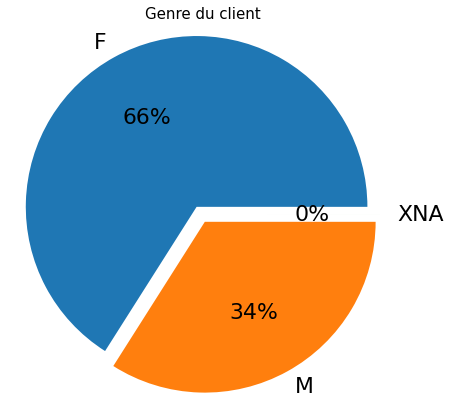

In [ ]:
# Gender
create_pieplot(df_app, 'CODE_GENDER', 'SK_ID_CURR', 'Genre du client')

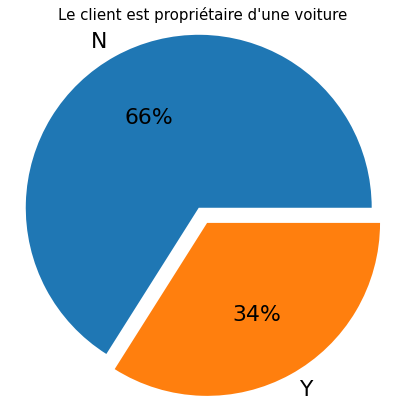

In [ ]:
# Own car
create_pieplot(df_app, 'FLAG_OWN_CAR', 'SK_ID_CURR', 'Le client est propriétaire d\'une voiture')

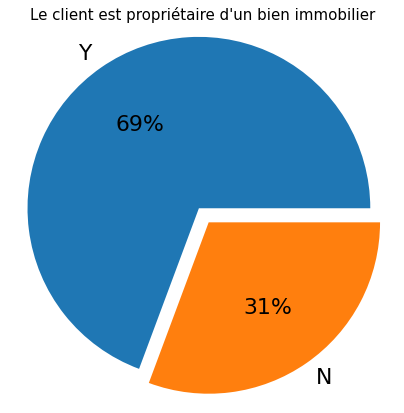

In [ ]:
# Own realty
create_pieplot(df_app, 'FLAG_OWN_REALTY', 'SK_ID_CURR', 'Le client est propriétaire d\'un bien immobilier')

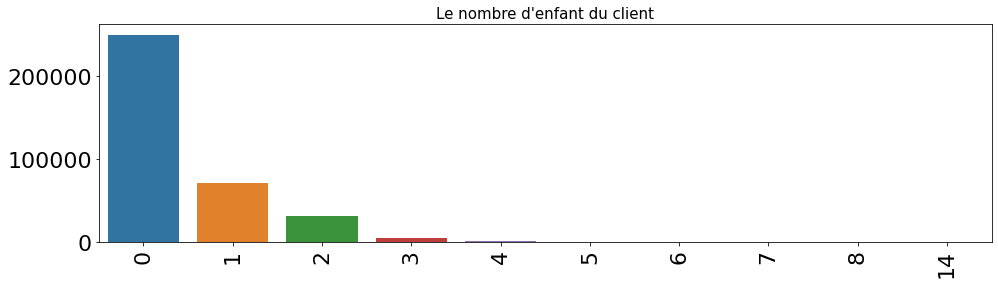

In [ ]:
# Number of children the client has
create_barplot(df_app, 'CNT_CHILDREN', 'SK_ID_CURR', 'Le nombre d\'enfant du client')

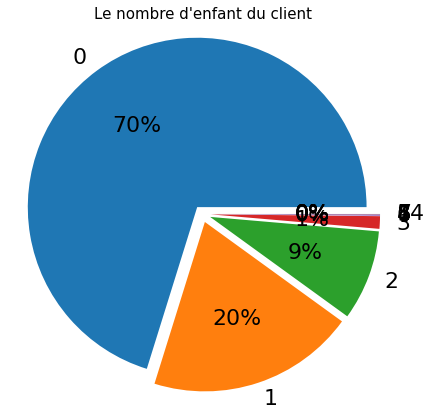

In [ ]:
# Number of children the client has
create_pieplot(df_app, 'CNT_CHILDREN', 'SK_ID_CURR', 'Le nombre d\'enfant du client')

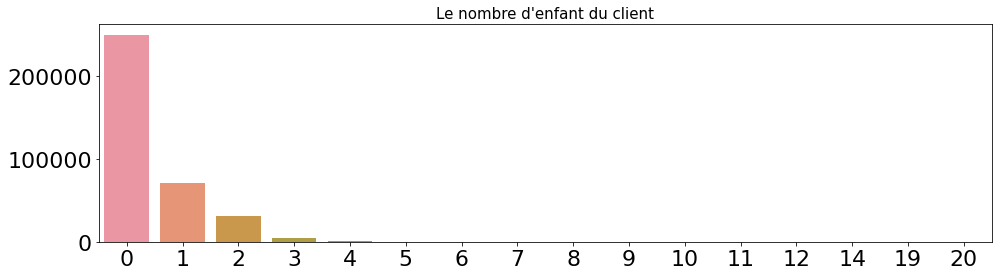

In [ ]:
# Number of children the client has
has_children = df_app.groupby('CNT_CHILDREN')['SK_ID_CURR'].count().sort_values(ascending=False)

plt.figure(figsize=(16,4))
sns.barplot(x=has_children.index, y=has_children.values)
plt.xticks()
plt.title('Le nombre d\'enfant du client', size=15)
plt.xlabel('')
plt.show()

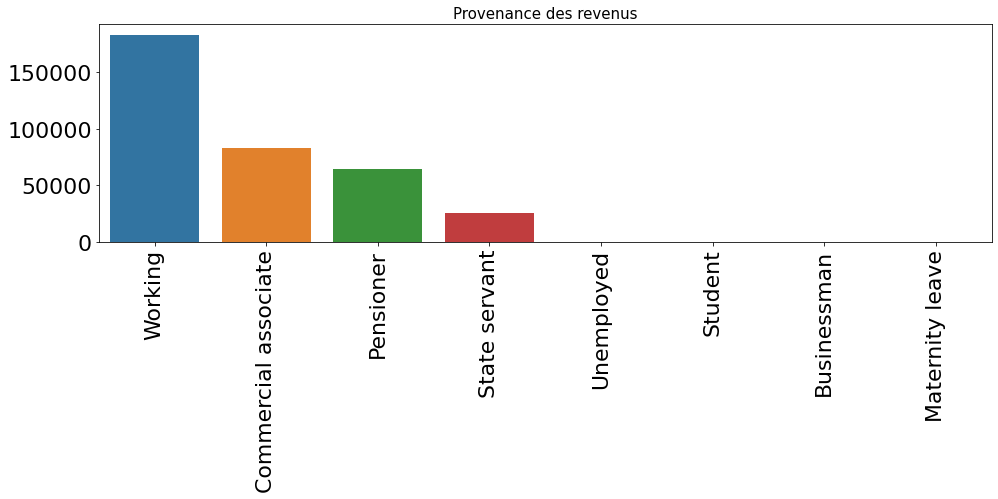

In [ ]:
# Income type
create_barplot(df_app, 'NAME_INCOME_TYPE', 'SK_ID_CURR', 'Provenance des revenus')

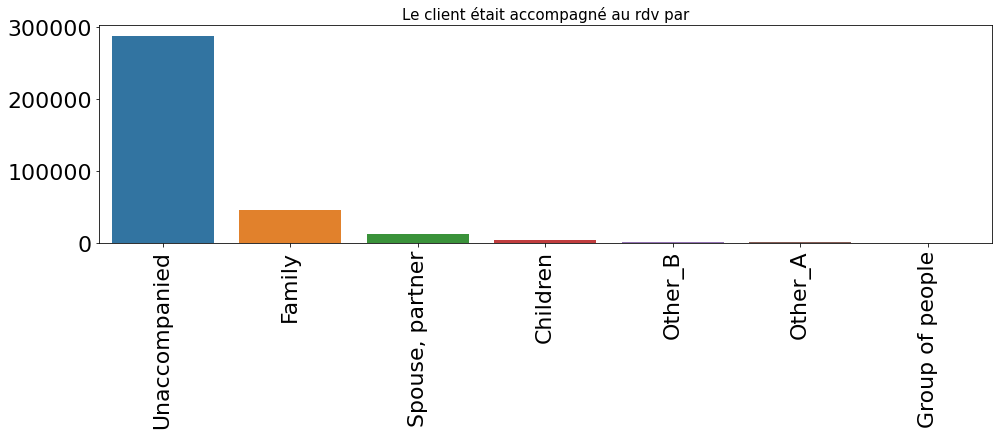

In [ ]:
# Who was accompanying client when he was applying for the loan
create_barplot(df_app, 'NAME_TYPE_SUITE', 'SK_ID_CURR', 'Le client était accompagné au rdv par', rotation=90)

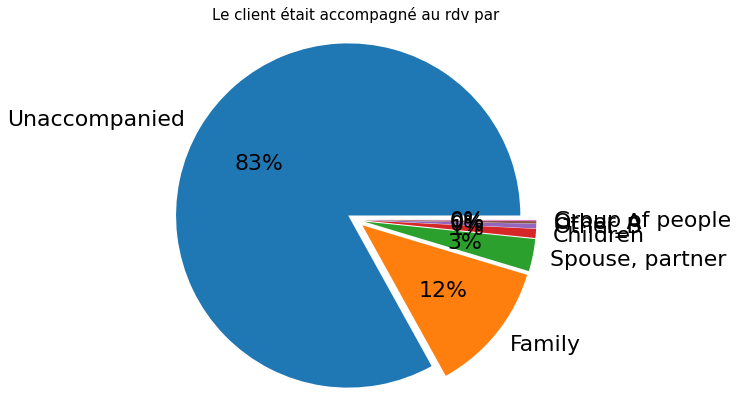

In [ ]:
# Who was accompanying client when he was applying for the loan
create_pieplot(df_app, 'NAME_TYPE_SUITE', 'SK_ID_CURR', 'Le client était accompagné au rdv par')

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'NAME_FAMILY_STATUS']

,Unnamed: 0,Table,Row,Description,Special
14,17,application_{train|test}.csv,NAME_FAMILY_STATUS,Family status of the client,NaN


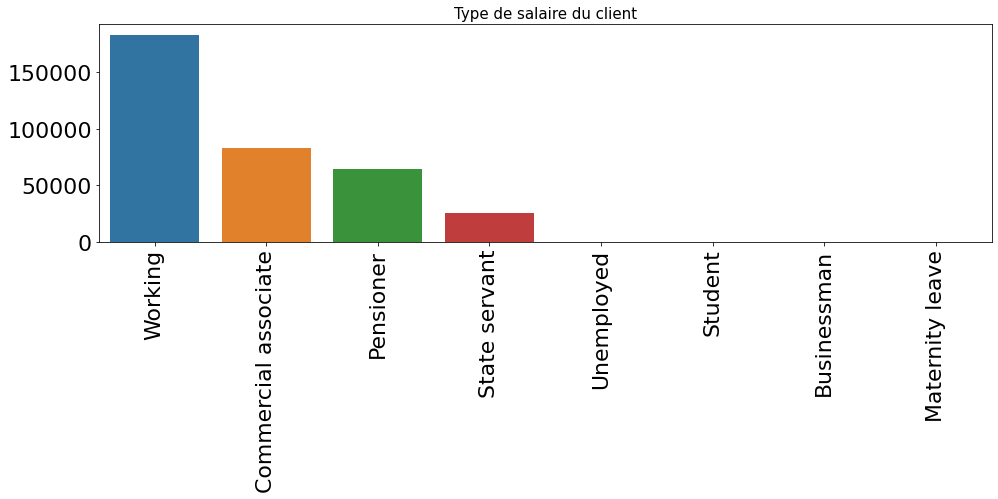

In [ ]:
# Clients income type
create_barplot(df_app, 'NAME_INCOME_TYPE', 'SK_ID_CURR', 'Type de salaire du client', rotation=90)

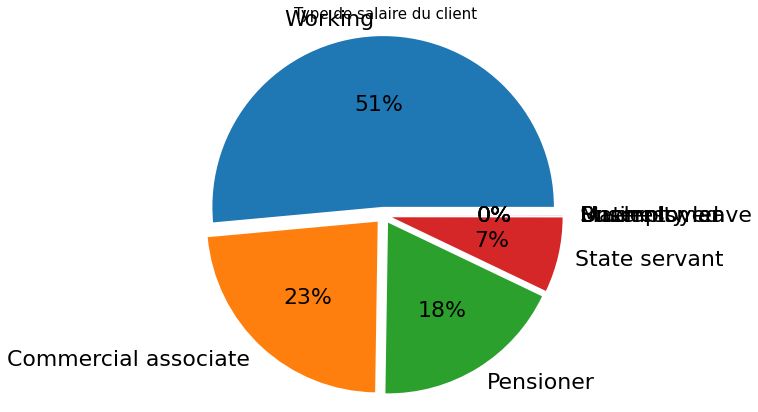

In [ ]:
# Clients income type
create_pieplot(df_app, 'NAME_INCOME_TYPE', 'SK_ID_CURR', 'Type de salaire du client')

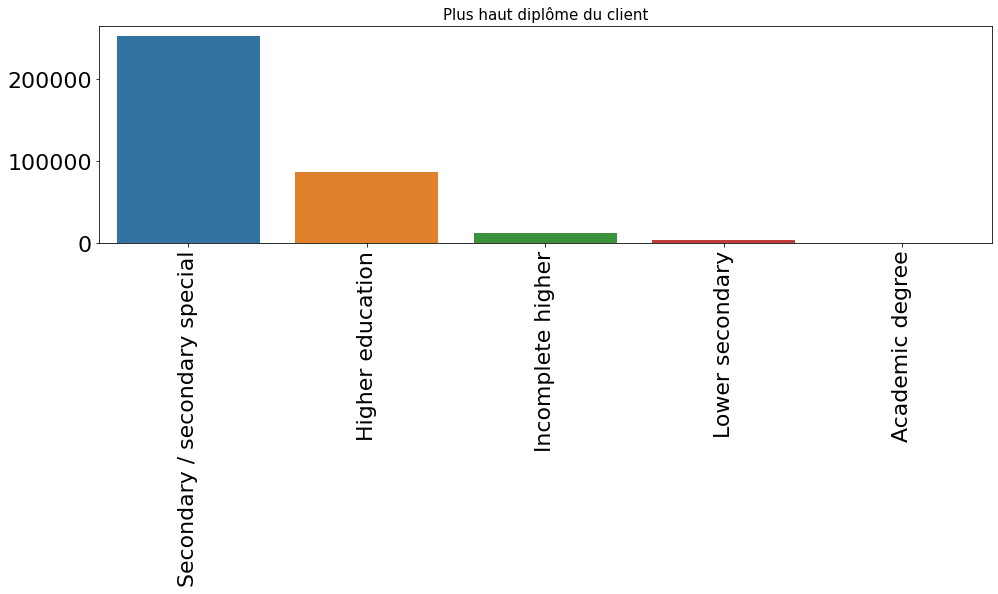

In [ ]:
# Level of highest education the client achieved
create_barplot(df_app, 'NAME_EDUCATION_TYPE', 'SK_ID_CURR', 'Plus haut diplôme du client', rotation=90)

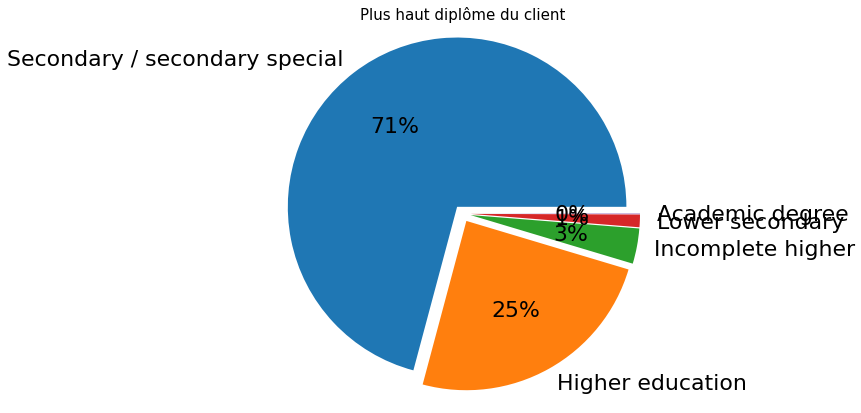

In [ ]:
# Level of highest education the client achieved
create_pieplot(df_app, 'NAME_EDUCATION_TYPE', 'SK_ID_CURR', 'Plus haut diplôme du client')

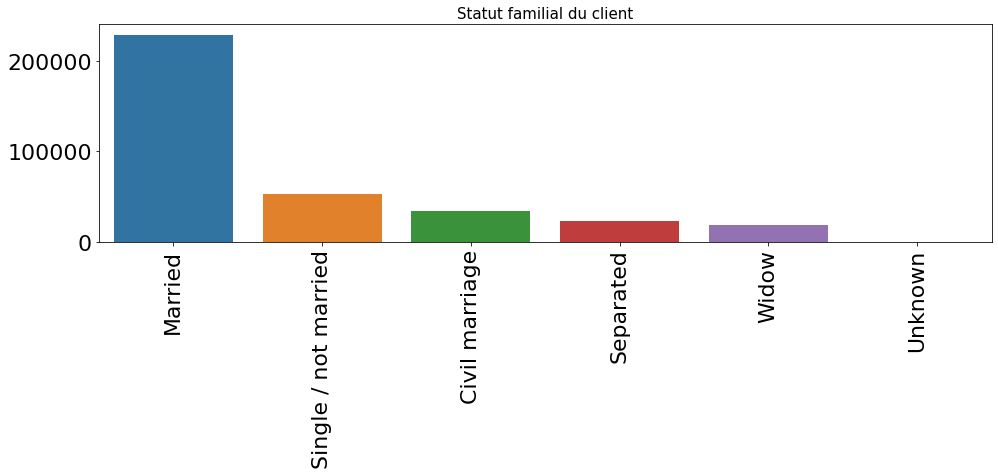

In [ ]:
# Family status of the client
create_barplot(df_app, 'NAME_FAMILY_STATUS', 'SK_ID_CURR', 'Statut familial du client', rotation=90)

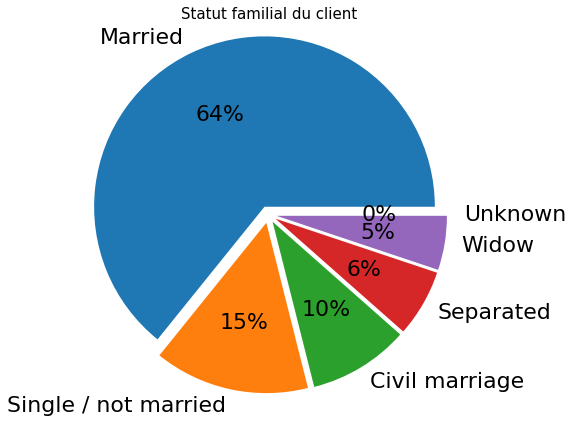

In [ ]:
# Family status of the client
create_pieplot(df_app, 'NAME_FAMILY_STATUS', 'SK_ID_CURR', 'Statut familial du client')

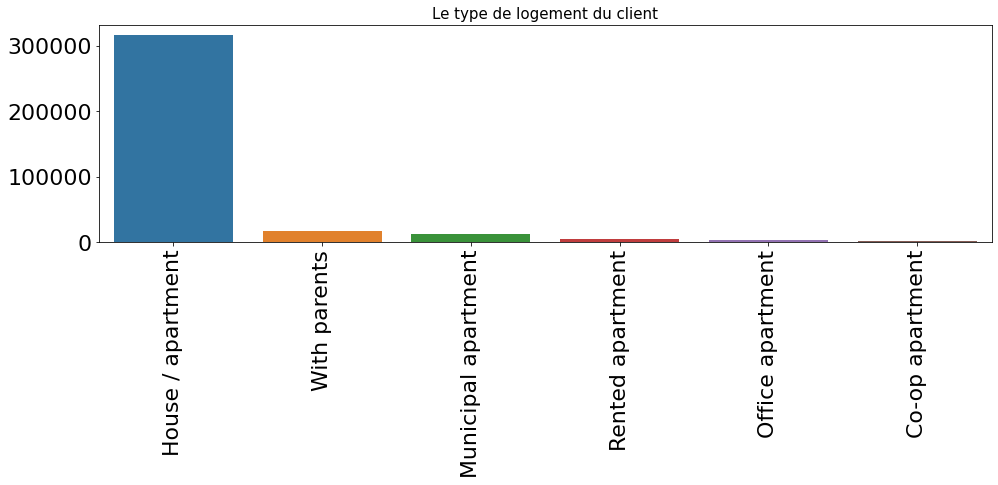

In [ ]:
# What is the housing situation of the client
create_barplot(df_app, 'NAME_HOUSING_TYPE', 'SK_ID_CURR', 'Le type de logement du client', rotation=90)

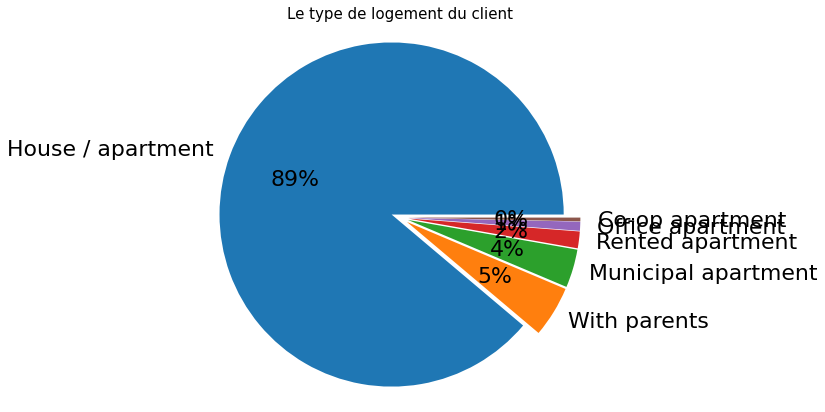

In [ ]:
# What is the housing situation of the client
create_pieplot(df_app, 'NAME_HOUSING_TYPE', 'SK_ID_CURR', 'Le type de logement du client')

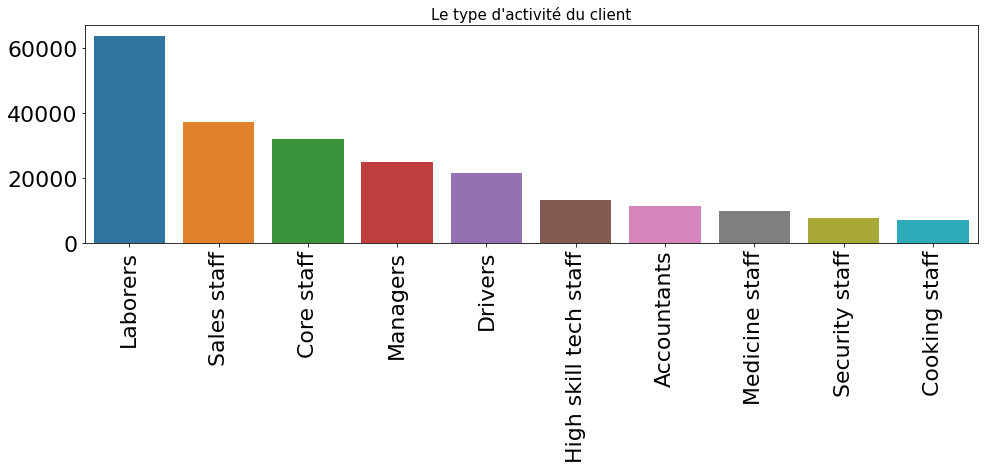

In [ ]:
# What kind of occupation does the client have
create_barplot(df_app, 'OCCUPATION_TYPE', 'SK_ID_CURR', 'Le type d\'activité du client', rotation=90)

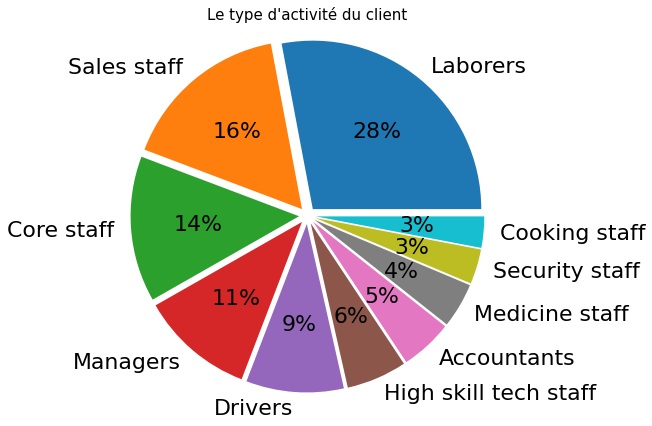

In [ ]:
# What kind of occupation does the client have
create_pieplot(df_app, 'OCCUPATION_TYPE', 'SK_ID_CURR', 'Le type d\'activité du client')

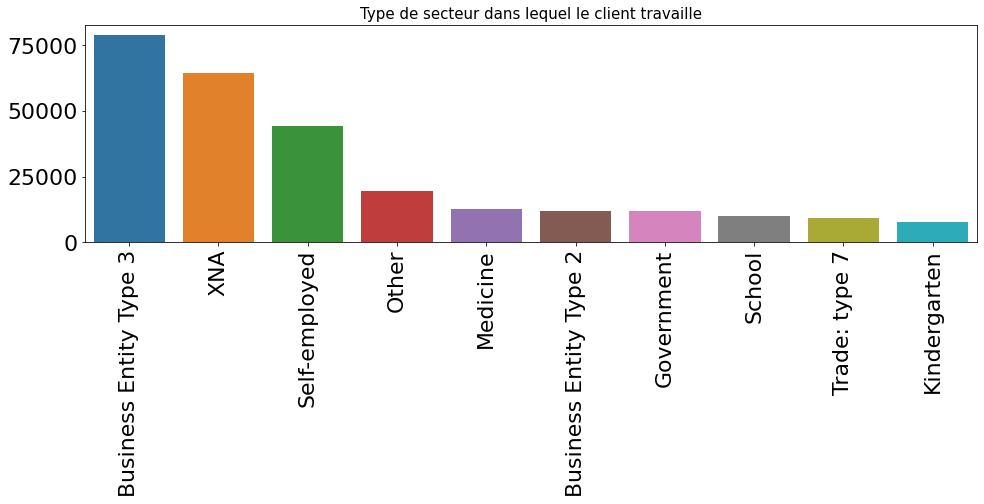

In [ ]:
# Type of organization where client works
create_barplot(df_app, 'ORGANIZATION_TYPE', 'SK_ID_CURR', 'Type de secteur dans lequel le client travaille', rotation=90)

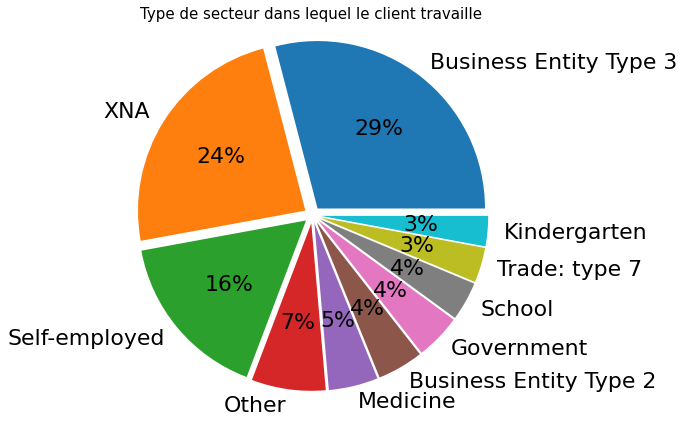

In [ ]:
# Type of organization where client works
create_pieplot(df_app, 'ORGANIZATION_TYPE', 'SK_ID_CURR', 'Type de secteur dans lequel le client travaille')

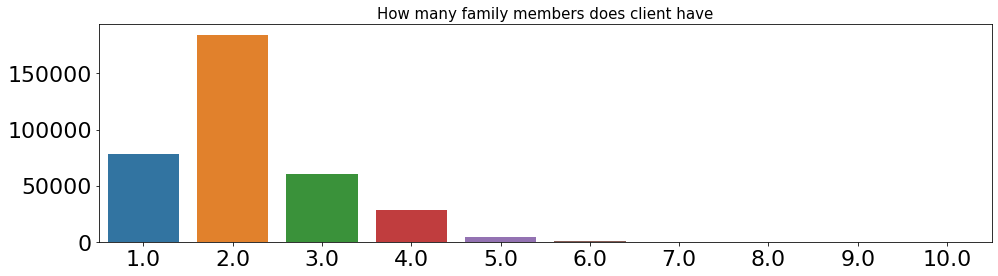

In [ ]:
# How many family members does client have
create_barplot(df_app, 'CNT_FAM_MEMBERS', 'SK_ID_CURR', 'How many family members does client have', rotation=0)

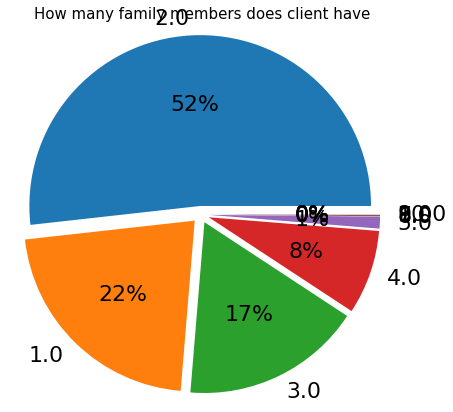

In [ ]:
# How many family members does client have
create_pieplot(df_app, 'CNT_FAM_MEMBERS', 'SK_ID_CURR', 'How many family members does client have')

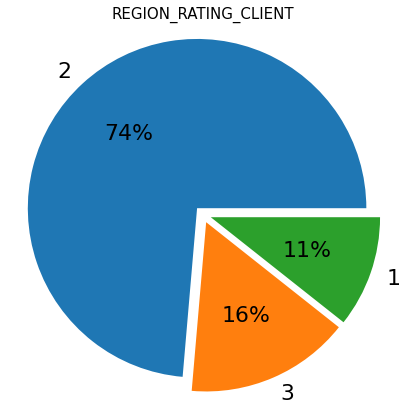

In [ ]:
create_pieplot(df_app, 'REGION_RATING_CLIENT', 'SK_ID_CURR', 'REGION_RATING_CLIENT')

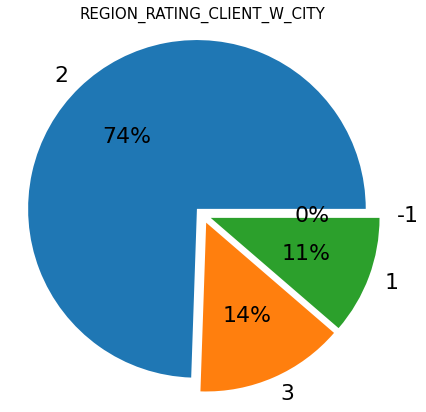

In [ ]:
create_pieplot(df_app, 'REGION_RATING_CLIENT_W_CITY', 'SK_ID_CURR', 'REGION_RATING_CLIENT_W_CITY')

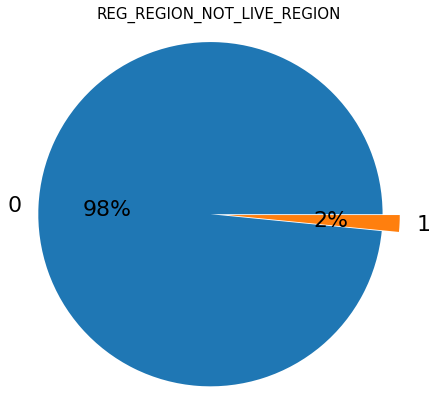

In [ ]:
create_pieplot(df_app, 'REG_REGION_NOT_LIVE_REGION', 'SK_ID_CURR', 'REG_REGION_NOT_LIVE_REGION')

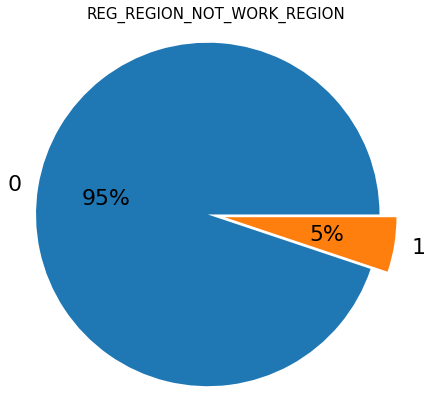

In [ ]:
create_pieplot(df_app, 'REG_REGION_NOT_WORK_REGION', 'SK_ID_CURR', 'REG_REGION_NOT_WORK_REGION')

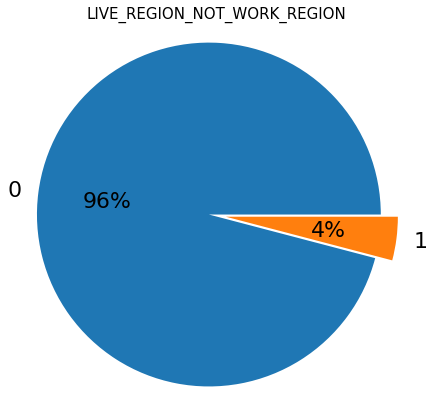

In [ ]:
create_pieplot(df_app, 'LIVE_REGION_NOT_WORK_REGION', 'SK_ID_CURR', 'LIVE_REGION_NOT_WORK_REGION')

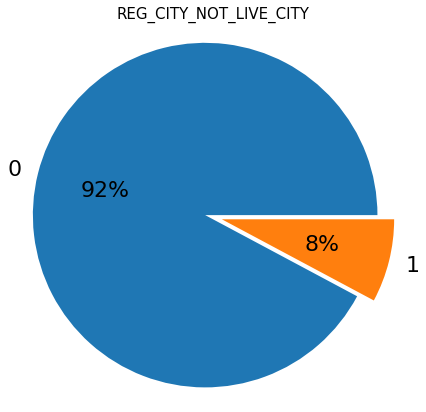

In [ ]:
create_pieplot(df_app, 'REG_CITY_NOT_LIVE_CITY', 'SK_ID_CURR', 'REG_CITY_NOT_LIVE_CITY')

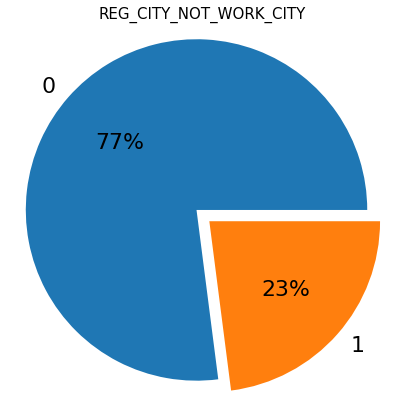

In [ ]:
create_pieplot(df_app, 'REG_CITY_NOT_WORK_CITY', 'SK_ID_CURR', 'REG_CITY_NOT_WORK_CITY')

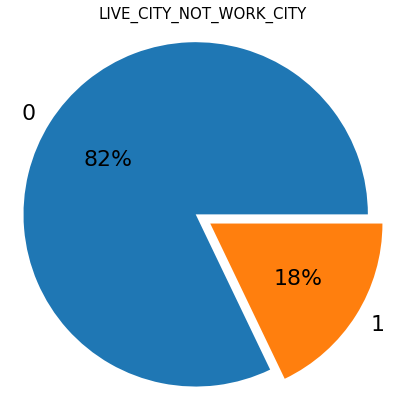

In [ ]:
# LIVE_CITY_NOT_WORK_CITY
create_pieplot(df_app, 'LIVE_CITY_NOT_WORK_CITY', 'SK_ID_CURR', 'LIVE_CITY_NOT_WORK_CITY')

In [ ]:
# Print the number of clients
unique_cust_curr = df_app['SK_ID_CURR'].nunique()
print(f'Le nombre de demandes de crédit actuel est : {unique_cust_curr}')

# unique_cust_bureau != unique_cust_curr


# Loan annuity
max_amt_annuity = df_app['AMT_ANNUITY'].max()
min_amt_annuity = df_app['AMT_ANNUITY'].min()
print(f'La valeur des contrats de rente va de {min_amt_annuity} $ à {max_amt_annuity} $') 	

# Final credit amount on the previous application
max_amt_credit = df_app['AMT_CREDIT'].max()
min_amt_credit = df_app['AMT_CREDIT'].min()
print(f'Le valeur des crédits va de {min_amt_credit} $ à {max_amt_credit} $') 

# For consumer loans it is the price of the goods for which the loan is given
max_amt_gprice = df_app['AMT_GOODS_PRICE'].max()
min_amt_gprice = df_app['AMT_GOODS_PRICE'].min()
print(f'Le valeur des biens voulus va de {min_amt_gprice} $ à {max_amt_gprice} $') 

# Income of the client
max_amt_incometot = df_app['AMT_INCOME_TOTAL'].max()
min_amt_incometot = df_app['AMT_INCOME_TOTAL'].min()
print(f'Les salaires vont de {min_amt_incometot} $ à {max_amt_incometot} $') 



# Normalized population of region where client lives
max_days_credit = df_app['REGION_POPULATION_RELATIVE'].max()
min_days_credit = df_app['REGION_POPULATION_RELATIVE'].min()
print(f'La densité de population normalisée dans la région du client va de {min_days_credit} à {max_days_credit}')

# Client's age in days at the time of application
max_days_birth = abs(df_app['DAYS_BIRTH'].max())/356
min_days_birth = abs(df_app['DAYS_BIRTH'].min())/356
print(f'Le nombre de jours depuis la naissance du client va de {max_days_birth} ans à {min_days_birth} ans')

# How many days before the application the person started current employment
max_days_employed = abs(df_app['DAYS_EMPLOYED'].max())/356
min_days_employed  = abs(df_app['DAYS_EMPLOYED'].min())/356
print(f'Le nombre de jours d\'emploiement dans la companie actuelle du client va de {max_days_employed } ans à {min_days_employed } ans')

# How many days before the application did client change his registration
max_days_registration = abs(df_app['DAYS_REGISTRATION'].max())/356
min_days_registration = abs(df_app['DAYS_REGISTRATION'].min())/356
print(f'Le nombre de jours depuis la registration va de {max_days_registration} ans à {min_days_registration} ans')

# How many days before the application did client change the identity document with which he applied for the loan
max_days_id_pub = abs(df_app['DAYS_ID_PUBLISH'].max())/356
min_days_id_pub = abs(df_app['DAYS_ID_PUBLISH'].min())/356
print(f'Le nombre de jours depuis la création de la pièce d\'identité des clients va de {max_days_id_pub} ans à {min_days_id_pub} ans')

# Age of client's car
max_car_age = df_app['OWN_CAR_AGE'].max()
min_car_age = df_app['OWN_CAR_AGE'].min()
print(f'L\'âge des voitures des clients va de {min_car_age} ans à {max_car_age} ans')

Le nombre de demandes de crédit actuel est : 356255
La valeur des contrats de rente va de 1615.5 $ à 258025.5 $
Le valeur des crédits va de 45000.0 $ à 4050000.0 $
Le valeur des biens voulus va de 40500.0 $ à 4050000.0 $
Les salaires vont de 25650.0 $ à 117000000.0 $
La densité de population normalisée dans la région du client va de 0.000253 à 0.072508
Le nombre de jours depuis la naissance du client va de 20.6123595505618 ans à 70.86797752808988 ans
Le nombre de jours d'emploiement dans la companie actuelle du client va de 1025.9634831460673 ans à 50.31460674157304 ans
Le nombre de jours depuis la registration va de 0.0 ans à 69.30337078651685 ans
Le nombre de jours depuis la création de la pièce d'identité des clients va de 0.0 ans à 20.21629213483146 ans
L'âge des voitures des clients va de 0.0 ans à 91.0 ans


#### Filtrer les outliers

DAYS_EMPLOYED

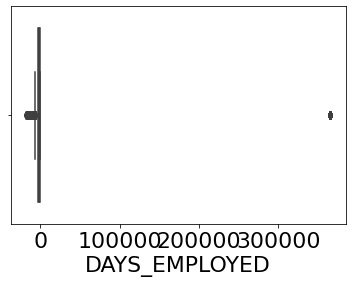

In [ ]:
sns.boxplot(df_app['DAYS_EMPLOYED'])

In [ ]:
pd.set_option('display.max_colwidth', None)
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_EMPLOYED']

,Unnamed: 0,Table,Row,Description,Special
18,21,application_{train|test}.csv,DAYS_EMPLOYED,How many days before the application the person started current employment,time only relative to the application


In [ ]:
print_min_max(df_app, 'DAYS_EMPLOYED')

-17912
365243


In [ ]:
len(df_app[df_app['DAYS_EMPLOYED'] <= 0])

291607

In [ ]:
len(df_app[df_app['DAYS_EMPLOYED'] > 0])

64648

In [ ]:
df_app[df_app['DAYS_EMPLOYED'] > 0]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SET
8,100011,0.0,Cash loans,F,N,Y,0,112500.00000,1019610.0,33826.5,913500.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.018634,-20099,365243,-7427.0,-3514,NaN,1,0,0,1,0,0,NaN,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,Train
11,100015,0.0,Cash loans,F,N,Y,0,38419.15625,148365.0,10678.5,135000.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.015221,-20417,365243,-5246.0,-2512,NaN,1,0,0,1,1,0,NaN,2.0,2,2,FRIDAY,7,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2396.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,Train
23,100027,0.0,Cash loans,F,N,Y,0,83250.00000,239850.0,23850.0,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.006296,-24827,365243,-9012.0,-3684,NaN,1,0,0,1,1,0,NaN,2.0,3,3,FRIDAY,12,0,0,0,0,0,0,...,0.1510,0.0019,0.0007,org spec account,block of flats,0.1640,Mixed,No,0.0,0.0,0.0,0.0,-795.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,Train
38,100045,0.0,Cash loans,F,N,Y,0,99000.00000,247275.0,17338.5,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.006207,-23920,365243,-9817.0,-4969,NaN,1,0,0,1,1,0,NaN,2.0,2,2,FRIDAY,11,0,0,0,0,0,0,...,0.0938,NaN,NaN,NaN,block of flats,0.0786,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,Train
43,100050,0.0,Cash loans,F,N,Y,0,108000.00000,746280.0,42970.5,675000.0,Unaccompanied,Pensioner,Higher education,Single / not married,House / apartment,0.010966,-23548,365243,-5745.0,-4576,NaN,1,0,0,1,0,0,NaN,1.0,2,2,WEDNESDAY,9,0,0,0,0,0,0,...,0.2151,0.0039,0.0052,reg oper spec account,block of flats,0.1903,Panel,No,0.0,0.0,0.0,0.0,-491.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356228,456008,NaN,Cash loans,F,N,Y,0,81000.00000,180000.0,13455.0,180000.0,Family,Pensioner,Secondary / secondary special,Married,House / apartment,0.030755,-23732,365243,-11095.0,-4730,NaN,1,0,0,1,1,0,NaN,2.0,2,2,TUESDAY,10,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
# Filter positive values out of the values
df_app = df_app[df_app['DAYS_EMPLOYED'] <= 0]

In [ ]:
print_min_max(df_app, 'DAYS_EMPLOYED')

-17912
0


In [ ]:
# Observe the equivalent in years
df_app['DAYS_EMPLOYED'].min()/365

-49.07397260273972

In [ ]:
# Filter out outliers
#df_app = delete_percentile_based_outliers(df_app, 'DAYS_EMPLOYED')

In [ ]:
#print_min_max(df_app, 'DAYS_EMPLOYED')

In [ ]:
# Observe the equivalent in years
#df_app['DAYS_EMPLOYED'].min()/365

OWN_CAR_AGE

In [ ]:
print_min_max(df_app, 'OWN_CAR_AGE')

0.0
91.0


In [ ]:
df_app = delete_percentile_based_outliers(df_app, 'OWN_CAR_AGE')

diff is : 2.5
lower limit is : 1.0
upper limit is : 64.0


In [ ]:
print_min_max(df_app, 'OWN_CAR_AGE')

1.0
64.0


AMT_INCOME_TOTAL

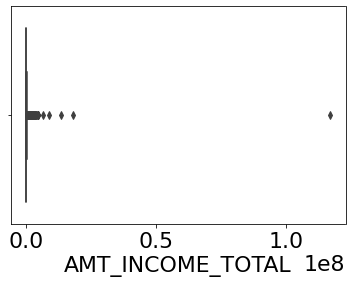

In [ ]:
sns.boxplot(df_app['AMT_INCOME_TOTAL'])

In [ ]:
print_min_max(df_app, 'AMT_INCOME_TOTAL')

25650.0
117000000.0


In [ ]:
# Filter out outliers
df_app = delete_percentile_based_outliers(df_app, 'AMT_INCOME_TOTAL')

diff is : 2.5
lower limit is : 67500.0
upper limit is : 405000.0


In [ ]:
print_min_max(df_app, 'AMT_INCOME_TOTAL')

67500.0
405000.0


#### Vérification des nouvelles valeurs

In [ ]:
# Income of the client
max_amt_incometot = df_app['AMT_INCOME_TOTAL'].max()
min_amt_incometot = df_app['AMT_INCOME_TOTAL'].min()
print(f'Les salaires vont de {min_amt_incometot} $ à {max_amt_incometot} $') 


# How many days before the application the person started current employment
max_days_employed = abs(df_app['DAYS_EMPLOYED'].max())/356
min_days_employed  = abs(df_app['DAYS_EMPLOYED'].min())/356
print(f'Le nombre de jours d\'emploiement dans la companie actuelle du client va de {max_days_employed } ans à {min_days_employed } ans')


# Age of client's car
max_car_age = df_app['OWN_CAR_AGE'].max()
min_car_age = df_app['OWN_CAR_AGE'].min()
print(f'L\'âge des voitures des clients va de {min_car_age} ans à {max_car_age} ans')

Les salaires vont de 67500.0 $ à 405000.0 $
Le nombre de jours d'emploiement dans la companie actuelle du client va de 0.0 ans à 50.31460674157304 ans
L'âge des voitures des clients va de 1.0 ans à 64.0 ans


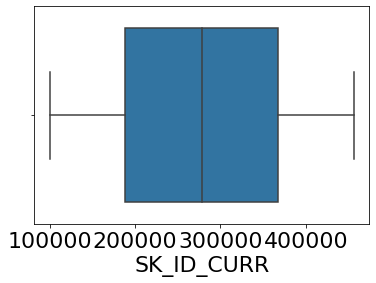

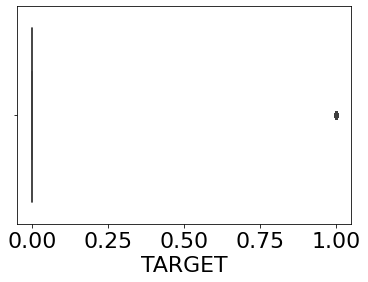

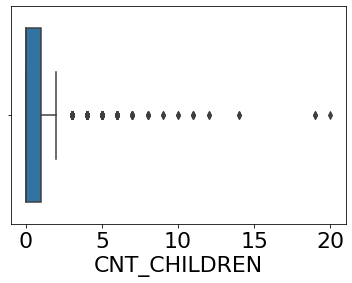

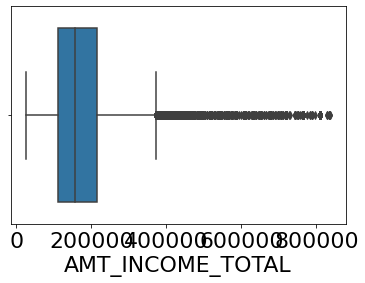

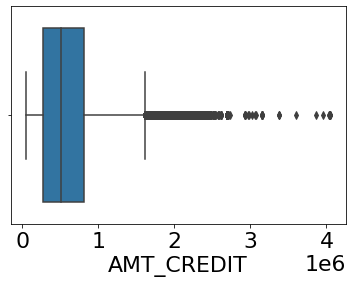

...

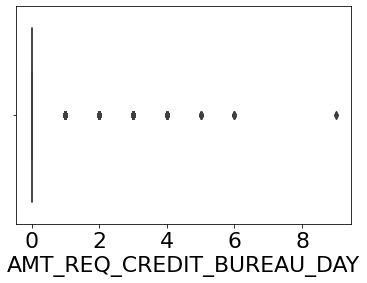

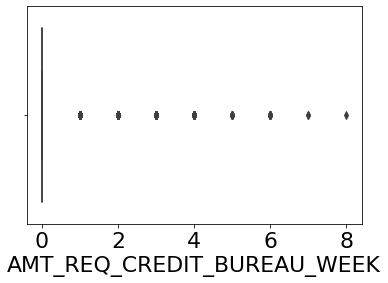

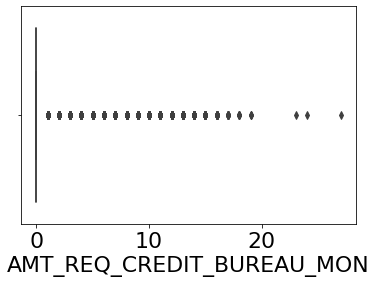

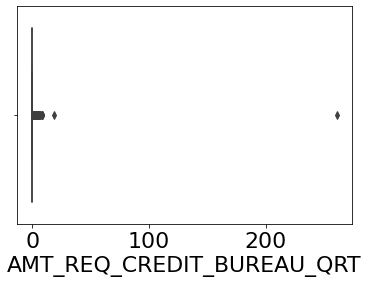

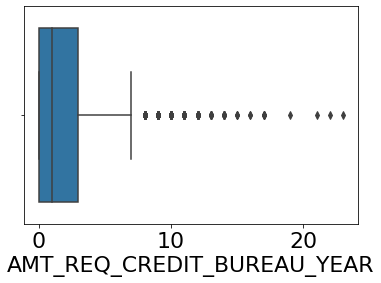

In [ ]:
observe_dispersion(df_app)

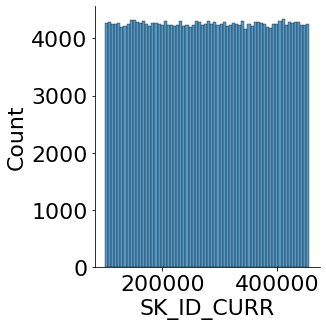

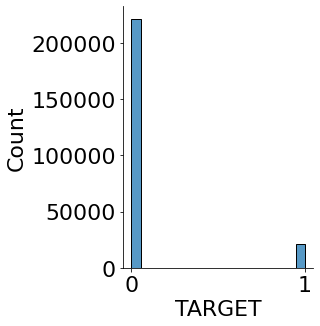

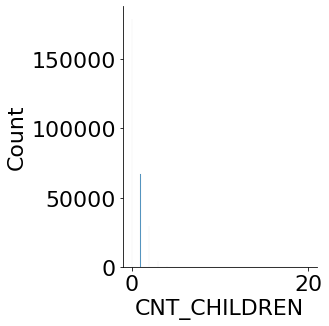

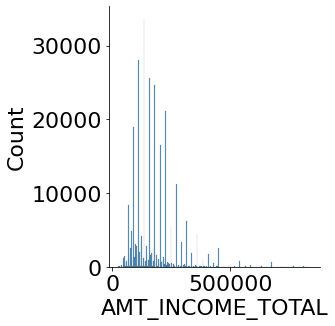

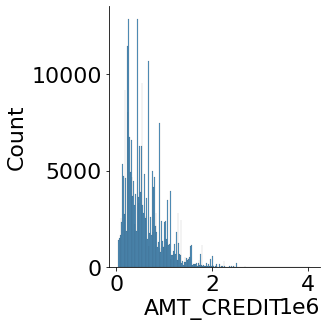

...

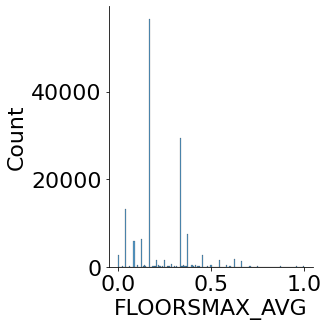

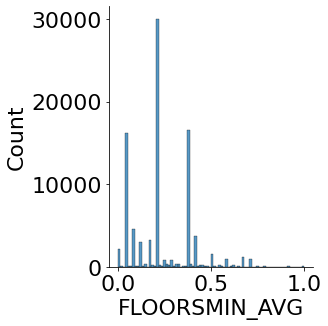

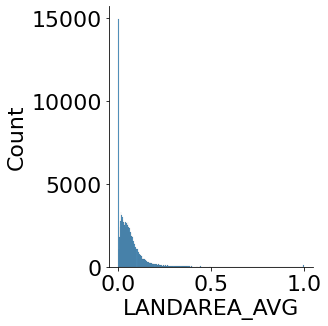

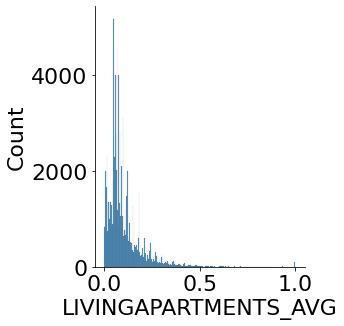

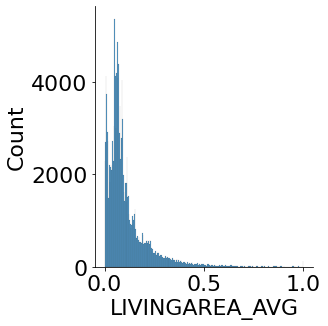

KeyboardInterrupt: ignored

In [ ]:
observe_distribution(df_app)

In [ ]:
observe_frequences(df_app)

  NAME_CONTRACT_TYPE       n         f         F
0         Cash loans  255967  0.910603  0.910603
1    Revolving loans   25129  0.089397  1.000000
  CODE_GENDER       n         f         F
0           F  174692  0.621467  0.621467
1           M  106401  0.378522  0.999989
2         XNA       3  0.000011  1.000000
  FLAG_OWN_CAR       n         f         F
0            N  177385  0.631048  0.631048
1            Y  103711  0.368952  1.000000
  FLAG_OWN_REALTY       n         f         F
1               N   91113  0.324135  0.324135
0               Y  189983  0.675865  1.000000
   NAME_TYPE_SUITE       n         f         F
3         Children    2402  0.008545  0.008545
1           Family   34789  0.123762  0.132307
6  Group of people     251  0.000893  0.133200
5          Other_A     831  0.002956  0.136156
4          Other_B    1588  0.005649  0.141806
2  Spouse, partner   10580  0.037638  0.179444
0    Unaccompanied  228912  0.814355  0.993799
       NAME_INCOME_TYPE       n         f 

## Pickling temporaire

### Ecriture

In [ ]:
with open('df_credit_card_balance_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_credit_card_balance, pickle_file)

files.download('df_credit_card_balance_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_POS_CASH_balance_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_POS_CASH_balance, pickle_file)

files.download('df_POS_CASH_balance_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_previous_application_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_previous_application, pickle_file)

files.download('df_previous_application_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_app_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_app, pickle_file)

files.download('df_app_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_bureau_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_bureau, pickle_file)

files.download('df_bureau_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_bureau_balance_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_bureau_balance, pickle_file)

files.download('df_bureau_balance_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_installments_payments_V0.pkl', 'wb') as pickle_file:
    pickle.dump(df_installments_payments, pickle_file)

files.download('df_installments_payments_V0.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Lecture

In [ ]:
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_credit_card_balance_V0.pkl', 'rb') as pickle_file:
    df_credit_card_balance_V0 = pickle.load(pickle_file)

df_credit_card_balance = df_credit_card_balance_V0.copy()

In [ ]:
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_POS_CASH_balance_V0.pkl', 'rb') as pickle_file:
    df_POS_CASH_balance_V0 = pickle.load(pickle_file)

df_POS_CASH_balance = df_POS_CASH_balance_V0.copy()

In [ ]:
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_previous_application_V0.pkl', 'rb') as pickle_file:
    df_previous_application_V0 = pickle.load(pickle_file)

df_previous_application = df_previous_application_V0.copy()

In [ ]:
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_app_V0.pkl', 'rb') as pickle_file:
    df_app_V0 = pickle.load(pickle_file)

df_app = df_app_V0.copy()

## Données manquantes

### Fonctions utilisées

In [ ]:
pd.set_option('display.max_column', 150)

In [ ]:
pd.set_option('display.max_colwidth', 500)

In [ ]:
"""Print the missing rate for each variable."""


def missing_rate(df):
    pd.set_option('display.max_row', 150)
    # Taux de valeurs manquantes par colonnes
    missing_rate = df.isna().sum()/df.shape[0]  #des choses comptées par isna qui ne sont pas des nan
    # Trier par ordre croissant
    missing_values = missing_rate.sort_values(ascending=True)
    #print(missing_values)#missing_rate.sort_values(ascending=True))
    # Afficher le graphique des valeurs manquantes
    graph = missing_rate.sort_values(ascending=False).plot.bar(color='gold')
    #Change size of labels
    print(missing_values)
    print(graph)#missing_rate.sort_values(ascending=False).plot.bar(color='gold'))
    #return missing_values, graph
    pd.set_option('display.max_row', 15)

In [ ]:
"""Filter all columns with a NaN rate => 50%"""


def filter_by_missing_rate(df, rate=0.5):
    global df_filtered
    df_filtered = df[df.columns[df.isna().sum()/df.shape[0] <= rate]]
    return df_filtered

In [ ]:
"""Adding a constant to the values of each rows in a column"""


def add_cst_col(df, list_col, cst=1):
    global df_constant
    df_constant = df.copy()
    for col in list_col:
        df_constant[col] = df_constant[col].apply(lambda x: x + cst)
        return df_constant

In [ ]:
"""Imputing values fixed by the imputer on the NaN in only certain columns."""


def column_imputer(df, list_for_imputation, imputer):
    global df_imputation
    df_imputation = df.copy()
    for col in df_imputation.columns:
        # Impute is column is in the list 'list_for_imputation"
        if col in list_for_imputation:
            df_for_transfo = df_imputation[col].values.reshape(-1, 1)
            new_array = imputer.fit_transform(df_for_transfo)
            new_col = pd.DataFrame(new_array)
            # Replace the column in the df
            df_imputation[col] = new_col
    return df_imputation

In [ ]:
"""Imputing median when there are NaN in some selected columns."""


def impute_median(df, list_for_imputation):
    for col in df.columns:
        # Impute is column is in the list 'list_for_imputation"
        if col in list_for_imputation:
            print('Les valeurs manquantes sont remplacées par la médiane pour la variable', col)
            df[col] = df[col].fillna((df[col].median()))
    return df

In [ ]:
"""Imputing zero when there are NaN in some selected columns."""


def impute_zero(df, list_for_imputation):
    for col in df.columns:
        # Impute is column is in the list 'list_for_imputation"
        if col in list_for_imputation:
            print('Les valeurs manquantes sont remplacées par zéro pour la variable', col)
            df[col] = df[col].fillna(0.0)
    return df

### df_bureau

#### Observations

SK_ID_CURR                0.000000
SK_ID_BUREAU              0.000000
CREDIT_ACTIVE             0.000000
CREDIT_CURRENCY           0.000000
DAYS_CREDIT               0.000000
CREDIT_DAY_OVERDUE        0.000000
DAYS_CREDIT_UPDATE        0.000000
CNT_CREDIT_PROLONG        0.000000
AMT_CREDIT_SUM_OVERDUE    0.000000
CREDIT_TYPE               0.000000
AMT_CREDIT_SUM            0.000008
DAYS_CREDIT_ENDDATE       0.061496
AMT_CREDIT_SUM_DEBT       0.150119
AMT_CREDIT_SUM_LIMIT      0.344774
DAYS_ENDDATE_FACT         0.369170
AMT_CREDIT_MAX_OVERDUE    0.655133
AMT_ANNUITY               0.714735
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


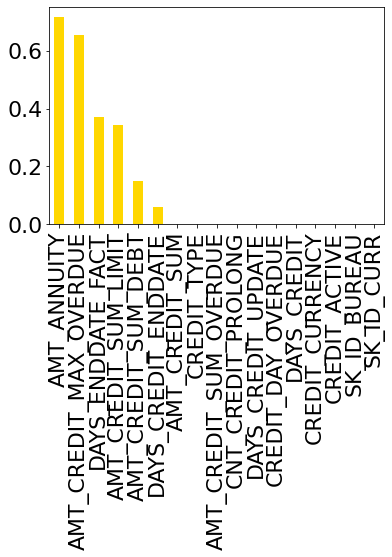

In [ ]:
missing_rate(df_bureau)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_CREDIT_ENDDATE']

,Unnamed: 0,Table,Row,Description,Special
128,131,bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application


In [ ]:
df_bureau[df_bureau['DAYS_CREDIT_ENDDATE']==0]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
1466,100302,5372597,Closed,currency 1,-730,0,0.0,-636.0,NaN,0,18373.5,0.0,0.0,0.0,Consumer credit,-634,0.0
4922,101059,5484980,Active,currency 1,-1091,0,0.0,NaN,NaN,0,180000.0,154485.0,0.0,0.0,Credit card,-29,NaN
6495,101405,6410234,Closed,currency 1,-1826,0,0.0,-223.0,NaN,0,450000.0,0.0,0.0,0.0,Consumer credit,-220,NaN
6554,101415,5424601,Closed,currency 1,-365,0,0.0,-333.0,NaN,0,69637.5,0.0,0.0,0.0,Consumer credit,-325,NaN
9018,101946,5378675,Closed,currency 1,-16,0,0.0,-3.0,NaN,0,22500.0,0.0,0.0,0.0,Consumer credit,-1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1710382,455021,6011781,Closed,currency 1,-365,0,0.0,-149.0,NaN,0,89955.0,0.0,NaN,0.0,Consumer credit,-147,NaN
1713080,455559,6265723,Closed,currency 1,-1096,0,0.0,-279.0,NaN,0,225000.0,0.0,0.0,0.0,Consumer credit,-111,NaN
1713549,455657,5872258,Closed,currency 1,-185,0,0.0,-89.0,0.0,0,30168.0,0.0,0.0,0.0,Consumer credit,-89,0.0
1715106,455986,5009305,Active,currency 1,-365,0,0.0,NaN,0.0,0,33975.0,3172.5,0.0,0.0,Consumer credit,-31,29565.0


Observation :

If NaN: add 1 to all the values of the column and impute 0 on NaN 

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_CREDIT_SUM']

,Unnamed: 0,Table,Row,Description,Special
132,135,bureau.csv,AMT_CREDIT_SUM,Current credit amount for the Credit Bureau credit,NaN


In [ ]:
df_bureau[df_bureau['AMT_CREDIT_SUM']==0]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
276,100063,5680683,Active,currency 1,-381,0,1282.0,1281.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-14,0.000
278,100063,5680685,Active,currency 1,-381,0,1282.0,1281.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-14,0.000
442,100099,6221642,Closed,currency 1,-1010,0,-643.0,-430.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-423,0.000
711,100161,6315872,Active,currency 1,-508,0,1177.0,1176.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-507,12911.850
855,100181,5066513,Closed,currency 1,-1006,0,9955.0,-862.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-862,13180.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716229,456219,5290606,Active,currency 1,-227,0,1.0,0.0,175.5,0,0.0,0.000,0.000,0.0,Credit card,-10,0.000
1716257,456224,6436442,Active,currency 1,-1358,0,1.0,0.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-19,0.000
1716301,456234,5087532,Active,currency 1,-1118,0,-435.0,-436.0,0.0,0,0.0,-385.785,385.785,0.0,Credit card,-662,13125.015
1716364,456244,6643928,Closed,currency 1,-1497,0,1.0,-1355.0,0.0,0,0.0,0.000,0.000,0.0,Credit card,-1355,0.000


Observation : 

If NaN: Delete the rows.

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_CREDIT_SUM_DEBT']

,Unnamed: 0,Table,Row,Description,Special
133,136,bureau.csv,AMT_CREDIT_SUM_DEBT,Current debt on Credit Bureau credit,NaN


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_CREDIT_SUM_LIMIT']

,Unnamed: 0,Table,Row,Description,Special
134,137,bureau.csv,AMT_CREDIT_SUM_LIMIT,Current credit limit of credit card reported in Credit Bureau,NaN


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_ENDDATE_FACT']

,Unnamed: 0,Table,Row,Description,Special
129,132,bureau.csv,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application


In [ ]:
df_bureau[df_bureau['DAYS_ENDDATE_FACT']==0]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
93074,119422,6366969,Closed,currency 1,-13,0,NaN,0.0,NaN,0,18000.0,0.0,NaN,0.0,Microloan,0,NaN
114209,123782,6172580,Closed,currency 1,-45,0,-29.0,0.0,NaN,0,9000.0,0.0,NaN,0.0,Microloan,0,NaN
114210,123782,6172581,Closed,currency 1,-27,0,-11.0,0.0,NaN,0,22500.0,0.0,NaN,0.0,Microloan,0,NaN
114211,123782,6172582,Closed,currency 1,-104,0,-88.0,0.0,NaN,0,13500.0,0.0,NaN,0.0,Microloan,0,NaN
137886,128781,6450462,Closed,currency 1,-95,0,-79.0,0.0,NaN,0,4500.0,0.0,NaN,0.0,Microloan,0,NaN
137887,128781,6450463,Closed,currency 1,-54,0,-38.0,0.0,NaN,0,9000.0,0.0,NaN,0.0,Microloan,0,NaN
148147,130789,6391106,Closed,currency 1,-103,0,-87.0,0.0,NaN,0,67500.0,0.0,NaN,0.0,Microloan,0,0.0
162567,133747,6727907,Closed,currency 1,-93,0,-77.0,0.0,NaN,0,18000.0,0.0,NaN,0.0,Microloan,0,0.0
162568,133747,6727908,Closed,currency 1,-121,0,-105.0,0.0,NaN,0,13500.0,0.0,NaN,0.0,Microloan,0,1008.0
162569,133747,6727909,Closed,currency 1,-151,0,-135.0,0.0,NaN,0,9000.0,0.0,NaN,0.0,Microloan,0,2754.0


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_CREDIT_ENDDATE']

,Unnamed: 0,Table,Row,Description,Special
128,131,bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at t...,time only relative to the application


In [ ]:
df_bureau[['DAYS_CREDIT_ENDDATE','DAYS_ENDDATE_FACT']].head(20)

,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT
0,-492.0,-553.0
1,-179.0,-877.0
2,-514.0,-544.0
3,-1329.0,-1328.0
4,902.0,NaN
...,...,...
15,-2434.0,-2131.0
16,-540.0,-540.0
17,-420.0,-621.0
18,1216.0,NaN


In [ ]:
df_bureau[(df_bureau['DAYS_CREDIT_ENDDATE']==0) & (df_bureau['DAYS_ENDDATE_FACT']==0)]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
569113,218026,5166495,Closed,currency 1,-16,0,0.0,0.0,NaN,0,9000.0,0.0,NaN,0.0,Microloan,0,21555.0


Observation :

If NaN: replace value of 'DAYS_ENDDATE_FACT' by 'DAYS_CREDIT_ENDDATE'. Delete rows for which there is no values on either column.

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_CREDIT_MAX_OVERDUE']

,Unnamed: 0,Table,Row,Description,Special
130,133,bureau.csv,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),NaN


In [ ]:
df_bureau[df_bureau['AMT_CREDIT_MAX_OVERDUE']==0]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
7,100002,6113835,Closed,currency 1,-1043,0,62.0,-967.0,0.0,0,67500.00,NaN,NaN,0.0,Credit card,-758,0.000
11,100002,6158906,Closed,currency 1,-1437,0,-1072.0,-1185.0,0.0,0,135000.00,0.000,0.000,0.0,Consumer credit,-1185,0.000
15,100003,5885877,Closed,currency 1,-2586,0,-2434.0,-2131.0,0.0,0,22248.00,0.000,0.000,0.0,Consumer credit,-2131,NaN
16,100003,5885878,Closed,currency 1,-1636,0,-540.0,-540.0,0.0,0,112500.00,0.000,0.000,0.0,Credit card,-540,NaN
17,100003,5885879,Closed,currency 1,-775,0,-420.0,-621.0,0.0,0,72652.50,0.000,0.000,0.0,Consumer credit,-550,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716407,456249,5371705,Closed,currency 1,-1680,0,NaN,-291.0,0.0,0,315000.00,0.000,0.000,0.0,Credit card,-208,NaN
1716408,456249,5371706,Closed,currency 1,-903,0,-658.0,-658.0,0.0,0,765000.00,0.000,0.000,0.0,Another type of loan,-657,NaN
1716410,456250,6817237,Active,currency 1,-760,0,1797.0,NaN,0.0,0,2153110.05,1840308.480,0.000,0.0,Consumer credit,-23,51799.500
1716411,456250,6817238,Active,currency 1,-824,0,2340.0,NaN,0.0,0,450000.00,391731.615,58268.385,0.0,Credit card,-31,27757.395


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CREDIT_DAY_OVERDUE']

,Unnamed: 0,Table,Row,Description,Special
127,130,bureau.csv,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the ti...,NaN


Observation :

If NaN: replace value of 'AMT_CREDIT_MAX_OVERDUE' by 'CREDIT_DAY_OVERDUE'.

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_ANNUITY']

,Unnamed: 0,Table,Row,Description,Special
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN
138,141,bureau.csv,AMT_ANNUITY,Annuity of the Credit Bureau credit,NaN
176,179,previous_application.csv,AMT_ANNUITY,Annuity of previous application,NaN


In [ ]:
df_bureau[df_bureau['AMT_ANNUITY']==0]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,100001,5896630,Closed,currency 1,-857,0,-492.0,-553.0,NaN,0,112500.0,0.00,0.0,0.0,Consumer credit,-155,0.0
1,100001,5896631,Closed,currency 1,-909,0,-179.0,-877.0,NaN,0,279720.0,0.00,0.0,0.0,Consumer credit,-155,0.0
2,100001,5896632,Closed,currency 1,-879,0,-514.0,-544.0,NaN,0,91620.0,0.00,0.0,0.0,Consumer credit,-155,0.0
3,100001,5896633,Closed,currency 1,-1572,0,-1329.0,-1328.0,NaN,0,85500.0,0.00,0.0,0.0,Consumer credit,-155,0.0
7,100002,6113835,Closed,currency 1,-1043,0,62.0,-967.0,0.0,0,67500.0,NaN,NaN,0.0,Credit card,-758,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716419,456255,5126329,Active,currency 1,-573,0,523.0,NaN,NaN,0,553500.0,324171.00,0.0,0.0,Consumer credit,-19,0.0
1716421,456255,5126331,Active,currency 1,-1020,0,806.0,NaN,NaN,0,810000.0,595102.50,NaN,0.0,Consumer credit,-8,0.0
1716423,456255,5126333,Active,currency 1,-363,0,1463.0,NaN,0.0,0,436032.0,363573.54,0.0,0.0,Consumer credit,-25,0.0
1716425,456255,5126335,Closed,currency 1,-1512,0,315.0,-781.0,25578.0,0,900000.0,NaN,NaN,0.0,Consumer credit,-781,0.0


Observation :

If NaN: Delete the rows

#### Imputation et suppression

In [ ]:
df_bureau.dropna(subset=['AMT_ANNUITY', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_LIMIT'], inplace=True)

SK_ID_CURR                0.000000
CREDIT_TYPE               0.000000
AMT_CREDIT_SUM_OVERDUE    0.000000
AMT_CREDIT_SUM_LIMIT      0.000000
AMT_CREDIT_SUM_DEBT       0.000000
AMT_CREDIT_SUM            0.000000
CNT_CREDIT_PROLONG        0.000000
DAYS_CREDIT_UPDATE        0.000000
AMT_ANNUITY               0.000000
CREDIT_DAY_OVERDUE        0.000000
DAYS_CREDIT               0.000000
CREDIT_CURRENCY           0.000000
CREDIT_ACTIVE             0.000000
SK_ID_BUREAU              0.000000
DAYS_CREDIT_ENDDATE       0.053329
DAYS_ENDDATE_FACT         0.402798
AMT_CREDIT_MAX_OVERDUE    0.691106
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


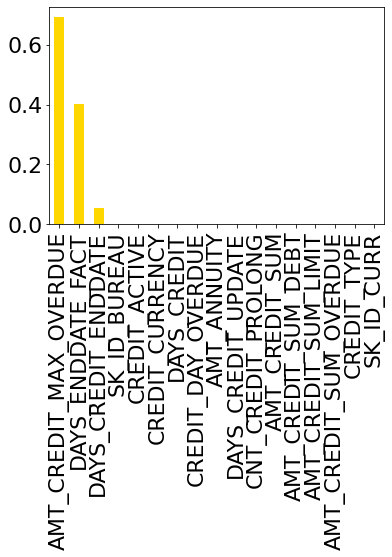

In [ ]:
missing_rate(df_bureau)

In [ ]:
df_bureau = filter_by_missing_rate(df_bureau, rate=0.5)

SK_ID_CURR                0.000000
SK_ID_BUREAU              0.000000
CREDIT_ACTIVE             0.000000
CREDIT_CURRENCY           0.000000
DAYS_CREDIT               0.000000
CREDIT_DAY_OVERDUE        0.000000
CNT_CREDIT_PROLONG        0.000000
AMT_CREDIT_SUM            0.000000
AMT_CREDIT_SUM_DEBT       0.000000
AMT_CREDIT_SUM_LIMIT      0.000000
AMT_CREDIT_SUM_OVERDUE    0.000000
CREDIT_TYPE               0.000000
DAYS_CREDIT_UPDATE        0.000000
AMT_ANNUITY               0.000000
DAYS_CREDIT_ENDDATE       0.053329
DAYS_ENDDATE_FACT         0.402798
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


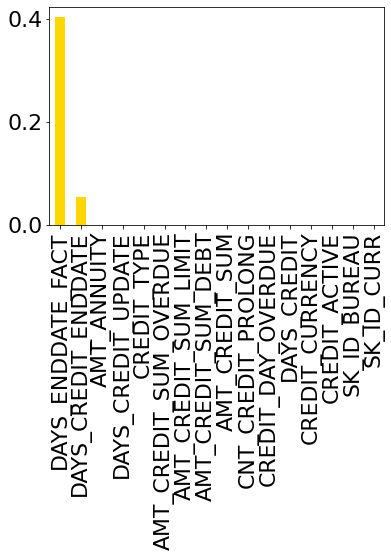

In [ ]:
missing_rate(df_bureau)

In [ ]:
# If NaN: impute value of 'DAYS_CREDIT_ENDDATE' if 'DAYS_ENDDATE_FACT' is NaN
df_bureau['DAYS_ENDDATE_FACT'].fillna(df_bureau['DAYS_CREDIT_ENDDATE'], inplace=True)

# Delete rows for which there is no values on either column 
df_bureau.dropna(subset=['DAYS_ENDDATE_FACT', 'DAYS_CREDIT_ENDDATE'], inplace=True)

SK_ID_CURR                0.0
SK_ID_BUREAU              0.0
CREDIT_ACTIVE             0.0
CREDIT_CURRENCY           0.0
DAYS_CREDIT               0.0
CREDIT_DAY_OVERDUE        0.0
DAYS_CREDIT_ENDDATE       0.0
DAYS_ENDDATE_FACT         0.0
CNT_CREDIT_PROLONG        0.0
AMT_CREDIT_SUM            0.0
AMT_CREDIT_SUM_DEBT       0.0
AMT_CREDIT_SUM_LIMIT      0.0
AMT_CREDIT_SUM_OVERDUE    0.0
CREDIT_TYPE               0.0
DAYS_CREDIT_UPDATE        0.0
AMT_ANNUITY               0.0
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


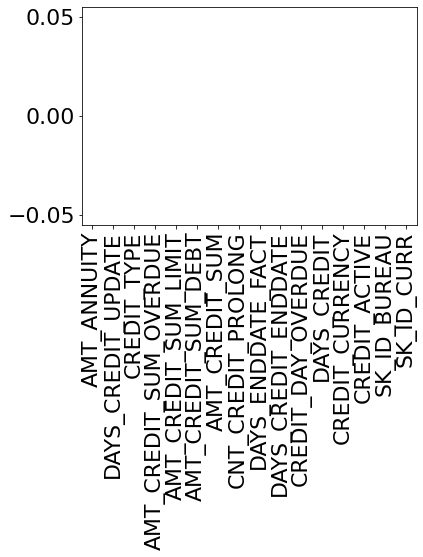

In [ ]:
missing_rate(df_bureau)

### df_bureau_balance

SK_ID_BUREAU      0.0
MONTHS_BALANCE    0.0
STATUS            0.0
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


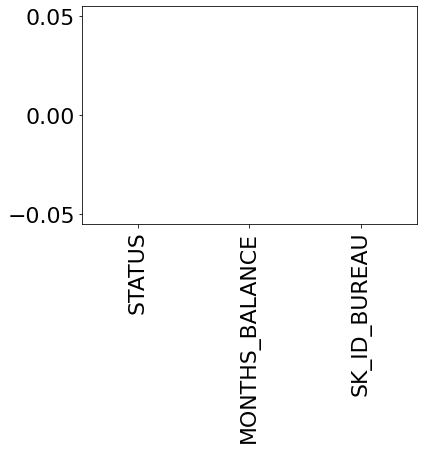

In [ ]:
missing_rate(df_bureau_balance)

### df_credit_card_balance

#### Observations

SK_ID_PREV                    0.000000
NAME_CONTRACT_STATUS          0.000000
CNT_DRAWINGS_CURRENT          0.000000
AMT_TOTAL_RECEIVABLE          0.000000
AMT_RECIVABLE                 0.000000
AMT_RECEIVABLE_PRINCIPAL      0.000000
SK_DPD                        0.000000
AMT_PAYMENT_TOTAL_CURRENT     0.000000
AMT_DRAWINGS_CURRENT          0.000000
AMT_CREDIT_LIMIT_ACTUAL       0.000000
AMT_BALANCE                   0.000000
MONTHS_BALANCE                0.000000
SK_ID_CURR                    0.000000
SK_DPD_DEF                    0.000000
AMT_INST_MIN_REGULARITY       0.079482
CNT_INSTALMENT_MATURE_CUM     0.079482
AMT_DRAWINGS_POS_CURRENT      0.195249
AMT_DRAWINGS_ATM_CURRENT      0.195249
CNT_DRAWINGS_ATM_CURRENT      0.195249
CNT_DRAWINGS_OTHER_CURRENT    0.195249
CNT_DRAWINGS_POS_CURRENT      0.195249
AMT_DRAWINGS_OTHER_CURRENT    0.195249
AMT_PAYMENT_CURRENT           0.199981
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


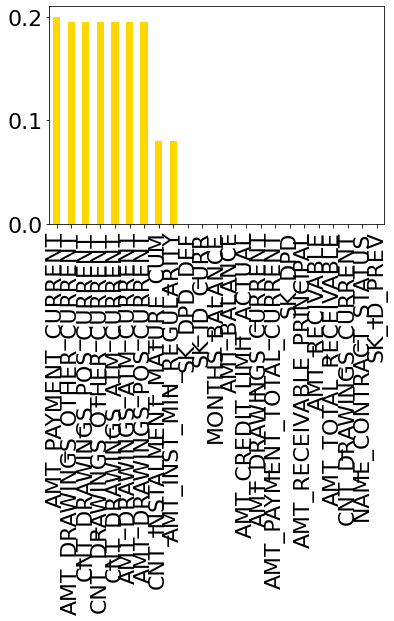

In [ ]:
missing_rate(df_credit_card_balance)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_INST_MIN_REGULARITY']

,Unnamed: 0,Table,Row,Description,Special
159,162,credit_card_balance.csv,AMT_INST_MIN_REGULARITY,Minimal installment for this month of the previous credit,NaN


In [ ]:
df_credit_card_balance['AMT_INST_MIN_REGULARITY'].unique()

array([   0.   , 9000.   ,  804.195, ..., 8643.6  , 9892.485, 9653.985])

In [ ]:
df_credit_card_balance[df_credit_card_balance['AMT_INST_MIN_REGULARITY']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1489396,100006,-2,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
1,1489396,100006,-1,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
2,1489396,100006,-5,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3,1489396,100006,-3,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
4,1489396,100006,-4,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840297,2743495,456248,-10,0.000,900000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840298,2743495,456248,-12,0.000,900000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840299,2743495,456248,-15,0.000,900000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840309,1794451,456250,-12,181993.500,180000,171000.0,171000.0,0.0,0.0,0.0,NaN,0.0,171000.0,171000.000,171000.000,7.0,7,0.0,0.0,0.0,Active,0,0


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_INSTALMENT_MATURE_CUM']

,Unnamed: 0,Table,Row,Description,Special
169,172,credit_card_balance.csv,CNT_INSTALMENT_MATURE_CUM,Number of paid installments on the previous credit,NaN


In [ ]:
df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM'].unique()

array([  0.,  27.,  33.,  21.,  32.,  10.,  17.,  14.,  15.,  31.,   8.,
         3.,   5.,  28.,  20.,  16.,  25.,   4.,   9.,  29.,  26.,  13.,
         2.,   1.,  18.,  19.,  23.,  nan,   7.,  24.,  12.,  11.,  22.,
        30.,   6.,  35.,  34.,  39.,  38.,  36.,  37.,  60.,  40.,  49.,
        48.,  54.,  57.,  43.,  61.,  58.,  50.,  42.,  62.,  55.,  64.,
        44.,  46.,  52.,  65.,  63.,  59.,  53.,  45.,  51.,  41.,  47.,
        56.,  69.,  72.,  74.,  68.,  66.,  73.,  70.,  71.,  67.,  92.,
        80.,  75.,  83.,  78.,  91.,  94.,  90.,  84.,  95.,  88.,  93.,
        86.,  81.,  77.,  87.,  82.,  85.,  76.,  79.,  89.,  98.,  97.,
        96.,  99., 106., 109., 111., 113., 117., 100., 102., 118., 114.,
       105., 116., 103., 101., 115., 112., 119., 107., 110., 104., 108.,
       120.])

In [ ]:
df_credit_card_balance[df_credit_card_balance['CNT_INSTALMENT_MATURE_CUM']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1489396,100006,-2,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
1,1489396,100006,-1,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
2,1489396,100006,-5,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3,1489396,100006,-3,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
4,1489396,100006,-4,0.000,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840297,2743495,456248,-10,0.000,900000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840298,2743495,456248,-12,0.000,900000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840299,2743495,456248,-15,0.000,900000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840309,1794451,456250,-12,181993.500,180000,171000.0,171000.0,0.0,0.0,0.0,NaN,0.0,171000.0,171000.000,171000.000,7.0,7,0.0,0.0,0.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_DRAWINGS_POS_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
158,161,credit_card_balance.csv,AMT_DRAWINGS_POS_CURRENT,Amount drawing or buying goods during the month of the previous credit,NaN


In [ ]:
df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT'].unique()

array([      nan,     0.   ,  6153.975, ..., 45507.6  , 48929.85 ,
       26104.05 ])

In [ ]:
df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_POS_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
6,1843384,100011,-48,75109.950,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,71127.360,75109.950,75109.950,0.0,0,0.0,0.0,27.0,Active,0,0
7,1843384,100011,-4,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
8,1843384,100011,-6,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
9,1843384,100011,-54,104130.630,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,99744.615,104130.630,104130.630,0.0,0,0.0,0.0,21.0,Active,0,0
10,1843384,100011,-18,0.000,180000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.000,590.625,172012.320,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000,180000,0.0,0.0,0.0,0.0,9465.705,9675.000,434.295,174653.820,176958.900,176958.900,0.0,0,0.0,0.0,3.0,Active,0,0
3840309,1794451,456250,-12,181993.500,180000,171000.0,171000.0,0.0,0.0,0.000,NaN,0.000,171000.000,171000.000,171000.000,7.0,7,0.0,0.0,0.0,Active,0,0
3840310,1794451,456250,-11,200208.915,180000,9000.0,9000.0,0.0,0.0,0.000,NaN,0.000,180000.000,196581.915,196581.915,1.0,1,0.0,0.0,0.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_DRAWINGS_ATM_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
155,158,credit_card_balance.csv,AMT_DRAWINGS_ATM_CURRENT,Amount drawing at ATM during the month of the previous credit,NaN


In [ ]:
df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT'].unique()

array([    nan,      0., 180000., ..., 643500., 341550., 135090.])

In [ ]:
df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_ATM_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
6,1843384,100011,-48,75109.950,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,71127.360,75109.950,75109.950,0.0,0,0.0,0.0,27.0,Active,0,0
7,1843384,100011,-4,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
8,1843384,100011,-6,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
9,1843384,100011,-54,104130.630,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,99744.615,104130.630,104130.630,0.0,0,0.0,0.0,21.0,Active,0,0
10,1843384,100011,-18,0.000,180000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840305,1794451,456250,-5,169443.855,180000,0.0,0.0,0.0,0.0,8931.420,9000.000,195.435,167091.345,169443.855,169443.855,0.0,0,0.0,0.0,6.0,Active,0,0
3840306,1794451,456250,-10,186577.605,180000,0.0,0.0,0.0,0.0,9892.485,20250.000,11250.000,178200.000,185907.105,185907.105,0.0,0,0.0,0.0,1.0,Active,0,0
3840307,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.000,590.625,172012.320,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000,180000,0.0,0.0,0.0,0.0,9465.705,9675.000,434.295,174653.820,176958.900,176958.900,0.0,0,0.0,0.0,3.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_DRAWINGS_ATM_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
165,168,credit_card_balance.csv,CNT_DRAWINGS_ATM_CURRENT,Number of drawings at ATM during this month on the previous credit,NaN


In [ ]:
df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT'].unique()

array([nan,  0.,  4.,  7.,  1.,  3.,  2., 11.,  8., 10.,  5.,  6.,  9.,
       12., 13., 17., 15., 14., 16., 22., 20., 25., 23., 21., 30., 19.,
       27., 18., 28., 31., 26., 35., 39., 24., 34., 33., 32., 38., 29.,
       36., 43., 44., 37., 41., 51.])

In [ ]:
df_credit_card_balance[df_credit_card_balance['CNT_DRAWINGS_ATM_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
6,1843384,100011,-48,75109.950,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,71127.360,75109.950,75109.950,0.0,0,0.0,0.0,27.0,Active,0,0
7,1843384,100011,-4,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
8,1843384,100011,-6,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
9,1843384,100011,-54,104130.630,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,99744.615,104130.630,104130.630,0.0,0,0.0,0.0,21.0,Active,0,0
10,1843384,100011,-18,0.000,180000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840305,1794451,456250,-5,169443.855,180000,0.0,0.0,0.0,0.0,8931.420,9000.000,195.435,167091.345,169443.855,169443.855,0.0,0,0.0,0.0,6.0,Active,0,0
3840306,1794451,456250,-10,186577.605,180000,0.0,0.0,0.0,0.0,9892.485,20250.000,11250.000,178200.000,185907.105,185907.105,0.0,0,0.0,0.0,1.0,Active,0,0
3840307,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.000,590.625,172012.320,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000,180000,0.0,0.0,0.0,0.0,9465.705,9675.000,434.295,174653.820,176958.900,176958.900,0.0,0,0.0,0.0,3.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_DRAWINGS_OTHER_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
167,170,credit_card_balance.csv,CNT_DRAWINGS_OTHER_CURRENT,Number of other drawings during this month on the previous credit,NaN


In [ ]:
df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT'].unique()

array([nan,  0.,  1.,  3.,  4.,  2.,  5.,  6., 10.,  7., 12.,  8.])

In [ ]:
df_credit_card_balance[df_credit_card_balance['CNT_DRAWINGS_OTHER_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
6,1843384,100011,-48,75109.950,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,71127.360,75109.950,75109.950,0.0,0,0.0,0.0,27.0,Active,0,0
7,1843384,100011,-4,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
8,1843384,100011,-6,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
9,1843384,100011,-54,104130.630,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,99744.615,104130.630,104130.630,0.0,0,0.0,0.0,21.0,Active,0,0
10,1843384,100011,-18,0.000,180000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.000,590.625,172012.320,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000,180000,0.0,0.0,0.0,0.0,9465.705,9675.000,434.295,174653.820,176958.900,176958.900,0.0,0,0.0,0.0,3.0,Active,0,0
3840309,1794451,456250,-12,181993.500,180000,171000.0,171000.0,0.0,0.0,0.000,NaN,0.000,171000.000,171000.000,171000.000,7.0,7,0.0,0.0,0.0,Active,0,0
3840310,1794451,456250,-11,200208.915,180000,9000.0,9000.0,0.0,0.0,0.000,NaN,0.000,180000.000,196581.915,196581.915,1.0,1,0.0,0.0,0.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_DRAWINGS_POS_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
168,171,credit_card_balance.csv,CNT_DRAWINGS_POS_CURRENT,Number of drawings for goods during this month on the previous credit,NaN


In [ ]:
df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT'].unique()

array([ nan,   0.,   3.,   2.,   1.,   4.,   5.,   6.,   9.,   7.,  12.,
        10.,  15.,   8.,  26.,  17.,  11.,  22.,  13.,  21.,  14.,  24.,
        16.,  40.,  72.,  19.,  20.,  29.,  46.,  18.,  52.,  28.,  27.,
        43.,  25.,  67.,  56.,  47.,  36.,  58.,  85.,  35.,  81.,  53.,
        30.,  69.,  34.,  41.,  74.,  50.,  45.,  49.,  48.,  23.,  38.,
        42.,  33.,  32.,  39.,  31.,  37., 114., 140.,  62.,  70.,  44.,
        54.,  57.,  71.,  61.,  65.,  60., 101.,  59.,  97.,  93.,  51.,
        84.,  80.,  77.,  66.,  63.,  76., 118.,  55.,  86.,  75.,  82.,
        73.,  78.,  96.,  87.,  83.,  89.,  99.,  79.,  88.,  68., 108.,
        98.,  64., 102.,  94.,  92.,  95.,  91., 105.,  90., 119., 104.,
       112., 116., 162., 103., 130., 123., 126., 110., 107., 115., 109.,
       120., 135., 121., 100., 106., 117., 165., 151., 143., 136., 124.,
       142., 111.])

In [ ]:
df_credit_card_balance[df_credit_card_balance['CNT_DRAWINGS_POS_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
6,1843384,100011,-48,75109.950,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,71127.360,75109.950,75109.950,0.0,0,0.0,0.0,27.0,Active,0,0
7,1843384,100011,-4,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
8,1843384,100011,-6,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
9,1843384,100011,-54,104130.630,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,99744.615,104130.630,104130.630,0.0,0,0.0,0.0,21.0,Active,0,0
10,1843384,100011,-18,0.000,180000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.000,590.625,172012.320,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000,180000,0.0,0.0,0.0,0.0,9465.705,9675.000,434.295,174653.820,176958.900,176958.900,0.0,0,0.0,0.0,3.0,Active,0,0
3840309,1794451,456250,-12,181993.500,180000,171000.0,171000.0,0.0,0.0,0.000,NaN,0.000,171000.000,171000.000,171000.000,7.0,7,0.0,0.0,0.0,Active,0,0
3840310,1794451,456250,-11,200208.915,180000,9000.0,9000.0,0.0,0.0,0.000,NaN,0.000,180000.000,196581.915,196581.915,1.0,1,0.0,0.0,0.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_DRAWINGS_OTHER_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
157,160,credit_card_balance.csv,AMT_DRAWINGS_OTHER_CURRENT,Amount of other drawings during the month of the previous credit,NaN


In [ ]:
df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT'].unique()

array([       nan,      0.   ,  14544.   , ...,  26325.   ,  27364.5  ,
       201241.575])

In [ ]:
df_credit_card_balance[df_credit_card_balance['AMT_DRAWINGS_OTHER_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
6,1843384,100011,-48,75109.950,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,71127.360,75109.950,75109.950,0.0,0,0.0,0.0,27.0,Active,0,0
7,1843384,100011,-4,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
8,1843384,100011,-6,0.000,90000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
9,1843384,100011,-54,104130.630,180000,0.0,0.0,0.0,0.0,9000.000,9000.000,9000.000,99744.615,104130.630,104130.630,0.0,0,0.0,0.0,21.0,Active,0,0
10,1843384,100011,-18,0.000,180000,0.0,0.0,0.0,0.0,0.000,563.355,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,33.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.000,590.625,172012.320,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3840308,1794451,456250,-8,177219.000,180000,0.0,0.0,0.0,0.0,9465.705,9675.000,434.295,174653.820,176958.900,176958.900,0.0,0,0.0,0.0,3.0,Active,0,0
3840309,1794451,456250,-12,181993.500,180000,171000.0,171000.0,0.0,0.0,0.000,NaN,0.000,171000.000,171000.000,171000.000,7.0,7,0.0,0.0,0.0,Active,0,0
3840310,1794451,456250,-11,200208.915,180000,9000.0,9000.0,0.0,0.0,0.000,NaN,0.000,180000.000,196581.915,196581.915,1.0,1,0.0,0.0,0.0,Active,0,0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_PAYMENT_CURRENT']

,Unnamed: 0,Table,Row,Description,Special
160,163,credit_card_balance.csv,AMT_PAYMENT_CURRENT,How much did the client pay during the month on the previous credit,NaN


In [ ]:
df_credit_card_balance['AMT_PAYMENT_CURRENT'].unique()

array([     nan, 9000.   ,  563.355, ..., 4143.42 , 1060.605, 5184.585])

In [ ]:
df_credit_card_balance[df_credit_card_balance['AMT_PAYMENT_CURRENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
61,1843384,100011,-75,189000.000,180000,180000.0,180000.00,0.0,0.00,NaN,0.0,0.0,180000.000,189000.00,189000.00,4.0,4,0.0,0.0,NaN,Active,0,0
85,2038692,100013,-69,105786.360,157500,0.0,0.00,0.0,0.00,7875.00,0.0,0.0,97686.585,105786.36,105786.36,0.0,0,0.0,0.0,15.0,Active,1,1
95,2038692,100013,-90,161420.220,157500,157500.0,157500.00,0.0,0.00,NaN,0.0,0.0,157500.000,161420.22,161420.22,7.0,7,0.0,0.0,NaN,Active,0,0
113,2038692,100013,-94,0.000,157500,NaN,0.00,NaN,NaN,NaN,0.0,0.0,0.000,0.00,0.00,NaN,0,NaN,NaN,NaN,Active,0,0
119,2038692,100013,-92,0.000,157500,NaN,0.00,NaN,NaN,NaN,0.0,0.0,0.000,0.00,0.00,NaN,0,NaN,NaN,NaN,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840159,2181926,456244,-41,313848.720,450000,279000.0,307953.45,0.0,28953.45,NaN,0.0,0.0,307953.450,309812.22,309812.22,3.0,7,0.0,4.0,NaN,Active,0,0
3840177,1079732,456246,-2,62.685,135000,0.0,1052.55,0.0,1052.55,130.50,0.0,0.0,62.190,62.19,62.19,0.0,1,0.0,1.0,7.0,Active,0,0
3840186,1595171,456247,-77,43.830,180000,0.0,0.00,0.0,0.00,43.83,0.0,0.0,0.000,43.83,43.83,0.0,0,0.0,0.0,19.0,Active,1,0
3840231,1595171,456247,-96,92781.450,180000,0.0,0.00,0.0,0.00,4500.00,0.0,0.0,86003.685,92781.45,92781.45,0.0,0,0.0,0.0,3.0,Active,1,1


Observation :

If NaN: Delete the rows

#### Imputation et suppression

In [ ]:
# Delete rows with no value for 'AMT_PAYMENT_CURRENT'
df_credit_card_balance.dropna(subset=['AMT_PAYMENT_CURRENT',
                                      'CNT_INSTALMENT_MATURE_CUM',
                                      'AMT_INST_MIN_REGULARITY'
                                      ], inplace=True)

SK_ID_PREV                    0.0
NAME_CONTRACT_STATUS          0.0
CNT_INSTALMENT_MATURE_CUM     0.0
CNT_DRAWINGS_POS_CURRENT      0.0
CNT_DRAWINGS_OTHER_CURRENT    0.0
CNT_DRAWINGS_CURRENT          0.0
CNT_DRAWINGS_ATM_CURRENT      0.0
AMT_TOTAL_RECEIVABLE          0.0
AMT_RECIVABLE                 0.0
AMT_RECEIVABLE_PRINCIPAL      0.0
SK_DPD                        0.0
AMT_PAYMENT_TOTAL_CURRENT     0.0
AMT_INST_MIN_REGULARITY       0.0
AMT_DRAWINGS_POS_CURRENT      0.0
AMT_DRAWINGS_OTHER_CURRENT    0.0
AMT_DRAWINGS_CURRENT          0.0
AMT_DRAWINGS_ATM_CURRENT      0.0
AMT_CREDIT_LIMIT_ACTUAL       0.0
AMT_BALANCE                   0.0
MONTHS_BALANCE                0.0
SK_ID_CURR                    0.0
AMT_PAYMENT_CURRENT           0.0
SK_DPD_DEF                    0.0
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


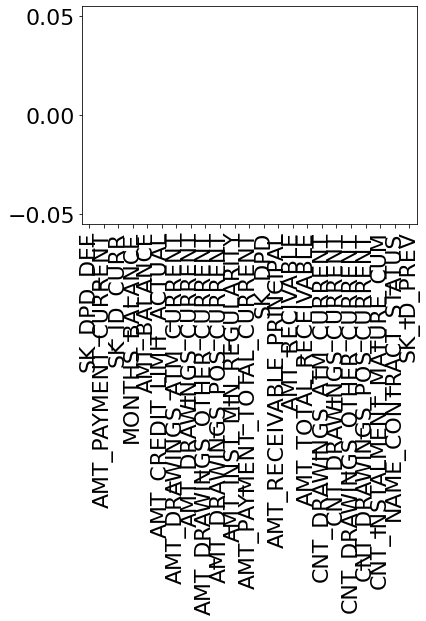

In [ ]:
missing_rate(df_credit_card_balance)

In [ ]:
# Create a list of columns to imputate with the median
credit_card_med = ['AMT_DRAWINGS_POS_CURRENT',
                    'AMT_DRAWINGS_ATM_CURRENT',
                    'CNT_DRAWINGS_ATM_CURRENT',
                    'CNT_DRAWINGS_OTHER_CURRENT',
                    'CNT_DRAWINGS_POS_CURRENT',
                    'AMT_DRAWINGS_OTHER_CURRENT'
                    ]

In [ ]:
#impute_median(df_credit_card_balance, credit_card_med)

In [ ]:
#missing_rate(df_credit_card_balance)

### df_POS_CASH_balance

#### Observations

SK_ID_PREV               0.000000
SK_ID_CURR               0.000000
MONTHS_BALANCE           0.000000
NAME_CONTRACT_STATUS     0.000000
SK_DPD                   0.000000
SK_DPD_DEF               0.000000
CNT_INSTALMENT           0.002607
CNT_INSTALMENT_FUTURE    0.002608
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


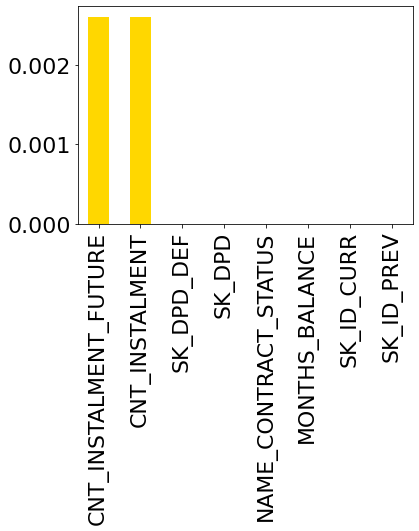

In [ ]:
missing_rate(df_POS_CASH_balance)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_INSTALMENT']

,Unnamed: 0,Table,Row,Description,Special
145,148,POS_CASH_balance.csv,CNT_INSTALMENT,Term of previous credit (can change over time),NaN


In [ ]:
df_POS_CASH_balance['CNT_INSTALMENT'].unique()

array([ 4., 24., 12.,  7.,  6.,  3., nan,  9.,  1., 48.,  5., 17., 18.,
       10., 30.,  8., 11., 23., 36., 14.,  2., 42., 21., 60., 26., 20.,
       25., 16., 54., 45., 38., 13., 15., 28., 32., 35., 19., 22., 59.,
       49., 29., 27., 33., 34., 41., 72., 37., 47., 61., 53., 31., 43.,
       55., 44., 39., 56., 46., 57., 40., 58., 50., 52., 64., 92., 51.,
       71., 62., 66., 63., 84., 68., 77., 70., 81.])

In [ ]:
df_POS_CASH_balance[df_POS_CASH_balance['CNT_INSTALMENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF


Observation :

If NaN: impute 0 to 'CNT_INSTALMENT'

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_INSTALMENT_FUTURE']

,Unnamed: 0,Table,Row,Description,Special
146,149,POS_CASH_balance.csv,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,NaN


Observation :

If NaN: impute 0 to 'CNT_INSTALMENT_FUTURE'

#### Imputation

SK_ID_PREV               0.000000
SK_ID_CURR               0.000000
MONTHS_BALANCE           0.000000
NAME_CONTRACT_STATUS     0.000000
SK_DPD                   0.000000
SK_DPD_DEF               0.000000
CNT_INSTALMENT           0.002607
CNT_INSTALMENT_FUTURE    0.002608
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


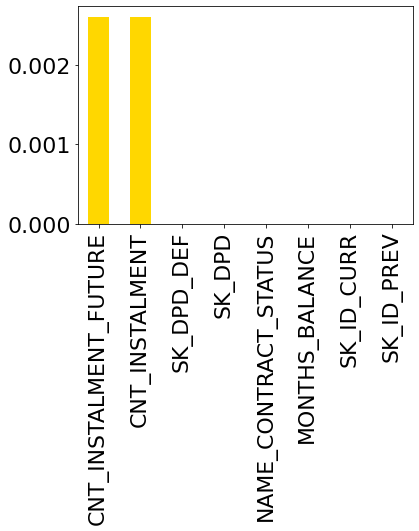

In [ ]:
missing_rate(df_POS_CASH_balance)

In [ ]:
df_POS_CASH_balance[df_POS_CASH_balance['CNT_INSTALMENT']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF


In [ ]:
df_POS_CASH_balance['CNT_INSTALMENT'].unique()

array([ 4., 24., 12.,  7.,  6.,  3., nan,  9.,  1., 48.,  5., 17., 18.,
       10., 30.,  8., 11., 23., 36., 14.,  2., 42., 21., 60., 26., 20.,
       25., 16., 54., 45., 38., 13., 15., 28., 32., 35., 19., 22., 59.,
       49., 29., 27., 33., 34., 41., 72., 37., 47., 61., 53., 31., 43.,
       55., 44., 39., 56., 46., 57., 40., 58., 50., 52., 64., 92., 51.,
       71., 62., 66., 63., 84., 68., 77., 70., 81.], dtype=float32)

In [ ]:
df_POS_CASH_balance[df_POS_CASH_balance['CNT_INSTALMENT']==np.nan]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF


In [ ]:
pd.set_option('display.max_colwidth', None)
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_INSTALMENT_FUTURE']

,Unnamed: 0,Table,Row,Description,Special
146,149,POS_CASH_balance.csv,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,NaN


In [ ]:
df_POS_CASH_balance[df_POS_CASH_balance['CNT_INSTALMENT_FUTURE']==0]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1369693,100001,-53,4.0,0.0,Completed,0,0
7,1851984,100001,-93,4.0,0.0,Completed,0,0
8,1851984,100001,-94,4.0,0.0,Active,0,0
34,1810518,100003,-18,7.0,0.0,Completed,0,0
51,2636178,100003,-21,6.0,0.0,Completed,0,0
...,...,...,...,...,...,...,...,...
10001324,2073384,456255,-17,3.0,0.0,Completed,0,0
10001326,2073384,456255,-18,3.0,0.0,Active,0,0
10001341,2631384,456255,-2,24.0,0.0,Completed,0,0
10001356,2729207,456255,-13,3.0,0.0,Completed,0,0


In [ ]:
imputer_posh_cash_0 = SimpleImputer(missing_values=np.nan,
                               strategy='constant',
                               fill_value=0.0, #Pour que ça soit un réel : 0.0 et non 0
                               verbose=0)

In [ ]:
posh_cash_0 = ['CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']

In [ ]:
impute_zero(df_POS_CASH_balance, posh_cash_0)

Les valeurs manquantes sont remplacées par zéro pour la variable CNT_INSTALMENT
Les valeurs manquantes sont remplacées par zéro pour la variable CNT_INSTALMENT_FUTURE


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1369693,100001,-53,4.0,0.0,Completed,0,0
1,1369693,100001,-54,4.0,1.0,Active,0,0
2,1369693,100001,-57,4.0,4.0,Active,0,0
3,1369693,100001,-55,4.0,2.0,Active,0,0
4,1369693,100001,-56,4.0,3.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2631384,456255,-21,36.0,31.0,Active,0,0
10001354,2729207,456255,-15,6.0,5.0,Active,0,0
10001355,2729207,456255,-16,6.0,6.0,Active,0,0
10001356,2729207,456255,-13,3.0,0.0,Completed,0,0


SK_ID_PREV               0.0
SK_ID_CURR               0.0
MONTHS_BALANCE           0.0
CNT_INSTALMENT           0.0
CNT_INSTALMENT_FUTURE    0.0
NAME_CONTRACT_STATUS     0.0
SK_DPD                   0.0
SK_DPD_DEF               0.0
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


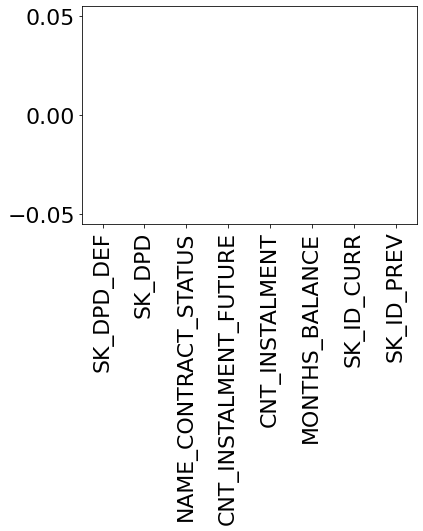

In [ ]:
missing_rate(df_POS_CASH_balance) #estce que fonction détecte np.nan

### df_installments_payments

#### Observations

SK_ID_PREV                0.000000
SK_ID_CURR                0.000000
NUM_INSTALMENT_VERSION    0.000000
NUM_INSTALMENT_NUMBER     0.000000
DAYS_INSTALMENT           0.000000
AMT_INSTALMENT            0.000000
DAYS_ENTRY_PAYMENT        0.000214
AMT_PAYMENT               0.000214
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


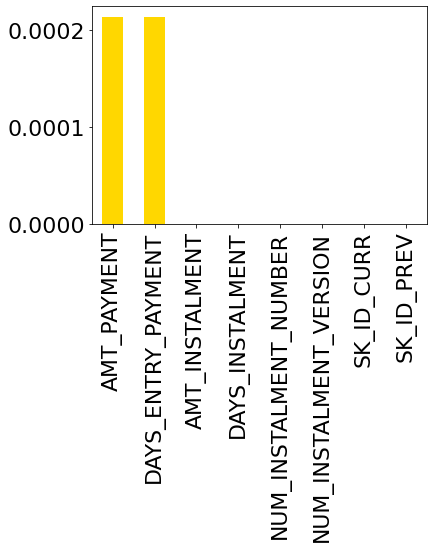

In [ ]:
missing_rate(df_installments_payments)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_ENTRY_PAYMENT']

,Unnamed: 0,Table,Row,Description,Special
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit paid actually (relative to application date of current loan),time only relative to the application


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_INSTALMENT']

,Unnamed: 0,Table,Row,Description,Special
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was supposed to be paid (relative to application date of current loan),time only relative to the application


Observation :

If NaN: impute value of 'DAYS_INSTALMENT' if 'DAYS_ENTRY_PAYMENT' is empty

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_PAYMENT']

,Unnamed: 0,Table,Row,Description,Special
218,221,installments_payments.csv,AMT_PAYMENT,What the client actually paid on previous credit on this installment,NaN


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_INSTALMENT']

,Unnamed: 0,Table,Row,Description,Special
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of previous credit on this installment,NaN


Observation :

If NaN: impute value of 'AMT_INSTALMENT' if 'AMT_PAYMENT' is empty

In [ ]:
# Print duplicates for column 'NUM_INSTALMENT_NUMBER' in df_installments_payments
df_installments_payments[df_installments_payments.duplicated(['NUM_INSTALMENT_NUMBER'], keep=False)]

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1369693,100001,1.0,1,-1709.0,-1715.0,3951.000,3951.000
1,1369693,100001,1.0,2,-1679.0,-1715.0,3951.000,3951.000
2,1369693,100001,2.0,4,-1619.0,-1628.0,17397.900,17397.900
3,1369693,100001,1.0,3,-1649.0,-1660.0,3951.000,3951.000
4,1851984,100001,1.0,2,-2916.0,-2916.0,3982.050,3982.050
...,...,...,...,...,...,...,...,...
13605396,2631384,456255,3.0,12,-426.0,-435.0,27489.690,27489.690
13605397,2631384,456255,3.0,9,-516.0,-523.0,27489.690,27489.690
13605398,2729207,456255,2.0,3,-409.0,-435.0,42754.230,42754.230
13605399,2729207,456255,1.0,1,-469.0,-482.0,11514.555,11514.555


In [ ]:
# Create an index
df_installments_payments.reset_index(inplace = True)

In [ ]:
df_installments_payments.head()

,index,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,0,1369693,100001,1.0,1,-1709.0,-1715.0,3951.00,3951.00
1,1,1369693,100001,1.0,2,-1679.0,-1715.0,3951.00,3951.00
2,2,1369693,100001,2.0,4,-1619.0,-1628.0,17397.90,17397.90
3,3,1369693,100001,1.0,3,-1649.0,-1660.0,3951.00,3951.00
4,4,1851984,100001,1.0,2,-2916.0,-2916.0,3982.05,3982.05


In [ ]:
# Print duplicates for column 'NUM_INSTALMENT_NUMBER' in df_installments_payments
df_installments_payments[df_installments_payments.duplicated(['index'], keep=False)]

,index,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT


#### Imputation

SK_ID_PREV                0.000000
SK_ID_CURR                0.000000
NUM_INSTALMENT_VERSION    0.000000
NUM_INSTALMENT_NUMBER     0.000000
DAYS_INSTALMENT           0.000000
AMT_INSTALMENT            0.000000
DAYS_ENTRY_PAYMENT        0.000115
AMT_PAYMENT               0.000115
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


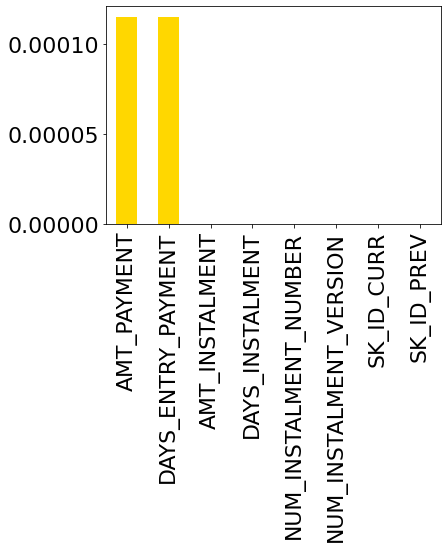

In [ ]:
missing_rate(df_installments_payments)

In [ ]:
#If NaN: impute value of 'DAYS_INSTALMENT' if 'DAYS_ENTRY_PAYMENT' is empty
df_installments_payments['DAYS_ENTRY_PAYMENT'].fillna(df_installments_payments['DAYS_INSTALMENT'], inplace=True)

In [ ]:
#If NaN: impute value of 'AMT_INSTALMENT' if 'AMT_PAYMENT' is empty
df_installments_payments['AMT_PAYMENT'].fillna(df_installments_payments['AMT_INSTALMENT'], inplace=True)

SK_ID_PREV                0.0
SK_ID_CURR                0.0
NUM_INSTALMENT_VERSION    0.0
NUM_INSTALMENT_NUMBER     0.0
DAYS_INSTALMENT           0.0
DAYS_ENTRY_PAYMENT        0.0
AMT_INSTALMENT            0.0
AMT_PAYMENT               0.0
dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


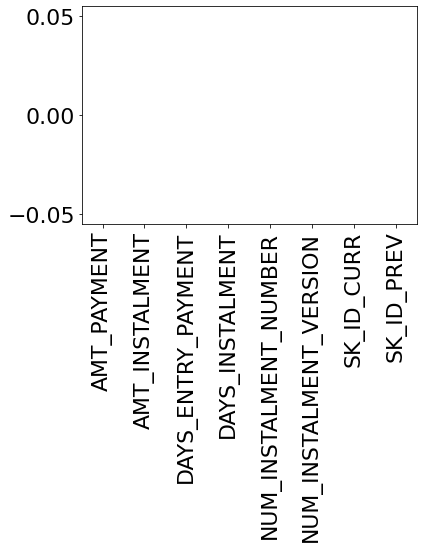

In [ ]:
missing_rate(df_installments_payments)

### df_previous_application

#### Observations

SK_ID_PREV                     0.000000e+00
NAME_YIELD_GROUP               0.000000e+00
NAME_SELLER_INDUSTRY           0.000000e+00
SELLERPLACE_AREA               0.000000e+00
CHANNEL_TYPE                   0.000000e+00
NAME_PRODUCT_TYPE              0.000000e+00
NAME_PORTFOLIO                 0.000000e+00
NAME_GOODS_CATEGORY            0.000000e+00
NAME_CLIENT_TYPE               0.000000e+00
CODE_REJECT_REASON             0.000000e+00
DAYS_DECISION                  0.000000e+00
NAME_CONTRACT_STATUS           0.000000e+00
NAME_CASH_LOAN_PURPOSE         0.000000e+00
NAME_PAYMENT_TYPE              0.000000e+00
AMT_APPLICATION                0.000000e+00
NFLAG_LAST_APPL_IN_DAY         0.000000e+00
FLAG_LAST_APPL_PER_CONTRACT    0.000000e+00
HOUR_APPR_PROCESS_START        0.000000e+00
WEEKDAY_APPR_PROCESS_START     0.000000e+00
NAME_CONTRACT_TYPE             0.000000e+00
SK_ID_CURR                     0.000000e+00
AMT_CREDIT                     5.987257e-07
PRODUCT_COMBINATION            2

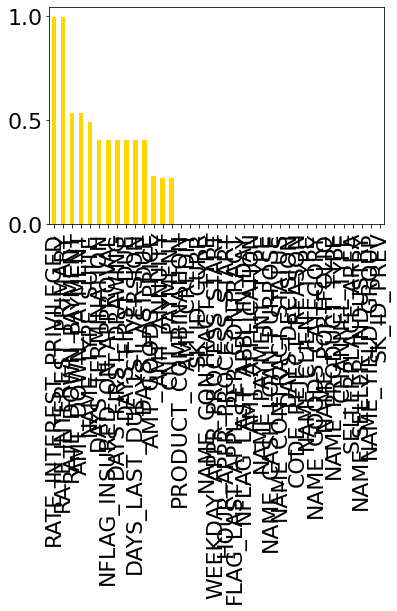

In [ ]:
missing_rate(df_previous_application)

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_CREDIT']

,Unnamed: 0,Table,Row,Description,Special
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
178,181,previous_application.csv,AMT_CREDIT,"Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT",NaN


In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_APPLICATION']

,Unnamed: 0,Table,Row,Description,Special
177,180,previous_application.csv,AMT_APPLICATION,For how much credit did client ask on the previous application,NaN


Observation :

If NaN: impute 'AMT_APPLICATION'

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'PRODUCT_COMBINATION']

,Unnamed: 0,Table,Row,Description,Special
204,207,previous_application.csv,PRODUCT_COMBINATION,Detailed product combination of the previous application,NaN


In [ ]:
df_previous_application['PRODUCT_COMBINATION'].unique()

array(['POS mobile with interest', 'POS other with interest',
       'Cash X-Sell: low', 'POS household with interest',
       'POS industry with interest', 'POS mobile without interest',
       'Cash', 'Cash X-Sell: high', 'Card X-Sell', 'Card Street',
       'Cash X-Sell: middle', 'Cash Street: high',
       'POS household without interest', 'POS industry without interest',
       'Cash Street: low', 'Cash Street: middle',
       'POS others without interest', nan], dtype=object)

In [ ]:
df_previous_application[df_previous_application['PRODUCT_COMBINATION']==0]

Observation :

If NaN: impute 'Unknown'

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'CNT_PAYMENT']

,Unnamed: 0,Table,Row,Description,Special
202,205,previous_application.csv,CNT_PAYMENT,Term of previous credit at application of the previous application,NaN


In [ ]:
df_previous_application['CNT_PAYMENT'].unique()

array([ 8., 24., 12.,  6.,  4., nan, 18.,  0., 48., 10., 30., 36., 16.,
        5., 60., 42., 14., 54.,  9., 45., 20.,  3., 15., 72.,  7., 11.,
       22., 17., 84., 13., 47., 29., 59., 53., 38., 23., 40., 26., 28.,
       32., 34., 19., 35., 66., 33., 39., 46., 44., 21., 41.])

In [ ]:
df_previous_application[df_previous_application['CNT_PAYMENT']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
10,1489396,100006,Revolving loans,13500.0,270000.0,270000.0,NaN,270000.0,THURSDAY,15,Y,1,NaN,NaN,NaN,XAP,Approved,-181,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
37,1843384,100011,Revolving loans,9000.0,0.0,180000.0,NaN,NaN,SATURDAY,10,Y,1,NaN,NaN,NaN,XAP,Approved,-2279,XNA,XAP,NaN,Repeater,XNA,Cards,x-sell,Contact center,0,XNA,0.0,XNA,Card X-Sell,-2277.0,-2229.0,365243.0,-1257.0,365243.0,0.0
69,2594025,100021,Revolving loans,33750.0,0.0,675000.0,NaN,NaN,FRIDAY,14,Y,1,NaN,NaN,NaN,XAP,Approved,-549,XNA,XAP,NaN,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,365243.0,365243.0,365243.0,365243.0,-332.0,0.0
72,1499902,100023,Revolving loans,2250.0,45000.0,45000.0,NaN,45000.0,WEDNESDAY,11,Y,1,NaN,NaN,NaN,XAP,Approved,-327,XNA,XAP,NaN,Refreshed,XNA,Cards,walk-in,AP+ (Cash loan),4,XNA,0.0,XNA,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
91,1914954,100028,Revolving loans,11250.0,0.0,225000.0,NaN,NaN,THURSDAY,9,Y,1,NaN,NaN,NaN,XAP,Approved,-1490,XNA,XAP,NaN,Repeater,XNA,Cards,x-sell,Contact center,-1,XNA,0.0,XNA,Card X-Sell,-1323.0,-1274.0,365243.0,365243.0,365243.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670170,2181926,456244,Revolving loans,22500.0,0.0,450000.0,NaN,NaN,MONDAY,10,Y,1,NaN,NaN,NaN,XAP,Approved,-1264,XNA,XAP,NaN,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,-1262.0,-1225.0,365243.0,-737.0,-160.0,0.0
1670179,1079732,456246,Revolving loans,6750.0,0.0,135000.0,NaN,NaN,WEDNESDAY,16,Y,1,NaN,NaN,NaN,XAP,Approved,-278,XNA,XAP,NaN,Refreshed,XNA,Cards,x-sell,AP+ (Cash loan),30,XNA,0.0,XNA,Card X-Sell,-256.0,-231.0,365243.0,365243.0,365243.0,0.0
1670189,2743495,456248,Revolving loans,45000.0,0.0,900000.0,NaN,NaN,FRIDAY,16,Y,1,NaN,NaN,NaN,XAP,Approved,-740,XNA,XAP,NaN,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
1670196,1794451,456250,Revolving loans,9000.0,180000.0,180000.0,NaN,180000.0,MONDAY,11,Y,1,NaN,NaN,NaN,XAP,Approved,-373,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,-373.0,-327.0,365243.0,365243.0,365243.0,0.0


Observation :

If NaN: impute mode

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_ANNUITY']

,Unnamed: 0,Table,Row,Description,Special
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN
138,141,bureau.csv,AMT_ANNUITY,Annuity of the Credit Bureau credit,NaN
176,179,previous_application.csv,AMT_ANNUITY,Annuity of previous application,NaN


In [ ]:
df_previous_application['AMT_ANNUITY'].unique()

array([ 3951.   ,  9251.775, 98356.995, ..., 11314.17 , 11090.835,
       11514.555])

In [ ]:
df_previous_application[df_previous_application['AMT_ANNUITY']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1057,1824379,100217,Revolving loans,0.0,0.0,720000.0,NaN,NaN,WEDNESDAY,14,Y,0,NaN,NaN,NaN,XAP,Approved,-495,XNA,XAP,NaN,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,-485.0,-447.0,365243.0,365243.0,365243.0,0.0
5170,2096970,101076,Cash loans,0.0,0.0,0.0,NaN,0.0,FRIDAY,17,Y,1,NaN,NaN,NaN,Repairs,Refused,-445,Cash through the bank,HC,Unaccompanied,Refreshed,XNA,Cash,walk-in,AP+ (Cash loan),2,XNA,48.0,middle,Cash Street: middle,NaN,NaN,NaN,NaN,NaN,NaN
5171,2330498,101076,Cash loans,0.0,0.0,0.0,NaN,0.0,FRIDAY,17,Y,1,NaN,NaN,NaN,XNA,Refused,-445,Cash through the bank,HC,Unaccompanied,Refreshed,XNA,Cash,x-sell,AP+ (Cash loan),2,XNA,24.0,low_normal,Cash X-Sell: low,NaN,NaN,NaN,NaN,NaN,NaN
5172,2358881,101076,Cash loans,0.0,0.0,0.0,NaN,0.0,THURSDAY,17,Y,1,NaN,NaN,NaN,Payments on other loans,Refused,-446,Cash through the bank,HC,Unaccompanied,Refreshed,XNA,Cash,walk-in,AP+ (Cash loan),2,XNA,48.0,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN
5493,2313600,101136,Revolving loans,0.0,0.0,0.0,NaN,0.0,WEDNESDAY,17,Y,1,NaN,NaN,NaN,XAP,Approved,-193,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,walk-in,Stone,120,Consumer electronics,0.0,XNA,Card Street,-193.0,365243.0,365243.0,365243.0,365243.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1665401,2780308,455312,Revolving loans,0.0,0.0,0.0,NaN,0.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XAP,Approved,-279,XNA,XAP,NaN,New,XNA,Cards,walk-in,Country-wide,71,Connectivity,0.0,XNA,Card Street,-279.0,365243.0,365243.0,365243.0,365243.0,0.0
1666287,2272045,455494,Revolving loans,0.0,0.0,0.0,NaN,0.0,TUESDAY,9,Y,1,NaN,NaN,NaN,XAP,Approved,-118,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,walk-in,Regional / Local,220,Consumer electronics,0.0,XNA,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
1666557,2697654,455539,Revolving loans,0.0,0.0,0.0,NaN,0.0,MONDAY,11,Y,1,NaN,NaN,NaN,XAP,Approved,-23,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,walk-in,Stone,112,Consumer electronics,0.0,XNA,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
1667486,1053330,455720,Revolving loans,0.0,0.0,0.0,NaN,0.0,SATURDAY,8,Y,1,NaN,NaN,NaN,XAP,Approved,-240,XNA,XAP,Family,Repeater,XNA,Cards,walk-in,Country-wide,33,Connectivity,0.0,XNA,Card Street,-240.0,365243.0,365243.0,365243.0,365243.0,0.0


Observation :

If NaN: do not replace

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_GOODS_PRICE']

,Unnamed: 0,Table,Row,Description,Special
10,13,application_{train|test}.csv,AMT_GOODS_PRICE,For consumer loans it is the price of the goods for which the loan is given,NaN
180,183,previous_application.csv,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application,NaN


In [ ]:
df_previous_application['AMT_GOODS_PRICE'].unique()

array([ 24835.5  , 179055.   , 900000.   , ..., 525730.5  , 106272.495,
       293256.225])

In [ ]:
df_previous_application[df_previous_application['AMT_GOODS_PRICE']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
38,2668005,100011,Cash loans,NaN,0.0,0.0,NaN,0.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Refused,-1162,Cash through the bank,LIMIT,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
839,2719009,100170,Revolving loans,7875.0,0.0,157500.0,NaN,0.0,TUESDAY,13,Y,1,NaN,NaN,NaN,XAP,Refused,-1582,XNA,HC,NaN,Repeater,XNA,Cards,walk-in,Credit and cash offices,-1,XNA,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
875,1736208,100181,Revolving loans,11250.0,0.0,225000.0,NaN,0.0,SUNDAY,12,Y,1,NaN,NaN,NaN,XAP,Refused,-1276,XNA,LIMIT,NaN,Repeater,XNA,Cards,walk-in,AP+ (Cash loan),-1,XNA,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
876,2610425,100181,Revolving loans,4500.0,0.0,90000.0,NaN,0.0,SUNDAY,12,Y,1,NaN,NaN,NaN,XAP,Approved,-1276,XNA,XAP,NaN,Repeater,XNA,Cards,walk-in,AP+ (Cash loan),-1,XNA,0.0,XNA,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
2095,2488741,100426,Revolving loans,7875.0,0.0,157500.0,NaN,0.0,TUESDAY,9,Y,1,NaN,NaN,NaN,XAP,Refused,-1364,XNA,HC,NaN,Repeater,XNA,Cards,walk-in,Credit and cash offices,-1,XNA,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1669015,1209934,456013,Revolving loans,0.0,0.0,0.0,NaN,0.0,TUESDAY,13,Y,1,NaN,NaN,NaN,XAP,Approved,-28,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,walk-in,Regional / Local,100,Consumer electronics,0.0,XNA,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
1669141,1159593,456038,Revolving loans,6750.0,0.0,135000.0,NaN,0.0,MONDAY,15,Y,1,NaN,NaN,NaN,XAP,Approved,-1297,XNA,XAP,NaN,Repeater,XNA,Cards,walk-in,Credit and cash offices,-1,XNA,0.0,XNA,Card Street,-1257.0,-1224.0,365243.0,-217.0,-50.0,0.0
1669224,2322669,456060,Revolving loans,7875.0,0.0,157500.0,NaN,0.0,FRIDAY,13,Y,1,NaN,NaN,NaN,XAP,Approved,-1349,XNA,XAP,NaN,Repeater,XNA,Cards,walk-in,Credit and cash offices,-1,XNA,0.0,XNA,Card Street,-1328.0,-1274.0,365243.0,365243.0,365243.0,0.0
1669403,1467311,456098,Revolving loans,7875.0,0.0,157500.0,NaN,0.0,TUESDAY,17,Y,1,NaN,NaN,NaN,XAP,Approved,-1298,XNA,XAP,NaN,Repeater,XNA,Cards,walk-in,Credit and cash offices,-1,XNA,0.0,XNA,Card Street,-1086.0,-1041.0,365243.0,365243.0,365243.0,0.0


Observation :

If NaN: Do not replace

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_LAST_DUE']

,Unnamed: 0,Table,Row,Description,Special
208,211,previous_application.csv,DAYS_LAST_DUE,Relative to application date of current application when was the last due date of the previous application,time only relative to the application


In [ ]:
df_previous_application['DAYS_LAST_DUE'].unique()

array([-1619.,   -25.,  -536., ..., -2844., -2888., -2836.])

In [ ]:
df_previous_application[df_previous_application['DAYS_LAST_DUE']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_LAST_DUE_1ST_VERSION']

,Unnamed: 0,Table,Row,Description,Special
207,210,previous_application.csv,DAYS_LAST_DUE_1ST_VERSION,Relative to application date of current application when was the first due of the previous application,time only relative to the application


In [ ]:
df_previous_application['DAYS_LAST_DUE_1ST_VERSION'].unique()

array([-1499.,   125.,  -386., ...,  1954.,  1800.,  1798.])

In [ ]:
df_previous_application[df_previous_application['DAYS_LAST_DUE_1ST_VERSION']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1546,1889868,100310,Consumer loans,15280.920,136107.0,147784.5,0.0,136107.0,SATURDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-362,Cash through the bank,XAP,Family,Repeater,Consumer Electronics,POS,XNA,Country-wide,1375,Consumer electronics,12.0,middle,POS household with interest,365243.0,-330.0,0.0,-300.0,-291.0,0.0
5484,1822697,101134,Cash loans,9520.515,135000.0,155614.5,NaN,135000.0,TUESDAY,17,Y,1,NaN,NaN,NaN,XNA,Approved,-720,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,24.0,middle,Cash X-Sell: middle,365243.0,-690.0,0.0,-360.0,-358.0,1.0
5723,1567413,101182,Cash loans,16493.625,135000.0,153144.0,NaN,135000.0,WEDNESDAY,6,Y,1,NaN,NaN,NaN,XNA,Approved,-360,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-330.0,0.0,365243.0,365243.0,1.0
7132,1864928,101467,Consumer loans,11350.665,108670.5,115173.0,4500.0,108670.5,SATURDAY,16,Y,1,0.040953,NaN,NaN,XAP,Approved,-360,Cash through the bank,XAP,Family,Refreshed,Audio/Video,POS,XNA,Country-wide,1326,Consumer electronics,12.0,low_normal,POS household with interest,365243.0,-330.0,0.0,365243.0,365243.0,1.0
9448,1941822,101948,Cash loans,24707.925,225000.0,239850.0,NaN,225000.0,SUNDAY,14,Y,1,NaN,NaN,NaN,XNA,Approved,-360,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Country-wide,20,Connectivity,12.0,middle,Cash X-Sell: middle,365243.0,-330.0,0.0,365243.0,365243.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1666052,1050551,455450,Consumer loans,13002.885,126000.0,139306.5,0.0,126000.0,MONDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-361,Cash through the bank,XAP,NaN,New,Clothing and Accessories,POS,XNA,Stone,100,Clothing,12.0,low_normal,POS industry with interest,365243.0,-330.0,0.0,365243.0,365243.0,0.0
1667320,1424839,455684,Cash loans,26574.255,225000.0,289732.5,NaN,225000.0,THURSDAY,8,Y,1,NaN,NaN,NaN,XNA,Approved,-540,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,18.0,high,Cash X-Sell: high,365243.0,-510.0,0.0,-420.0,-418.0,1.0
1667542,1361989,455737,Cash loans,20153.475,184500.0,196677.0,NaN,184500.0,THURSDAY,13,Y,1,NaN,NaN,NaN,XNA,Approved,-360,Cash through the bank,XAP,NaN,Refreshed,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-330.0,0.0,365243.0,365243.0,1.0
1668934,2731436,455996,Consumer loans,17961.930,166401.0,160470.0,16641.0,166401.0,SUNDAY,15,Y,1,0.102329,NaN,NaN,XAP,Approved,-302,Cash through the bank,XAP,NaN,Repeater,Computers,POS,XNA,Country-wide,300,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-270.0,0.0,365243.0,365243.0,0.0


Observation :

If NaN replace 'DAYS_LAST_DUE_1ST_VERSION' by : 'DAYS_FIRST_DUE'

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_FIRST_DUE']

,Unnamed: 0,Table,Row,Description,Special
206,209,previous_application.csv,DAYS_FIRST_DUE,Relative to application date of current application when was the first due supposed to be of the previous application,time only relative to the application


In [ ]:
df_previous_application['DAYS_FIRST_DUE'].unique()

array([-1.709e+03, -5.650e+02, -7.160e+02, ..., -2.877e+03, -2.000e+00,
       -2.892e+03])

In [ ]:
df_previous_application[df_previous_application['DAYS_FIRST_DUE']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_FIRST_DRAWING']

,Unnamed: 0,Table,Row,Description,Special
205,208,previous_application.csv,DAYS_FIRST_DRAWING,Relative to application date of current application when was the first disbursement of the previous application,time only relative to the application


In [ ]:
df_previous_application['DAYS_FIRST_DRAWING'].unique()

array([365243.,     nan,  -2277., ...,  -1855.,  -1625.,  -1857.])

In [ ]:
df_previous_application[df_previous_application['DAYS_FIRST_DRAWING']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'NFLAG_INSURED_ON_APPROVAL']

,Unnamed: 0,Table,Row,Description,Special
210,213,previous_application.csv,NFLAG_INSURED_ON_APPROVAL,Did the client requested insurance during the previous application,NaN


In [ ]:
df_previous_application['NFLAG_INSURED_ON_APPROVAL'].unique()

array([ 0.,  1., nan])

In [ ]:
df_previous_application[df_previous_application['NFLAG_INSURED_ON_APPROVAL']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,1369693,100001,Consumer loans,3951.000,24835.5,23787.0,2520.0,24835.5,FRIDAY,13,Y,1,0.104326,NaN,NaN,XAP,Approved,-1740,Cash through the bank,XAP,Family,Refreshed,Mobile,POS,XNA,Country-wide,23,Connectivity,8.0,high,POS mobile with interest,365243.0,-1709.0,-1499.0,-1619.0,-1612.0,0.0
1,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
4,2636178,100003,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.000000,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
5,1564014,100004,Consumer loans,5357.250,24282.0,20106.0,4860.0,24282.0,FRIDAY,5,Y,1,0.212008,NaN,NaN,XAP,Approved,-815,Cash through the bank,XAP,Unaccompanied,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0
7,2495675,100005,Consumer loans,4813.200,44617.5,40153.5,4464.0,44617.5,THURSDAY,11,Y,1,0.108964,NaN,NaN,XAP,Approved,-757,Cash through the bank,XAP,NaN,New,Mobile,POS,XNA,Country-wide,37,Connectivity,12.0,high,POS mobile with interest,365243.0,-706.0,-376.0,-466.0,-460.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670204,1792910,456254,Consumer loans,2296.440,18846.0,21456.0,0.0,18846.0,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-322,Cash through the bank,XAP,NaN,New,Mobile,POS,XNA,Country-wide,63,Connectivity,14.0,high,POS mobile with interest,365243.0,-291.0,99.0,365243.0,365243.0,0.0
1670208,1359084,456255,Consumer loans,11314.170,82404.0,93298.5,9000.0,82404.0,SUNDAY,14,Y,1,0.095816,NaN,NaN,XAP,Approved,-456,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,50,Connectivity,12.0,high,POS mobile with interest,365243.0,-425.0,-95.0,-215.0,-211.0,0.0
1670210,1743609,456255,Consumer loans,11090.835,102037.5,112815.0,0.0,102037.5,THURSDAY,18,Y,1,0.000000,NaN,NaN,XAP,Approved,-991,Cash through the bank,XAP,Other_B,Refreshed,Furniture,POS,XNA,Regional / Local,500,Furniture,12.0,middle,POS industry with interest,365243.0,-960.0,-630.0,-690.0,-687.0,0.0
1670212,2631384,456255,Cash loans,54022.140,1170000.0,1271929.5,NaN,1170000.0,FRIDAY,14,Y,1,NaN,NaN,NaN,XNA,Approved,-787,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),6,XNA,36.0,low_normal,Cash X-Sell: low,365243.0,-756.0,294.0,-66.0,-64.0,0.0


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'DAYS_TERMINATION']

,Unnamed: 0,Table,Row,Description,Special
209,212,previous_application.csv,DAYS_TERMINATION,Relative to application date of current application when was the expected termination of the previous application,time only relative to the application


In [ ]:
df_previous_application['DAYS_TERMINATION'].unique()

array([-1612.,   -17.,  -527., ..., -2818., -2809., -2848.])

In [ ]:
df_previous_application[df_previous_application['DAYS_TERMINATION']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'NAME_TYPE_SUITE']

,Unnamed: 0,Table,Row,Description,Special
11,14,application_{train|test}.csv,NAME_TYPE_SUITE,Who was accompanying client when he was applying for the loan,NaN
194,197,previous_application.csv,NAME_TYPE_SUITE,Who accompanied client when applying for the previous application,NaN


In [ ]:
df_previous_application['NAME_TYPE_SUITE'].unique()

array(['Family', nan, 'Unaccompanied', 'Spouse, partner', 'Children',
       'Other_A', 'Other_B', 'Group of people'], dtype=object)

In [ ]:
df_previous_application[df_previous_application['NAME_TYPE_SUITE']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 'Unknown'

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'AMT_DOWN_PAYMENT']

,Unnamed: 0,Table,Row,Description,Special
179,182,previous_application.csv,AMT_DOWN_PAYMENT,Down payment on the previous application,NaN


In [ ]:
df_previous_application['AMT_DOWN_PAYMENT'].unique()

array([ 2520.  ,     0.  ,      nan, ..., 15072.3 , 29845.89,  3078.9 ])

In [ ]:
df_previous_application[df_previous_application['AMT_DOWN_PAYMENT']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.0,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
4,2636178,100003,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.0,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
26,2218188,100008,Consumer loans,17885.835,162598.5,162598.5,0.0,162598.5,THURSDAY,10,Y,1,0.0,NaN,NaN,XAP,Approved,-370,Cash through the bank,XAP,NaN,Repeater,Consumer Electronics,POS,XNA,Country-wide,110,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-339.0,-69.0,-69.0,-66.0,0.0
30,1413109,100009,Consumer loans,8996.760,98239.5,98239.5,0.0,98239.5,SATURDAY,18,Y,1,0.0,NaN,NaN,XAP,Approved,-449,Cash through the bank,XAP,NaN,Repeater,Consumer Electronics,POS,XNA,Regional / Local,164,Consumer electronics,12.0,low_action,POS household without interest,365243.0,-418.0,-88.0,-88.0,-84.0,0.0
35,2349489,100010,Consumer loans,27463.410,247212.0,260811.0,0.0,247212.0,TUESDAY,16,Y,1,0.0,NaN,NaN,XAP,Approved,-1070,Cash through the bank,XAP,Family,New,Furniture,POS,XNA,Stone,8636,Furniture,10.0,low_action,POS industry without interest,365243.0,-1039.0,-769.0,-769.0,-762.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670197,1922117,456250,Consumer loans,26084.430,141570.0,147645.0,0.0,141570.0,FRIDAY,5,Y,1,0.0,NaN,NaN,XAP,Approved,-1069,XNA,XAP,Unaccompanied,New,Computers,POS,XNA,Stone,38,Consumer electronics,6.0,low_normal,POS household with interest,365243.0,-1038.0,-888.0,-888.0,-884.0,0.0
1670200,2248017,456251,Consumer loans,6605.910,40455.0,40455.0,0.0,40455.0,THURSDAY,17,Y,1,0.0,NaN,NaN,XAP,Approved,-273,Cash through the bank,XAP,NaN,New,Mobile,POS,XNA,Country-wide,30,Connectivity,8.0,high,POS mobile with interest,365243.0,-210.0,0.0,-30.0,-25.0,0.0
1670204,1792910,456254,Consumer loans,2296.440,18846.0,21456.0,0.0,18846.0,WEDNESDAY,12,Y,1,0.0,NaN,NaN,XAP,Approved,-322,Cash through the bank,XAP,NaN,New,Mobile,POS,XNA,Country-wide,63,Connectivity,14.0,high,POS mobile with interest,365243.0,-291.0,99.0,365243.0,365243.0,0.0
1670205,2016407,456254,Consumer loans,19065.825,223789.5,247423.5,0.0,223789.5,SATURDAY,18,Y,1,0.0,NaN,NaN,XAP,Approved,-277,Cash through the bank,XAP,Unaccompanied,Repeater,Computers,POS,XNA,Country-wide,3093,Consumer electronics,16.0,low_normal,POS household with interest,365243.0,-247.0,203.0,365243.0,365243.0,1.0


Observation :

If NaN: impute 0?

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'RATE_DOWN_PAYMENT']

,Unnamed: 0,Table,Row,Description,Special
186,189,previous_application.csv,RATE_DOWN_PAYMENT,Down payment rate normalized on previous credit,normalized


In [ ]:
df_previous_application['RATE_DOWN_PAYMENT'].unique()

array([0.10432619, 0.        ,        nan, ..., 0.1043489 , 0.09581585,
       0.09852374])

In [ ]:
df_previous_application[df_previous_application['RATE_DOWN_PAYMENT']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.0,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
4,2636178,100003,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.0,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
26,2218188,100008,Consumer loans,17885.835,162598.5,162598.5,0.0,162598.5,THURSDAY,10,Y,1,0.0,NaN,NaN,XAP,Approved,-370,Cash through the bank,XAP,NaN,Repeater,Consumer Electronics,POS,XNA,Country-wide,110,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-339.0,-69.0,-69.0,-66.0,0.0
30,1413109,100009,Consumer loans,8996.760,98239.5,98239.5,0.0,98239.5,SATURDAY,18,Y,1,0.0,NaN,NaN,XAP,Approved,-449,Cash through the bank,XAP,NaN,Repeater,Consumer Electronics,POS,XNA,Regional / Local,164,Consumer electronics,12.0,low_action,POS household without interest,365243.0,-418.0,-88.0,-88.0,-84.0,0.0
35,2349489,100010,Consumer loans,27463.410,247212.0,260811.0,0.0,247212.0,TUESDAY,16,Y,1,0.0,NaN,NaN,XAP,Approved,-1070,Cash through the bank,XAP,Family,New,Furniture,POS,XNA,Stone,8636,Furniture,10.0,low_action,POS industry without interest,365243.0,-1039.0,-769.0,-769.0,-762.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670197,1922117,456250,Consumer loans,26084.430,141570.0,147645.0,0.0,141570.0,FRIDAY,5,Y,1,0.0,NaN,NaN,XAP,Approved,-1069,XNA,XAP,Unaccompanied,New,Computers,POS,XNA,Stone,38,Consumer electronics,6.0,low_normal,POS household with interest,365243.0,-1038.0,-888.0,-888.0,-884.0,0.0
1670200,2248017,456251,Consumer loans,6605.910,40455.0,40455.0,0.0,40455.0,THURSDAY,17,Y,1,0.0,NaN,NaN,XAP,Approved,-273,Cash through the bank,XAP,NaN,New,Mobile,POS,XNA,Country-wide,30,Connectivity,8.0,high,POS mobile with interest,365243.0,-210.0,0.0,-30.0,-25.0,0.0
1670204,1792910,456254,Consumer loans,2296.440,18846.0,21456.0,0.0,18846.0,WEDNESDAY,12,Y,1,0.0,NaN,NaN,XAP,Approved,-322,Cash through the bank,XAP,NaN,New,Mobile,POS,XNA,Country-wide,63,Connectivity,14.0,high,POS mobile with interest,365243.0,-291.0,99.0,365243.0,365243.0,0.0
1670205,2016407,456254,Consumer loans,19065.825,223789.5,247423.5,0.0,223789.5,SATURDAY,18,Y,1,0.0,NaN,NaN,XAP,Approved,-277,Cash through the bank,XAP,Unaccompanied,Repeater,Computers,POS,XNA,Country-wide,3093,Consumer electronics,16.0,low_normal,POS household with interest,365243.0,-247.0,203.0,365243.0,365243.0,1.0


Observation :

If NaN: impute 0?

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'RATE_INTEREST_PRIMARY']

,Unnamed: 0,Table,Row,Description,Special
187,190,previous_application.csv,RATE_INTEREST_PRIMARY,Interest rate normalized on previous credit,normalized


In [ ]:
df_previous_application['RATE_INTEREST_PRIMARY'].unique()

array([       nan, 0.18913635, 0.16071631, 0.19332993, 0.19691431,
       0.19690015, 0.18281764, 0.17600306, 0.18912218, 0.14244021,
       0.05913521, 0.1421427 , 0.14173184, 0.16070214, 0.20758245,
       0.17601723, 0.69631928, 0.20761079, 0.7449847 , 0.63593732,
       0.63602233, 0.1828318 , 0.14245438, 0.17151196, 0.17968661,
       0.69566757, 0.18910801, 0.1278335 , 0.17970078, 0.1933441 ,
       0.65451094, 0.70081038, 0.10373456, 0.19688598, 0.16020628,
       0.63595149, 0.20755412, 0.74358211, 0.80676924, 0.13542729,
       0.19331577, 0.18915052, 0.17006687, 0.6961776 , 0.05914938,
       0.69614927, 0.13008614, 0.14200102, 0.6545251 , 0.19175734,
       0.17598889, 0.11547943, 0.09577241, 0.70083872, 0.20759662,
       0.1760739 , 0.14185934, 0.19174317, 0.1422702 , 0.69619177,
       0.65456761, 0.65427009, 0.1677859 , 0.20749745, 0.20765329,
       0.15210246, 0.69179984, 0.52324889, 0.20768163, 0.17471382,
       0.14242605, 0.1905106 , 0.20746911, 0.1327638 , 0.03478

In [ ]:
df_previous_application[df_previous_application['RATE_INTEREST_PRIMARY']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 0

In [ ]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == 'RATE_INTEREST_PRIVILEGED']

,Unnamed: 0,Table,Row,Description,Special
188,191,previous_application.csv,RATE_INTEREST_PRIVILEGED,Interest rate normalized on previous credit,normalized


In [ ]:
df_previous_application['RATE_INTEREST_PRIVILEGED'].unique()

array([       nan, 0.83509514, 0.71564482, 0.852537  , 0.86733615,
       0.63794926, 0.4244186 , 0.56871036, 0.83245243, 0.51374207,
       0.6448203 , 0.78065539, 0.43657505, 0.63742072, 0.54809725,
       0.54281184, 0.84513742, 0.48414376, 0.37315011, 0.80655391,
       0.79069767, 1.        , 0.72515856, 0.85465116, 0.82082452,
       0.50211416])

In [ ]:
df_previous_application[df_previous_application['RATE_INTEREST_PRIVILEGED']==0]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


Observation :

If NaN: impute 0

#### Imputation et suppression

SK_ID_PREV                     0.000000
PRODUCT_COMBINATION            0.000000
NAME_YIELD_GROUP               0.000000
NAME_SELLER_INDUSTRY           0.000000
SELLERPLACE_AREA               0.000000
CHANNEL_TYPE                   0.000000
NAME_PRODUCT_TYPE              0.000000
NAME_PORTFOLIO                 0.000000
NAME_GOODS_CATEGORY            0.000000
NAME_CLIENT_TYPE               0.000000
CODE_REJECT_REASON             0.000000
DAYS_DECISION                  0.000000
NAME_CONTRACT_STATUS           0.000000
NAME_CASH_LOAN_PURPOSE         0.000000
NAME_PAYMENT_TYPE              0.000000
AMT_CREDIT                     0.000000
RATE_DOWN_PAYMENT              0.000000
NFLAG_LAST_APPL_IN_DAY         0.000000
FLAG_LAST_APPL_PER_CONTRACT    0.000000
HOUR_APPR_PROCESS_START        0.000000
WEEKDAY_APPR_PROCESS_START     0.000000
AMT_GOODS_PRICE                0.000000
AMT_DOWN_PAYMENT               0.000000
AMT_APPLICATION                0.000000
NAME_CONTRACT_TYPE             0.000000


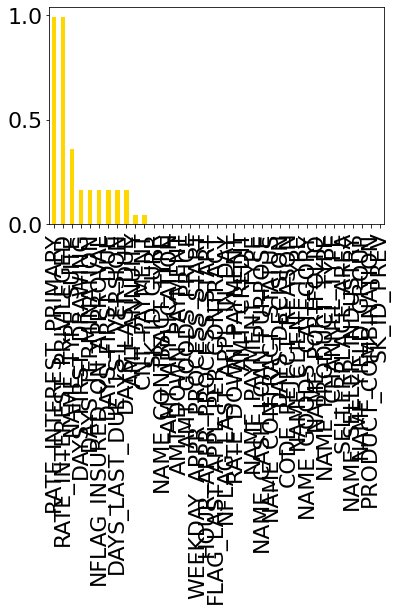

In [ ]:
missing_rate(df_previous_application)

In [ ]:
# Delete rows with no value for 'AMT_PAYMENT_CURRENT'
df_previous_application.dropna(subset=['AMT_ANNUITY',
                                       'AMT_GOODS_PRICE',
                                       'AMT_DOWN_PAYMENT',
                                       'RATE_DOWN_PAYMENT',
                                       ], inplace=True)

SK_ID_PREV                     0.000000
PRODUCT_COMBINATION            0.000000
NAME_YIELD_GROUP               0.000000
CNT_PAYMENT                    0.000000
NAME_SELLER_INDUSTRY           0.000000
SELLERPLACE_AREA               0.000000
CHANNEL_TYPE                   0.000000
NAME_PRODUCT_TYPE              0.000000
NAME_PORTFOLIO                 0.000000
NAME_GOODS_CATEGORY            0.000000
NAME_CLIENT_TYPE               0.000000
CODE_REJECT_REASON             0.000000
DAYS_DECISION                  0.000000
NAME_CONTRACT_STATUS           0.000000
NAME_CASH_LOAN_PURPOSE         0.000000
NAME_PAYMENT_TYPE              0.000000
AMT_CREDIT                     0.000000
RATE_DOWN_PAYMENT              0.000000
NFLAG_LAST_APPL_IN_DAY         0.000000
FLAG_LAST_APPL_PER_CONTRACT    0.000000
HOUR_APPR_PROCESS_START        0.000000
WEEKDAY_APPR_PROCESS_START     0.000000
AMT_GOODS_PRICE                0.000000
AMT_DOWN_PAYMENT               0.000000
AMT_APPLICATION                0.000000


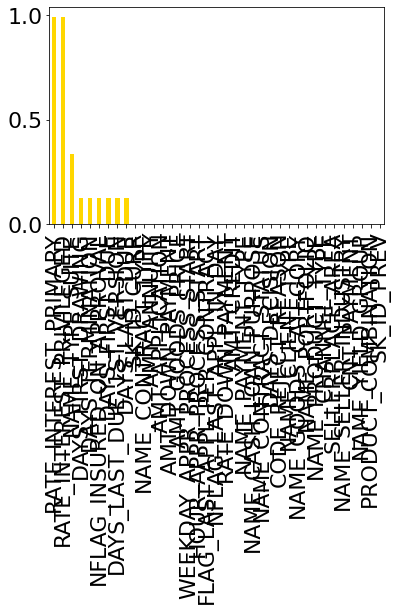

In [ ]:
missing_rate(df_previous_application)

In [ ]:
# If NaN: impute value of 'AMT_APPLICATION' if 'AMT_CREDIT' is NaN
df_previous_application['AMT_CREDIT'].fillna(df_previous_application['AMT_APPLICATION'], inplace=True)

In [ ]:
# If NaN: impute value of 'DAYS_FIRST_DUE' if 'DAYS_LAST_DUE_1ST_VERSION' is NaN
df_previous_application['DAYS_LAST_DUE_1ST_VERSION'].fillna(df_previous_application['DAYS_FIRST_DUE'], inplace=True)

# Delete rows for which there is no values on either column 
df_previous_application.dropna(subset=['DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION'], inplace=True)

SK_ID_PREV                     0.000000
NAME_CLIENT_TYPE               0.000000
NAME_GOODS_CATEGORY            0.000000
NAME_PORTFOLIO                 0.000000
NAME_PRODUCT_TYPE              0.000000
CHANNEL_TYPE                   0.000000
SELLERPLACE_AREA               0.000000
CODE_REJECT_REASON             0.000000
NAME_SELLER_INDUSTRY           0.000000
NAME_YIELD_GROUP               0.000000
PRODUCT_COMBINATION            0.000000
DAYS_FIRST_DRAWING             0.000000
DAYS_FIRST_DUE                 0.000000
DAYS_LAST_DUE_1ST_VERSION      0.000000
DAYS_LAST_DUE                  0.000000
CNT_PAYMENT                    0.000000
DAYS_TERMINATION               0.000000
NAME_PAYMENT_TYPE              0.000000
NAME_CONTRACT_STATUS           0.000000
SK_ID_CURR                     0.000000
NAME_CONTRACT_TYPE             0.000000
AMT_ANNUITY                    0.000000
AMT_APPLICATION                0.000000
AMT_CREDIT                     0.000000
AMT_DOWN_PAYMENT               0.000000


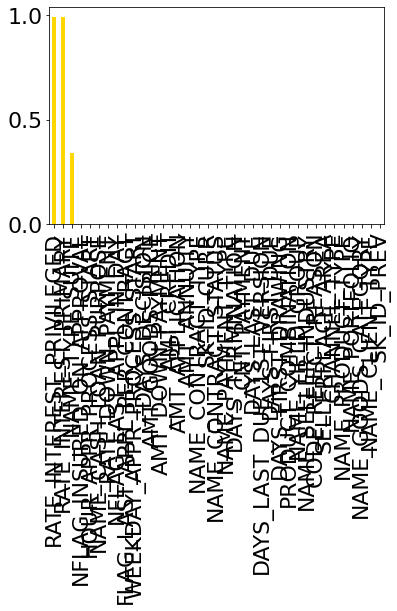

In [ ]:
missing_rate(df_previous_application)

In [ ]:
df_previous_application.drop(columns=['NAME_TYPE_SUITE',
                                      'RATE_INTEREST_PRIMARY',
                                      'RATE_INTEREST_PRIVILEGED'
                                      ], inplace=True)

SK_ID_PREV                     0.0
DAYS_LAST_DUE                  0.0
DAYS_LAST_DUE_1ST_VERSION      0.0
DAYS_FIRST_DUE                 0.0
DAYS_FIRST_DRAWING             0.0
PRODUCT_COMBINATION            0.0
NAME_YIELD_GROUP               0.0
CNT_PAYMENT                    0.0
NAME_SELLER_INDUSTRY           0.0
SELLERPLACE_AREA               0.0
CHANNEL_TYPE                   0.0
NAME_PRODUCT_TYPE              0.0
NAME_PORTFOLIO                 0.0
NAME_GOODS_CATEGORY            0.0
NAME_CLIENT_TYPE               0.0
CODE_REJECT_REASON             0.0
NAME_PAYMENT_TYPE              0.0
DAYS_DECISION                  0.0
SK_ID_CURR                     0.0
NAME_CONTRACT_TYPE             0.0
AMT_ANNUITY                    0.0
AMT_APPLICATION                0.0
AMT_CREDIT                     0.0
AMT_DOWN_PAYMENT               0.0
DAYS_TERMINATION               0.0
AMT_GOODS_PRICE                0.0
HOUR_APPR_PROCESS_START        0.0
FLAG_LAST_APPL_PER_CONTRACT    0.0
NFLAG_LAST_APPL_IN_D

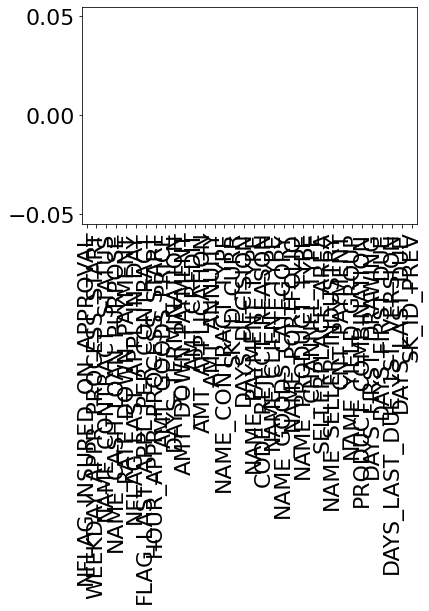

In [ ]:
missing_rate(df_previous_application)

### df_app

#### Observations df_app

SK_ID_CURR                      0.000000
HOUR_APPR_PROCESS_START         0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
REG_REGION_NOT_WORK_REGION      0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
REG_CITY_NOT_WORK_CITY          0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
ORGANIZATION_TYPE               0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3                 0.000000
FLAG_DOCUMENT_4                 0.000000
FLAG_DOCUMENT_5                 0.000000
FLAG_DOCUMENT_6                 0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
FLAG_DOCUMENT_7                 0.000000
FLAG_DOCUMENT_9                 0.000000
FLAG_DOCUMENT_10                0.000000
FLAG_DOCUMENT_11                0.000000
FLAG_DOCUMENT_12                0.000000
FLAG_DOCUMENT_13                0.000000
FLAG_DOCUMENT_14                0.000000
FLAG_DOCUMENT_15                0.000000
FLAG_DOCUMENT_16                0.000000
FLAG_DOCUMENT_17

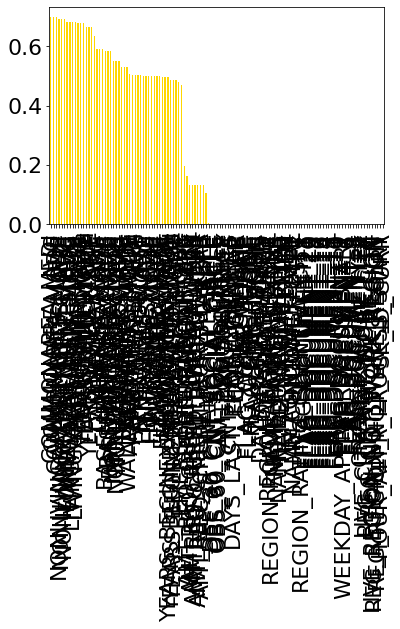

In [ ]:
missing_rate(df_app)

#### Imputations et suppression df_app

In [ ]:
df_app = filter_by_missing_rate(df_app, rate=0.5)

SK_ID_CURR                      0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
REG_REGION_NOT_WORK_REGION      0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
REG_CITY_NOT_WORK_CITY          0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
ORGANIZATION_TYPE               0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3                 0.000000
FLAG_DOCUMENT_4                 0.000000
FLAG_DOCUMENT_5                 0.000000
FLAG_DOCUMENT_6                 0.000000
FLAG_DOCUMENT_7                 0.000000
FLAG_DOCUMENT_8                 0.000000
FLAG_DOCUMENT_9                 0.000000
FLAG_DOCUMENT_10                0.000000
FLAG_DOCUMENT_11                0.000000
FLAG_DOCUMENT_12                0.000000
FLAG_DOCUMENT_13                0.000000
FLAG_DOCUMENT_14                0.000000
FLAG_DOCUMENT_15                0.000000
FLAG_DOCUMENT_16                0.000000
FLAG_DOCUMENT_17                0.000000
FLAG_DOCUMENT_18

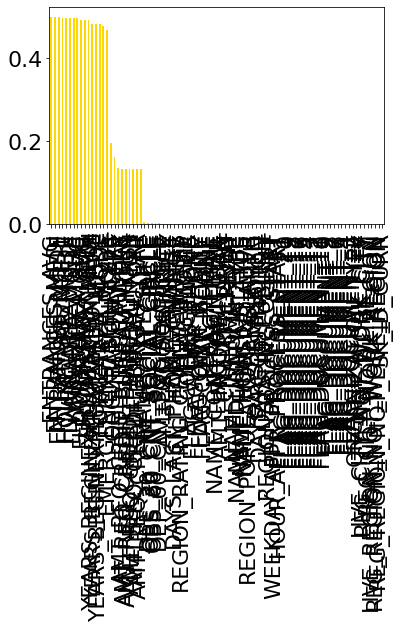

In [ ]:
missing_rate(df_app)

In [ ]:
# Delete rows if 'AMT_ANNUITY' and 'AMT_GOODS_PRICE' are NaN
df_app.dropna(subset=['AMT_ANNUITY', 'AMT_GOODS_PRICE'], inplace=True)

In [ ]:
# Delete columns in df
df_app = df_app.drop(columns=['DAYS_LAST_PHONE_CHANGE',
                                           'DEF_30_CNT_SOCIAL_CIRCLE', 
                                           'DEF_60_CNT_SOCIAL_CIRCLE',
                                           'OBS_60_CNT_SOCIAL_CIRCLE',
                                           'OBS_30_CNT_SOCIAL_CIRCLE',
                                           'AMT_REQ_CREDIT_BUREAU_HOUR',
                                           'AMT_REQ_CREDIT_BUREAU_DAY',
                                           'AMT_REQ_CREDIT_BUREAU_MON',
                                           'AMT_REQ_CREDIT_BUREAU_WEEK',
                                           'AMT_REQ_CREDIT_BUREAU_YEAR',
                                           'AMT_REQ_CREDIT_BUREAU_QRT',
                                          'NAME_TYPE_SUITE',
                                          'EMERGENCYSTATE_MODE',
                                          'TOTALAREA_MODE',
                                          'YEARS_BEGINEXPLUATATION_MODE',
                                          'YEARS_BEGINEXPLUATATION_AVG',
                                          'YEARS_BEGINEXPLUATATION_MEDI',
                                          'FLOORSMAX_MEDI',
                                          'FLOORSMAX_AVG',
                                          'FLOORSMAX_MODE',
                                          'LIVINGAREA_AVG',
                                          'LIVINGAREA_MODE',
                                          'LIVINGAREA_MEDI',
                                          'HOUSETYPE_MODE',
                                          'ENTRANCES_MODE',               
                                          'ENTRANCES_MEDI',                
                                          'ENTRANCES_AVG',                   
                                           ])

SK_ID_CURR                     0.000000
REG_REGION_NOT_LIVE_REGION     0.000000
REG_REGION_NOT_WORK_REGION     0.000000
LIVE_REGION_NOT_WORK_REGION    0.000000
REG_CITY_NOT_LIVE_CITY         0.000000
REG_CITY_NOT_WORK_CITY         0.000000
LIVE_CITY_NOT_WORK_CITY        0.000000
ORGANIZATION_TYPE              0.000000
FLAG_DOCUMENT_2                0.000000
FLAG_DOCUMENT_3                0.000000
FLAG_DOCUMENT_4                0.000000
FLAG_DOCUMENT_5                0.000000
FLAG_DOCUMENT_6                0.000000
FLAG_DOCUMENT_21               0.000000
FLAG_DOCUMENT_7                0.000000
FLAG_DOCUMENT_9                0.000000
FLAG_DOCUMENT_10               0.000000
FLAG_DOCUMENT_11               0.000000
FLAG_DOCUMENT_12               0.000000
FLAG_DOCUMENT_13               0.000000
FLAG_DOCUMENT_14               0.000000
FLAG_DOCUMENT_15               0.000000
FLAG_DOCUMENT_16               0.000000
FLAG_DOCUMENT_17               0.000000
FLAG_DOCUMENT_18               0.000000


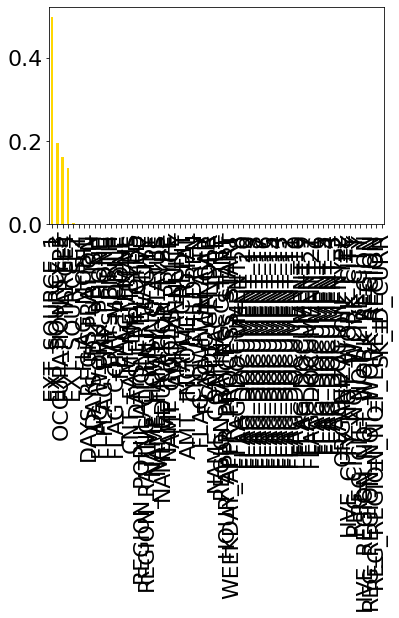

In [ ]:
missing_rate(df_app)

In [ ]:
# List of column to impute with median
app_med = ['EXT_SOURCE_1',
           'EXT_SOURCE_2',
           'EXT_SOURCE_3',
                  ]

In [ ]:
impute_median(df_app, app_med)

Les valeurs manquantes sont remplacées par la médiane pour la variable EXT_SOURCE_1
Les valeurs manquantes sont remplacées par la médiane pour la variable EXT_SOURCE_2
Les valeurs manquantes sont remplacées par la médiane pour la variable EXT_SOURCE_3


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SET
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Train
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,0.520898,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Train
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.479396,0.555912,0.729567,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Train
3,100006,0.0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.479396,0.650442,0.520898,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Train
4,100007,0.0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.479396,0.322738,0.520898,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,456221,NaN,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,Working,Secondary / secondary special,Widow,House / apartment,0.002042,-19970,-5169,-9094.0,-3399,1,1,1,1,1,0,NaN,1.0,3,3,WEDNESDAY,16,0,0,0,0,0,0,Other,0.479396,0.648575,0.643026,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Test
356251,456222,NaN,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,0.035792,-11186,-1149,-3015.0,-3003,1,1,0,1,0,0,Sales staff,4.0,2,2,MONDAY,11,0,0,0,0,1,1,Trade: type 7,0.479396,0.684596,0.520898,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Test
356252,456223,NaN,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,0.026392,-15922,-3037,-2681.0,-1504,1,1,0,1,1,0,NaN,3.0,2,2,WEDNESDAY,12,0,0,0,0,0,0,Business Entity Type 3,0.733504,0.632770,0.283712,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Test
356253,456224,NaN,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,Commercial associate,Higher education,Married,House / apartment,0.018850,-13

SK_ID_CURR                     0.000000
REG_REGION_NOT_WORK_REGION     0.000000
LIVE_REGION_NOT_WORK_REGION    0.000000
REG_CITY_NOT_LIVE_CITY         0.000000
REG_CITY_NOT_WORK_CITY         0.000000
LIVE_CITY_NOT_WORK_CITY        0.000000
ORGANIZATION_TYPE              0.000000
EXT_SOURCE_1                   0.000000
EXT_SOURCE_2                   0.000000
EXT_SOURCE_3                   0.000000
FLAG_DOCUMENT_2                0.000000
FLAG_DOCUMENT_3                0.000000
FLAG_DOCUMENT_4                0.000000
FLAG_DOCUMENT_5                0.000000
REG_REGION_NOT_LIVE_REGION     0.000000
FLAG_DOCUMENT_6                0.000000
FLAG_DOCUMENT_8                0.000000
FLAG_DOCUMENT_9                0.000000
FLAG_DOCUMENT_10               0.000000
FLAG_DOCUMENT_11               0.000000
FLAG_DOCUMENT_12               0.000000
FLAG_DOCUMENT_13               0.000000
FLAG_DOCUMENT_14               0.000000
FLAG_DOCUMENT_15               0.000000
FLAG_DOCUMENT_16               0.000000


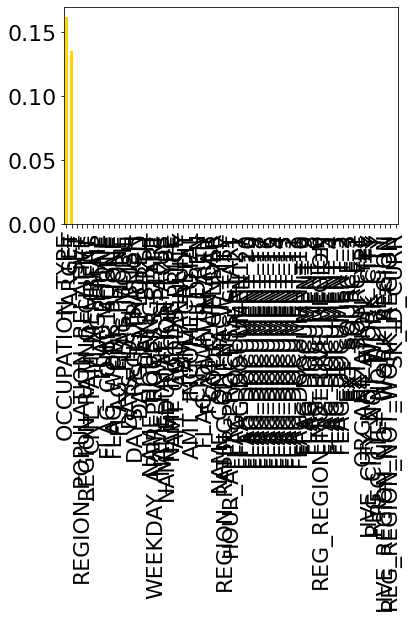

In [ ]:
missing_rate(df_app)

In [ ]:
# If NaN: impute value 'Unknown' for 'OCCUPATION_TYPE' if NaN
df_app['OCCUPATION_TYPE'].fillna('Unknown', inplace=True)

In [ ]:
df_app['OCCUPATION_TYPE'].unique()

array(['Laborers', 'Core staff', 'Accountants', 'Managers', 'Drivers',
       'Sales staff', 'Cleaning staff', 'Cooking staff', 'Unknown',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

SK_ID_CURR                     0.000000
REG_REGION_NOT_WORK_REGION     0.000000
LIVE_REGION_NOT_WORK_REGION    0.000000
REG_CITY_NOT_LIVE_CITY         0.000000
REG_CITY_NOT_WORK_CITY         0.000000
LIVE_CITY_NOT_WORK_CITY        0.000000
ORGANIZATION_TYPE              0.000000
EXT_SOURCE_1                   0.000000
EXT_SOURCE_2                   0.000000
EXT_SOURCE_3                   0.000000
FLAG_DOCUMENT_2                0.000000
FLAG_DOCUMENT_3                0.000000
FLAG_DOCUMENT_4                0.000000
FLAG_DOCUMENT_5                0.000000
REG_REGION_NOT_LIVE_REGION     0.000000
FLAG_DOCUMENT_6                0.000000
FLAG_DOCUMENT_8                0.000000
FLAG_DOCUMENT_9                0.000000
FLAG_DOCUMENT_10               0.000000
FLAG_DOCUMENT_11               0.000000
FLAG_DOCUMENT_12               0.000000
FLAG_DOCUMENT_13               0.000000
FLAG_DOCUMENT_14               0.000000
FLAG_DOCUMENT_15               0.000000
FLAG_DOCUMENT_16               0.000000


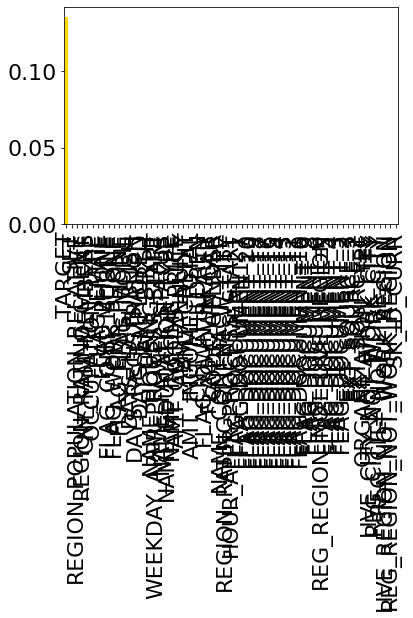

In [ ]:
missing_rate(df_app)

#### Target

In [ ]:
df_app['TARGET'].unique()

array([ 1.,  0., nan])

In [ ]:
df_app['TARGET'].value_counts()

0.0    217749
1.0     20816
Name: TARGET, dtype: int64

## Sauvegarder les data frames nettoyés

### Ecriture

In [ ]:
# Save data frames
with open('df_bureau.pkl', 'wb') as pickle_file:
    pickle.dump(df_bureau, pickle_file)

files.download('df_bureau.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_bureau_balance.pkl', 'wb') as pickle_file:
    pickle.dump(df_bureau_balance, pickle_file)
    
files.download('df_bureau_balance.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_installments_payments.pkl', 'wb') as pickle_file:
    pickle.dump(df_installments_payments, pickle_file)

files.download('df_installments_payments.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_POS_CASH_balance.pkl', 'wb') as pickle_file:
    pickle.dump(df_POS_CASH_balance, pickle_file)
    
files.download('df_POS_CASH_balance.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_previous_application.pkl', 'wb') as pickle_file:
    pickle.dump(df_previous_application, pickle_file)

files.download('df_previous_application.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_app.pkl', 'wb') as pickle_file:
    pickle.dump(df_app, pickle_file)

files.download('df_app.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('df_credit_card_balance.pkl', 'wb') as pickle_file:
    pickle.dump(df_credit_card_balance, pickle_file)

files.download('df_credit_card_balance.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Alternative: sauver tous

In [ ]:
# Save data frames
with open('df_bureau.pkl', 'wb') as pickle_file:
    pickle.dump(df_bureau, pickle_file)
with open('df_bureau_balance.pkl', 'wb') as pickle_file:
    pickle.dump(df_bureau_balance, pickle_file)
with open('df_installments_payments.pkl', 'wb') as pickle_file:
    pickle.dump(df_installments_payments, pickle_file)
with open('df_credit_card_balance.pkl', 'wb') as pickle_file:
    pickle.dump(df_credit_card_balance, pickle_file)
with open('df_POS_CASH_balance.pkl', 'wb') as pickle_file:
    pickle.dump(df_POS_CASH_balance, pickle_file)
with open('df_previous_application.pkl', 'wb') as pickle_file:
    pickle.dump(df_previous_application, pickle_file)
with open('df_app.pkl', 'wb') as pickle_file:
    pickle.dump(df_app, pickle_file)

In [ ]:
files.download('df_bureau.pkl’)
files.download('df_bureau_balance.pkl’)
files.download('df_installments_payments.pkl’)
files.download('df_credit_card_balance.pkl')
files.download('df_POS_CASH_balance.pkl')
files.download('df_previous_application.pkl')
files.download('df_app.pkl')

### Lecture

In [ ]:
# Reading - YES
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_bureau.pkl', 'rb') as pickle_file:
    df_bureau_final = pickle.load(pickle_file)
df_bureau = df_bureau_final.copy()

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_bureau_balance.pkl', 'rb') as pickle_file:
    df_bureau_balance_final = pickle.load(pickle_file)
df_bureau_balance = df_bureau_balance_final.copy()

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_installments_payments.pkl', 'rb') as pickle_file:
    df_installments_payments_final = pickle.load(pickle_file)
df_installments_payments = df_installments_payments_final.copy()

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_credit_card_balance.pkl', 'rb') as pickle_file:
    df_credit_card_balance_final = pickle.load(pickle_file)
df_credit_card_balance = df_credit_card_balance_final.copy()

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_POS_CASH_balance.pkl', 'rb') as pickle_file:
    df_POS_CASH_balance_final = pickle.load(pickle_file)
df_POS_CASH_balance = df_POS_CASH_balance_final.copy()

#with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_sample_submission.pkl', 'rb') as pickle_file:
#    df_sample_submission_final = pickle.load(pickle_file)
#df_sample_submission = df_sample_submission_final.copy()

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_previous_application.pkl', 'rb') as pickle_file:
    df_previous_application_final = pickle.load(pickle_file)
df_previous_application = df_previous_application_final.copy()

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/df_app.pkl', 'rb') as pickle_file:
    df_app_final = pickle.load(pickle_file)
df_app = df_app_final.copy()

## Créer une entité avec les data frames pertinents

In [ ]:
# Verify dtypes
df_app.dtypes

SK_ID_CURR              int32
TARGET                float64
NAME_CONTRACT_TYPE     object
CODE_GENDER            object
FLAG_OWN_CAR           object
                       ...   
FLAG_DOCUMENT_18        int32
FLAG_DOCUMENT_19        int32
FLAG_DOCUMENT_20        int32
FLAG_DOCUMENT_21        int32
SET                    object
Length: 63, dtype: object

In [ ]:
# Convert float 64
convert_numerical_data(df_app)

In [ ]:
df_app.dtypes

SK_ID_CURR              int32
TARGET                float32
NAME_CONTRACT_TYPE     object
CODE_GENDER            object
FLAG_OWN_CAR           object
                       ...   
FLAG_DOCUMENT_18        int32
FLAG_DOCUMENT_19        int32
FLAG_DOCUMENT_20        int32
FLAG_DOCUMENT_21        int32
SET                    object
Length: 63, dtype: object

In [ ]:
# Entity set with id applications
es = ft.EntitySet(id = 'clients')

In [ ]:
# Entities with a unique index
es = es.entity_from_dataframe(entity_id = 'app', 
                              dataframe = df_app, 
                              index = 'SK_ID_CURR')

es = es.entity_from_dataframe(entity_id = 'bureau', 
                              dataframe = df_bureau, 
                              index = 'SK_ID_BUREAU')

es = es.entity_from_dataframe(entity_id = 'previous', 
                              dataframe = df_previous_application, 
                              index = 'SK_ID_PREV')

In [ ]:
es = es.entity_from_dataframe(entity_id = 'cash', 
                              dataframe = df_POS_CASH_balance, 
                              make_index = True, 
                              index = 'cash_index')

In [ ]:
es = es.entity_from_dataframe(entity_id = 'credit', 
                              dataframe = df_credit_card_balance,
                              make_index = True, 
                              index = 'credit_index')

In [ ]:
es = es.entity_from_dataframe(entity_id = 'installments', 
                              dataframe = df_installments_payments,
                              make_index = True, 
                              index = 'installments_index')

In [ ]:
#es = es.entity_from_dataframe(entity_id = 'bureau_balance', 
#                              dataframe = df_bureau_balance, 
#                              make_index = True, 
#                              index = 'bureaubalance_index')

In [ ]:
# Relationship between app and bureau
r_app_bureau = ft.Relationship(es['app']['SK_ID_CURR'], 
                               es['bureau']['SK_ID_CURR'])

# Relationship between bureau and bureau balance
#r_bureau_balance = ft.Relationship(es['bureau']['SK_ID_BUREAU'], 
#                                   es['bureau_balance']['SK_ID_BUREAU'])

# Relationship between current app and previous apps
r_app_previous = ft.Relationship(es['app']['SK_ID_CURR'], 
                                 es['previous']['SK_ID_CURR'])

# Relationships between previous apps and cash, installments, and credit
r_previous_cash = ft.Relationship(es['previous']['SK_ID_PREV'], 
                                  es['cash']['SK_ID_PREV'])
r_previous_installments = ft.Relationship(es['previous']['SK_ID_PREV'], 
                                          es['installments']['SK_ID_PREV'])
r_previous_credit = ft.Relationship(es['previous']['SK_ID_PREV'], 
                                    es['credit']['SK_ID_PREV'])

In [ ]:
# Add in the defined relationships
es = es.add_relationships([r_app_bureau, 
                           #r_bureau_balance, 
                           r_app_previous,
                           r_previous_cash, 
                           r_previous_installments, 
                           r_previous_credit])
# Print out the EntitySet
es

Entityset: clients
  Entities:
    app [Rows: 275907, Columns: 63]
    bureau [Rows: 234711, Columns: 16]
    previous [Rows: 632547, Columns: 34]
    cash [Rows: 10001358, Columns: 9]
    credit [Rows: 2122191, Columns: 24]
    installments [Rows: 12280690, Columns: 9]
  Relationships:
    bureau.SK_ID_CURR -> app.SK_ID_CURR
    previous.SK_ID_CURR -> app.SK_ID_CURR
    cash.SK_ID_PREV -> previous.SK_ID_PREV
    installments.SK_ID_PREV -> previous.SK_ID_PREV
    credit.SK_ID_PREV -> previous.SK_ID_PREV

## Création matrice avec nouvelles features

In [ ]:
# List the primitives available in featuretools
pd.set_option('display.max_row', 150)
pd.set_option('display.max_colwidth', None)

ft.list_primitives()

,name,type,dask_compatible,koalas_compatible,description
0,count,aggregation,True,True,"Determines the total number of values, excluding `NaN`."
1,last,aggregation,False,False,Determines the last value in a list.
2,std,aggregation,True,True,"Computes the dispersion relative to the mean value, ignoring `NaN`."
3,median,aggregation,False,False,Determines the middlemost number in a list of values.
4,avg_time_between,aggregation,False,False,Computes the average number of seconds between consecutive events.
5,percent_true,aggregation,True,False,Determines the percent of `True` values.
6,num_unique,aggregation,True,True,"Determines the number of distinct values, ignoring `NaN` values."
7,min,aggregation,True,True,"Calculates the smallest value, ignoring `NaN` values."
8,trend,aggregation,False,False,Calculates the trend of a variable over time.
9,mean,aggregation,True,True,Computes the average for a list of values.


In [ ]:
# List the aggregation primitives available
primitives = ft.list_primitives()
pd.options.display.max_colwidth = 100
primitives[primitives['type'] == 'aggregation'].head(10)

,name,type,dask_compatible,koalas_compatible,description
0,n_most_common,aggregation,False,False,Determines the `n` most common elements.
1,num_true,aggregation,True,False,Counts the number of `True` values.
2,entropy,aggregation,False,False,Calculates the entropy for a categorical variable
3,max,aggregation,True,True,"Calculates the highest value, ignoring `NaN` values."
4,mode,aggregation,False,False,Determines the most commonly repeated value.
5,time_since_first,aggregation,False,False,Calculates the time elapsed since the first datetime (in seconds).
6,all,aggregation,True,False,Calculates if all values are 'True' in a list.
7,sum,aggregation,True,True,"Calculates the total addition, ignoring `NaN`."
8,count,aggregation,True,True,"Determines the total number of values, excluding `NaN`."
9,last,aggregation,False,False,Determines the last value in a list.


In [ ]:
# List the transformation primitives available
primitives[primitives['type'] == 'transform'].head(10)

,name,type,dask_compatible,koalas_compatible,description
22,divide_numeric,transform,True,True,Element-wise division of two lists.
23,greater_than_equal_to_scalar,transform,True,True,Determines if values are greater than or equal to a given scalar.
24,hour,transform,True,True,Determines the hour value of a datetime.
25,percentile,transform,False,False,Determines the percentile rank for each value in a list.
26,absolute,transform,True,True,Computes the absolute value of a number.
27,greater_than_scalar,transform,True,True,Determines if values are greater than a given scalar.
28,multiply_numeric_scalar,transform,True,True,Multiply each element in the list by a scalar.
29,negate,transform,True,True,Negates a numeric value.
30,isin,transform,True,True,Determines whether a value is present in a provided list.
31,scalar_subtract_numeric_feature,transform,True,True,Subtract each value in the list from a given scalar.


In [ ]:
# Aggregation primitives selected
list_agg_primitives = [#'std',
                        #'median',
                        #'min',
                        #'mean',
                        #'max',
                        #'mode',
                        #'sum',
                       ]

In [ ]:
# Transformation primitives selected
list_trans_primitives = [#'or',
                          #'divide_numeric_scalar',
                          #'multiply_boolean',
                          #'is_null',
                          #'subtract_numeric_scalar', 
                          #'add_numeric_scalar',
                          #'and',
                          #'modulo_numeric_scalar',
                          #'divide_by_feature',
                          #'less_than_scalar',
                          #'greater_than_scalar',
                          #'multiply_numeric_scalar',
                          #'scalar_subtract_numeric_feature',
                         ]

In [ ]:
# DFS with default primitives
feature_matrix, feature_names = ft.dfs(entityset = es, 
                                       target_entity = 'app',
                                       trans_primitives = list_trans_primitives,
                                       agg_primitives = list_agg_primitives,
                                       max_depth = 1, features_only = False, verbose = True)

pd.options.display.max_columns = 1700

# Encoding
feature_matrix_encoded, features_encoded = ft.encode_features(feature_matrix,
                                                                    feature_names)
feature_matrix_encoded.head()

Built 62 features
Elapsed: 00:01 | Progress: 100%|██████████


,TARGET,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,NAME_CONTRACT_TYPE is unknown,CODE_GENDER = F,CODE_GENDER = M,CODE_GENDER = XNA,CODE_GENDER is unknown,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,FLAG_OWN_CAR is unknown,FLAG_OWN_REALTY = Y,FLAG_OWN_REALTY = N,FLAG_OWN_REALTY is unknown,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = Commercial associate,NAME_INCOME_TYPE = State servant,NAME_INCOME_TYPE = Student,NAME_INCOME_TYPE = Pensioner,NAME_INCOME_TYPE = Maternity leave,NAME_INCOME_TYPE = Businessman,NAME_INCOME_TYPE is unknown,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_EDUCATION_TYPE = Incomplete higher,NAME_EDUCATION_TYPE = Lower secondary,NAME_EDUCATION_TYPE = Academic degree,NAME_EDUCATION_TYPE is unknown,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,NAME_FAMILY_STATUS = Civil marriage,NAME_FAMILY_STATUS = Separated,NAME_FAMILY_STATUS = Widow,NAME_FAMILY_STATUS is unknown,NAME_HOUSING_TYPE = House / apartment,NAME_HOUSING_TYPE = With parents,NAME_HOUSING_TYPE = Municipal apartment,NAME_HOUSING_TYPE = Rented apartment,NAME_HOUSING_TYPE = Office apartment,NAME_HOUSING_TYPE = Co-op apartment,NAME_HOUSING_TYPE is unknown,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Unknown,OCCUPATION_TYPE = Sales staff,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Managers,OCCUPATION_TYPE = Drivers,OCCUPATION_TYPE = High skill tech staff,OCCUPATION_TYPE = Accountants,OCCUPATION_TYPE = Medicine staff,OCCUPATION_TYPE = Security staff,OCCUPATION_TYPE is unknown,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START = TUESDAY,WEEKDAY_APPR_PROCESS_START = WEDNESDAY,WEEKDAY_APPR_PROCESS_START = MONDAY,WEEKDAY_APPR_PROCESS_START = THURSDAY,WEEKDAY_APPR_PROCESS_START = FRIDAY,WEEKDAY_APPR_PROCESS_START = SATURDAY,WEEKDAY_APPR_PROCESS_START = SUNDAY,WEEKDAY_APPR_PROCESS_START is unknown,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE = Business Entity Type 3,ORGANIZATION_TYPE = Self-employed,ORGANIZATION_TYPE = Other,ORGANIZATION_TYPE = Medicine,ORGANIZATION_TYPE = Business Entity Type 2,ORGANIZATION_TYPE = Government,ORGANIZATION_TYPE = School,ORGANIZATION_TYPE = Trade: type 7,ORGANIZATION_TYPE = Construction,ORGANIZATION_TYPE = Kindergarten,ORGANIZATION_TYPE is unknown,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SET = Train,SET = Test,SET is unknown
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,True,False,False,False,True,False,False,True,False,False,True,False,False,0,202500.0,406597.5,24700.5,351000.0,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,True,False,False,False,False,False,False,False,False,False,False,1.0,2,2,False,True,False,False,False,False,False,False,10,0,0,0,0,0,0,True,False,False,False,False,False,False,False,False,False,False,0.083037,0.262949,0.139376,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,True,False,False
100003,0.0,True,False,False,True,False,False,False,True,False,False,False,True,False,0,270000.0,1293502.5,35698.5,1129500.0,False,False,True,Fal

## Sauver la matrice

In [ ]:
# Save data frame
with open('feature_matrix_encoded.pkl', 'wb') as pickle_file:
    pickle.dump(feature_matrix_encoded, pickle_file)

files.download('feature_matrix_encoded.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Sélectionner les features pertinentes

### Fonctions utilisées

In [ ]:
"""Encode boolean variables"""


def boolean_encoding(df):
    for col in df.select_dtypes(include=['boolean']).columns:
        df[col] = df[col]*1

In [ ]:
"""Calculate the variance inflation factor (VIF)
in order to determine the colinearity between features"""


def calc_vif(X):
    vif = pd.DataFrame()
    vif['variables'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [ ]:
"""Print the missing rate for each variable."""


def missing_rate_bis(df):
    pd.set_option('display.max_row', 150)
    # Taux de valeurs manquantes par colonnes
    missing_rate = df.isna().sum()/df.shape[0]  #des choses comptées par isna qui ne sont pas des nan
    # Trier par ordre croissant
    missing_values = missing_rate.sort_values(ascending=True)
    #print(missing_values)#missing_rate.sort_values(ascending=True))
    # Afficher le graphique des valeurs manquantes
    #graph = missing_rate.sort_values(ascending=False).plot.bar(color='gold')
    #Change size of labels
    print(missing_values)
    #print(graph)#missing_rate.sort_values(ascending=False).plot.bar(color='gold'))
    #return missing_values, graph
    pd.set_option('display.max_row', 15)

### Informations générales

In [ ]:
# Load the data
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/feature_matrix_encoded.pkl', 'rb') as pickle_file:
    feature_matrix_encoded = pickle.load(pickle_file)

df_matrix = feature_matrix_encoded.copy()

In [ ]:
df_matrix = feature_matrix_encoded.copy()

In [ ]:
feature_matrix_encoded.shape

(275907, 123)

In [ ]:
df_matrix.dtypes

TARGET                                  float32
NAME_CONTRACT_TYPE = Cash loans            bool
NAME_CONTRACT_TYPE = Revolving loans       bool
NAME_CONTRACT_TYPE is unknown              bool
CODE_GENDER = F                            bool
                                         ...   
FLAG_DOCUMENT_20                          int32
FLAG_DOCUMENT_21                          int32
SET = Train                                bool
SET = Test                                 bool
SET is unknown                             bool
Length: 123, dtype: object

In [ ]:
# Verify dtypes
df_matrix.dtypes.value_counts()

bool       73
int32      39
float32    11
dtype: int64

In [ ]:
# Convert float 64
convert_numerical_data(df_matrix)

In [ ]:
df_matrix.dtypes.value_counts()

bool       73
int32      39
float32    11
dtype: int64

([<matplotlib.patches.Wedge at 0x7fc47ff8f810>,
 [Text(-1.1007475170596228, -0.33294880039891334, 'bool'),
  Text(1.1499062269786249, 0.014685678594575952, 'int'),
  Text(0.3188650637413369, 1.104909530742329, 'float')])

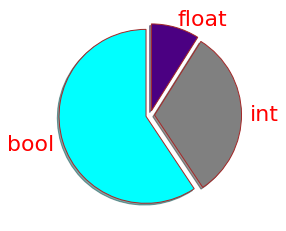

In [ ]:
# Make a piechart with the dtypes

piechart = df_matrix.dtypes.value_counts()

# Legend
legende = ['bool', 'int', 'float']

# Creating explode data 
explode = [0.05]*len(piechart)#(0.1, 0.2, 0.3 ) 
  
# Creating color parameters 
colors = ('cyan', 
          'grey', 'indigo') 
  
# Wedge properties 
wp = { 'linewidth' : 1, 'edgecolor' : 'brown' } 

plt.pie(piechart, 
        explode = explode,
        labels = legende, 
        shadow = True, 
        colors = colors, 
        startangle = 90, 
        wedgeprops = wp, 
        textprops = dict(color ='red'))

In [ ]:
df_matrix.head()

,TARGET,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,NAME_CONTRACT_TYPE is unknown,CODE_GENDER = F,CODE_GENDER = M,CODE_GENDER = XNA,CODE_GENDER is unknown,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,FLAG_OWN_CAR is unknown,FLAG_OWN_REALTY = Y,FLAG_OWN_REALTY = N,FLAG_OWN_REALTY is unknown,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = Commercial associate,NAME_INCOME_TYPE = State servant,NAME_INCOME_TYPE = Student,NAME_INCOME_TYPE = Pensioner,NAME_INCOME_TYPE = Maternity leave,NAME_INCOME_TYPE = Businessman,NAME_INCOME_TYPE is unknown,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_EDUCATION_TYPE = Incomplete higher,NAME_EDUCATION_TYPE = Lower secondary,NAME_EDUCATION_TYPE = Academic degree,NAME_EDUCATION_TYPE is unknown,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,NAME_FAMILY_STATUS = Civil marriage,NAME_FAMILY_STATUS = Separated,NAME_FAMILY_STATUS = Widow,NAME_FAMILY_STATUS is unknown,NAME_HOUSING_TYPE = House / apartment,NAME_HOUSING_TYPE = With parents,NAME_HOUSING_TYPE = Municipal apartment,NAME_HOUSING_TYPE = Rented apartment,NAME_HOUSING_TYPE = Office apartment,NAME_HOUSING_TYPE = Co-op apartment,NAME_HOUSING_TYPE is unknown,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Unknown,OCCUPATION_TYPE = Sales staff,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Managers,OCCUPATION_TYPE = Drivers,OCCUPATION_TYPE = High skill tech staff,OCCUPATION_TYPE = Accountants,OCCUPATION_TYPE = Medicine staff,OCCUPATION_TYPE = Security staff,OCCUPATION_TYPE is unknown,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START = TUESDAY,WEEKDAY_APPR_PROCESS_START = WEDNESDAY,WEEKDAY_APPR_PROCESS_START = MONDAY,WEEKDAY_APPR_PROCESS_START = THURSDAY,WEEKDAY_APPR_PROCESS_START = FRIDAY,WEEKDAY_APPR_PROCESS_START = SATURDAY,WEEKDAY_APPR_PROCESS_START = SUNDAY,WEEKDAY_APPR_PROCESS_START is unknown,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE = Business Entity Type 3,ORGANIZATION_TYPE = Self-employed,ORGANIZATION_TYPE = Other,ORGANIZATION_TYPE = Medicine,ORGANIZATION_TYPE = Business Entity Type 2,ORGANIZATION_TYPE = Government,ORGANIZATION_TYPE = School,ORGANIZATION_TYPE = Trade: type 7,ORGANIZATION_TYPE = Construction,ORGANIZATION_TYPE = Kindergarten,ORGANIZATION_TYPE is unknown,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SET = Train,SET = Test,SET is unknown
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,True,False,False,False,True,False,False,True,False,False,True,False,False,0,202500.0,406597.5,24700.5,351000.0,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,True,False,False,False,False,False,False,False,False,False,False,1.0,2,2,False,True,False,False,False,False,False,False,10,0,0,0,0,0,0,True,False,False,False,False,False,False,False,False,False,False,0.083037,0.262949,0.139376,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,True,False,False
100003,0.0,True,False,False,True,False,False,False,True,False,False,False,True,False,0,270000.0,1293502.5,35698.5,1129500.0,False,False,True,Fal

In [ ]:
list_col = []

for col in df_matrix.columns: 
    list_col.append(col)
    #print(col)

In [ ]:
list_col

['TARGET',
 'NAME_CONTRACT_TYPE = Cash loans',
 'NAME_CONTRACT_TYPE = Revolving loans',
 'NAME_CONTRACT_TYPE is unknown',
 'CODE_GENDER = F',
 'CODE_GENDER = M',
 'CODE_GENDER = XNA',
 'CODE_GENDER is unknown',
 'FLAG_OWN_CAR = N',
 'FLAG_OWN_CAR = Y',
 'FLAG_OWN_CAR is unknown',
 'FLAG_OWN_REALTY = Y',
 'FLAG_OWN_REALTY = N',
 'FLAG_OWN_REALTY is unknown',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_INCOME_TYPE = Working',
 'NAME_INCOME_TYPE = Commercial associate',
 'NAME_INCOME_TYPE = State servant',
 'NAME_INCOME_TYPE = Student',
 'NAME_INCOME_TYPE = Pensioner',
 'NAME_INCOME_TYPE = Maternity leave',
 'NAME_INCOME_TYPE = Businessman',
 'NAME_INCOME_TYPE is unknown',
 'NAME_EDUCATION_TYPE = Secondary / secondary special',
 'NAME_EDUCATION_TYPE = Higher education',
 'NAME_EDUCATION_TYPE = Incomplete higher',
 'NAME_EDUCATION_TYPE = Lower secondary',
 'NAME_EDUCATION_TYPE = Academic degree',
 'NAME_EDUCATION_TYPE is unknown',
 'NAME_

### Imputation dans les features crées

In [ ]:
missing_rate_bis(df_matrix)

OCCUPATION_TYPE = Managers                             0.000000
ORGANIZATION_TYPE = Medicine                           0.000000
ORGANIZATION_TYPE = Other                              0.000000
ORGANIZATION_TYPE = Self-employed                      0.000000
ORGANIZATION_TYPE = Business Entity Type 3             0.000000
LIVE_CITY_NOT_WORK_CITY                                0.000000
REG_CITY_NOT_WORK_CITY                                 0.000000
REG_CITY_NOT_LIVE_CITY                                 0.000000
LIVE_REGION_NOT_WORK_REGION                            0.000000
REG_REGION_NOT_WORK_REGION                             0.000000
REG_REGION_NOT_LIVE_REGION                             0.000000
HOUR_APPR_PROCESS_START                                0.000000
WEEKDAY_APPR_PROCESS_START is unknown                  0.000000
WEEKDAY_APPR_PROCESS_START = SUNDAY                    0.000000
WEEKDAY_APPR_PROCESS_START = SATURDAY                  0.000000
WEEKDAY_APPR_PROCESS_START = FRIDAY     

In [ ]:
df_matrix.isnull().values.any()

True

In [ ]:
df_matrix['TARGET'].values

array([ 1.,  0.,  0., ..., nan, nan, nan], dtype=float32)

In [ ]:
for col in df_matrix.columns: 
    if (df_matrix[col].isnull().values.any()==True):
        print(col)

TARGET


In [ ]:
col_nan = []

for col in df_matrix.columns: 
    
    list_nan = np.isnan(df_matrix[col].values)

    if True in list_nan:
        col_nan.append(col)

col_nan

['TARGET']

In [ ]:
# Create a list of the features created from the TARGET
col_nan_drop = [#'TARGET + 0',
                #'1 / TARGET',
                #'TARGET / 1',
                #'TARGET % 1',
                #'TARGET * 1',
                #'0 - TARGET',
                #'TARGET - 0',
                ]

In [ ]:
# Drop features created from the TARGET
#df_matrix.drop(columns=col_nan_drop, inplace=True)

In [ ]:
for col in df_matrix.columns: 
    if (df_matrix[col].isnull().values.any()==True):
        print(col)

TARGET


In [ ]:
col_neginf = []

for col in df_matrix.columns: 
    
    list_posinf = np.isneginf(df_matrix[col].values)

    if True in list_posinf:
        col_neginf.append(col)

col_neginf

[]

In [ ]:
col_posinf = []

for col in df_matrix.columns: 
    
    list_posinf = np.isposinf(df_matrix[col].values)

    if True in list_posinf:
        col_posinf.append(col)

col_posinf

[]

In [ ]:
# Delete rows if 'AMT_ANNUITY' and 'AMT_GOODS_PRICE' are NaN
#df_app.dropna(subset=['AMT_ANNUITY', 'AMT_GOODS_PRICE'], inplace=True)

In [ ]:
# Replace inf by 0
#for col in df_matrix.columns:
#    if col in col_posinf: 
#        df_matrix[col] = df_matrix[col].replace(np.inf, 0.0)

In [ ]:
for col in df_matrix.columns: 
    if (df_matrix[col].isnull().values.any()==True):
        print(col)

TARGET


In [ ]:
missing_rate_bis(df_matrix)

OCCUPATION_TYPE = Managers                             0.000000
ORGANIZATION_TYPE = Medicine                           0.000000
ORGANIZATION_TYPE = Other                              0.000000
ORGANIZATION_TYPE = Self-employed                      0.000000
ORGANIZATION_TYPE = Business Entity Type 3             0.000000
LIVE_CITY_NOT_WORK_CITY                                0.000000
REG_CITY_NOT_WORK_CITY                                 0.000000
REG_CITY_NOT_LIVE_CITY                                 0.000000
LIVE_REGION_NOT_WORK_REGION                            0.000000
REG_REGION_NOT_WORK_REGION                             0.000000
REG_REGION_NOT_LIVE_REGION                             0.000000
HOUR_APPR_PROCESS_START                                0.000000
WEEKDAY_APPR_PROCESS_START is unknown                  0.000000
WEEKDAY_APPR_PROCESS_START = SUNDAY                    0.000000
WEEKDAY_APPR_PROCESS_START = SATURDAY                  0.000000
WEEKDAY_APPR_PROCESS_START = FRIDAY     

### Encodage des features avec des booléens

In [ ]:
print(df_matrix.select_dtypes(include=['boolean']).columns)

Index(['NAME_CONTRACT_TYPE = Cash loans',
       'NAME_CONTRACT_TYPE = Revolving loans', 'NAME_CONTRACT_TYPE is unknown',
       'CODE_GENDER = F', 'CODE_GENDER = M', 'CODE_GENDER = XNA',
       'CODE_GENDER is unknown', 'FLAG_OWN_CAR = N', 'FLAG_OWN_CAR = Y',
       'FLAG_OWN_CAR is unknown', 'FLAG_OWN_REALTY = Y', 'FLAG_OWN_REALTY = N',
       'FLAG_OWN_REALTY is unknown', 'NAME_INCOME_TYPE = Working',
       'NAME_INCOME_TYPE = Commercial associate',
       'NAME_INCOME_TYPE = State servant', 'NAME_INCOME_TYPE = Student',
       'NAME_INCOME_TYPE = Pensioner', 'NAME_INCOME_TYPE = Maternity leave',
       'NAME_INCOME_TYPE = Businessman', 'NAME_INCOME_TYPE is unknown',
       'NAME_EDUCATION_TYPE = Secondary / secondary special',
       'NAME_EDUCATION_TYPE = Higher education',
       'NAME_EDUCATION_TYPE = Incomplete higher',
       'NAME_EDUCATION_TYPE = Lower secondary',
       'NAME_EDUCATION_TYPE = Academic degree',
       'NAME_EDUCATION_TYPE is unknown', 'NAME_FAMILY_STATUS = 

In [ ]:
boolean_encoding(df_matrix)

In [ ]:
df_matrix.head()

,TARGET,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,NAME_CONTRACT_TYPE is unknown,CODE_GENDER = F,CODE_GENDER = M,CODE_GENDER = XNA,CODE_GENDER is unknown,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,FLAG_OWN_CAR is unknown,FLAG_OWN_REALTY = Y,FLAG_OWN_REALTY = N,FLAG_OWN_REALTY is unknown,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = Commercial associate,NAME_INCOME_TYPE = State servant,NAME_INCOME_TYPE = Student,NAME_INCOME_TYPE = Pensioner,NAME_INCOME_TYPE = Maternity leave,NAME_INCOME_TYPE = Businessman,NAME_INCOME_TYPE is unknown,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_EDUCATION_TYPE = Incomplete higher,NAME_EDUCATION_TYPE = Lower secondary,NAME_EDUCATION_TYPE = Academic degree,NAME_EDUCATION_TYPE is unknown,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,NAME_FAMILY_STATUS = Civil marriage,NAME_FAMILY_STATUS = Separated,NAME_FAMILY_STATUS = Widow,NAME_FAMILY_STATUS is unknown,NAME_HOUSING_TYPE = House / apartment,NAME_HOUSING_TYPE = With parents,NAME_HOUSING_TYPE = Municipal apartment,NAME_HOUSING_TYPE = Rented apartment,NAME_HOUSING_TYPE = Office apartment,NAME_HOUSING_TYPE = Co-op apartment,NAME_HOUSING_TYPE is unknown,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Unknown,OCCUPATION_TYPE = Sales staff,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Managers,OCCUPATION_TYPE = Drivers,OCCUPATION_TYPE = High skill tech staff,OCCUPATION_TYPE = Accountants,OCCUPATION_TYPE = Medicine staff,OCCUPATION_TYPE = Security staff,OCCUPATION_TYPE is unknown,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START = TUESDAY,WEEKDAY_APPR_PROCESS_START = WEDNESDAY,WEEKDAY_APPR_PROCESS_START = MONDAY,WEEKDAY_APPR_PROCESS_START = THURSDAY,WEEKDAY_APPR_PROCESS_START = FRIDAY,WEEKDAY_APPR_PROCESS_START = SATURDAY,WEEKDAY_APPR_PROCESS_START = SUNDAY,WEEKDAY_APPR_PROCESS_START is unknown,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE = Business Entity Type 3,ORGANIZATION_TYPE = Self-employed,ORGANIZATION_TYPE = Other,ORGANIZATION_TYPE = Medicine,ORGANIZATION_TYPE = Business Entity Type 2,ORGANIZATION_TYPE = Government,ORGANIZATION_TYPE = School,ORGANIZATION_TYPE = Trade: type 7,ORGANIZATION_TYPE = Construction,ORGANIZATION_TYPE = Kindergarten,ORGANIZATION_TYPE is unknown,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SET = Train,SET = Test,SET is unknown
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,202500.0,406597.5,24700.5,351000.0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1.0,2,2,0,1,0,0,0,0,0,0,10,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.083037,0.262949,0.139376,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
100003,0.0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,270000.0,1293502.5,35698.5,1129500.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,2.0,1,1,0,0,1,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.311267,0.622246,0.499387,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
100004,0.0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,67500.0,135000.0,6750.0,135000.0,1,0,0,0,0,0,0,0,1,0

In [ ]:
df_matrix.dtypes.value_counts()

int64      73
int32      39
float32    11
dtype: int64

In [ ]:
convert_numerical_data(df_matrix)

In [ ]:
df_matrix.dtypes.value_counts()

int32      112
float32     11
dtype: int64

In [ ]:
df_matrix.shape

(275907, 123)

### Vérification validité des échantillons train et test

In [ ]:
len(df_matrix[df_matrix['SET = Test']==True])

37342

In [ ]:
len(df_matrix[df_matrix['SET = Test']==False])

238565

In [ ]:
len(df_matrix[df_matrix['SET = Train']==True])

238565

In [ ]:
len(df_matrix[df_matrix['SET = Train']==False])

37342

In [ ]:
len(df_matrix[df_matrix['SET is unknown']==True])

0

In [ ]:
len(df_matrix[df_matrix['SET is unknown']==False])

275907

In [ ]:
37342+238565

275907

### Recréer l'échantillon d'entrainement

In [ ]:
# Define sample training 
training = df_matrix[df_matrix['SET = Train']==True]

In [ ]:
# Define sample test 
test = df_matrix[df_matrix['SET = Test']==True]

In [ ]:
training

,TARGET,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,NAME_CONTRACT_TYPE is unknown,CODE_GENDER = F,CODE_GENDER = M,CODE_GENDER = XNA,CODE_GENDER is unknown,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,FLAG_OWN_CAR is unknown,FLAG_OWN_REALTY = Y,FLAG_OWN_REALTY = N,FLAG_OWN_REALTY is unknown,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = Commercial associate,NAME_INCOME_TYPE = State servant,NAME_INCOME_TYPE = Student,NAME_INCOME_TYPE = Pensioner,NAME_INCOME_TYPE = Maternity leave,NAME_INCOME_TYPE = Businessman,NAME_INCOME_TYPE is unknown,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_EDUCATION_TYPE = Incomplete higher,NAME_EDUCATION_TYPE = Lower secondary,NAME_EDUCATION_TYPE = Academic degree,NAME_EDUCATION_TYPE is unknown,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,NAME_FAMILY_STATUS = Civil marriage,NAME_FAMILY_STATUS = Separated,NAME_FAMILY_STATUS = Widow,NAME_FAMILY_STATUS is unknown,NAME_HOUSING_TYPE = House / apartment,NAME_HOUSING_TYPE = With parents,NAME_HOUSING_TYPE = Municipal apartment,NAME_HOUSING_TYPE = Rented apartment,NAME_HOUSING_TYPE = Office apartment,NAME_HOUSING_TYPE = Co-op apartment,NAME_HOUSING_TYPE is unknown,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Unknown,OCCUPATION_TYPE = Sales staff,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Managers,OCCUPATION_TYPE = Drivers,OCCUPATION_TYPE = High skill tech staff,OCCUPATION_TYPE = Accountants,OCCUPATION_TYPE = Medicine staff,OCCUPATION_TYPE = Security staff,OCCUPATION_TYPE is unknown,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START = TUESDAY,WEEKDAY_APPR_PROCESS_START = WEDNESDAY,WEEKDAY_APPR_PROCESS_START = MONDAY,WEEKDAY_APPR_PROCESS_START = THURSDAY,WEEKDAY_APPR_PROCESS_START = FRIDAY,WEEKDAY_APPR_PROCESS_START = SATURDAY,WEEKDAY_APPR_PROCESS_START = SUNDAY,WEEKDAY_APPR_PROCESS_START is unknown,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE = Business Entity Type 3,ORGANIZATION_TYPE = Self-employed,ORGANIZATION_TYPE = Other,ORGANIZATION_TYPE = Medicine,ORGANIZATION_TYPE = Business Entity Type 2,ORGANIZATION_TYPE = Government,ORGANIZATION_TYPE = School,ORGANIZATION_TYPE = Trade: type 7,ORGANIZATION_TYPE = Construction,ORGANIZATION_TYPE = Kindergarten,ORGANIZATION_TYPE is unknown,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SET = Train,SET = Test,SET is unknown
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,202500.0,406597.5,24700.5,351000.0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1.0,2,2,0,1,0,0,0,0,0,0,10,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.083037,0.262949,0.139376,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
100003,0.0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,270000.0,1293502.5,35698.5,1129500.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,2.0,1,1,0,0,1,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.311267,0.622246,0.520898,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
100004,0.0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,67500.0,135000.0,6750.0,135000.0,1,0,0,0,0,0,0,0,1,0

In [ ]:
training.shape

(238565, 123)

In [ ]:
training['SET = Train'].unique()

array([1], dtype=int32)

In [ ]:
training.dtypes

TARGET                                  float32
NAME_CONTRACT_TYPE = Cash loans           int32
NAME_CONTRACT_TYPE = Revolving loans      int32
NAME_CONTRACT_TYPE is unknown             int32
CODE_GENDER = F                           int32
                                         ...   
FLAG_DOCUMENT_20                          int32
FLAG_DOCUMENT_21                          int32
SET = Train                               int32
SET = Test                                int32
SET is unknown                            int32
Length: 123, dtype: object

In [ ]:
training.dtypes.value_counts()

int32      112
float32     11
dtype: int64

In [ ]:
missing_rate_bis(training)

TARGET                                                 0.0
ORGANIZATION_TYPE = Medicine                           0.0
ORGANIZATION_TYPE = Other                              0.0
ORGANIZATION_TYPE = Self-employed                      0.0
ORGANIZATION_TYPE = Business Entity Type 3             0.0
LIVE_CITY_NOT_WORK_CITY                                0.0
REG_CITY_NOT_WORK_CITY                                 0.0
REG_CITY_NOT_LIVE_CITY                                 0.0
LIVE_REGION_NOT_WORK_REGION                            0.0
REG_REGION_NOT_WORK_REGION                             0.0
REG_REGION_NOT_LIVE_REGION                             0.0
HOUR_APPR_PROCESS_START                                0.0
WEEKDAY_APPR_PROCESS_START is unknown                  0.0
WEEKDAY_APPR_PROCESS_START = SUNDAY                    0.0
WEEKDAY_APPR_PROCESS_START = SATURDAY                  0.0
WEEKDAY_APPR_PROCESS_START = FRIDAY                    0.0
WEEKDAY_APPR_PROCESS_START = THURSDAY                  0

In [ ]:
# Verify the presence of NaN
for col in training.columns: 
    if (training[col].isnull().values.any()==True):
        print(col)

In [ ]:
training['TARGET'].unique()

array([1., 0.], dtype=float32)

In [ ]:
# Save data frame
with open('training.pkl', 'wb') as pickle_file:
    pickle.dump(training, pickle_file)

files.download('training.pkl')

In [ ]:
# Reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/training.pkl', 'rb') as pickle_file:
    df_training = pickle.load(pickle_file)
training = df_trainingcopy()

### Création d'une target et d'une matrice avec les features

In [ ]:
# Features train_set
X_train_set = training.drop(['TARGET'], axis=1)

# Target train_set
y_train_set = training['TARGET']


print(X_train_set.shape)
print(y_train_set.shape)

(238565, 122)
(238565,)


In [ ]:
# Features test_set
X_test_set = test.drop(['TARGET'], axis=1)

# Target test_set
y_test_set = test['TARGET']


print(X_test_set.shape)
print(y_test_set.shape)

(37342, 122)
(37342,)


In [ ]:
y_test_set.unique()

array([nan], dtype=float32)

In [ ]:
# Save data frame
with open('y_train_set.pkl', 'wb') as pickle_file:
    pickle.dump(y_train_set, pickle_file)

files.download('y_train_set.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/y_train_set.pkl', 'rb') as pickle_file:
    df_y = pickle.load(pickle_file)
y_train_set = df_y.copy()

### Sélection des features 

#### Modèle de sélection de features

In [ ]:
# Classifier
xgcl = XGBClassifier(max_depth=3,
                 learning_rate=0.05,
                 n_estimators=350,
                 objective="binary:logistic",
                 booster="gbtree",
                 gamma=0,
                 subsample=1,
                 colsample_bylevel=1,
                 colsample_bytree=0.6,
                 reg_alpha=0.001,
                 reg_lambda=1,
                 random_state=4,
                 n_jobs=-1,
                 )

In [ ]:
# Create a selector with SelectFromModel
selector = SelectFromModel(estimator=xgcl).fit(X_train_set, y_train_set)

In [ ]:
# Print estimator
selector.estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=350, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=4,
              reg_alpha=0.001, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
# Print estimator
selector.estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=350, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=4,
              reg_alpha=0.001, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
# Print threshold
selector.threshold_

0.008196721

In [ ]:
# Print observation for each feature if they are selected as important
selector.get_support()

array([ True,  True, False,  True,  True, False, False,  True,  True,
       False, False, False, False, False, False,  True,  True,  True,
        True, False,  True, False, False, False, False, False,  True,
        True, False, False, False, False,  True,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False,  True, False, False, False, False,
       False, False,  True, False, False,  True, False,  True, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False,  True, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False])

In [ ]:
# Create a list with the feature names in the matrix
feature_names = X_train_set.columns
feature_names

Index(['NAME_CONTRACT_TYPE = Cash loans',
       'NAME_CONTRACT_TYPE = Revolving loans', 'NAME_CONTRACT_TYPE is unknown',
       'CODE_GENDER = F', 'CODE_GENDER = M', 'CODE_GENDER = XNA',
       'CODE_GENDER is unknown', 'FLAG_OWN_CAR = N', 'FLAG_OWN_CAR = Y',
       'FLAG_OWN_CAR is unknown',
       ...
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'SET = Train', 'SET = Test', 'SET is unknown'],
      dtype='object', length=122)

In [ ]:
# Print the names of the features selected as important
list_selected_features = feature_names[selector.get_support()]

print("Features selected by SelectFromModel:"
      f"{list_selected_features}")

Features selected by SelectFromModel:Index(['NAME_CONTRACT_TYPE = Cash loans',
       'NAME_CONTRACT_TYPE = Revolving loans', 'CODE_GENDER = F',
       'CODE_GENDER = M', 'FLAG_OWN_CAR = N', 'FLAG_OWN_CAR = Y', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE = Working',
       'NAME_INCOME_TYPE = State servant',
       'NAME_EDUCATION_TYPE = Secondary / secondary special',
       'NAME_EDUCATION_TYPE = Higher education',
       'NAME_FAMILY_STATUS = Married',
       'NAME_FAMILY_STATUS = Single / not married', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'OCCUPATION_TYPE = Laborers',
       'OCCUPATION_TYPE = Core staff', 'OCCUPATION_TYPE = Drivers',
       'REGION_RATING_CLIENT_W_CITY', 'REG_CITY_NOT_LIVE_CITY',
       'ORGANIZATION_TYPE = Self-employed', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_16'],
      dtype='object')


In [ ]:
# Print each element of the list
for elt in list_selected_features:
    print(elt)

NAME_CONTRACT_TYPE = Cash loans
NAME_CONTRACT_TYPE = Revolving loans
CODE_GENDER = F
CODE_GENDER = M
FLAG_OWN_CAR = N
FLAG_OWN_CAR = Y
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
NAME_INCOME_TYPE = Working
NAME_INCOME_TYPE = State servant
NAME_EDUCATION_TYPE = Secondary / secondary special
NAME_EDUCATION_TYPE = Higher education
NAME_FAMILY_STATUS = Married
NAME_FAMILY_STATUS = Single / not married
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_ID_PUBLISH
OCCUPATION_TYPE = Laborers
OCCUPATION_TYPE = Core staff
OCCUPATION_TYPE = Drivers
REGION_RATING_CLIENT_W_CITY
REG_CITY_NOT_LIVE_CITY
ORGANIZATION_TYPE = Self-employed
EXT_SOURCE_1
EXT_SOURCE_2
EXT_SOURCE_3
FLAG_DOCUMENT_3
FLAG_DOCUMENT_16


In [ ]:
# Create a matrix with only the features selected as important
matrix_features = X_train_set[list_selected_features]

In [ ]:
matrix_features.shape

(238565, 29)

In [ ]:
matrix_features.head()

,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,CODE_GENDER = F,CODE_GENDER = M,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = State servant,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Drivers,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE = Self-employed,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_3,FLAG_DOCUMENT_16
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1,0,0,1,1,0,406597.5,24700.5,351000.0,1,0,1,0,0,1,-9461,-637,-2120,1,0,0,2,0,0,0.083037,0.262949,0.139376,1,0
100003,1,0,1,0,1,0,1293502.5,35698.5,1129500.0,0,1,0,1,1,0,-16765,-1188,-291,0,1,0,1,0,0,0.311267,0.622246,0.520898,1,0
100004,0,1,0,1,0,1,135000.0,6750.0,135000.0,1,0,1,0,0,1,-19046,-225,-2531,1,0,0,2,0,0,0.479396,0.555912,0.729567,0,0
100006,1,0,1,0,1,0,312682.5,29686.5,297000.0,1,0,1,0,0,0,-19005,-3039,-2437,1,0,0,2,0,0,0.479396,0.650442,0.520898,1,0
100007,1,0,0,1,1,0,513000.0,21865.5,513000.0,1,0,1,0,0,1,-19932,-3038,-3458,0,1,0,2,0,0,0.479396,0.322738,0.520898,0,0


In [ ]:
matrix_features_VF = matrix_features.copy()

In [ ]:
# Save data frame
with open('matrix_features_VF.pkl', 'wb') as pickle_file:
    pickle.dump(matrix_features_VF, pickle_file)

files.download('matrix_features_VF.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/matrix_features_VF.pkl', 'rb') as pickle_file:
    df_matrix_features_VF = pickle.load(pickle_file)
matrix_features_VF = df_matrix_features_VF.copy()

#### Visualisation

In [ ]:
xgcl.fit(matrix_features_VF, y_train_set)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=350, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=4,
              reg_alpha=0.001, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
importances = xgcl.feature_importances_
importances

array([0.01604402, 0.02381948, 0.02971131, 0.04357872, 0.03351291,
       0.03941165, 0.02196313, 0.02224873, 0.03270619, 0.03359654,
       0.01627844, 0.04705931, 0.09539379, 0.01659054, 0.00760213,
       0.01642237, 0.03616628, 0.01052772, 0.01134415, 0.01916149,
       0.0132339 , 0.02298507, 0.01836355, 0.01542004, 0.04081025,
       0.13590993, 0.11582225, 0.05276366, 0.0115524 ], dtype=float32)

In [ ]:
features = matrix_features.columns
# Calculate feature importance
importances = xgcl.feature_importances_
# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]
#indices = np.argsort(importances)

Text(0.5, 0, 'Relative Importance')

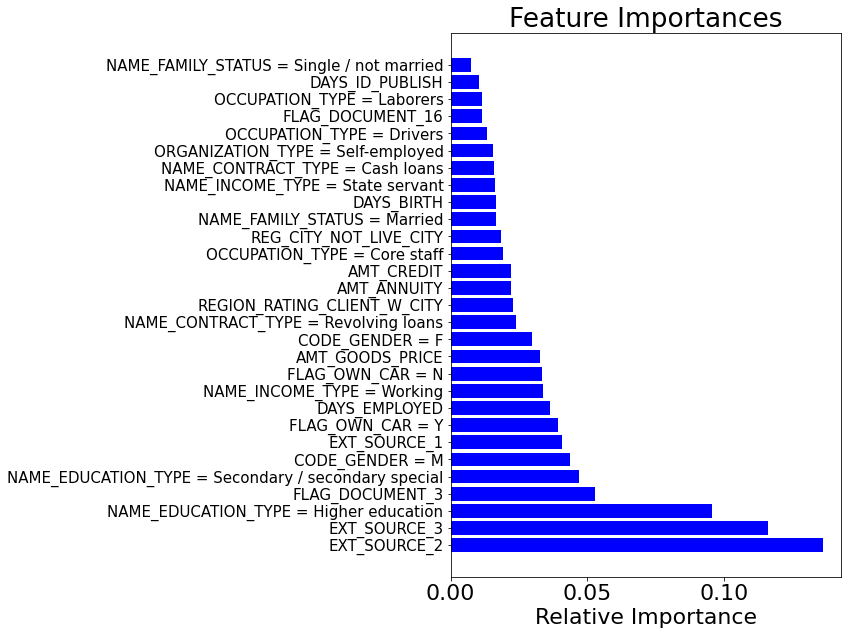

In [ ]:
plt.figure(figsize=(7,10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices], size=15)
plt.xlabel('Relative Importance')

#### Colinéarité des features

In [ ]:
matrix_features.shape

(238565, 29)

In [ ]:
pd.set_option('display.max_rows', 69)

vif_table = calc_vif(matrix_features)
vif_table

,variables,VIF
0,NAME_CONTRACT_TYPE = Cash loans,inf
1,NAME_CONTRACT_TYPE = Revolving loans,inf
2,CODE_GENDER = F,1.399018e+04
3,CODE_GENDER = M,1.399064e+04
4,FLAG_OWN_CAR = N,inf
5,FLAG_OWN_CAR = Y,inf
6,AMT_CREDIT,3.815884e+01
7,AMT_ANNUITY,2.577712e+00
8,AMT_GOODS_PRICE,3.855932e+01
9,NAME_INCOME_TYPE = Working,1.255456e+00


In [ ]:
vif_table.sort_values(by=['VIF'], ascending=False)

,variables,VIF
0,NAME_CONTRACT_TYPE = Cash loans,inf
4,FLAG_OWN_CAR = N,inf
5,FLAG_OWN_CAR = Y,inf
1,NAME_CONTRACT_TYPE = Revolving loans,inf
3,CODE_GENDER = M,1.399064e+04
2,CODE_GENDER = F,1.399018e+04
8,AMT_GOODS_PRICE,3.855932e+01
6,AMT_CREDIT,3.815884e+01
11,NAME_EDUCATION_TYPE = Secondary / secondary special,4.838646e+00
12,NAME_EDUCATION_TYPE = Higher education,4.804190e+00


In [ ]:
df_sample = matrix_features_VF.sample(1000)#, axis=1)

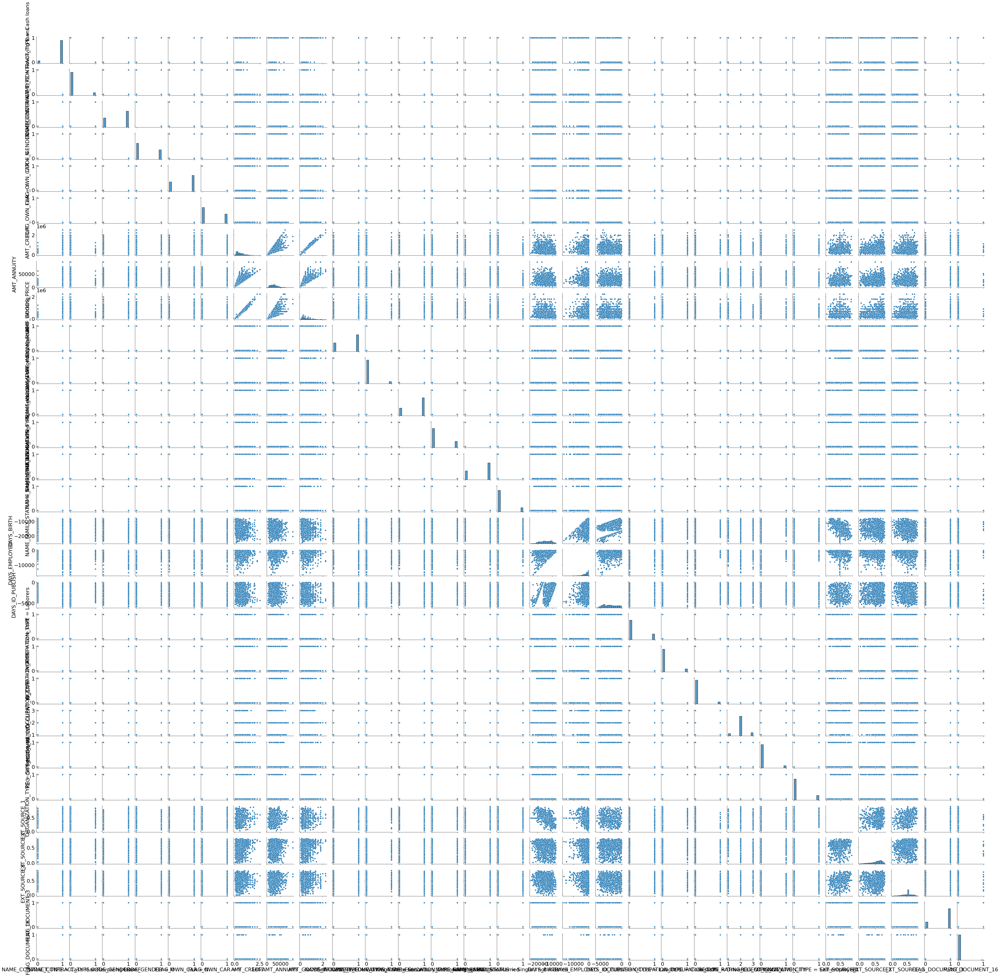

In [ ]:
sns.pairplot(df_sample)

## Modélisation

### Fonctions utilisées

In [ ]:
"""Apply threshold to positive probabilities to create labels"""


def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

In [ ]:
"""Modelisation"""


def modelisation(pipe, param_grid, cv,
                 X_train, y_train, X_test, y_test,
                 nom_model_test, nom_model_entrainement):
    
    global df_model
        
    param_grid = param_grid
    
    cv = cv

    grid = GridSearchCV(estimator=pipe,
                        param_grid=param_grid, 
                        cv = cv,
                        )
  
    # Timer training on
    start_time_train = timeit.default_timer()
    
    # Crossed validation
    grid.fit(X_train, y_train)
 
    # Get optimal model and its parameters, score and index
    optimal = grid.best_estimator_
    print("Le modèle optimal est {}".format(optimal))
    print("Les paramètres optimaux sont {}".format(grid.best_params_))
    print("Le score optimal est {}".format(grid.best_score_))
    print("L'index optimal est {}".format(grid.best_index_))

    # Train the model
    optimal.fit(X_train, y_train)
        
    # Timer training off
    elapsed_train = timeit.default_timer() - start_time_train
       
    # Predict on training data
    y_train_pred = optimal.predict(X_train)    

    # Timer test on
    start_time_test = timeit.default_timer()

    # Prediction on test set
    y_test_pred = grid.predict(X_test)
    
    # Timer test off
    elapsed_test = timeit.default_timer() - start_time_test
    
    # Print times
    print('Temps Entrainement {:.2f}s'.format(elapsed_train))
    print('Temps Test {:.2f}s'.format(elapsed_test))
    print('*******************************************************')

    
    # Metrics test set 
    print('Statistiques du Test Set')
    accuracy = accuracy_score(y_test, y_test_pred)
    print('Accuracy score: {}'.format(accuracy))
    ROC = roc_auc_score(y_test, y_test_pred)
    print('AUC score: {}'.format(ROC))
    F1 = f1_score(y_test, y_test_pred) #average='binary' by default
    print('F1 score: {}'.format(F1))
    MCC = matthews_corrcoef(y_test, y_test_pred)
    print('Matthews correlation coefficient: {}'.format(MCC))

    ####
    
    var_stat_test = [accuracy, ROC, F1, MCC, elapsed_test]
    stat_test = pd.Series(var_stat_test)
    
    print('******************************************************')
    
    # Metrics train set
    print('Statistiques du Train Set')
    accuracy = accuracy_score(y_train, y_train_pred)
    print('Accuracy score: {}'.format(accuracy))
    ROC = roc_auc_score(y_train, y_train_pred)
    print('AUC score: {}'.format(ROC))
    F1 = f1_score(y_train, y_train_pred) #average='binary' by default
    print('F1 score: {}'.format(F1))
    MCC = matthews_corrcoef(y_train, y_train_pred)
    print('Matthews correlation coefficient: {}'.format(MCC))
    
    ####

    var_stat_train = [accuracy, ROC, F1, MCC, elapsed_train]
    stat_train = pd.Series(var_stat_train)

    print('******************************************************')

    # Print a table with the results
    var_stat = ['accuracy', 'AUC', 'F1', 'MCC', 'Temps (en s)']
    stat = pd.Series(var_stat)
    
    df_stat = pd.DataFrame(stat, columns = ['Variable Stat'])
    df_stat_test = pd.DataFrame(stat_test, columns = [nom_model_test])
    df_stat_train = pd.DataFrame(stat_train, columns = [nom_model_entrainement])

    df_model = pd.concat([df_stat, df_stat_test, df_stat_train], axis=1)
    print(df_model)
    print(type(df_model))

    print('******************************************************')

    # Visualisations 

    ## Confusion matrix
    cm = confusion_matrix(y_test, y_test_pred)

    # Define tp, fp, tn and fn
    tp = cm[1,1]
    fp = cm[0,1]
    tn = cm[0,0]
    fn = cm[1,0]

    print('Vrais Positifs = ', tp)
    print('Vrais Négatifs = ', tn)
    print('Faux Positifs = ', fp)
    print('Faux Négatifs = ', fn)

    print('******************************************************')

    # Specificity
    specificity = tn / float(tn + fp)
    print('Spécificité = ',specificity)

    # False Positive Rate
    if fp == 0:
        FP_rate = 0
    else:
        FP_rate = fp / float(tn + fp)
    print('Taux de Faux Positifs = ',FP_rate)

    print('******************************************************')
    
    # Print matrix
    sns.heatmap(cm, xticklabels=['Prédit 0', 'Prédit 1'],
                yticklabels=['        Vrai 0', '        Vrai 1'],
                annot=True, fmt='d')
    plt.title('Matrice de confusion')
    plt.show()


    ## ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.title('Courbe ROC')
    plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', size=8)
    plt.ylabel('Taux de Vrai Positifs (Sensibilité)', size=8)
    plt.grid(True)
    plt.show()


    #####
    # OPTIMISATION OF THE THRESHOLD
    #####

    print('******************************************************')
    print('Détermination du seuil optimal')

    #y_test_model = grid.predict_proba(X_test)
    y_pred_proba = grid.predict_proba(X_test)[:, 1]

    # Define thresholds
    thresholds = np.arange(0, 1, 0.001)

    # Evaluate each threshold
    scores = [roc_auc_score(y_test, to_labels(y_pred_proba, t)) for t in thresholds]

    # Get best threshold
    ix = np.argmax(scores)
    best_threshold = thresholds[ix]
    best_auc_score = scores[ix]
    print('Le threshold optimal est :', best_threshold)
    print('Le score AUC optimal est :', best_auc_score)


    #####
    # AFTER OPTIMISATION OF THE THRESHOLD
    #####
    
    print('******************************************************')
    
    # Prediction with the new optimal threshold
    print('Prédictions avec le seuil optimisé')
       
    # Predict on training data
    y_train_pred_opt = (optimal.predict_proba(X_train)[:,1] >= best_threshold).astype(bool)

    # Timer test on
    start_time_test_opt = timeit.default_timer()

    # Prediction on test set
    y_test_pred_opt = (optimal.predict_proba(X_test)[:,1] >= best_threshold).astype(bool)
    
    # Timer test off
    elapsed_test_opt = timeit.default_timer() - start_time_test_opt
    
    # Print times
    print('Temps Entrainement {:.2f}s'.format(elapsed_train))
    print('Temps Test {:.2f}s'.format(elapsed_test_opt))
    print('*******************************************************')

    
    # Metrics test set 
    print('Statistiques du Test Set')
    accuracy = accuracy_score(y_test, y_test_pred_opt)
    print('Accuracy score: {}'.format(accuracy))
    ROC = roc_auc_score(y_test, y_test_pred_opt)
    print('AUC score: {}'.format(ROC))
    F1 = f1_score(y_test, y_test_pred_opt) #average='binary' by default
    print('F1 score: {}'.format(F1))
    MCC = matthews_corrcoef(y_test, y_test_pred_opt)
    print('Matthews correlation coefficient: {}'.format(MCC))

    ####
    
    var_stat_test = [accuracy, ROC, F1, MCC, elapsed_test_opt]
    stat_test = pd.Series(var_stat_test)
    
    print('******************************************************')
    
    # Metrics train set
    print('Statistiques du Train Set')
    accuracy = accuracy_score(y_train, y_train_pred_opt)
    print('Accuracy score: {}'.format(accuracy))
    ROC = roc_auc_score(y_train, y_train_pred_opt)
    print('AUC score: {}'.format(ROC))
    F1 = f1_score(y_train, y_train_pred_opt) #average='binary' by default
    print('F1 score: {}'.format(F1))
    MCC = matthews_corrcoef(y_train, y_train_pred_opt)
    print('Matthews correlation coefficient: {}'.format(MCC))
    
    ####

    var_stat_train = [accuracy, ROC, F1, MCC, elapsed_train]
    stat_train = pd.Series(var_stat_train)

    print('******************************************************')

    # Print a table with the results
    var_stat = ['accuracy', 'AUC', 'F1', 'MCC', 'Temps (en s)']
    stat = pd.Series(var_stat)
    
    df_stat = pd.DataFrame(stat, columns = ['Variable Stat'])
    df_stat_test = pd.DataFrame(stat_test, columns = [nom_model_test])
    df_stat_train = pd.DataFrame(stat_train, columns = [nom_model_entrainement])

    df_model = pd.concat([df_stat, df_stat_test, df_stat_train], axis=1)
    print(df_model)
    print(type(df_model))

    print('******************************************************')

    # Visualisations 

    ## Confusion matrix
    cm_opt = confusion_matrix(y_test, y_test_pred_opt)

    # Define tp, fp, tn and fn
    tp = cm_opt[1,1]
    fp = cm_opt[0,1]
    tn = cm_opt[0,0]
    fn = cm_opt[1,0]

    print('Vrais Positifs = ', tp)
    print('Vrais Négatifs = ', tn)
    print('Faux Positifs = ', fp)
    print('Faux Négatifs = ', fn)

    print('******************************************************')

    # Specificity
    specificity = tn / float(tn + fp)
    print('Spécificité = ',specificity)

    # False Positive Rate
    if fp == 0:
        FP_rate = 0
    else:
        FP_rate = fp / float(tn + fp)
    print('Taux de Faux Positifs = ',FP_rate)

    print('******************************************************')
    
    # Print matrix
    sns.heatmap(cm_opt, xticklabels=['Prédit 0', 'Prédit 1'],
                yticklabels=['        Vrai 0', '        Vrai 1'],
                annot=True, fmt='d')
    plt.title('Matrice de confusion')
    plt.show()


    ## ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_opt)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.title('Courbe ROC')
    plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', size=8)
    plt.ylabel('Taux de Vrai Positifs (Sensibilité)', size=8)
    plt.grid(True)
    plt.show()

### Echantillonage pour la modélisation

In [ ]:
#matrix_features_VF = matrix_features.copy()

In [ ]:
matrix_features_VF.shape

(238565, 29)

In [ ]:
matrix_features_VF

,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,CODE_GENDER = F,CODE_GENDER = M,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = State servant,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Drivers,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE = Self-employed,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_3,FLAG_DOCUMENT_16
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1,0,0,1,1,0,406597.5,24700.5,351000.0,1,0,1,0,0,1,-9461,-637,-2120,1,0,0,2,0,0,0.083037,0.262949,0.139376,1,0
100003,1,0,1,0,1,0,1293502.5,35698.5,1129500.0,0,1,0,1,1,0,-16765,-1188,-291,0,1,0,1,0,0,0.311267,0.622246,0.520898,1,0
100004,0,1,0,1,0,1,135000.0,6750.0,135000.0,1,0,1,0,0,1,-19046,-225,-2531,1,0,0,2,0,0,0.479396,0.555912,0.729567,0,0
100006,1,0,1,0,1,0,312682.5,29686.5,297000.0,1,0,1,0,0,0,-19005,-3039,-2437,1,0,0,2,0,0,0.479396,0.650442,0.520898,1,0
100007,1,0,0,1,1,0,513000.0,21865.5,513000.0,1,0,1,0,0,1,-19932,-3038,-3458,0,1,0,2,0,0,0.479396,0.322738,0.520898,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456248,1,0,1,0,1,0,331920.0,16096.5,225000.0,1,0,1,0,0,0,-16705,-7258,-259,0,0,0,2,0,1,0.479396,0.530725,0.520898,1,0
456251,1,0,0,1,1,0,254700.0,27558.0,225000.0,1,0,1,0,0,0,-9327,-236,-1982,0,0,0,1,0,0,0.145570,0.681632,0.520898,0,0
456253,1,0,1,0,1,0,677664.0,29979.0,585000.0,1,0,0,1,0,0,-14966,-7921,-5150,0,0,0,3,0,0,0.744026,0.535722,0.218859,1,0


In [ ]:
# Features
X_VF = matrix_features_VF   #df_matrix_without_nan.drop(['TARGET'], axis=1)

# Target
Y_VF = y_train_set  #df_matrix_without_nan['TARGET']

print(X_VF.shape)
print(Y_VF.shape)

(238565, 29)
(238565,)


In [ ]:
# Create train and test sets (from the df_app_train)
X_train, X_test, y_train, y_test = model_selection.train_test_split(X_VF.values,
                                                                    Y_VF.values,
                                                                    test_size=0.2,
                                                                    random_state=0,
                                                                    )

In [ ]:
X_train

array([[1.        , 0.        , 1.        , ..., 0.37740424, 1.        ,
        0.        ],
       [1.        , 0.        , 1.        , ..., 0.52089763, 1.        ,
        0.        ],
       [1.        , 0.        , 1.        , ..., 0.45253357, 1.        ,
        0.        ],
       ...,
       [1.        , 0.        , 0.        , ..., 0.47045612, 1.        ,
        0.        ],
       [1.        , 0.        , 1.        , ..., 0.62967426, 1.        ,
        0.        ],
       [1.        , 0.        , 0.        , ..., 0.30620229, 0.        ,
        0.        ]])

In [ ]:
np.unique(y_train)

array([0., 1.], dtype=float32)

In [ ]:
np.unique(y_test)

array([0., 1.], dtype=float32)

### Vérifier la normalité

In [ ]:
# Test normality
data = matrix_features_VF
pg.normality(data, method='normaltest', alpha=0.05) #dv='TARGET', 

,W,pval,normal
NAME_CONTRACT_TYPE = Cash loans,1.228279e+05,0.0,False
NAME_CONTRACT_TYPE = Revolving loans,1.228279e+05,0.0,False
CODE_GENDER = F,9.965422e+05,0.0,False
CODE_GENDER = M,9.966189e+05,0.0,False
FLAG_OWN_CAR = N,1.048364e+06,0.0,False
FLAG_OWN_CAR = Y,1.048364e+06,0.0,False
AMT_CREDIT,4.312950e+04,0.0,False
AMT_ANNUITY,5.237364e+04,0.0,False
AMT_GOODS_PRICE,5.068827e+04,0.0,False
NAME_INCOME_TYPE = Working,1.039155e+06,0.0,False


In [ ]:
data = matrix_features_VF
df_normal = pg.normality(data, method='shapiro', alpha=0.05) #dv='TARGET', 

In [ ]:
# Verify is there is a column with normal=True
df_normal[df_normal['normal']==True]

,W,pval,normal


### Régression Logistique

In [ ]:
model1 = make_pipeline(StandardScaler(),
                      LogisticRegression())

param_grid1 = {}

cv=5

Le modèle optimal est Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('logisticregression',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)
Les paramètres optimaux sont {}
Le score optimal est 0.9131578403094543
L'index optimal est 0
Temps Entrainement 10.31s
Temps Test 0.02s
*******************************************************
Statistiques du Test Set
Accuracy score: 0.9113449164797854
AUC score: 0.5064235273285475
F1 score: 0.0

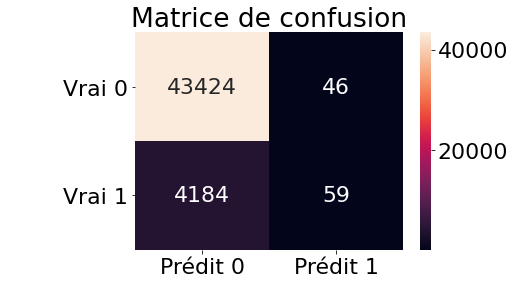

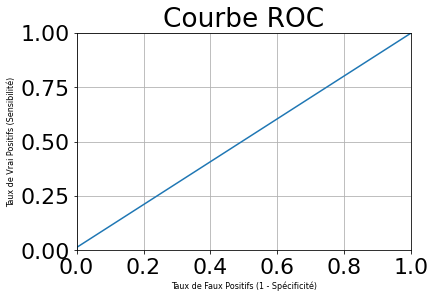

******************************************************
Détermination du seuil optimal
Le threshold optimal est : 0.083
Le score AUC optimal est : 0.6799067501590327
******************************************************
Prédictions avec le seuil optimisé
Temps Entrainement 10.31s
Temps Test 0.02s
*******************************************************
Statistiques du Test Set
Accuracy score: 0.6680569236895605
AUC score: 0.6799067501590327
F1 score: 0.27114588127013345
Matthews correlation coefficient: 0.2125498467318124
******************************************************
Statistiques du Train Set
Accuracy score: 0.6653899356569488
AUC score: 0.6794358870380189
F1 score: 0.26550117890620506
Matthews correlation coefficient: 0.2094618669026185
******************************************************
  Variable Stat  RegLogistique_test  RegLogistique_entrainement
0      accuracy            0.668057                    0.665390
1           AUC            0.679907                    0.6794

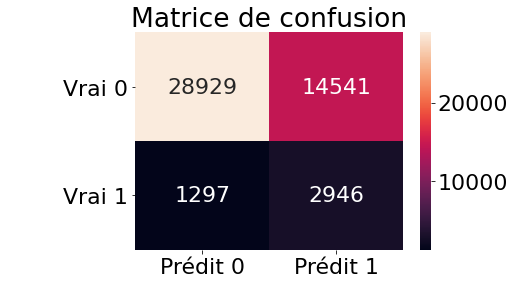

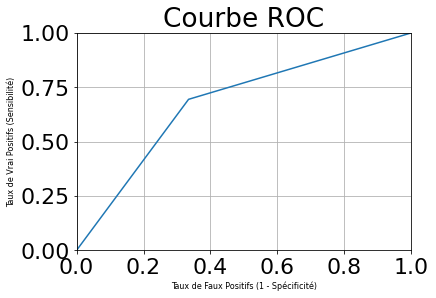

In [ ]:
modelisation(model1, param_grid1, cv, 
                  X_train, y_train, X_test, y_test, 
                  'RegLogistique_test', 'RegLogistique_entrainement')

### Random Forest

#### Optimisation bayésienne

In [ ]:
# Space for rf
space_rf ={'randomforestclassifier__n_estimators': hp.choice("x_n_estimators", range(50, 800, 10)),
        'randomforestclassifier__max_features': hp.choice("x_max_features", range(2, 28)),
        'randomforestclassifier__max_depth': hp.choice("x_max_depth", range(2, 25)),
        'randomforestclassifier__min_samples_leaf': hp.choice("x_min_samples_leaf", range(2, 10)),
        'randomforestclassifier__min_samples_split': hp.choice("x_min_samples_split", range(2, 10)),
        'randomforestclassifier__bootstrap': hp.choice("x_bootstrap", [True, False]),
        }

In [ ]:
"""Create an objective function"""


def objective_rf(space):
    
    # Instantiate the pipeline with classifier
    clf = make_pipeline(RandomForestClassifier(n_estimators =int(space['randomforestclassifier__n_estimators']),
                                                max_features = int(space['randomforestclassifier__max_features']),
                                                max_depth = int(space['randomforestclassifier__max_depth']),
                                                min_samples_leaf = int(space['randomforestclassifier__min_samples_leaf']),
                                                min_samples_split = int(space['randomforestclassifier__min_samples_split']),
                                                bootstrap = int(space['randomforestclassifier__bootstrap']),
                                                )
                         )
    # Fit the classifier
    clf.fit(X_train, y_train)

    # Predict on Cross Validation data
    pred = clf.predict(X_test)

    # Calculate our Metric - accuracy
    auc_score = roc_auc_score(y_test, pred)

    # Return needs to be in this below format. 
    # We use negative of accuracy since we want to maximize it.
    return {'loss': -auc_score, 'status': STATUS_OK }

In [ ]:
trials = Trials()
best = fmin(fn=objective_rf,
            space=space_rf,
            algo=tpe.suggest,
            max_evals=10,
            trials=trials)
print(best)

100%|██████████| 10/10 [1:21:19<00:00, 487.99s/it, best loss: -0.5151656518014407]
{'x_bootstrap': 1, 'x_max_depth': 21, 'x_max_features': 21, 'x_min_samples_leaf': 0, 'x_min_samples_split': 6, 'x_n_estimators': 47}


In [ ]:
best

{'x_bootstrap': 1,
 'x_max_depth': 21,
 'x_max_features': 21,
 'x_min_samples_leaf': 0,
 'x_min_samples_split': 6,
 'x_n_estimators': 47}

In [ ]:
best_param_rf = {'bootstrap': True, 
                 'max_depth': 21, 
                 'max_features': 21, 
                 'min_samples_leaf': 1,  
                 'min_samples_split': 6, 
                 'n_estimators': 47}

In [ ]:
# Training

# Timer train on
start_time_train = timeit.default_timer()
# Train the model 
#xg = xgb.train(parameters, dtrain, 50) 
rfcl = RandomForestClassifier(**best_param_rf)

rfcl.fit(X_train, y_train)
# Training time
elapsed_train = timeit.default_timer() - start_time_train
print(elapsed_train)

96.32661286500024


Temps Entrainement 96.33s
Temps Test 0.56s
*******************************************************
Statistiques du Test Set
Accuracy score: 0.9110095781024039
AUC score: 0.5099613561269075
F1 score: 0.04239963915200722
Matthews correlation coefficient: 0.08980815197599827
******************************************************
Statistiques du Train Set
Accuracy score: 0.9453660427975604
AUC score: 0.6854493726347949
F1 score: 0.5410853395537168
Matthews correlation coefficient: 0.591525374524094
******************************************************
  Variable Stat  Random Forest Test  Random Forest Entrainement
0      accuracy            0.911010                    0.945366
1           AUC            0.509961                    0.685449
2            F1            0.042400                    0.541085
3           MCC            0.089808                    0.591525
4  Temps (en s)            0.563180                   96.326613
<class 'pandas.core.frame.DataFrame'>
***********************

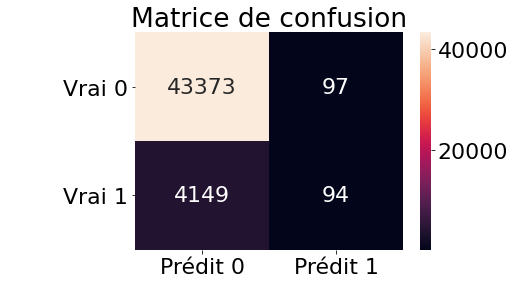

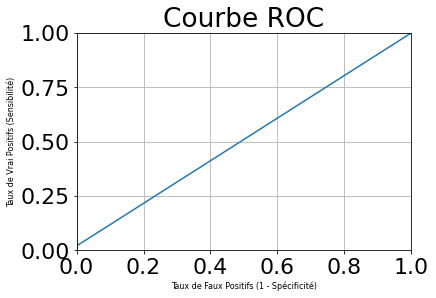

******************************************************
Détermination du seuil optimal
Le threshold optimal est : 0.099
Le score auc optimal est : 0.6594831167815829
******************************************************
Prédictions avec le seuil optimisé
Temps Entrainement 96.33s
Temps Test 0.85s
*******************************************************
Statistiques du Test Set
Accuracy score: 0.6850963049902542
AUC score: 0.6594831167815829
F1 score: 0.26192464508522867
Matthews correlation coefficient: 0.1919719149362709
******************************************************
Statistiques du Train Set
Accuracy score: 0.8552962504977679
AUC score: 0.9200580339157418
F1 score: 0.5451071469750127
Matthews correlation coefficient: 0.5610741778332595
******************************************************
  Variable Stat  Random Forest Test  Random Forest Entrainement
0      accuracy            0.685096                    0.855296
1           AUC            0.659483                    0.92005

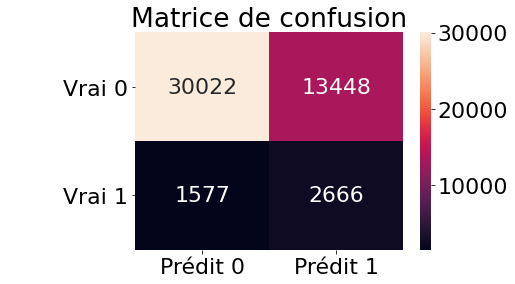

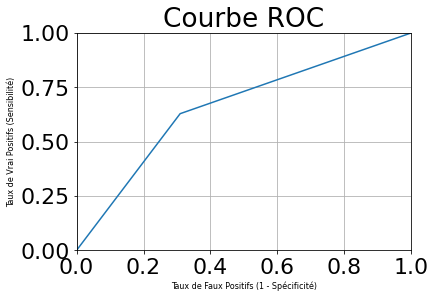

In [ ]:
# Predict on training data
y_train_pred = rfcl.predict(X_train)    

# Timer test on
start_time_test = timeit.default_timer()

# Prediction on test set
y_test_pred = rfcl.predict(X_test)

# Timer test off
elapsed_test = timeit.default_timer() - start_time_test

# Print times
print('Temps Entrainement {:.2f}s'.format(elapsed_train))
print('Temps Test {:.2f}s'.format(elapsed_test))
print('*******************************************************')


# Metrics test set 
print('Statistiques du Test Set')
accuracy = accuracy_score(y_test, y_test_pred)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_test, y_test_pred)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_test, y_test_pred) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_test, y_test_pred)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_test = [accuracy, ROC, F1, MCC, elapsed_test]
stat_test = pd.Series(var_stat_test)

print('******************************************************')

# Metrics train set
print('Statistiques du Train Set')
accuracy = accuracy_score(y_train, y_train_pred)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_train, y_train_pred)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_train, y_train_pred) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_train, y_train_pred)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_train = [accuracy, ROC, F1, MCC, elapsed_train]
stat_train = pd.Series(var_stat_train)

print('******************************************************')

# Print a table with the results
var_stat = ['accuracy', 'AUC', 'F1', 'MCC', 'Temps (en s)']
stat = pd.Series(var_stat)

df_stat = pd.DataFrame(stat, columns = ['Variable Stat'])
df_stat_test = pd.DataFrame(stat_test, columns = ['Random Forest Test'])
df_stat_train = pd.DataFrame(stat_train, columns = ['Random Forest Entrainement'])

df_model = pd.concat([df_stat, df_stat_test, df_stat_train], axis=1)
print(df_model)
print(type(df_model))

print('******************************************************')

# Visualisations 

## Confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Define tp, fp, tn and fn
tp = cm[1,1]
fp = cm[0,1]
tn = cm[0,0]
fn = cm[1,0]

print('Vrais Positifs = ', tp)
print('Vrais Négatifs = ', tn)
print('Faux Positifs = ', fp)
print('Faux Négatifs = ', fn)

print('******************************************************')

# Specificity
specificity = tn / float(tn + fp)
print('Spécificité = ',specificity)

# False Positive Rate
if fp == 0:
    FP_rate = 0
else:
    FP_rate = fp / float(tn + fp)
print('Taux de Faux Positifs = ',FP_rate)

print('******************************************************')

# Print matrix
sns.heatmap(cm, xticklabels=['Prédit 0', 'Prédit 1'],
            yticklabels=['        Vrai 0', '        Vrai 1'],
            annot=True, fmt='d')
plt.title('Matrice de confusion')
plt.show()


## ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.title('Courbe ROC')
plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', size=8)
plt.ylabel('Taux de Vrai Positifs (Sensibilité)', size=8)
plt.grid(True)
plt.show()


#####
# OPTIMISATION OF THE THRESHOLD
#####

print('******************************************************')
print('Détermination du seuil optimal')

#y_test_model = grid.predict_proba(X_test)
y_pred_proba = rfcl.predict_proba(X_test)[:, 1]

# Define thresholds
thresholds = np.arange(0, 1, 0.001)

# Evaluate each threshold
scores = [roc_auc_score(y_test, to_labels(y_pred_proba, t)) for t in thresholds]

# Get best threshold
ix = np.argmax(scores)
best_threshold = thresholds[ix]
best_auc_score = scores[ix]
print('Le threshold optimal est :', best_threshold)
print('Le score auc optimal est :', best_auc_score)


#####
# AFTER OPTIMISATION OF THE THRESHOLD
#####

print('******************************************************')

# Prediction with the new optimal threshold
print('Prédictions avec le seuil optimisé')
    
# Predict on training data
y_train_pred_opt = (rfcl.predict_proba(X_train)[:,1] >= best_threshold).astype(bool)

# Timer test on
start_time_test_opt = timeit.default_timer()

# Prediction on test set
y_test_pred_opt = (rfcl.predict_proba(X_test)[:,1] >= best_threshold).astype(bool)

# Timer test off
elapsed_test_opt = timeit.default_timer() - start_time_test_opt

# Print times
print('Temps Entrainement {:.2f}s'.format(elapsed_train))
print('Temps Test {:.2f}s'.format(elapsed_test_opt))
print('*******************************************************')


# Metrics test set 
print('Statistiques du Test Set')
accuracy = accuracy_score(y_test, y_test_pred_opt)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_test, y_test_pred_opt)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_test, y_test_pred_opt) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_test, y_test_pred_opt)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_test = [accuracy, ROC, F1, MCC, elapsed_test_opt]
stat_test = pd.Series(var_stat_test)

print('******************************************************')

# Metrics train set
print('Statistiques du Train Set')
accuracy = accuracy_score(y_train, y_train_pred_opt)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_train, y_train_pred_opt)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_train, y_train_pred_opt) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_train, y_train_pred_opt)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_train = [accuracy, ROC, F1, MCC, elapsed_train]
stat_train = pd.Series(var_stat_train)

print('******************************************************')

# Print a table with the results
var_stat = ['accuracy', 'AUC', 'F1', 'MCC', 'Temps (en s)']
stat = pd.Series(var_stat)

df_stat = pd.DataFrame(stat, columns = ['Variable Stat'])
df_stat_test = pd.DataFrame(stat_test, columns = ['Random Forest Test'])
df_stat_train = pd.DataFrame(stat_train, columns = ['Random Forest Entrainement'])

df_model = pd.concat([df_stat, df_stat_test, df_stat_train], axis=1)
print(df_model)
print(type(df_model))

print('******************************************************')

# Visualisations 

## Confusion matrix
cm_opt = confusion_matrix(y_test, y_test_pred_opt)

# Define tp, fp, tn and fn
tp = cm_opt[1,1]
fp = cm_opt[0,1]
tn = cm_opt[0,0]
fn = cm_opt[1,0]

print('Vrais Positifs = ', tp)
print('Vrais Négatifs = ', tn)
print('Faux Positifs = ', fp)
print('Faux Négatifs = ', fn)

print('******************************************************')

# Specificity
specificity = tn / float(tn + fp)
print('Spécificité = ',specificity)

# False Positive Rate
if fp == 0:
    FP_rate = 0
else:
    FP_rate = fp / float(tn + fp)
print('Taux de Faux Positifs = ',FP_rate)

print('******************************************************')

# Print matrix
sns.heatmap(cm_opt, xticklabels=['Prédit 0', 'Prédit 1'],
            yticklabels=['        Vrai 0', '        Vrai 1'],
            annot=True, fmt='d')
plt.title('Matrice de confusion')
plt.show()


## ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_opt)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.title('Courbe ROC')
plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', size=8)
plt.ylabel('Taux de Vrai Positifs (Sensibilité)', size=8)
plt.grid(True)
plt.show()

### XGBoost

#### Optimisation bayésienne

In [ ]:
# Define the ranges for testing the optimal hyperparameters
space ={'xgbclassifier__max_depth': hp.choice("x_max_depth", range(2, 50)), 
        'xgbclassifier__subsample': hp.uniform ('x_subsample', 0.5, 1),
        'xgbclassifier__gamma' : hp.uniform ('x_gamma', 0.1, 1.0),
        'xgbclassifier__colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.1 ,1),
        'xgbclassifier__reg_alpha' : hp.uniform('x_reg_alpha', 5, 7),
        'xgbclassifier__n_estimators' :hp.choice('x_n_estimators', range(50, 800, 10)),#sur des milliers 750/1000 au minim
        'xgbclassifier__learning_rate' :hp.uniform('x_learning_rate', 0.01 , 0.5),
        'xgbclassifier__reg_lambda' : hp.uniform ('x_reg_lambda', 0.1, 1.0),
        'xgbclassifier__num_parallel_tree': hp.choice('x_num_parallel_tree', range(1, 20)),
        }

In [ ]:
"""Create an objective funtion to calculate the optimal hyperparameters, 
using a Bayesian optimisation algorithm."""


def objective(space):
    
    # Instantiate the pipeline with classifier
    clf = xgb.XGBClassifier(n_estimators =int(space['xgbclassifier__n_estimators']),
                             n_fold = 3,
                             num_parallel_tree = int(space['xgbclassifier__num_parallel_tree']),
                             colsample_bytree=space['xgbclassifier__colsample_bytree'],
                             learning_rate = space['xgbclassifier__learning_rate'],
                             max_depth = int(space['xgbclassifier__max_depth']),
                             subsample = space['xgbclassifier__subsample'],
                             gamma = space['xgbclassifier__gamma'],
                             reg_alpha = space['xgbclassifier__reg_alpha'],
                             reg_lambda = space['xgbclassifier__reg_lambda'],
                             objective = 'binary:logistic',
                            )


    eval_set  = [(X_train, y_train), (X_test, y_test)]

    # Fit the classifier
    clf.fit(X_train, y_train,
            eval_set=eval_set, 
            eval_metric='auc',
            early_stopping_rounds=10,
            verbose=False)

    # Predict on data
    pred = clf.predict(X_test)

    # Calculate our Metric - accuracy
    roc_score = roc_auc_score(y_test, pred)

    # Return needs to be in this below format. 
    # We use negative of accuracy since we want to maximize it.
    return {'loss': -roc_score, 'status': STATUS_OK }

In [ ]:
# Calculate the optimal hyperparameters
trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10,
            trials=trials)
print(best)

100%|██████████| 10/10 [1:43:43<00:00, 622.35s/it, best loss: -0.5126228745422506]
{'x_colsample_bytree': 0.645564270148272, 'x_gamma': 0.7839591425925987, 'x_learning_rate': 0.4276269776237618, 'x_max_depth': 5, 'x_n_estimators': 61, 'x_num_parallel_tree': 16, 'x_reg_alpha': 6.005027081267887, 'x_reg_lambda': 0.7531147349979233, 'x_subsample': 0.5962632696659544}


In [ ]:
best

{'x_colsample_bytree': 0.645564270148272,
 'x_gamma': 0.7839591425925987,
 'x_learning_rate': 0.4276269776237618,
 'x_max_depth': 5,
 'x_n_estimators': 61,
 'x_num_parallel_tree': 16,
 'x_reg_alpha': 6.005027081267887,
 'x_reg_lambda': 0.7531147349979233,
 'x_subsample': 0.5962632696659544}

In [ ]:
best_param_xgb = {'colsample_bytree': 0.645564270148272,
               'gamma': 0.7839591425925987,   
               'learning_rate': 0.4276269776237618,
               'max_depth': 5, 
               'n_estimators': 61, 
               'num_parallel_tree': 16,
               'reg_alpha': 6.005027081267887,  
               'reg_lambda': 0.7531147349979233, 
               'subsample': 0.5962632696659544,
               'objective':'binary:logistic',
               'eval_metric':'auc',}

In [ ]:
# Training

# Timer train on
start_time_train = timeit.default_timer()
# Train the model 
xgbcl = xgb.XGBClassifier(**best_param_xgb)

xgbcl.fit(X_train, y_train,
          eval_set=[(X_train, y_train)], 
          eval_metric='auc')
# Training time
elapsed_train = timeit.default_timer() - start_time_train
print(elapsed_train)

[0]	validation_0-auc:0.730802
[1]	validation_0-auc:0.733318
[2]	validation_0-auc:0.737522
[3]	validation_0-auc:0.738879
[4]	validation_0-auc:0.74215
[5]	validation_0-auc:0.74448
[6]	validation_0-auc:0.747924
[7]	validation_0-auc:0.75082
[8]	validation_0-auc:0.753246
[9]	validation_0-auc:0.755667
[10]	validation_0-auc:0.757544
[11]	validation_0-auc:0.759296
[12]	validation_0-auc:0.761297
[13]	validation_0-auc:0.762492
[14]	validation_0-auc:0.764088
[15]	validation_0-auc:0.765549
[16]	validation_0-auc:0.766731
[17]	validation_0-auc:0.767949
[18]	validation_0-auc:0.768862
[19]	validation_0-auc:0.769788
[20]	validation_0-auc:0.770403
[21]	validation_0-auc:0.771403
[22]	validation_0-auc:0.772487
[23]	validation_0-auc:0.77322
[24]	validation_0-auc:0.774115
[25]	validation_0-auc:0.77489
[26]	validation_0-auc:0.775654
[27]	validation_0-auc:0.776386
[28]	validation_0-auc:0.77717
[29]	validation_0-auc:0.77792
[30]	validation_0-auc:0.778714
[31]	validation_0-auc:0.77939
[32]	validation_0-auc:0.78

Temps Entrainement 256.34s
Temps Test 2.85s
*******************************************************
Statistiques du Test Set
Accuracy score: 0.9117640894515122
AUC score: 0.5130339089197157
F1 score: 0.05350719424460432
Matthews correlation coefficient: 0.11344247918325484
******************************************************
Statistiques du Train Set
Accuracy score: 0.9147087795778929
AUC score: 0.5156432638076707
F1 score: 0.062435203317590136
Matthews correlation coefficient: 0.13730715485119163
******************************************************
  Variable Stat  XGBoost Test  XGBoost Entrainement
0      accuracy      0.911764              0.914709
1           AUC      0.513034              0.515643
2            F1      0.053507              0.062435
3           MCC      0.113442              0.137307
4  Temps (en s)      2.852057            256.340018
<class 'pandas.core.frame.DataFrame'>
******************************************************
Vrais Positifs =  119
Vrais Négatif

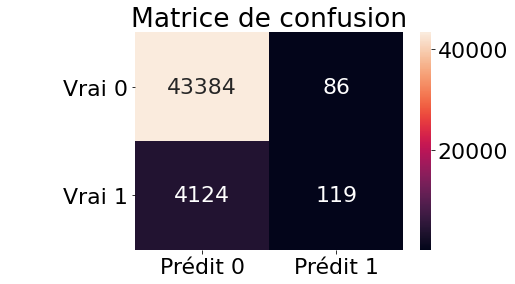

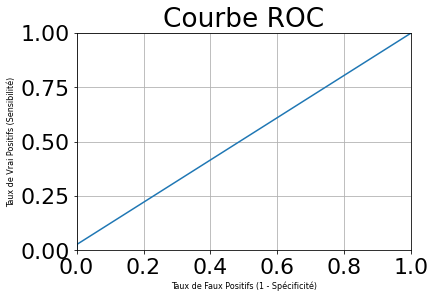

******************************************************
Détermination du seuil optimal
Le threshold optimal est : 0.092
L'auc score optimal est : 0.6922206135969983
******************************************************
Prédictions avec le seuil optimisé
Temps Entrainement 256.34s
Temps Test 2.85s
*******************************************************
Statistiques du Test Set
Accuracy score: 0.7129713076100853
AUC score: 0.6922206135969983
F1 score: 0.2924308964091966
Matthews correlation coefficient: 0.2352257476294144
******************************************************
Statistiques du Train Set
Accuracy score: 0.7212185358288098
AUC score: 0.7193414893860381
F1 score: 0.30877958791280175
Matthews correlation coefficient: 0.265600022736506
******************************************************
  Variable Stat  XGBoost Test  XGBoost Entrainement
0      accuracy      0.712971              0.721219
1           AUC      0.692221              0.719341
2            F1      0.292431      

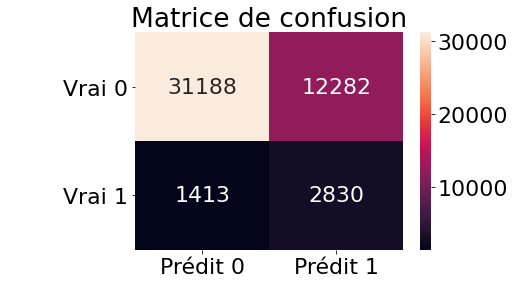

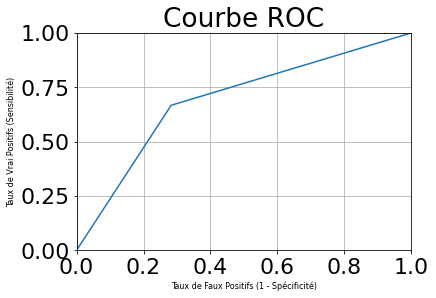

In [ ]:
# Predict on training data
y_train_pred = xgbcl.predict(X_train)    

# Timer test on
start_time_test = timeit.default_timer()

# Prediction on test set
y_test_pred = xgbcl.predict(X_test)

# Timer test off
elapsed_test = timeit.default_timer() - start_time_test

# Print times
print('Temps Entrainement {:.2f}s'.format(elapsed_train))
print('Temps Test {:.2f}s'.format(elapsed_test))
print('*******************************************************')


# Metrics test set 
print('Statistiques du Test Set')
accuracy = accuracy_score(y_test, y_test_pred)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_test, y_test_pred)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_test, y_test_pred) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_test, y_test_pred)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_test = [accuracy, ROC, F1, MCC, elapsed_test] #1 places dispo
#var_stat_test = [MedAE, MeanAE, MSE, RMSE, R2, elapsed_test] #2 places dispo
stat_test = pd.Series(var_stat_test)

print('******************************************************')

# Metrics train set
print('Statistiques du Train Set')
accuracy = accuracy_score(y_train, y_train_pred)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_train, y_train_pred)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_train, y_train_pred) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_train, y_train_pred)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_train = [accuracy, ROC, F1, MCC, elapsed_train]
#var_stat_train = [MedAE, MeanAE, MSE, RMSE, R2, elapsed_train]
stat_train = pd.Series(var_stat_train)

print('******************************************************')

# Print a table with the results
var_stat = ['accuracy', 'AUC', 'F1', 'MCC', 'Temps (en s)']
stat = pd.Series(var_stat)

df_stat = pd.DataFrame(stat, columns = ['Variable Stat'])
df_stat_test = pd.DataFrame(stat_test, columns = ['XGBoost Test'])
df_stat_train = pd.DataFrame(stat_train, columns = ['XGBoost Entrainement'])

df_model = pd.concat([df_stat, df_stat_test, df_stat_train], axis=1)
print(df_model)
print(type(df_model))

print('******************************************************')

# Visualisations 

## Confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Define tp, fp, tn and fn
tp = cm[1,1]
fp = cm[0,1]
tn = cm[0,0]
fn = cm[1,0]

print('Vrais Positifs = ', tp)
print('Vrais Négatifs = ', tn)
print('Faux Positifs = ', fp)
print('Faux Négatifs = ', fn)

print('******************************************************')

# Specificity
specificity = tn / float(tn + fp)
print('Spécificité = ', specificity)

# False Positive Rate
if fp == 0:
    FP_rate = 0
else:
    FP_rate = fp / float(tn + fp)
print('Taux de Faux Positifs = ', FP_rate)

print('******************************************************')

# Print matrix
sns.heatmap(cm, xticklabels=['Prédit 0', 'Prédit 1'],
            yticklabels=['        Vrai 0', '        Vrai 1'],
            annot=True, fmt='d')
plt.title('Matrice de confusion')
plt.show()


## ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.title('Courbe ROC')
plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', size=8)
plt.ylabel('Taux de Vrai Positifs (Sensibilité)', size=8)
plt.grid(True)
plt.show()


#####
# OPTIMISATION OF THE THRESHOLD
#####

print('******************************************************')
print('Détermination du seuil optimal')

#y_test_model = grid.predict_proba(X_test)
y_pred_proba = xgbcl.predict_proba(X_test)[:, 1]

# Define thresholds
thresholds = np.arange(0, 1, 0.001)

# Evaluate each threshold
scores = [roc_auc_score(y_test, to_labels(y_pred_proba, t)) for t in thresholds]

# Get best threshold
ix = np.argmax(scores)
best_threshold = thresholds[ix]
best_roc_score = scores[ix]
print('Le threshold optimal est :', best_threshold)
print('L\'auc score optimal est :', best_roc_score)


#####
# AFTER OPTIMISATION OF THE THRESHOLD
#####


print('******************************************************')

# Prediction with the new optimal threshold
print('Prédictions avec le seuil optimisé')
    
# Predict on training data
y_train_pred_opt = (xgbcl.predict_proba(X_train)[:,1] >= best_threshold).astype(bool)

# Timer test on
start_time_test_opt = timeit.default_timer()

# Prediction on test set
y_test_pred_opt = (xgbcl.predict_proba(X_test)[:,1] >= best_threshold).astype(bool)

# Timer test off
elapsed_test_opt = timeit.default_timer() - start_time_test_opt

# Print times
print('Temps Entrainement {:.2f}s'.format(elapsed_train))
print('Temps Test {:.2f}s'.format(elapsed_test_opt))
print('*******************************************************')


# Metrics test set 
print('Statistiques du Test Set')
accuracy = accuracy_score(y_test, y_test_pred_opt)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_test, y_test_pred_opt)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_test, y_test_pred_opt) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_test, y_test_pred_opt)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_test = [accuracy, ROC, F1, MCC, elapsed_test_opt]
stat_test = pd.Series(var_stat_test)

print('******************************************************')

# Metrics train set
print('Statistiques du Train Set')
accuracy = accuracy_score(y_train, y_train_pred_opt)
print('Accuracy score: {}'.format(accuracy))
ROC = roc_auc_score(y_train, y_train_pred_opt)
print('AUC score: {}'.format(ROC))
F1 = f1_score(y_train, y_train_pred_opt) #average='binary' by default
print('F1 score: {}'.format(F1))
MCC = matthews_corrcoef(y_train, y_train_pred_opt)
print('Matthews correlation coefficient: {}'.format(MCC))

####

var_stat_train = [accuracy, ROC, F1, MCC, elapsed_train]
stat_train = pd.Series(var_stat_train)

print('******************************************************')

# Print a table with the results
var_stat = ['accuracy', 'AUC', 'F1', 'MCC', 'Temps (en s)']
stat = pd.Series(var_stat)

df_stat = pd.DataFrame(stat, columns = ['Variable Stat'])
df_stat_test = pd.DataFrame(stat_test, columns = ['XGBoost Test'])
df_stat_train = pd.DataFrame(stat_train, columns = ['XGBoost Entrainement'])

df_model = pd.concat([df_stat, df_stat_test, df_stat_train], axis=1)
print(df_model)
print(type(df_model))

print('******************************************************')

# Visualisations 

## Confusion matrix
cm_opt = confusion_matrix(y_test, y_test_pred_opt)

# Define tp, fp, tn and fn
tp = cm_opt[1,1]
fp = cm_opt[0,1]
tn = cm_opt[0,0]
fn = cm_opt[1,0]

print('Vrais Positifs = ', tp)
print('Vrais Négatifs = ', tn)
print('Faux Positifs = ', fp)
print('Faux Négatifs = ', fn)

print('******************************************************')

# Specificity
specificity = tn / float(tn + fp)
print('Spécificité = ', specificity)

# False Positive Rate
if fp == 0:
    FP_rate = 0
else:
    FP_rate = fp / float(tn + fp)
print('Taux de Faux Positifs = ',FP_rate)

print('******************************************************')

# Print matrix
sns.heatmap(cm_opt, xticklabels=['Prédit 0', 'Prédit 1'],
            yticklabels=['        Vrai 0', '        Vrai 1'],
            annot=True, fmt='d')
plt.title('Matrice de confusion')
plt.show()


## ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_opt)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.title('Courbe ROC')
plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', size=8)
plt.ylabel('Taux de Vrai Positifs (Sensibilité)', size=8)
plt.grid(True)
plt.show()

### Sauver le modèle sélectionné

In [ ]:
# Save the model to a pkl file
with open('xgbcl.pkl', 'wb') as pickle_file:
    pickle.dump(xgbcl, pickle_file)

In [ ]:
files.download('xgbcl.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 7/xgbcl.pkl', 'rb') as pickle_file:
    xgbcl = pickle.load(pickle_file)

In [ ]:
# Save the model to a dat file
pickle.dump(xgbcl, open('xgbcl.dat', 'wb'))

In [ ]:
files.download('xgbcl.dat')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Reading
xgbcl = pickle.load(open('xgbcl.dat', 'rb'))

### Sauver les résultats sur app_train

In [ ]:
"""Create a dataframe with the features and the target obtained after the modelisation"""


def provide_matrix(df_features, array_target):
    global matrix_total
    matrix_total = df_features.copy()

    # Convert to dataframe
    df_target = pd.DataFrame(array_target)
    # Convert booleans
    boolean_encoding(df_target)
    # Create a list with target
    list_target = df_target[0].to_list()
    # Add a column with the target to matrix_test_total
    matrix_total['TARGET'] = list_target

    return matrix_total

In [ ]:
# Apply the optimised model


best_threshold = 0.092

#####
# AFTER OPTIMISATION OF THE THRESHOLD
#####


print('******************************************************')

# Prediction with the new optimal threshold
print('Prédictions avec le seuil optimisé')

# Timer test on
start_time_opt = timeit.default_timer()

# Prediction on test set
y_pred_opt = (xgbcl.predict_proba(matrix_features_VF.values)[:,1] >= best_threshold).astype(bool)

# Timer test off
elapsed_opt = timeit.default_timer() - start_time_opt

# Print times
#print('Temps Entrainement {:.2f}s'.format(elapsed_train))
print('Temps Test {:.2f}s'.format(elapsed_opt))
print('*******************************************************')

******************************************************
Prédictions avec le seuil optimisé
Temps Test 9.36s
*******************************************************


In [ ]:
matrix_features_VF

,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,CODE_GENDER = F,CODE_GENDER = M,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = State servant,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Drivers,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE = Self-employed,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_3,FLAG_DOCUMENT_16
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1,0,0,1,1,0,406597.5,24700.5,351000.0,1,0,1,0,0,1,-9461,-637,-2120,1,0,0,2,0,0,0.083037,0.262949,0.139376,1,0
100003,1,0,1,0,1,0,1293502.5,35698.5,1129500.0,0,1,0,1,1,0,-16765,-1188,-291,0,1,0,1,0,0,0.311267,0.622246,0.520898,1,0
100004,0,1,0,1,0,1,135000.0,6750.0,135000.0,1,0,1,0,0,1,-19046,-225,-2531,1,0,0,2,0,0,0.479396,0.555912,0.729567,0,0
100006,1,0,1,0,1,0,312682.5,29686.5,297000.0,1,0,1,0,0,0,-19005,-3039,-2437,1,0,0,2,0,0,0.479396,0.650442,0.520898,1,0
100007,1,0,0,1,1,0,513000.0,21865.5,513000.0,1,0,1,0,0,1,-19932,-3038,-3458,0,1,0,2,0,0,0.479396,0.322738,0.520898,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456248,1,0,1,0,1,0,331920.0,16096.5,225000.0,1,0,1,0,0,0,-16705,-7258,-259,0,0,0,2,0,1,0.479396,0.530725,0.520898,1,0
456251,1,0,0,1,1,0,254700.0,27558.0,225000.0,1,0,1,0,0,0,-9327,-236,-1982,0,0,0,1,0,0,0.145570,0.681632,0.520898,0,0
456253,1,0,1,0,1,0,677664.0,29979.0,585000.0,1,0,0,1,0,0,-14966,-7921,-5150,0,0,0,3,0,0,0.744026,0.535722,0.218859,1,0


In [ ]:
y_pred_opt

array([ True, False, False, ..., False, False,  True])

In [ ]:
# Obtain a dataframe with the features and the predicted target
matrix_total_app_train = provide_matrix(matrix_features_VF, y_pred_opt)

In [ ]:
matrix_total_app_train.head()

,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,CODE_GENDER = F,CODE_GENDER = M,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = State servant,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Drivers,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE = Self-employed,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_3,FLAG_DOCUMENT_16,TARGET
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1,0,0,1,1,0,406597.5,24700.5,351000.0,1,0,1,0,0,1,-9461,-637,-2120,1,0,0,2,0,0,0.083037,0.262949,0.139376,1,0,1
100003,1,0,1,0,1,0,1293502.5,35698.5,1129500.0,0,1,0,1,1,0,-16765,-1188,-291,0,1,0,1,0,0,0.311267,0.622246,0.520898,1,0,0
100004,0,1,0,1,0,1,135000.0,6750.0,135000.0,1,0,1,0,0,1,-19046,-225,-2531,1,0,0,2,0,0,0.479396,0.555912,0.729567,0,0,0
100006,1,0,1,0,1,0,312682.5,29686.5,297000.0,1,0,1,0,0,0,-19005,-3039,-2437,1,0,0,2,0,0,0.479396,0.650442,0.520898,1,0,0
100007,1,0,0,1,1,0,513000.0,21865.5,513000.0,1,0,1,0,0,1,-19932,-3038,-3458,0,1,0,2,0,0,0.479396,0.322738,0.520898,0,0,1


In [ ]:
# Insert a column in the first position with the index : 'SK_ID_CURR'
matrix_total_app_train.insert(0,'IDD_CURR','')
matrix_total_app_train['IDD_CURR'] = matrix_total_app_train.index

In [ ]:
matrix_total_app_train

,IDD_CURR,NAME_CONTRACT_TYPE = Cash loans,NAME_CONTRACT_TYPE = Revolving loans,CODE_GENDER = F,CODE_GENDER = M,FLAG_OWN_CAR = N,FLAG_OWN_CAR = Y,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE = Working,NAME_INCOME_TYPE = State servant,NAME_EDUCATION_TYPE = Secondary / secondary special,NAME_EDUCATION_TYPE = Higher education,NAME_FAMILY_STATUS = Married,NAME_FAMILY_STATUS = Single / not married,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,OCCUPATION_TYPE = Laborers,OCCUPATION_TYPE = Core staff,OCCUPATION_TYPE = Drivers,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE = Self-employed,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_3,FLAG_DOCUMENT_16,TARGET
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,100002,1,0,0,1,1,0,406597.5,24700.5,351000.0,1,0,1,0,0,1,-9461,-637,-2120,1,0,0,2,0,0,0.083037,0.262949,0.139376,1,0,1
100003,100003,1,0,1,0,1,0,1293502.5,35698.5,1129500.0,0,1,0,1,1,0,-16765,-1188,-291,0,1,0,1,0,0,0.311267,0.622246,0.520898,1,0,0
100004,100004,0,1,0,1,0,1,135000.0,6750.0,135000.0,1,0,1,0,0,1,-19046,-225,-2531,1,0,0,2,0,0,0.479396,0.555912,0.729567,0,0,0
100006,100006,1,0,1,0,1,0,312682.5,29686.5,297000.0,1,0,1,0,0,0,-19005,-3039,-2437,1,0,0,2,0,0,0.479396,0.650442,0.520898,1,0,0
100007,100007,1,0,0,1,1,0,513000.0,21865.5,513000.0,1,0,1,0,0,1,-19932,-3038,-3458,0,1,0,2,0,0,0.479396,0.322738,0.520898,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456248,456248,1,0,1,0,1,0,331920.0,16096.5,225000.0,1,0,1,0,0,0,-16705,-7258,-259,0,0,0,2,0,1,0.479396,0.530725,0.520898,1,0,0
456251,456251,1,0,0,1,1,0,254700.0,27558.0,225000.0,1,0,1,0,0,0,-9327,-236,-1982,0,0,0,1,0,0,0.145570,0.681632,0.520898,0,0,0
456253,456253,1,0,1,0,1,0,677664.0,29979.0,585000.0,1,0,0,1,0,0,-14966,-7921,-5150,0,0,0,3,0,0,0.744026,0.535722,0.218859,1,0,0


In [ ]:
# Save the total results : pkl
with open('matrix_total_app_train.pkl', 'wb') as pickle_file:
    pickle.dump(matrix_total_app_train, pickle_file)

In [ ]:
files.download('matrix_total_app_train.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the total results : dat
pickle.dump(xgbcl, open('matrix_total_app_train.dat', 'wb'))

In [ ]:
files.download('matrix_total_app_train.dat')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Utiliser le modèle sur app_test

In [ ]:
# Select the important features
matrix_features_apptest_VF = X_test_set[list_selected_features]

In [ ]:
matrix_features_apptest_VF.shape

(37342, 29)

In [ ]:
# Apply the optimised model

#####
# AFTER OPTIMISATION OF THE THRESHOLD
#####


print('******************************************************')

# Prediction with the new optimal threshold
print('Prédictions avec le seuil optimisé')

# Timer test on
start_time_test_opt = timeit.default_timer()

# Prediction on test set
y_test_set_pred_opt = (xgbcl.predict_proba(matrix_features_apptest_VF.values)[:,1] >= best_threshold).astype(bool)

# Timer test off
elapsed_test_opt = timeit.default_timer() - start_time_test_opt

# Print times
#print('Temps Entrainement {:.2f}s'.format(elapsed_train))
print('Temps Test {:.2f}s'.format(elapsed_test_opt))
print('*******************************************************')

******************************************************
Prédictions avec le seuil optimisé
Temps Test 2.26s
*******************************************************


In [ ]:
y_test_set_pred_opt

array([False,  True, False, ..., False, False,  True])

In [ ]:
matrix_total_app_test = provide_matrix(matrix_features_apptest_VF, y_test_set_pred_opt)

In [ ]:
matrix_total_app_test.head()

In [ ]:
# Save the total results : pkl
with open('matrix_total_app_test.pkl', 'wb') as pickle_file:
    pickle.dump(matrix_total_app_test, pickle_file)

In [ ]:
files.download('matrix_total_app_test.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the total results : dat
pickle.dump(xgbcl, open('matrix_total_app_test.dat', 'wb')) # xgbcl.pickle.dat

In [ ]:
files.download('matrix_total_app_test.dat')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Sauver les données pour l'application streamlit dans un seul fichier

In [ ]:
# Create a dictionnary
data_credit_risk = {}

In [ ]:
# Insert a column in the first position with the index : 'SK_ID_CURR'
matrix_features_VF.insert(0,'IDD_CURR','')
matrix_features_VF['IDD_CURR'] = matrix_features_VF.index

In [ ]:
matrix_features_VF.dtypes

IDD_CURR                                                 int64
NAME_CONTRACT_TYPE = Cash loans                          int32
NAME_CONTRACT_TYPE = Revolving loans                     int32
CODE_GENDER = F                                          int32
CODE_GENDER = M                                          int32
FLAG_OWN_CAR = N                                         int32
FLAG_OWN_CAR = Y                                         int32
AMT_CREDIT                                             float32
AMT_ANNUITY                                            float32
AMT_GOODS_PRICE                                        float32
NAME_INCOME_TYPE = Working                               int32
NAME_INCOME_TYPE = State servant                         int32
NAME_EDUCATION_TYPE = Secondary / secondary special      int32
NAME_EDUCATION_TYPE = Higher education                   int32
NAME_FAMILY_STATUS = Married                             int32
NAME_FAMILY_STATUS = Single / not married              

In [ ]:
convert_numerical_data(matrix_features_VF)

In [ ]:
# Create a list with the names of the features
feature_names = matrix_features_VF.columns.to_list() #matrix_total_app_train.columns[:-1].to_list()

In [ ]:
matrix_features_VF.columns.to_list()

['IDD_CURR',
 'NAME_CONTRACT_TYPE = Cash loans',
 'NAME_CONTRACT_TYPE = Revolving loans',
 'CODE_GENDER = F',
 'CODE_GENDER = M',
 'FLAG_OWN_CAR = N',
 'FLAG_OWN_CAR = Y',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_INCOME_TYPE = Working',
 'NAME_INCOME_TYPE = State servant',
 'NAME_EDUCATION_TYPE = Secondary / secondary special',
 'NAME_EDUCATION_TYPE = Higher education',
 'NAME_FAMILY_STATUS = Married',
 'NAME_FAMILY_STATUS = Single / not married',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'OCCUPATION_TYPE = Laborers',
 'OCCUPATION_TYPE = Core staff',
 'OCCUPATION_TYPE = Drivers',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_CITY_NOT_LIVE_CITY',
 'ORGANIZATION_TYPE = Self-employed',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_16']

In [ ]:
feature_names

['IDD_CURR',
 'NAME_CONTRACT_TYPE = Cash loans',
 'NAME_CONTRACT_TYPE = Revolving loans',
 'CODE_GENDER = F',
 'CODE_GENDER = M',
 'FLAG_OWN_CAR = N',
 'FLAG_OWN_CAR = Y',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_INCOME_TYPE = Working',
 'NAME_INCOME_TYPE = State servant',
 'NAME_EDUCATION_TYPE = Secondary / secondary special',
 'NAME_EDUCATION_TYPE = Higher education',
 'NAME_FAMILY_STATUS = Married',
 'NAME_FAMILY_STATUS = Single / not married',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'OCCUPATION_TYPE = Laborers',
 'OCCUPATION_TYPE = Core staff',
 'OCCUPATION_TYPE = Drivers',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_CITY_NOT_LIVE_CITY',
 'ORGANIZATION_TYPE = Self-employed',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_16']

In [ ]:
# Create a list with the target values
target = y_train_set.values #matrix_total_app_train['TARGET'].values

In [ ]:
target

array([1., 0., 0., ..., 0., 1., 0.], dtype=float32)

In [ ]:
target.shape

(238565,)

In [ ]:
np.unique(target)

array([0., 1.], dtype=float32)

In [ ]:
# Create an array with the features values
data = matrix_features_VF.values #matrix_total_app_train.drop(['TARGET'], axis=1).values

In [ ]:
data

array([[1.00002000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        1.39375776e-01, 1.00000000e+00, 0.00000000e+00],
       [1.00003000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        5.20897627e-01, 1.00000000e+00, 0.00000000e+00],
       [1.00004000e+05, 0.00000000e+00, 1.00000000e+00, ...,
        7.29566693e-01, 0.00000000e+00, 0.00000000e+00],
       ...,
       [4.56253000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        2.18859076e-01, 1.00000000e+00, 0.00000000e+00],
       [4.56254000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        6.61023557e-01, 1.00000000e+00, 0.00000000e+00],
       [4.56255000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        1.13922395e-01, 1.00000000e+00, 0.00000000e+00]])

In [ ]:
data.shape

(238565, 30)

In [ ]:
# Fill the dictionnary with the data
data_credit_risk['feature_names'] = feature_names
data_credit_risk['data'] = data
data_credit_risk['target'] = target

In [ ]:
data_credit_risk

{'data': array([[1.00002000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         1.39375776e-01, 1.00000000e+00, 0.00000000e+00],
        [1.00003000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         5.20897627e-01, 1.00000000e+00, 0.00000000e+00],
        [1.00004000e+05, 0.00000000e+00, 1.00000000e+00, ...,
         7.29566693e-01, 0.00000000e+00, 0.00000000e+00],
        ...,
        [4.56253000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         2.18859076e-01, 1.00000000e+00, 0.00000000e+00],
        [4.56254000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         6.61023557e-01, 1.00000000e+00, 0.00000000e+00],
        [4.56255000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         1.13922395e-01, 1.00000000e+00, 0.00000000e+00]]),
 'feature_names': ['IDD_CURR',
  'NAME_CONTRACT_TYPE = Cash loans',
  'NAME_CONTRACT_TYPE = Revolving loans',
  'CODE_GENDER = F',
  'CODE_GENDER = M',
  'FLAG_OWN_CAR = N',
  'FLAG_OWN_CAR = Y',
  'AMT_CREDIT',
  'AMT_ANNUITY',
  'AMT_GOODS_PRICE',
  'NAME

#### Version avec 20% des données pour une app plus légère

In [ ]:
### VERSION WITH 20% of the data 
238565*0.2

47713.0

In [ ]:
# Create an array with the features values
data = matrix_features_VF[:47712].values #matrix_total_app_train.drop(['TARGET'], axis=1).values

In [ ]:
data

array([[1.00002000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        1.39375776e-01, 1.00000000e+00, 0.00000000e+00],
       [1.00003000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        5.20897627e-01, 1.00000000e+00, 0.00000000e+00],
       [1.00004000e+05, 0.00000000e+00, 1.00000000e+00, ...,
        7.29566693e-01, 0.00000000e+00, 0.00000000e+00],
       ...,
       [1.71155000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        4.08358842e-01, 1.00000000e+00, 0.00000000e+00],
       [1.71157000e+05, 0.00000000e+00, 1.00000000e+00, ...,
        6.56158388e-01, 0.00000000e+00, 0.00000000e+00],
       [1.71159000e+05, 1.00000000e+00, 0.00000000e+00, ...,
        5.97192407e-01, 1.00000000e+00, 0.00000000e+00]])

In [ ]:
data.shape

(47712, 30)

In [ ]:
# Create a list with the target values
target = y_train_set[:47712].values #matrix_total_app_train['TARGET'].values

In [ ]:
target

array([1., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [ ]:
target.shape

(47712,)

In [ ]:
# Fill the dictionnary with the data
data_credit_risk['feature_names'] = feature_names
data_credit_risk['data'] = data
data_credit_risk['target'] = target

In [ ]:
data_credit_risk

{'data': array([[1.00002000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         1.39375776e-01, 1.00000000e+00, 0.00000000e+00],
        [1.00003000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         5.20897627e-01, 1.00000000e+00, 0.00000000e+00],
        [1.00004000e+05, 0.00000000e+00, 1.00000000e+00, ...,
         7.29566693e-01, 0.00000000e+00, 0.00000000e+00],
        ...,
        [1.71155000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         4.08358842e-01, 1.00000000e+00, 0.00000000e+00],
        [1.71157000e+05, 0.00000000e+00, 1.00000000e+00, ...,
         6.56158388e-01, 0.00000000e+00, 0.00000000e+00],
        [1.71159000e+05, 1.00000000e+00, 0.00000000e+00, ...,
         5.97192407e-01, 1.00000000e+00, 0.00000000e+00]]),
 'feature_names': ['IDD_CURR',
  'NAME_CONTRACT_TYPE = Cash loans',
  'NAME_CONTRACT_TYPE = Revolving loans',
  'CODE_GENDER = F',
  'CODE_GENDER = M',
  'FLAG_OWN_CAR = N',
  'FLAG_OWN_CAR = Y',
  'AMT_CREDIT',
  'AMT_ANNUITY',
  'AMT_GOODS_PRICE',
  'NAME

In [ ]:
data_credit_risk['data'].shape

(47712, 30)

In [ ]:
data_credit_risk['target'].shape

(47712,)

In [ ]:
# Save the total results : dat
pickle.dump(data_credit_risk, open('data_credit_risk.dat', 'wb'))

In [ ]:
files.download('data_credit_risk.dat')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Visualisation de l'influence de chaque feature sur la modélisation

In [ ]:
model = xgbcl

In [ ]:
shap_values = shap.TreeExplainer(model).shap_values(matrix_features_VF)

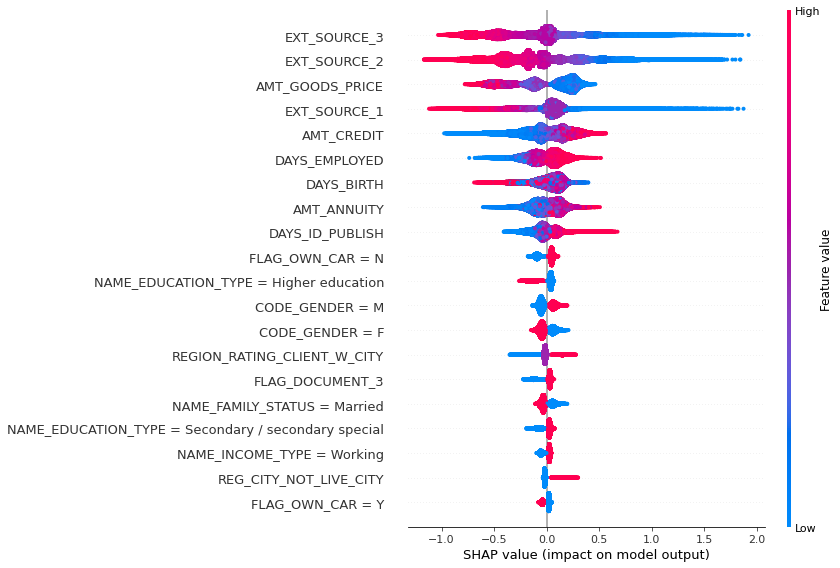

In [ ]:
shap.summary_plot(shap_values, matrix_features_VF)#, max_display=5)

In [ ]:
explainer = shap.TreeExplainer(model)

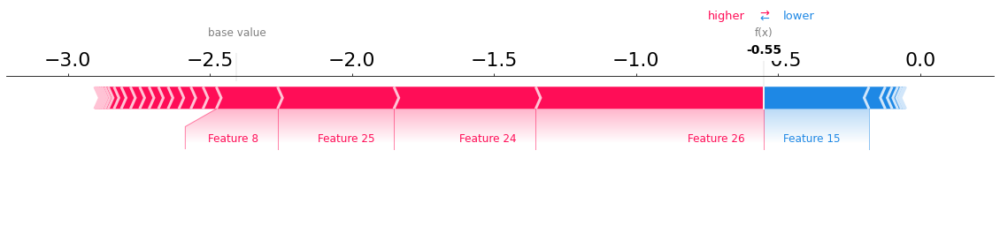

In [ ]:
# Visualize the first prediction's explanation with a force plot
shap.force_plot(explainer.expected_value, shap_values[0], matplotlib=True)

### Déploiement du modèle choisi sur un dashboard

Via streamlit

cf. projet7_dashboard.py